In [ ]:
###关于数据的保存：在bash运行——./save.sh "这里写修改说明"###

#===========================================================#
#####################总体思路梳理############################
#===========================================================#
##################模块一：得到目标论文序列####################
#STEP1————匹配
#将论文引用关系原始数据与撤稿论文序列进行匹配，目的是得到所有引用了撤稿论文的论文




# 前期准备模块

## 库的导入

In [2]:
###########################这一单元模块专门用于导入需要用到的库####################################

import pandas as pd #基础的数据处理
import os 
#Python 中的一条指令，用于导入内置的os模块。
#os模块提供了与操作系统交互的功能，允许你执行文件和目录的操作
#如路径管理、文件创建、删除等
import json #用于处理json数据的库
from tqdm import tqdm
import math # 用于检测 NaN
from collections import Counter #Python标准库collections里的的工具，用来统计元素出现的次数
from collections import defaultdict 
'''
collections 是 Python 自带的一个模块，
里面提供了许多有用的容器数据类型，比如 Counter、deque、namedtuple、defaultdict 等。
defaultdict 是一个字典的子类，它和普通字典类似，
但当你访问一个不存在的键时，它会自动帮你创建一个默认值，而不是抛出 KeyError。
'''
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import ast

## 查看大体量数据的前十行（CSV/EXCEL/JSON）

In [2]:
###########数据前10行展示##############
######用来判断太大数据的数据结构########
#CSV文件：
file_csv = '/Data4/yutao_wen/paper_concept.csv'
df_csv = pd.read_csv(file_csv, nrows=100)
df_csv

,paperid,concept,relevance
0,pub.1126489976,search,0.082
1,pub.1126489976,central Italy,0.074
2,pub.1126489976,Italy,0.073
3,pub.1126489976,identity,0.043
4,pub.1126489976,adornment,0.032
...,...,...,...
95,pub.1087055658,experience,0.083
96,pub.1087055658,Africa,0.071
97,pub.1087055658,challenges,0.070
98,pub.1087055658,North Africa,0.060


In [ ]:
#EXCEL文件：
file_excel = ''
df_excel = pd.read_excel(file_excel, nrows=10)
df_excel

In [ ]:
#JSON文件：
file_json = '/Data4/yutao_wen/2part_Dic/total/papers_year_dic.json'
# 如果是 JSON Lines 格式，每行一个 JSON 对象
chunks = pd.read_json(file_json, lines=True, chunksize=10)

# 取第一块（前 10 条记录）
df_json = next(chunks)

print(df_json)

## 查看CSV文件列名

In [10]:
#看df文件的列名
print(E_C_df_merged .columns)

Index(['id', 'Cid', 'Ecitation_Before', 'Ccitation_Before', 'Ecitation_After',
       'Ccitation_After', 'log_citation_distance', 'PYear', 'Journal_id',
       'NumA', 'NumR', 'reference_ids', 'RPYear', 'RYear', 'RJournal_id',
       'Num_Retra', 'Now', 'T_PtoR', 'T_RtoN', 'SelfRetra'],
      dtype='object')


## 检查数据的各维度完整度

In [ ]:
#直观看df文件的某一列
df_retrapapers['retraction_date']

In [ ]:
#看Nan的数量
df_retrapapers['retraction_date'].isna().sum()


In [ ]:
#看非Nan的数量
df_retrapapers['retraction_date'].isna().sum()


# 模块（一）：得到目标论文序列

## STEP1——匹配所有引用了撤稿论文的文献序列df_containretra

In [ ]:
#这个部分需要两个原始数据
#（1）原始数据1：论文与其参考文献的对应关系（/Data1/DATA/Dimensions2024/20240101/PaperReferences.csv）
'''
df数据结构：
    id	            reference_ids
0	pub.1038660625	pub.1043519304
1	pub.1038660625	pub.1012015875
2	pub.1038660625	pub.1031233780
3	pub.1038660625	pub.1027495706
'''
#（2）原始数据2：4w篇撤稿论文的原始数据（/Data4/yutao_wen/matched_output2.csv）
'''
df数据结构（列名与数据类型）
Index(['UT', 'Paper_doi', 'Note_doi', 'Title', 'Journal', 'ISOAbbr',
       'Publisher', 'Article', 'Review', 'Institute', 'City', 'Country',
       'First', 'RP', 'Micro_topics', 'Meso_topics', 'Macro_topics', '3Years',
       '5Years', 'Total', 'Fund', 'Year', 'RYear', 'publish_date',
       'retraction_date', 'Open Access', 'Tags', 'Type', 'note_URL', 'Authors',
       'Addresses', 'Affiliations', 'PaperID', 'id', 'title', 'doi', 'date',
       'journal.id'],
      dtype='object')
'''


### 原始数据1与2的导入——30MIN

In [ ]:
#先将两个原始文件都导入内核中
original_file1 = '/Data1/DATA/Dimensions2024/20240101/PaperReferences.csv'
df_references = pd.read_csv(original_file1)
#time约30min

In [3]:
original_file2 = '/Data4/yutao_wen/matched_output2.csv'
df_retrapapers = pd.read_csv(original_file2)

In [4]:
df_retrapapers

,UT,Paper_doi,Note_doi,Title,Journal,ISOAbbr,Publisher,Article,Review,Institute,...,note_URL,Authors,Addresses,Affiliations,PaperID,id,title,doi,date,journal.id
0,10.?1105/?tpc.?010357,10.?1105/?tpc.?010357,10.1105/tpc.17.00150,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,https://doi.org/10.1105/tpc.17.00150,NaN,NaN,NaN,4.369810e+14,NaN,NaN,NaN,NaN,NaN
1,10.1001/archdermatol.2012.418,10.1001/archdermatol.2012.418,10.1001/archdermatol.2012.1796,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,https://doi.org/10.1001/archdermatol.2012.1796,NaN,NaN,NaN,4.369810e+14,pub.1016356454,Early Depth Assessment of Local Burns by Dermo...,10.1001/archdermatol.2012.418,2012-05-03,jour.1000637
2,WOS:000231034800010,10.1001/archinte.165.15.1737,10.1001/jamainternmed.2016.3177,RETRACTED: The prevention of hip fracture with...,ARCHIVES OF INTERNAL MEDICINE,Arch. Intern. Med.,AMER MEDICAL ASSOC,1.0,0.0,Mitate Hosp;Hirosaki University;Keio University;,...,https://doi.org/10.1001/jamainternmed.2016.3177,"Sato, Y; Kanoko, T; Satoh, K; Iwamoto, J","Mitate Hosp, Dept Neurol, Tagawa 8260041, Japa...",Hirosaki University; Hirosaki University; Keio...,1.778090e+14,pub.1042615531,The Prevention of Hip Fracture With Risedronat...,10.1001/archinte.165.15.1737,2005-08-08,jour.1017256
3,WOS:000231034800011,10.1001/archinte.165.15.1743,10.1001/jamainternmed.2016.3771,RETRACTED: Risedronate sodium therapy for prev...,ARCHIVES OF INTERNAL MEDICINE,Arch. Intern. Med.,AMER MEDICAL ASSOC,1.0,0.0,Mitate Hosp;Keio University;Hirosaki University;,...,https://doi.org/10.1001/jamainternmed.2016.3771,"Sato, Y; Iwamoto, J; Kanoko, T; Satoh, K","Mitate Hosp, Dept Neurol, Tagawa 8260041, Japa...",Keio University; Hirosaki University; Hirosaki...,1.778230e+14,pub.1049123957,Risedronate Sodium Therapy for Prevention of H...,10.1001/archinte.165.15.1743,2005-08-08,jour.1017256
4,WOS:000232576800013,10.1001/archinte.165.18.2142,10.1001/archinte.166.16.1787-a,RETRACTED: The relation between pulse pressure...,ARCHIVES OF INTERNAL MEDICINE,Arch. Intern. Med.,AMER MEDICAL ASSOC,1.0,0.0,Harokopio University Athens;Netherlands Nation...,...,https://doi.org/10.1001/archinte.166.16.1787-a,"Panagiotakos, DB; Kromhout, D; Menotti, A; Chr...","Harokopio Univ, Dept Dieter & Nutr, Athens, Gr...",Harokopio University Athens; Netherlands Natio...,2.992980e+14,pub.1045416149,The Relation Between Pulse Pressure and Cardio...,10.1001/archinte.165.18.2142,2005-10-10,jour.1017256
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43430,org/10.1111/jgh.12229.,org/10.1111/jgh.12229.,10.1111/jgh.16551,"<b>retraction:</b>ramial batran, fouadal©\baya...",NaN,NaN,Wiley,NaN,NaN,NaN,...,https://doi.org/10.1111/jgh.16551,NaN,NaN,NaN,4.369810e+14,NaN,NaN,NaN,NaN,NaN
43431,org/10.2166/ws.2021.027,org/10.2166/ws.2021.027,10.2166/ws.2024.150,retraction: <i>water supply</i> 21 (4): 1514¨C...,NaN,NaN,IWA Publishing,NaN,NaN,NaN,...,http://dx.doi.org/10.2166/ws.2024.150,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
43432,org/10.2166/ws.2021.169,org/10.2166/ws.2021.169,10.2166/ws.2024.151,"retraction: <i>water supply</i> 21 (8), 4145¨C...",NaN,NaN,IWA Publishing,NaN,NaN,NaN,...,http://dx.doi.org/10.2166/ws.2024.151,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
43433,org/10.2166/ws.2021.186,org/10.2166/ws.2021.186,10.2166/ws.2024.149,retraction: <i>water supply</i> 21 (8): 4391¨C...,NaN,NaN,IWA Publishing,NaN,NaN,NaN,...,http://dx.doi.org/10.2166/ws.2024.149,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
# 获取 RYear 的起始年份和结束年份
start_year = df_retrapapers['RYear'].min()
end_year = df_retrapapers['RYear'].max()

print(f"年份范围是从 {start_year} 到 {end_year}")

年份范围是从 1940.0 到 2024.0


In [ ]:
df_retrapapers['retraction_date']


### 使用布尔索引匹配2个df——12MIN

In [ ]:
# 保证reference_ids和撤稿论文id列的数据类型一致（通常为字符串）
df_references['reference_ids'] = df_references['reference_ids'].astype(str)
df_retrapapers['id'] = df_retrapapers['id'].astype(str)

# 使用布尔索引保留reference_ids出现在撤稿论文id中的行
df_containretra = df_references[df_references['reference_ids'].isin(df_retrapapers['id'])].copy()
#time约12min

### 匹配产出文件df_containretra预览

In [ ]:
df_containretra

### 匹配文件保存备份

In [ ]:
output_path = '/Data4/yutao_wen/25.11.10/df_containretra.csv'
# 保存为 CSV 文件
df_containretra.to_csv(output_path, index=False)

### 导入df_containretra文件

In [51]:
df_containretra = pd.read_csv("/Data4/yutao_wen/25.11.10/df_containretra.csv")

In [52]:
df_containretra

,id,reference_ids
0,pub.1148484199,pub.1013663776
1,pub.1128687208,pub.1003140261
2,pub.1148009542,pub.1146057724
3,pub.1114696738,pub.1026667060
4,pub.1114902564,pub.1028915017
...,...,...
765834,pub.1134201694,pub.1113603600
765835,pub.1016972058,pub.1008362454
765836,pub.1085464507,pub.1039593849
765837,pub.1124870274,pub.1124369222


## STEP2——匹配撤稿论文/目标论文原始信息

In [ ]:
#撤稿论文主要是两个关键年份（发表/撤稿）以及期刊id较为重要————来源于matched_output2
#（1）RPYear：被引用的撤稿论文的发表年份
#（2）RYear：被引用的撤稿论文的撤稿年份
#（3）RJournal_id：被引用的撤稿论文的期刊ID
#目标论文主要是发表年份与期刊id较为重要————来源于Papers.csv
#（1）Year：目标论文的发表年份
#（2）Journal_id：目标论文的期刊ID

### 原始数据2导入

In [ ]:
original_file2 = '/Data4/yutao_wen/matched_output2.csv'
df_retrapapers = pd.read_csv(original_file2)

### 匹配撤稿论文RPYear、RYear、RJournal_id

In [ ]:
#从 df_retrapapers 中选择需要匹配的列，并改列名
df_retra_subset = df_retrapapers[['id', 'Year', 'RYear', 'journal.id']].copy()
df_retra_subset = df_retra_subset.rename(columns={
    'id': 'reference_ids',
    'Year': 'RPYear',
    'RYear': 'RYear',
    'journal.id': 'RJournal_id'
})

# 第三步：将信息 merge 到 df_containretra 中
df_containretra = df_containretra.merge(df_retra_subset, on='reference_ids', how='left')

### 原始数据3导入——10min

In [ ]:
# 此时需要第三个原始文件：Papers.csv文件
# 其蕴含了数据库所有论文的各种信息
original_file3 = '/Data1/DATA/Dimensions2024/20240101/Papers.csv'
'''
数据结构：
Index(['id', 'title', 'doi', 'date', 'date_inserted', 'date_normal',
       'date_online', 'date_print', 'type', 'journal.id', 'journal.title',
       'times_cited', 'num_funds', 'num_authors', 'num_references', 'field_l0',
       'field_l1', 'resulting_publication_doi'],
      dtype='object')

'''
#获取目标论文的Year与Journal.id
df_papers = pd.read_csv(original_file3,usecols=['id', 'date_normal','journal.id'])
#time约10min

### 详细年月日date提取年份Year

In [ ]:
# 提取年份（ date 格式如 '2019-03-15'）
df_papers['Year'] = pd.to_datetime(df_papers['date_normal'], errors='coerce').dt.year

### 匹配目标论文Year、Journal.id——4MIN

In [ ]:
# 只选择需要的列，重命名 'journal.id' 为 'Journal_id'
df_papers_subset = df_papers[['id', 'Year','journal.id']].rename(columns={'journal.id': 'Journal_id'})

# 合并，添加 Journal_id 列
df_containretra = df_containretra.merge(df_papers_subset, on='id', how='left')

In [ ]:
# 调整列顺序
df_containretra = df_containretra[['id', 'reference_ids', 'Year', 'Journal_id', 'RPYear', 'RYear', 'RJournal_id']]


In [ ]:
df_containretra

### 检查每列NaN情况

In [ ]:
# 计算每列的 NaN 数量
nan_counts = df_containretra.isna().sum()

# 输出每列 NaN 的数量
print("每列 NaN 的数量：")
print(nan_counts)


### 保留不含NaN的行

In [ ]:
# 计算删除前 DataFrame 的总行数
total_rows_before = len(df_containretra)

# 删除含有 NaN 的行
df_containretra_cleaned = df_containretra.dropna(axis=0, how='any')

# 计算删除后每列的 NaN 数量
nan_counts_after = df_containretra_cleaned.isna().sum()

# 计算删除后的 DataFrame 的总行数
total_rows_after = len(df_containretra_cleaned)

# 计算删除的行数
rows_deleted = total_rows_before - total_rows_after

# 输出结果
print("\n删除了多少行（含有 NaN 的行）：", rows_deleted)
print("\n删除后每列 NaN 的数量：")
print(nan_counts_after)
print("\n删除前的行数：", total_rows_before)
print("删除后的行数：", total_rows_after)

In [ ]:
df_containretra_cleaned

### 匹配文件保存与备份

In [ ]:
output_path = '/Data4/yutao_wen/25.11.10/df_containretra2.csv'
# 保存为 CSV 文件
df_containretra_cleaned.to_csv(output_path, index=False)
'''
数据结构为：
	            id	reference_ids	Year	 Journal_id	    RPYear	RYear	RJournal_id
2	pub.1148009542	pub.1146057724	2022.0	jour.1115238	2022.0	2023.0	jour.1043255
3	pub.1114696738	pub.1026667060	2015.0	jour.1050605	2015.0	2016.0	jour.1084523
4	pub.1114902564	pub.1028915017	2012.0	jour.1038288	1992.0	2016.0	jour.1077219
7	pub.1107325835	pub.1003143127	2018.0	jour.1030157	2006.0	2018.0	jour.1030157
8	pub.1011260253	pub.1032808220	2008.0	jour.1013016	2005.0	2007.0	jour.1013016
...	...	...	...	...	...	...	...
'''

In [8]:
df_containretra2 = pd.read_csv("/Data4/yutao_wen/25.11.10/df_containretra2.csv")

In [9]:
df_containretra2

,id,reference_ids,Year,Journal_id,RPYear,RYear,RJournal_id
0,pub.1148009542,pub.1146057724,2022.0,jour.1115238,2022.0,2023.0,jour.1043255
1,pub.1114696738,pub.1026667060,2015.0,jour.1050605,2015.0,2016.0,jour.1084523
2,pub.1114902564,pub.1028915017,2012.0,jour.1038288,1992.0,2016.0,jour.1077219
3,pub.1107325835,pub.1003143127,2018.0,jour.1030157,2006.0,2018.0,jour.1030157
4,pub.1011260253,pub.1032808220,2008.0,jour.1013016,2005.0,2007.0,jour.1013016
...,...,...,...,...,...,...,...
669640,pub.1130857724,pub.1117049318,2020.0,jour.1136301,2019.0,2023.0,jour.1138382
669641,pub.1134201694,pub.1113603600,2020.0,jour.1041030,2019.0,2023.0,jour.1036281
669642,pub.1016972058,pub.1008362454,2016.0,jour.1046517,2013.0,2018.0,jour.1327387
669643,pub.1085464507,pub.1039593849,2017.0,jour.1454776,2011.0,2018.0,jour.1082971


In [10]:
# 统计 id 列中不重复的数量
unique_id_count = df_containretra2['id'].nunique()

print(f"df_containretra2 中共有 {unique_id_count} 个独立 id。")

df_containretra2 中共有 565636 个独立 id。


## STEP3——筛选出合理目标论文

In [ ]:
#主要是对STEP2的数据进行无关对象清除
#因为我们关注的目标论文是：
# （1）参考文献仅仅有一篇被撤稿
"""(9.29讨论：参考文献撤稿两篇及以上部分选择保留)
参考文献撤稿两篇以及以上的论文也成为目标论文，
时间冲击的时间可以选取为第一篇论文撤稿的时候。 """
# （2）而且撤稿时间在2023年之前
# （3）引用论文的时候该被引论文尚未被撤稿
# （4）自己本身没被撤稿
#Exclude data ————— 主要有四部分被去掉
#(1) cited more than one retracted paper
#(2) retracted in 2023 or 2024
#(3) citing papers that were themselves retracted
#(4) The paper itself was retracted

### 导入STEP2终文件df_containretra2

In [ ]:
df_containretra2 = '/Data4/yutao_wen/25.11.10/df_containretra2.csv'
df_containretra2 = pd.read_csv(df_containretra2)

### ①删除参考文献在2023、2024被撤稿的

In [ ]:
#(2)retracted in 2023 or 2024
#去掉2023年、2024年被撤稿的参考文献部分
#因为需要研究撤稿后的趋势，这两年撤稿的文章后续时期的数据太少了，不便于分析
# 创建副本，避免修改原始数据
df_containretra_copy = df_containretra2.copy()
# 记录原始行数
original_count = len(df_containretra_copy)

# 去掉 RPYear 为 2023 或 2024 的行
df_containretra_copy = df_containretra_copy[~df_containretra_copy['RYear'].isin([2023.0, 2024.0])]

# 记录删减后行数
filtered_count = len(df_containretra_copy)

# 输出行数信息
print(f"原来有 {original_count} 行")
print(f"删减后有 {filtered_count} 行")
print(f"共删除了 {original_count - filtered_count} 行")

### ②删除引用参考文献时就已被撤稿的

In [ ]:
#(3)citing papers that were themselves retracted
#发现存在有的论文引用了已经被撤稿的论文，数学表现形式即———— RYear-Year < 0，需要删除
# 创建新列 RYear-Year
df_containretra_copy['RYear-Year'] = df_containretra_copy['RYear'] - df_containretra_copy['Year']

# 记录原始行数
original_count = len(df_containretra_copy)

# 删除 RYear-Year 小于 0 的行
df_containretra_copy = df_containretra_copy[df_containretra_copy['RYear-Year'] >= 0]

# 删除后行数
remaining_count = len(df_containretra_copy)

# 打印统计信息
print(f"原来有 {original_count} 行")
print(f"删除 RYear-Year < 0 的行数：{original_count - remaining_count}")
print(f"剩余 {remaining_count} 行")

### 统计“自己本身也被撤稿”的论文

In [ ]:
#(4)The paper itself was retracted
#还有本身自己就被撤稿的论文
#检查 df_containretra_copy的id列中的id是否有出现在那4w篇撤稿文章id（df_retrapapers）中
#如果出现了就需要删除这些行
#同时，为了知道参考文献撤稿了论文会对本论文是否撤稿造成多少影响
#统计了原先的id数量（即论文数量），以及删除的id数量（即参考文献被撤稿和论文本身都被撤稿的论文）
#原始行数
import matplotlib.pyplot as plt

# ① 保留副本
df_before = df_containretra_copy.copy()

# ② 原始唯一论文数量
original_id_count = df_before['id'].nunique()

# ③ 本身被撤稿的论文 id 集合
SelfRetra_papers = set(df_before['id']) & set(df_retrapapers['id'])
selfretra_count = len(SelfRetra_papers)

# ④ （不删除数据，仅统计）
df_containretra_copy['is_self_retracted'] = df_containretra_copy['id'].isin(SelfRetra_papers)

# ⑤ 汇报统计信息
print(f"原始论文数（唯一 id）: {original_id_count}")
print(f"本身被撤稿的论文数（唯一 id）: {selfretra_count}")
print(f"本身撤稿比率: {selfretra_count / original_id_count:.2%}")

# ⑥ 如果你想保留这个 id 序列方便后续分析，可导出或存储
SelfRetra_papers = list(SelfRetra_papers)


In [ ]:
## 保存SelfRetra_papers文件，后续会用到该序列
# ⑥ 保存 SelfRetra_papers 序列为 CSV 文件
output_path = "/Data4/yutao_wen/25.11.10/SelfRetra_papers.csv"
pd.DataFrame({'id': list(SelfRetra_papers)}).to_csv(output_path, index=False, encoding='utf-8-sig')


### 检查每列NaN情况

In [ ]:
df_containretra_copy

In [ ]:
# 计算每列的 NaN 数量
nan_counts = df_containretra_copy.isna().sum()

# 输出每列 NaN 的数量
print("每列 NaN 的数量：")
print(nan_counts)

In [ ]:
df_containretra3 = df_containretra_copy

### 保存清理后的df_containretra3

In [ ]:
output_path = '/Data4/yutao_wen/25.11.10/df_containretra3.csv'
# 保存为 CSV 文件
df_containretra3.to_csv(output_path, index=False)
'''
数据结构：
               id	reference_ids	Year	Journal_id	    RPYear	RYear	RJournal_id	RYear-Year
1	pub.1114696738	pub.1026667060	2015.0	jour.1050605	2015.0	2016.0	jour.1084523	1.0
2	pub.1114902564	pub.1028915017	2012.0	jour.1038288	1992.0	2016.0	jour.1077219	4.0
3	pub.1107325835	pub.1003143127	2018.0	jour.1030157	2006.0	2018.0	jour.1030157	0.0
10	pub.1134554602	pub.1106943956	2021.0	jour.1096497	2018.0	2021.0	jour.1115743	0.0
16	pub.1044393419	pub.1033427872	1998.0	jour.1082971	1997.0	1998.0	jour.1019114	0.0
...	...	...	...	...	...	...	...	... 
'''


### 导入df_containretra3

In [11]:
df_containretra3 = pd.read_csv("/Data4/yutao_wen/25.11.10/df_containretra3.csv")

In [12]:
# 统计 id 列中不重复的数量
unique_id_count = df_containretra3['id'].nunique()

print(f"df_containretra3 中共有 {unique_id_count} 个独立 id。")

df_containretra3 中共有 264812 个独立 id。


In [3]:
df_containretra3

,id,reference_ids,Year,Journal_id,RPYear,RYear,RJournal_id,RYear-Year,is_self_retracted
0,pub.1114696738,pub.1026667060,2015.0,jour.1050605,2015.0,2016.0,jour.1084523,1.0,False
1,pub.1114902564,pub.1028915017,2012.0,jour.1038288,1992.0,2016.0,jour.1077219,4.0,False
2,pub.1107325835,pub.1003143127,2018.0,jour.1030157,2006.0,2018.0,jour.1030157,0.0,False
3,pub.1134554602,pub.1106943956,2021.0,jour.1096497,2018.0,2021.0,jour.1115743,0.0,False
4,pub.1025382944,pub.1007864453,2011.0,jour.1297322,2009.0,2017.0,jour.1077138,6.0,False
...,...,...,...,...,...,...,...,...,...
312514,pub.1092297051,pub.1015000895,2018.0,jour.1031133,2016.0,2019.0,jour.1116728,1.0,False
312515,pub.1013229134,pub.1003326122,2011.0,jour.1047723,2009.0,2016.0,jour.1121878,5.0,False
312516,pub.1016972058,pub.1008362454,2016.0,jour.1046517,2013.0,2018.0,jour.1327387,2.0,False
312517,pub.1085464507,pub.1039593849,2017.0,jour.1454776,2011.0,2018.0,jour.1082971,1.0,False


### 判断新增的这部分目标论文体量（之前新增了参考文献大于1篇撤稿的论文）

In [4]:
# 找出每个 id 对应的不同 reference_ids 数量
id_ref_counts = df_containretra3.groupby('id')['reference_ids'].nunique()

# 仅保留 reference_ids 有多个不同值的 id
duplicate_ids = id_ref_counts[id_ref_counts > 1].index

# 筛选这些 id 的完整行
df_conflict = df_containretra3[df_containretra3['id'].isin(duplicate_ids)]

# 展示结果
print(df_conflict)


                    id   reference_ids    Year    Journal_id  RPYear   RYear  \
4       pub.1025382944  pub.1007864453  2011.0  jour.1297322  2009.0  2017.0   
5       pub.1025382944  pub.1004563397  2011.0  jour.1297322  2005.0  2017.0   
6       pub.1025382944  pub.1013314478  2011.0  jour.1297322  2008.0  2017.0   
7       pub.1025382944  pub.1025763447  2011.0  jour.1297322  2008.0  2016.0   
8       pub.1025382944  pub.1044865691  2011.0  jour.1297322  2009.0  2017.0   
...                ...             ...     ...           ...     ...     ...   
312484  pub.1134267091  pub.1108036657  2020.0  jour.1043504  2019.0  2021.0   
312493  pub.1004194015  pub.1062453840  2010.0  jour.1097556  2006.0  2016.0   
312494  pub.1004194015  pub.1038966504  2010.0  jour.1097556  2010.0  2018.0   
312496  pub.1043719480  pub.1001834054  2013.0  jour.1117828  2011.0  2018.0   
312497  pub.1043719480  pub.1010536182  2013.0  jour.1117828  2013.0  2018.0   

         RJournal_id  RYear-Year  is_se

#### （1）新增未来潜在目标论文的数量

In [5]:
# 找出每个 id 对应的不同 reference_ids 数量
id_ref_counts = df_containretra3.groupby('id')['reference_ids'].nunique()

# 仅保留 reference_ids 有多个不同值的 id
duplicate_ids = id_ref_counts[id_ref_counts > 1].index

# 统计这些 id 的数量（相同 id 只计一次）
num_conflict_ids = len(duplicate_ids)

print("reference_ids 不一致的 id 数量（即新的潜在实验组的数量）为：", num_conflict_ids)


reference_ids 不一致的 id 数量（即新的潜在实验组的数量）为： 30075


In [ ]:
#也就是说现在有大概30075篇目标论文的参考文献是被撤稿了两篇及以上的

#### （2）目标论文的撤稿数量分布

##### ①总体（撤稿1篇的+撤稿1篇以上的）

In [ ]:
#################所有目标论文撤稿数量的分布########################
# ------------------ 数据处理 ------------------
# 每个 id 对应的不同 reference_ids 数量
id_ref_counts = (
    df_containretra3.groupby('id')['reference_ids']
    .nunique()
    .reset_index(name='unique_ref_count')
)

# 样本总数
N = len(id_ref_counts)

# ------------------ 设置风格 ------------------
sns.set_style("white")
sns.set_context("paper", font_scale=1.2)

# 创建画布：分布图 + 累积分布图
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes = axes.flatten()

# ------------------ 左图：频率分布 ------------------
sns.histplot(
    id_ref_counts['unique_ref_count'],
    bins=range(1, id_ref_counts['unique_ref_count'].max() + 2),
    stat="percent",
    kde=False,
    color="#2c7bb6",
    edgecolor="black",
    ax=axes[0]
)

axes[0].set_title(f"Distribution of Unique Reference Counts per ID (N={N})",
                  fontsize=14, weight='bold')
axes[0].set_xlabel("Number of Unique reference_ids per ID", fontsize=12)
axes[0].set_ylabel("Percentage (%)", fontsize=12)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

# ------------------ 右图：累积分布 ------------------
sorted_counts = np.sort(id_ref_counts['unique_ref_count'])
cdf = np.arange(1, len(sorted_counts)+1) / len(sorted_counts) * 100

axes[1].step(sorted_counts, cdf, where='post', color="#2c7bb6", linewidth=2)
axes[1].set_title("Cumulative Distribution of Unique Reference Counts",
                  fontsize=14, weight='bold')
axes[1].set_xlabel("Number of Unique reference_ids per ID", fontsize=12)
axes[1].set_ylabel("Cumulative Percentage (%)", fontsize=12)
axes[1].set_xlim(sorted_counts.min()-0.5, sorted_counts.max()+0.5)
axes[1].set_ylim(0, 100)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].grid(axis='y', linestyle='--', alpha=0.6)

# ------------------ 整体布局 ------------------
plt.tight_layout()
plt.show()


👆这说明目前的目标论文里面，参考文献被撤稿一篇的仍然是占据主要的，有XX%

##### ②新增部分（撤稿1篇以上的）

In [ ]:
###################撤稿2篇及以上的论文数量分布############################
# ------------------ 数据处理 ------------------
# 每个 id 对应的不同 reference_ids 数量
id_ref_counts = (
    df_containretra3.groupby('id')['reference_ids']
    .nunique()
    .reset_index(name='unique_ref_count')
)

# 仅保留数量 >= 2
id_ref_counts_filtered = id_ref_counts[id_ref_counts['unique_ref_count'] >= 2]

# 样本总数（数量>=2的 id 数量）
N = len(id_ref_counts_filtered)

# ------------------ 设置风格 ------------------
sns.set_style("white")
sns.set_context("paper", font_scale=1.2)

# 创建画布：分布图 + 累积分布图
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes = axes.flatten()

# ------------------ 左图：频率分布 ------------------
sns.histplot(
    id_ref_counts_filtered['unique_ref_count'],
    bins=range(2, id_ref_counts_filtered['unique_ref_count'].max() + 2),
    stat="percent",
    kde=False,
    color="#2c7bb6",
    edgecolor="black",
    ax=axes[0]
)

axes[0].set_title(f"Distribution of Unique Reference Counts per ID (N={N}, count ≥ 2)",
                  fontsize=14, weight='bold')
axes[0].set_xlabel("Number of Unique reference_ids per ID", fontsize=12)
axes[0].set_ylabel("Percentage (%)", fontsize=12)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

# ------------------ 右图：累积分布 ------------------
sorted_counts = np.sort(id_ref_counts_filtered['unique_ref_count'])
cdf = np.arange(1, len(sorted_counts)+1) / len(sorted_counts) * 100

axes[1].step(sorted_counts, cdf, where='post', color="#2c7bb6", linewidth=2)
axes[1].set_title("Cumulative Distribution of Unique Reference Counts (count ≥ 2)",
                  fontsize=14, weight='bold')
axes[1].set_xlabel("Number of Unique rference_ids per ID", fontsize=12)
axes[1].set_ylabel("Cumulative Percentage (%)", fontsize=12)
axes[1].set_xlim(sorted_counts.min()-0.5, sorted_counts.max()+0.5)
axes[1].set_ylim(0, 100)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].grid(axis='y', linestyle='--', alpha=0.6)

# ------------------ 整体布局 ------------------
plt.tight_layout()
plt.show()


👆这说明在撤稿两篇及以上的目标论文里面，参考文献被撤稿2篇的仍然是占据主要的，有XX%

# 模块（二）：Match四维度相同的对照组

## STEP1——创建四维度字典

### 读取原始字典文件

In [ ]:
#Matching Variables ———— 构建四个维度的字典用于match
#(1)Year of publication 
#(2)Journal
#(3)Number of authors
#(4)Number of references

#这四个层面的字典数据有两个原始数据的字典
#字典一：papers_year_dic
#字典二：papers_journal_numA_numR_dic

#字典一位于路径“/Data4/yutao_wen/2part_Dic/total/papers_year_dic.json”
#字典二位于路径“/Data4/yutao_wen/2part_Dic/total/papers_journal_numA_numR_dic.json”


# 定义字典的文件路径
dic1_path = "/Data4/yutao_wen/2part_Dic/total/papers_year_dic.json"
dic2_path = "/Data4/yutao_wen/2part_Dic/total/papers_journal_numA_numR_dic.json"

In [ ]:
# 读取字典1字典2
with open(dic1_path, "r", encoding="utf-8") as f:
    papers_year_dic = json.load(f)
with open(dic2_path, "r", encoding="utf-8") as f:
    papers_journal_numA_numR_dic = json.load(f)

### 检查两字典NaN数量

In [ ]:
papers_year_dic

In [ ]:
# 统计 NaN 的数量
nan_count = sum(1 for year in papers_year_dic.values() if isinstance(year, float) and math.isnan(year))

print(f"papers_year_dic 中 NaN 的数量是: {nan_count}")

In [ ]:
papers_journal_numA_numR_dic

In [ ]:
# 初始化 NaN 计数
nan_counts = {
    'journal.id': 0,
    'num_authors': 0,
    'num_references': 0
}

# 遍历 papers_journal_numA_numR_dic 进行 NaN 检查
for paper_id, info in papers_journal_numA_numR_dic.items():
    # 检查 journal.id 是否为 NaN
    if isinstance(info['journal.id'], float) and math.isnan(info['journal.id']):
        nan_counts['journal.id'] += 1
    
    # 检查 num_authors 是否为 NaN
    if isinstance(info['num_authors'], float) and math.isnan(info['num_authors']):
        nan_counts['num_authors'] += 1
    
    # 检查 num_references 是否为 NaN
    if isinstance(info['num_references'], float) and math.isnan(info['num_references']):
        nan_counts['num_references'] += 1

# 输出每个维度的 NaN 数量
print(f"journal.id 中 NaN 的数量: {nan_counts['journal.id']}")
print(f"num_authors 中 NaN 的数量: {nan_counts['num_authors']}")
print(f"num_references 中 NaN 的数量: {nan_counts['num_references']}")

### 合并成四维度字典——9MIN

In [ ]:
# 整合数据
merged_dic = {}

for paper_id in papers_year_dic:  # 以 papers_year_dic 为基准
    year_value = papers_year_dic.get(paper_id, 0)  # 先获取 year，可能是 NaN
    if isinstance(year_value, float) and math.isnan(year_value):  # 检测 NaN
        year_value = 0  # 将 NaN 转换为 0

    merged_dic[paper_id] = {
        "year": int(year_value),  # 确保 year 是整数
        "journal": papers_journal_numA_numR_dic.get(paper_id, {}).get('journal.id', 'Unknown'),
        "NumA": papers_journal_numA_numR_dic.get(paper_id, {}).get('num_authors', 0),
        "NumR": papers_journal_numA_numR_dic.get(paper_id, {}).get('num_references', 0),
    }

In [ ]:
#命名为Contr_total_dic（作为匹配对照组的样本池）
Contr_total_dic = merged_dic

### 确认合并字典的NaN值与0值数量——4MIN

In [ ]:
# 需要统计的键
keys_to_check = ['year', 'journal', 'NumA', 'NumR']

# 初始化计数器
nan_counts = Counter({key: 0 for key in keys_to_check})
zero_counts = Counter({key: 0 for key in keys_to_check})
#Contr_total_dic 是要遍历的字典
# 统计 NaN 和 0 值
for entry in Contr_total_dic.values():
    for key in keys_to_check:
        if key in entry:
            value = entry[key]
            
            # 检查 NaN 值
            if value is None or (isinstance(value, float) and math.isnan(value)):
                nan_counts[key] += 1
            
            # 检查 0 值（排除 NaN）
            elif value == 0:
                zero_counts[key] += 1

# 输出统计结果
for key in keys_to_check:
    print(f"{key} 中 NaN 的数量: {nan_counts[key]}")
    print(f"{key} 中 0 的数量: {zero_counts[key]}")

### 排除数据残缺的部分（NaN与0）——4MIN

In [ ]:
# 过滤掉包含 NaN 或 0 值的条目
Contr_total_dic = {
    k: v for k, v in Contr_total_dic.items()
    if all(
        v.get(key) is not None and
        not (isinstance(v[key], float) and math.isnan(v[key])) and  # 不为 NaN
        v[key] != 0  # 不为 0
        for key in ['year', 'journal', 'NumA', 'NumR']  # 只检查这四个维度
    )
}

### 剩余数据量展示

In [ ]:
#最后剩余的完整的数据数量
len(Contr_total_dic)

### 改进字典格式优化运算——14MIN

In [ ]:
#现在我的字典形如：
"""
{"pub.1148484199": 
            {"year": 2020, 
             "journal": "jour.1047907",
             "NumA": 5, 
             "NumR": 50,},
 "pub.1148484455": 
            {"year": 2020, 
             "journal": "jour.1047907",
             "NumA": 5, 
             "NumR": 50,},...
 "pub.1148485584": 
            {"year": 2021, 
             "journal": "jour.1047955",
             "NumA": 3, 
             "NumR": 21,}
 "pub.1148485577": 
            {"year": 2021, 
             "journal": "jour.1047955",
             "NumA": 3, 
             "NumR": 21,}
                                        } """
#我希望将键值对进行互换，将year，journal，NumA，NumR相同的论文整合在一起，变成新的字典，
#即变成为：
'''
{{"year": 2020, "journal": "jour.1047907","NumA": 5, "NumR": 50,}:{pub.1148484199,pub.1148484455},
{"year": 2021, "journal": "jour.1047955","NumA": 3, "NumR": 21,}:{1148485584:1148485577}...}
'''

In [ ]:
# 创建 defaultdict 来存储分组数据（13min）
grouped_data = defaultdict(set)

for pub_id, attributes in Contr_total_dic.items():
    key = tuple(sorted(attributes.items()))  # 关键修改：使用元组作为 key
    grouped_data[key].add(pub_id)

In [ ]:
#数据展示
grouped_data

## STEP2——匹配

### 获取目标论文ID列

In [ ]:
#现在总体的字典已经整理出来了，需要获取目标论文的id序列
#目标论文序列来源于文件：/Data4/yutao_wen/25.11.10/df_containretra3.csv
# 读取 CSV 文件
file_path = '/Data4/yutao_wen/25.11.10/df_containretra3.csv'
df = pd.read_csv(file_path)
# 提取 'id' 列并转换为列表
id_sequence = df['id'].tolist()


In [ ]:
len(id_sequence)

### 4维度Exactly匹配对照组

In [1]:
# 假设 id_sequence 是一个包含实验组 ID 的列表
id_sequence_set = set(id_sequence)  # 将 id_sequence 转换为集合

# 存储匹配结果
matched_data = []

# 遍历 grouped_data
for attributes, control_ids in grouped_data.items():
    # 还原元组为字典
    attributes_dict = dict(attributes)

    # 查找实验组 ID 是否存在
    common_ids = id_sequence_set.intersection(control_ids)
    if common_ids:
        for exp_id in common_ids:
            for control_id in control_ids:
                if exp_id != control_id:  # 过滤掉相同 ID
                    matched_data.append([
                        exp_id, attributes_dict["year"], attributes_dict["journal"], attributes_dict["NumA"], attributes_dict["NumR"],
                        control_id, attributes_dict["year"], attributes_dict["journal"], attributes_dict["NumA"], attributes_dict["NumR"]
                    ])

NameError: name 'id_sequence' is not defined

### 转换为Dataframe格式

In [ ]:
# 转换为 DataFrame
df = pd.DataFrame(matched_data, columns=[
    "实验组ID", "year", "journal", "NumA", "NumR",
    "对照组ID", "year", "journal", "NumA", "NumR"
])

In [ ]:
df

In [ ]:
#名称统一化
# 重命名
df = df.rename(columns={
    '实验组ID': 'id',
    'year': 'PYear',
    'journal': 'Journal_id',
    '对照组ID': 'Cid'
})


In [ ]:

# 删除不需要的列
#df = df.drop(columns=['year.1', 'journal.1', 'NumA.1', 'NumR.1'])
# 只保留前 6 列（前面一组）
df= df.iloc[:, :6]

### 匹配文件保存

In [ ]:
# 指定保存路径
save_path = "/Data4/yutao_wen/25.11.10/df_match.csv"

# 保存为 CSV 文件（不包含索引）
df.to_csv(save_path, index=False, encoding="utf-8")

# 模块（三）：Match事前事后citation

## STEP1——完善ECR三合一df文件

### 读取模块二匹配文件

In [13]:
df = pd.read_csv("/Data4/yutao_wen/25.11.10/df_match.csv")

In [14]:
df

,id,PYear,Journal_id,NumA,NumR,Cid
0,pub.1114696738,2015,jour.1050605,1,7,pub.1114588196
1,pub.1002883431,2011,jour.1136657,1,2,pub.1049986797
2,pub.1002883431,2011,jour.1136657,1,2,pub.1002366025
3,pub.1002883431,2011,jour.1136657,1,2,pub.1026617007
4,pub.1002883431,2011,jour.1136657,1,2,pub.1033344863
...,...,...,...,...,...,...
1330401,pub.1100462265,2017,jour.1045973,6,23,pub.1084470543
1330402,pub.1028114604,2004,jour.1017523,3,38,pub.1032639142
1330403,pub.1041820780,2010,jour.1044317,3,13,pub.1041983066
1330404,pub.1041876328,2012,jour.1100063,4,27,pub.1045344777


In [15]:
# 统计 id 列中不重复的数量
unique_id_count = df['id'].nunique()

print(f"df 中共有 {unique_id_count} 个独立 id。")

df 中共有 115055 个独立 id。


In [16]:
# 统计 id 列中不重复的数量
unique_id_count = df['Cid'].nunique()

print(f"df 中共有 {unique_id_count} 个独立 Cid。")

df 中共有 945059 个独立 Cid。


### 匹配文件描述性统计检查

In [ ]:
# 设置 pandas 显示选项
pd.set_option('display.float_format', '{:.2f}'.format)
# 查看 describe()
df.describe()
#结果均显示正常

### 完善匹配对信息（添加撤稿论文信息）

In [ ]:
#需要一些撤稿论文的原始信息
#这些信息来自于模块二STEP3：/Data4/yutao_wen/25.9.17/df_containretra3.csv
df_containretra3 = pd.read_csv("/Data4/yutao_wen/25.11.10/df_containretra3.csv")

In [ ]:
#撤稿论文信息dataframe文件
df_containretra3

### ==========修改点================

### 多篇撤稿论文数据格式改进

In [ ]:
import pandas as pd
#2025.12.6改进给多撤稿论文的数据加入了顺序

# Step 1: 去掉 RYear-Year 列
if 'RYear-Year' in df_containretra3.columns:
    df_containretra3 = df_containretra3.drop(columns=['RYear-Year'])

# Step 2: 定义聚合函数——按 RYear 排序多个字段，并输出排序后的 tuple
def sort_refs(group):
    # 取 reference_ids & RYear & RJournal_id 三列
    refs = list(group['reference_ids'])
    ry = list(group['RYear'])
    rj = list(group['RJournal_id'])
    
    # 组合后排序
    combined = sorted(zip(refs, ry, rj), key=lambda x: x[1])  # 按 RYear 排序
    
    # 重新拆分
    sorted_refs  = tuple([c[0] for c in combined])
    sorted_ry    = tuple([c[1] for c in combined])
    sorted_rj    = tuple([c[2] for c in combined])
    
    # 返回字典
    return pd.Series({
        "reference_ids": sorted_refs,
        "RYear_sorted": sorted_ry,
        "RJournal_id": sorted_rj
    })

# Step 3: groupby & 聚合
df_merged = (
    df_containretra3
    .groupby('id')
    .apply(sort_refs)
    .reset_index()
)

# 增加基础列（first）
df_extra = (
    df_containretra3
    .drop_duplicates('id')[['id','Year','Journal_id','RPYear']]
)

df_merged = df_merged.merge(df_extra, on='id', how='left')

# Step 4: 计算最大最小（也可作为 RYear）
df_merged['RYear_min'] = df_merged['RYear_sorted'].apply(lambda x: min(x) if len(x)>0 else None)
df_merged['RYear_max'] = df_merged['RYear_sorted'].apply(lambda x: max(x) if len(x)>0 else None)

# Step 5: Num_Retra
df_merged['Num_Retra'] = df_merged['reference_ids'].apply(len)


In [ ]:
df_merged

In [ ]:
# 删除不需要的列
df_merged = df_merged.drop(columns=['RYear_sorted'], errors='ignore')
df_merged = df_merged.drop(columns=['RYear_max'], errors='ignore')

# 将 RYear_min 重命名为 RYear
df_merged = df_merged.rename(columns={'RYear_min': 'RYear'})

# 按指定顺序排列列
df_merged = df_merged[
    ['id', 'reference_ids', 'Year', 'Journal_id', 'RPYear', 'RYear', 'RJournal_id', 'Num_Retra']
]


In [ ]:
df_merged

In [ ]:
"""import pandas as pd

# 假设 DataFrame 名为 df_containretra3

# Step 1: 去掉 RYear-Year 列
if 'RYear-Year' in df_containretra3.columns:
    df_containretra3 = df_containretra3.drop(columns=['RYear-Year'])

# Step 2: 定义聚合函数
agg_dict = {
    'reference_ids': lambda x: tuple(x),               # 合并 reference_ids
    'Year': 'first',                                   # 保留相同 id 的 Year（应该相同）
    'Journal_id': 'first',                             # 保留 Journal_id
    'RPYear': 'first',                                 # 保留 RPYear
    'RYear': 'min',                                    # 保留较小的 RYear
    'RJournal_id': lambda x: tuple(x),                # 合并 RJournal_id
}

# Step 3: 按 id 聚合
df_merged = df_containretra3.groupby('id', as_index=False).agg(agg_dict)

# Step 4: 增加 Num_Retra 列
df_merged['Num_Retra'] = df_merged['reference_ids'].apply(len)"""


In [ ]:
#df_merged

In [ ]:
df_containretra3 = df_merged

In [ ]:
#实验组对照组配对信息dataframe文件
df

In [ ]:
#把 df_containretra3里的 reference_ids, RPYear, RYear, RJournal_id ，Num_Retra按照id合并到df里
# 选择需要合并的几列
cols_to_merge = ['id', 'reference_ids', 'RPYear', 'RYear', 'RJournal_id','Num_Retra']

# 执行合并
df_merged = df.merge(
    df_containretra3[cols_to_merge],
    on='id',
    how='left'   # 保留 df 的所有行
)


In [ ]:
#现在这个文件包含了
# （1）目标论文与控制组的一一对应关系
# （2）目标论文参考文献中被撤稿论文的：发表年份RPYear、撤稿年份RYear、来源期刊RJournal_id、撤稿数量Num_Retra
df_merged

### 界定Now、T_PtoR、T_RtoN


In [ ]:
# 添加新列
df_merged = df_merged.assign(
    Now=2023,#为研究的截至点
    T_PtoR=df_merged['RYear'] - df_merged['PYear'],
    #目标论文发表到参考文献撤稿时间区间T
    T_RtoN=2023 - df_merged['RYear']
    #参考文献撤稿到2023时间区间T
)


In [ ]:
#命名为df_merged_ECR
#Experimental Group---Control Group---Retratepapers
df_merged_ECR = df_merged

In [ ]:
df_merged_ECR

### 添加实验组控制组对应编号

In [ ]:
# 1. 生成实验组编号 E000001, E000002, ...
df_merged_ECR['orderE'] = 'E' + (df_merged_ECR['id'].astype('category').cat.codes + 1).astype(str).str.zfill(6)

# 2. 创建对照组编号 E000001_1, E000001_2, ...
df_merged_ECR['orderC'] = df_merged_ECR.groupby('id').cumcount() + 1
df_merged_ECR['orderC'] = df_merged_ECR['orderE'] + '_' + df_merged_ECR['orderC'].astype(str)


In [ ]:
#将orderE放在id前，orderC放在Cid前方便观察
# 指定新顺序
new_order = [
    'orderE', 'id', 'PYear', 'Journal_id', 'NumA', 'NumR',
    'orderC', 'Cid', 'reference_ids', 'RPYear', 'RYear',
    'RJournal_id', 'Num_Retra','Now', 'T_PtoR', 'T_RtoN'
]
# 重新排列列顺序
df_merged_ECR = df_merged_ECR[new_order]

# 按照 orderE 升序排序，并重置索引
df_merged_ECR = df_merged_ECR.sort_values(by='orderE').reset_index(drop=True)


In [ ]:
df_merged_ECR

### 保存备份文件df_merged_ECR


In [ ]:
output_path = '/Data4/yutao_wen/25.11.10/df_merged_ECR2.csv'
# 保存为 CSV 文件
df_merged_ECR.to_csv(output_path, index=False)

### 引入df_merged_ECR

In [5]:
df_merged_ECR = pd.read_csv("/Data4/yutao_wen/25.11.10/df_merged_ECR2.csv")

In [6]:
df_merged_ECR

,orderE,id,PYear,Journal_id,NumA,NumR,orderC,Cid,reference_ids,RPYear,RYear,RJournal_id,Num_Retra,Now,T_PtoR,T_RtoN
0,E000001,pub.1000000694,2006,jour.1029717,1,89,E000001_1,pub.1013015745,"('pub.1076569140',)",2003.0,2010.0,"('jour.1077134',)",1,2023,4.0,13.0
1,E000002,pub.1000002908,2008,jour.1092102,7,50,E000002_1,pub.1037416417,"('pub.1007764568',)",2002.0,2015.0,"('jour.1017574',)",1,2023,7.0,8.0
2,E000002,pub.1000002908,2008,jour.1092102,7,50,E000002_2,pub.1022133001,"('pub.1007764568',)",2002.0,2015.0,"('jour.1017574',)",1,2023,7.0,8.0
3,E000003,pub.1000005181,2013,jour.1077138,2,54,E000003_5,pub.1019297182,"('pub.1004718702',)",2007.0,2017.0,"('jour.1099159',)",1,2023,4.0,6.0
4,E000003,pub.1000005181,2013,jour.1077138,2,54,E000003_6,pub.1016147241,"('pub.1004718702',)",2007.0,2017.0,"('jour.1099159',)",1,2023,4.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1330401,E115052,pub.1164912181,1995,jour.1023000,2,3,E115052_1,pub.1070561906,"('pub.1033569250',)",1991.0,1996.0,"('jour.1312259',)",1,2023,1.0,27.0
1330402,E115053,pub.1164948030,2020,jour.1320609,11,37,E115053_1,pub.1129351535,"('pub.1126668311',)",2020.0,2020.0,"('jour.1297452',)",1,2023,0.0,3.0
1330403,E115054,pub.1166136474,2001,jour.1086802,4,42,E115054_2,pub.1032595242,"('pub.1070819411',)",1995.0,2020.0,"('jour.1017902',)",1,2023,19.0,3.0
1330404,E115054,pub.1166136474,2001,jour.1086802,4,42,E115054_1,pub.1047614739,"('pub.1070819411',)",1995.0,2020.0,"('jour.1017902',)",1,2023,19.0,3.0


## STEP2——事前YearlyCitation计算

### 拆分实验组对照组

In [ ]:
#选择实验组的列
df_exper = df_merged_ECR[["orderE","id", "PYear", "Journal_id", "NumA", "NumR","RYear","Now","T_PtoR","T_RtoN"]].copy()
df_contr = df_merged_ECR[["orderC","Cid", "PYear", "Journal_id", "NumA", "NumR","RYear","Now","T_PtoR","T_RtoN"]].copy()

In [ ]:
# 去除 df_exper 中的重复行减小后续运算量
df_exper = df_exper.drop_duplicates()

In [ ]:
df_exper

In [ ]:
df_contr

### 拆分为Tdiff形式(撤稿前)


In [ ]:
# 实验组E撤稿前的expanded_df
# 新建一个空列表，用来存放拆分后的数据行
expanded_rows_E = []

# 遍历原始 DataFrame 的每一行
for _, row in df_exper.iterrows():
    # 获取起始年份 PYear 和 终止年份 RYear（转换为 int）
    start_year = int(row['PYear'])
    end_year = int(row['RYear'])
    
    # 遍历区间，每年生成一行
    for y in range(start_year, end_year):
        # 生成 intervalB 列的值，如 [2006,2007]
        intervalB = f"[{y},{y + 1}]"
        # 计算 Tdiff 列的值（区间上界 - RYear）
        Tdiff = y - end_year
        
        # 创建新行，复制原有行数据，并插入 intervalB 和 Tdiff
        new_row = row.copy()
        new_row['intervalB'] = intervalB
        new_row['Tdiff'] = Tdiff
        
        # 将新行加入 expanded_rows 列表
        expanded_rows_E.append(new_row)

# 将拆分后的数据转换为新的 DataFrame
expanded_df_EB = pd.DataFrame(expanded_rows_E)

# 重置索引，保持整洁
expanded_df_EB.reset_index(drop=True, inplace=True)


In [ ]:
# 控制组c撤稿前的expanded_df
# 新建一个空列表，用来存放拆分后的数据行
expanded_rows_C = []

# 遍历原始 DataFrame 的每一行
for _, row in df_contr.iterrows():
    # 获取起始年份 PYear 和 终止年份 RYear（转换为 int）
    start_year = int(row['PYear'])
    end_year = int(row['RYear'])
    
    # 遍历区间，每年生成一行
    for y in range(start_year, end_year):
        # 生成 intervalB 列的值，如 [2006,2007]
        intervalB = f"[{y},{y + 1}]"
        # 计算 Tdiff 列的值（区间上界 - RYear）
        Tdiff = y - end_year
        
        # 创建新行，复制原有行数据，并插入 intervalB 和 Tdiff
        new_row = row.copy()
        new_row['intervalB'] = intervalB
        new_row['Tdiff'] = Tdiff
        
        # 将新行加入 expanded_rows 列表
        expanded_rows_C.append(new_row)

# 将拆分后的数据转换为新的 DataFrame
expanded_df_CB = pd.DataFrame(expanded_rows_C)

# 重置索引，保持整洁
expanded_df_CB.reset_index(drop=True, inplace=True)


### 读取全年份引用关系字典

In [ ]:
dic2_path = "/Data4/yutao_wen/ALLyear_paper_refs.json"
# 读取字典2
with open(dic2_path, "r", encoding="utf-8") as f:
    ALLyear_paper_refs = json.load(f)

### yearly字典序列创建

In [ ]:
# 实验组E：
# 创建一个空字典来存放键值对
interval_dict_E = {}

# 遍历实验组expanded_df_EB 的每一行，提取id、Tdiff 和 intervalB 列
for _, row in expanded_df_EB.iterrows():
    # 创建键：id + '_' + Tdiff
    key = f"{row['id']}_{row['Tdiff']}"
    # 将 intervalB 作为值存入字典
    interval_dict_E[key] = row['intervalB']


In [ ]:
# 控制组C：
# 创建一个空字典来存放键值对
interval_dict_C = {}

# 遍历控制组expanded_df_CB 的每一行，提取Cid、Tdiff 和 intervalB 列
for _, row in expanded_df_CB.iterrows():
    # 创建键：id + '_' + Tdiff
    key = f"{row['Cid']}_{row['Tdiff']}"
    # 将 intervalB 作为值存入字典
    interval_dict_C[key] = row['intervalB']

### 实验组撤稿前yearlycitation匹配+保存

In [ ]:
# 实验组E:
# 构造：纯ID -> [(完整键, (lower, upper)), ...]
paper_intervals = {}
for full_key, value in interval_dict_E.items():
    # full_key 形如 'pub.1000000694_-4'
    # 提取纯ID：先按 "_" 分割，再去除前缀 "pub."
    pure_id = full_key.split('_')[0][4:]
    
    # 解析 value 字符串，如 '[2006,2007]' 去掉中括号后按逗号分割
    lower_str, upper_str = value.strip('[]').split(',')
    lower = float(lower_str)
    upper = float(upper_str)
    
    # 将数据存入字典
    if pure_id not in paper_intervals:
        paper_intervals[pure_id] = []
    paper_intervals[pure_id].append((full_key, (lower, upper)))

# 初始化统计字典，key 为 interval_dict_E 中的完整键，值初始化为 0
Ecitation_count_BeforeRe = {key: 0 for key in interval_dict_E.keys()}

# 遍历 ALLyear_paper_refs 进行引用统计
for citing_paper, refs in tqdm(ALLyear_paper_refs.items(), desc="Processing citations"):
    try:
        # 从引用论文ID中提取年份（格式如 "1013225891_1900"）
        _, year_str = citing_paper.split('_', 1)
        year = float(year_str)
    except Exception:
        continue  # 跳过格式错误的数据

    # 对每个参考文献进行处理
    for ref in refs:
        # 提取被引用论文的纯ID。假设格式为 "1005974208" 或 "1005974208_其他信息"
        ref_id = ref.partition('_')[0]
        
        if ref_id in paper_intervals:
            # 检查该论文所有的区间是否满足引用年份条件
            for full_key, (lower, upper) in paper_intervals[ref_id]:
                if lower <= year <= upper:
                    Ecitation_count_BeforeRe[full_key] += 1

In [ ]:
#保存结果
output_path = '/Data4/yutao_wen/25.11.10/Ecitation_count_BeforeRe.json'
# 保存字典
with open(output_path, 'w') as f:
    json.dump(Ecitation_count_BeforeRe, f, indent=4)

### 控制组撤稿前yearlycitation匹配+保存

In [ ]:
# 实验组C:
# 构造：纯ID -> [(完整键, (lower, upper)), ...]
paper_intervals = {}
for full_key, value in interval_dict_C.items():
    # full_key 形如 'pub.1000000694_-4'
    # 提取纯ID：先按 "_" 分割，再去除前缀 "pub."
    pure_id = full_key.split('_')[0][4:]
    
    # 解析 value 字符串，如 '[2006,2007]' 去掉中括号后按逗号分割
    lower_str, upper_str = value.strip('[]').split(',')
    lower = float(lower_str)
    upper = float(upper_str)
    
    # 将数据存入字典
    if pure_id not in paper_intervals:
        paper_intervals[pure_id] = []
    paper_intervals[pure_id].append((full_key, (lower, upper)))

# 初始化统计字典，key 为 interval_dict_C 中的完整键，值初始化为 0
Ccitation_count_BeforeRe = {key: 0 for key in interval_dict_C.keys()}

# 遍历 ALLyear_paper_refs 进行引用统计
for citing_paper, refs in tqdm(ALLyear_paper_refs.items(), desc="Processing citations"):
    try:
        # 从引用论文ID中提取年份（格式如 "1013225891_1900"）
        _, year_str = citing_paper.split('_', 1)
        year = float(year_str)
    except Exception:
        continue  # 跳过格式错误的数据

    # 对每个参考文献进行处理
    for ref in refs:
        # 提取被引用论文的纯ID。假设格式为 "1005974208" 或 "1005974208_其他信息"
        ref_id = ref.partition('_')[0]
        
        if ref_id in paper_intervals:
            # 检查该论文所有的区间是否满足引用年份条件
            for full_key, (lower, upper) in paper_intervals[ref_id]:
                if lower <= year <= upper:
                    Ccitation_count_BeforeRe[full_key] += 1

In [ ]:
#保存结果
output_path = '/Data4/yutao_wen/25.11.10/Ccitation_count_BeforeRe.json'
# 保存字典
with open(output_path, 'w') as f:
    json.dump(Ccitation_count_BeforeRe, f, indent=4)

In [ ]:
#导入保存的数据
Ecitation_count_BeforeRe_path = "/Data4/yutao_wen/25.11.10/Ecitation_count_BeforeRe.json"
Ccitation_count_BeforeRe_path = "/Data4/yutao_wen/25.11.10/Ccitation_count_BeforeRe.json"
with open(Ecitation_count_BeforeRe_path, "r", encoding="utf-8") as f:
    Ecitation_count_BeforeRe = json.load(f)
with open(Ccitation_count_BeforeRe_path, "r", encoding="utf-8") as f:
    Ccitation_count_BeforeRe = json.load(f)

## STEP3——事后YearlyCitation计算

### 拆分为Tdiff形式(撤稿后)

In [ ]:
# 实验组E撤稿后的expanded_df
# 新建一个空列表，用来存放拆分后的数据行
expanded_rows_E = []

# 遍历原始 DataFrame 的每一行
for _, row in df_exper.iterrows():
    # 获取起始年份 RYear 和 终止年份 Now（转换为 int）
    start_year = int(row['RYear'])
    end_year = int(row['Now'])
    
    # 遍历区间，每年生成一行
    for y in range(start_year, end_year):
        # 生成 intervalA 列的值，如 [2006,2007]
        intervalA = f"[{y},{y + 1}]"
        # 计算 Tdiff 列的值（区间上界 - RYear）
        Tdiff = y - end_year
        
        # 创建新行，复制原有行数据，并插入 intervalA 和 Tdiff
        new_row = row.copy()
        new_row['intervalA'] = intervalA
        new_row['Tdiff'] = Tdiff
        
        # 将新行加入 expanded_rows 列表
        expanded_rows_E.append(new_row)

# 将拆分后的数据转换为新的 DataFrame
expanded_df_EA = pd.DataFrame(expanded_rows_E)

# 重置索引，保持整洁
expanded_df_EA.reset_index(drop=True, inplace=True)


In [ ]:
# 控制组c撤稿后的expanded_df
# 新建一个空列表，用来存放拆分后的数据行
expanded_rows_C = []

# 遍历原始 DataFrame 的每一行
for _, row in df_contr.iterrows():
    # 获取起始年份 RYear 和 终止年份 Now（转换为 int）
    start_year = int(row['RYear'])
    end_year = int(row['Now'])
    
    # 遍历区间，每年生成一行
    for y in range(start_year, end_year):
        # 生成 intervalA 列的值，如 [2006,2007]
        intervalA = f"[{y},{y + 1}]"
        # 计算 Tdiff 列的值（区间上界 - RYear）
        Tdiff = y - end_year
        
        # 创建新行，复制原有行数据，并插入 intervalA 和 Tdiff
        new_row = row.copy()
        new_row['intervalA'] = intervalA
        new_row['Tdiff'] = Tdiff
        
        # 将新行加入 expanded_rows 列表
        expanded_rows_C.append(new_row)

# 将拆分后的数据转换为新的 DataFrame
expanded_df_CA = pd.DataFrame(expanded_rows_C)

# 重置索引，保持整洁
expanded_df_CA.reset_index(drop=True, inplace=True)


### yearly字典序列创建

In [ ]:
# 实验组E：
# 创建一个空字典来存放键值对
interval_dict_E = {}

# 遍历实验组expanded_df_EA 的每一行，提取id、Tdiff 和 intervalA 列
for _, row in expanded_df_EA.iterrows():
    # 创建键：id + '_' + Tdiff
    key = f"{row['id']}_{row['Tdiff']}"
    # 将 intervalA 作为值存入字典
    interval_dict_E[key] = row['intervalA']

In [ ]:
# 控制组C：
# 创建一个空字典来存放键值对
interval_dict_C = {}

# 遍历控制组expanded_df_CA 的每一行，提取Cid、Tdiff 和 intervalA 列
for _, row in expanded_df_CA.iterrows():
    # 创建键：id + '_' + Tdiff
    key = f"{row['Cid']}_{row['Tdiff']}"
    # 将 intervalA 作为值存入字典
    interval_dict_C[key] = row['intervalA']

### 实验组撤稿后yearlycitation匹配+保存

In [ ]:
# 实验组E:
# 构造：纯ID -> [(完整键, (lower, upper)), ...]
paper_intervals = {}
for full_key, value in interval_dict_E.items():
    # full_key 形如 'pub.1000000694_-4'
    # 提取纯ID：先按 "_" 分割，再去除前缀 "pub."
    pure_id = full_key.split('_')[0][4:]
    
    # 解析 value 字符串，如 '[2006,2007]' 去掉中括号后按逗号分割
    lower_str, upper_str = value.strip('[]').split(',')
    lower = float(lower_str)
    upper = float(upper_str)
    
    # 将数据存入字典
    if pure_id not in paper_intervals:
        paper_intervals[pure_id] = []
    paper_intervals[pure_id].append((full_key, (lower, upper)))

# 初始化统计字典，key 为 interval_dict_E 中的完整键，值初始化为 0
Ecitation_count_AfterRe = {key: 0 for key in interval_dict_E.keys()}

# 遍历 ALLyear_paper_refs 进行引用统计
for citing_paper, refs in tqdm(ALLyear_paper_refs.items(), desc="Processing citations"):
    try:
        # 从引用论文ID中提取年份（格式如 "1013225891_1900"）
        _, year_str = citing_paper.split('_', 1)
        year = float(year_str)
    except Exception:
        continue  # 跳过格式错误的数据

    # 对每个参考文献进行处理
    for ref in refs:
        # 提取被引用论文的纯ID。假设格式为 "1005974208" 或 "1005974208_其他信息"
        ref_id = ref.partition('_')[0]
        
        if ref_id in paper_intervals:
            # 检查该论文所有的区间是否满足引用年份条件
            for full_key, (lower, upper) in paper_intervals[ref_id]:
                if lower <= year <= upper:
                    Ecitation_count_AfterRe[full_key] += 1

In [ ]:
#保存结果
output_path = '/Data4/yutao_wen/25.11.10/Ecitation_count_AfterRe.json'
# 保存字典
with open(output_path, 'w') as f:
    json.dump(Ecitation_count_AfterRe, f, indent=4)

### 控制组撤稿后yearlycitation匹配+保存

In [ ]:
# 实验组C:
# 构造：纯ID -> [(完整键, (lower, upper)), ...]
paper_intervals = {}
for full_key, value in interval_dict_C.items():
    # full_key 形如 'pub.1000000694_-4'
    # 提取纯ID：先按 "_" 分割，再去除前缀 "pub."
    pure_id = full_key.split('_')[0][4:]
    
    # 解析 value 字符串，如 '[2006,2007]' 去掉中括号后按逗号分割
    lower_str, upper_str = value.strip('[]').split(',')
    lower = float(lower_str)
    upper = float(upper_str)
    
    # 将数据存入字典
    if pure_id not in paper_intervals:
        paper_intervals[pure_id] = []
    paper_intervals[pure_id].append((full_key, (lower, upper)))

# 初始化统计字典，key 为 interval_dict_C 中的完整键，值初始化为 0
Ccitation_count_AfterRe = {key: 0 for key in interval_dict_C.keys()}

# 遍历 ALLyear_paper_refs 进行引用统计
for citing_paper, refs in tqdm(ALLyear_paper_refs.items(), desc="Processing citations"):
    try:
        # 从引用论文ID中提取年份（格式如 "1013225891_1900"）
        _, year_str = citing_paper.split('_', 1)
        year = float(year_str)
    except Exception:
        continue  # 跳过格式错误的数据

    # 对每个参考文献进行处理
    for ref in refs:
        # 提取被引用论文的纯ID。假设格式为 "1005974208" 或 "1005974208_其他信息"
        ref_id = ref.partition('_')[0]
        
        if ref_id in paper_intervals:
            # 检查该论文所有的区间是否满足引用年份条件
            for full_key, (lower, upper) in paper_intervals[ref_id]:
                if lower <= year <= upper:
                    Ccitation_count_AfterRe[full_key] += 1

In [ ]:
#保存结果
output_path = '/Data4/yutao_wen/25.11.10/Ccitation_count_AfterRe.json'
# 保存字典
with open(output_path, 'w') as f:
    json.dump(Ccitation_count_AfterRe, f, indent=4)

## STEP4——整合事前事后数据为df文件

### 导入STEP2\STEP3的yearlycitation数据

In [ ]:
#实验组对照组事前yearlycitation
Ecitation_count_BeforeRe_path = "/Data4/yutao_wen/25.11.10/Ecitation_count_BeforeRe.json"
Ccitation_count_BeforeRe_path = "/Data4/yutao_wen/25.11.10/Ccitation_count_BeforeRe.json"
with open(Ecitation_count_BeforeRe_path, "r", encoding="utf-8") as f:
    Ecitation_count_BeforeRe = json.load(f)
with open(Ccitation_count_BeforeRe_path, "r", encoding="utf-8") as f:
    Ccitation_count_BeforeRe = json.load(f)

In [ ]:
#实验组对照组事前yearlycitation
Ecitation_count_AfterRe_path = "/Data4/yutao_wen/25.11.10/Ecitation_count_AfterRe.json"
Ccitation_count_AfterRe_path = "/Data4/yutao_wen/25.11.10/Ccitation_count_AfterRe.json"
with open(Ecitation_count_AfterRe_path, "r", encoding="utf-8") as f:
    Ecitation_count_AfterRe = json.load(f)
with open(Ccitation_count_AfterRe_path, "r", encoding="utf-8") as f:
    Ccitation_count_AfterRe = json.load(f)

### yearlycitation数据整合为df结构

In [ ]:
# 实验组撤稿前
# 初始化实验组合并后的字典
merged_Ecitation_count_BeforeRe = defaultdict(list)

# 遍历原始字典，按pub分组
for key, value in Ecitation_count_BeforeRe.items():
    pub, year = key.rsplit('_', 1)  # 分割字符串，提取pub和年份
    merged_Ecitation_count_BeforeRe[pub].append((int(year), value))

# 按年份排序，并转换为元组形式
for pub in merged_Ecitation_count_BeforeRe:
    merged_Ecitation_count_BeforeRe[pub].sort(key=lambda x: x[0])  # 根据年份排序
    merged_Ecitation_count_BeforeRe[pub] = tuple(val for _, val in merged_Ecitation_count_BeforeRe[pub])

In [ ]:
# 控制组+撤稿前
# 初始化控制组合并后的字典
merged_Ccitation_count_BeforeRe = defaultdict(list)

# 遍历原始字典，按pub分组
for key, value in Ccitation_count_BeforeRe.items():
    pub, year = key.rsplit('_', 1)  # 分割字符串，提取pub和年份
    merged_Ccitation_count_BeforeRe[pub].append((int(year), value))

# 按年份排序，并转换为元组形式
for pub in merged_Ccitation_count_BeforeRe:
    merged_Ccitation_count_BeforeRe[pub].sort(key=lambda x: x[0])  # 根据年份排序
    merged_Ccitation_count_BeforeRe[pub] = tuple(val for _, val in merged_Ccitation_count_BeforeRe[pub])

In [ ]:
# 实验组+撤稿后
# 初始化实验组合并后的字典
merged_Ecitation_count_AfterRe = defaultdict(list)

# 遍历原始字典，按pub分组
for key, value in Ecitation_count_AfterRe.items():
    pub, year = key.rsplit('_', 1)  # 分割字符串，提取pub和年份
    merged_Ecitation_count_AfterRe[pub].append((int(year), value))

# 按年份排序，并转换为元组形式
for pub in merged_Ecitation_count_AfterRe:
    merged_Ecitation_count_AfterRe[pub].sort(key=lambda x: x[0])  # 根据年份排序
    merged_Ecitation_count_AfterRe[pub] = tuple(val for _, val in merged_Ecitation_count_AfterRe[pub])

In [ ]:
# 控制组+撤稿前
# 初始化控制组合并后的字典
merged_Ccitation_count_AfterRe = defaultdict(list)

# 遍历原始字典，按pub分组
for key, value in Ccitation_count_AfterRe.items():
    pub, year = key.rsplit('_', 1)  # 分割字符串，提取pub和年份
    merged_Ccitation_count_AfterRe[pub].append((int(year), value))

# 按年份排序，并转换为元组形式
for pub in merged_Ccitation_count_AfterRe:
    merged_Ccitation_count_AfterRe[pub].sort(key=lambda x: x[0])  # 根据年份排序
    merged_Ccitation_count_AfterRe[pub] = tuple(val for _, val in merged_Ccitation_count_AfterRe[pub])

### 合并4维度exactly匹配关系与yearlycitation

In [ ]:
#导入四维度exactly相等文件
#模块二最终的四维度相同文件
df_match = pd.read_csv("/Data4/yutao_wen/25.11.10/df_match.csv")

In [ ]:
df_match

In [ ]:
#提取出对应关系列
E_C_df = df_match[["id", "Cid"]]

In [ ]:
#添加撤稿前后的yearlycitation数据
E_C_df["Ecitation_Before"] = E_C_df["id"].map(merged_Ecitation_count_BeforeRe)
E_C_df["Ccitation_Before"] = E_C_df["Cid"].map(merged_Ccitation_count_BeforeRe)
E_C_df["Ecitation_After"] = E_C_df["id"].map(merged_Ecitation_count_AfterRe)
E_C_df["Ccitation_After"] = E_C_df["Cid"].map(merged_Ccitation_count_AfterRe)

In [ ]:
#该数据即整合了4exactly对应关系以及事前事后yearlycitation
E_C_df

### 备份E_C_df文件

In [ ]:
output_path = '/Data4/yutao_wen/25.11.10/E_C_df.csv'
# 保存为 CSV 文件
E_C_df.to_csv(output_path, index=False)

In [ ]:
E_C_df = pd.read_csv("/Data4/yutao_wen/25.11.10/E_C_df.csv")

In [ ]:
E_C_df

# 模块（四）：根据事前趋势筛选对照组策略

In [ ]:
#我现在有E_C_df文件，
#包含有id、Cid、Ecitation_Before、Ccitation_Before、Ecitation_After、Ccitation_After列。
#分别代表实验组id、控制组id、实验组撤稿前每年citation集合、对照组撤稿前每年citation集合、实验组撤稿后每年citation集合、对照组撤稿后每年citation集合
#其结构为：
"""
       id	Cid	Ecitation_Before	Ccitation_Before	Ecitation_After	Ccitation_After
0	pub.1114696738	pub.1114588196	(0,)	(0,)	(0, 0, 0, 0, 0, 0, 0)	(0, 0, 0, 0, 0, 0, 0)
1	pub.1002883431	pub.1008326753	(0, 0, 0, 0, 0, 0, 0)	(0, 0, 0, 0, 0, 0, 0)	(0, 0, 0, 0, 0)	(0, 0, 0, 0, 0)
2	pub.1002883431	pub.1009940677	(0, 0, 0, 0, 0, 0, 0)	(0, 0, 0, 0, 0, 0, 0)	(0, 0, 0, 0, 0)	(0, 0, 0, 0, 0)
3	pub.1002883431	pub.1026617007	(0, 0, 0, 0, 0, 0, 0)	(0, 0, 0, 0, 0, 1, 1)	(0, 0, 0, 0, 0)	(0, 0, 0, 0, 0)
4	pub.1002883431	pub.1042881218	(0, 0, 0, 0, 0, 0, 0)	(0, 0, 1, 1, 0, 0, 0)	(0, 0, 0, 0, 0)	(0, 0, 0, 0, 0)
...	...	...	...	...	...	...
1185726	pub.1041669049	pub.1010777462	(3, 10, 9)	(10, 18, 15)	(5, 4, 2, 2, 3, 3, 3, 3)	(10, 11, 9, 4, 2, 7, 7, 2)
1185727	pub.1103407823	pub.1106101540	(4,)	(2,)	(19, 33, 37, 37)	(5, 5, 4, 6)
1185728	pub.1028114604	pub.1032639142	(2, 2, 0, 1, 1, 0, 0, 0, 2, 2, 0, 0, 0, 0, 1)	(10, 7, 5, 8, 9, 5, 2, 7, 8, 10, 12, 6, 7, 14,...	(1, 0, 0, 0)	(5, 9, 6, 3)
1185729	pub.1041820780	pub.1041983066	(1, 0)	(0, 0)	(0, 1, 2, 2, 2, 3, 4, 3, 3, 4, 5)	(1, 2, 2, 2, 3, 2, 0, 2, 3, 3, 4)
1185730	pub.1041876328	pub.1045344777	(3, 2)	(3, 8)	(3, 5, 2, 0, 0, 1, 4, 3, 0)	(8, 5, 6, 5, 3, 3, 2, 3, 3)
"""
#现在我需要再在现在实验组控制组的对应关系基础之上再对控制组进行一遍筛选
#因为我需要实验组与对照组的事前加一取对数后的yearlycitation趋势能够通过平行趋势检验 
#为了能够让我正常地使用CSDID方法
#琢磨有哪些有效的筛选方法能够达到这一效果？操作下熵平衡方法

## STEP1——删除不合理行，减小运算量

In [7]:
E_C_df = pd.read_csv("/Data4/yutao_wen/25.11.10/E_C_df.csv")

In [8]:
E_C_df

,id,Cid,Ecitation_Before,Ccitation_Before,Ecitation_After,Ccitation_After
0,pub.1114696738,pub.1114588196,"(0,)","(0,)","(0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0)"
1,pub.1002883431,pub.1049986797,"(0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0)","(0, 0, 0, 0, 0)"
2,pub.1002883431,pub.1002366025,"(0, 0, 0, 0, 0, 0, 0)","(0, 1, 2, 1, 0, 0, 0)","(0, 0, 0, 0, 0)","(0, 0, 0, 0, 0)"
3,pub.1002883431,pub.1026617007,"(0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 1, 1)","(0, 0, 0, 0, 0)","(0, 0, 0, 0, 0)"
4,pub.1002883431,pub.1033344863,"(0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0)","(0, 0, 0, 0, 0)"
...,...,...,...,...,...,...
1330401,pub.1100462265,pub.1084470543,[],[],"(1, 8, 11, 8, 4, 0)","(0, 0, 2, 4, 3, 2)"
1330402,pub.1028114604,pub.1032639142,"(2, 2, 0, 1, 1, 0, 0, 0, 2, 2, 0, 0, 0, 0, 1)","(10, 7, 5, 8, 9, 5, 2, 7, 8, 10, 12, 6, 7, 14,...","(1, 0, 0, 0)","(5, 9, 6, 3)"
1330403,pub.1041820780,pub.1041983066,"(1, 0)","(0, 0)","(0, 1, 2, 2, 2, 3, 4, 3, 3, 4, 5)","(1, 2, 2, 2, 3, 2, 0, 2, 3, 3, 4)"
1330404,pub.1041876328,pub.1045344777,"(3, 2)","(3, 8)","(3, 5, 2, 0, 0, 1, 4, 3, 0)","(8, 5, 6, 5, 3, 3, 2, 3, 3)"


### ==========修改点================

### ①删除E_C_df无研究意义行(这里对于这些行进行保留)

事前趋势为0的实验组对照组仍然可以保留，因为有可能出现事后控制组上升的情况，这样的情况也是对最终的结果是有利的。


In [9]:
# 先删除E_C_df无研究意义行
# “无研究意义”定义为————Ecitation_Before或者Ccitation_Before任何一个出现全等于0的情况，
# 比如Ecitation_Before为（0，0，1）Ccitation_Before为（0，0，0），则删除这一行；
# 又比如Ecitation_Before（0，1，2）Ccitation_Before（0，2，4）都不存在（0，0，0）
# 则可以不删除
# 定义判断函数：是否全为 0
"""def is_all_zero(val):
    # 如果是字符串 '(0,0,0)' 先转成 tuple
    if isinstance(val, str):
        val = ast.literal_eval(val)
    return all(x == 0 for x in val)

# 筛选出“合理”的行（即两边都不是全 0）
E_C_df = E_C_df[
    ~(E_C_df["Ecitation_Before"].apply(is_all_zero) | 
      E_C_df["Ccitation_Before"].apply(is_all_zero))
].reset_index(drop=True)

print(f"清理后行数: {len(E_C_df)}")"""

'def is_all_zero(val):\n    # 如果是字符串 \'(0,0,0)\' 先转成 tuple\n    if isinstance(val, str):\n        val = ast.literal_eval(val)\n    return all(x == 0 for x in val)\n\n# 筛选出“合理”的行（即两边都不是全 0）\nE_C_df = E_C_df[\n    ~(E_C_df["Ecitation_Before"].apply(is_all_zero) | \n      E_C_df["Ccitation_Before"].apply(is_all_zero))\n].reset_index(drop=True)\n\nprint(f"清理后行数: {len(E_C_df)}")'

其实需要删除实验组和对照组在事前Before/事后After都同时都是全 0 的情况。

修改后的正确代码如下👇：

In [10]:
import ast

def is_all_zero_safe(val):
    if pd.isna(val):
        return False  # 或者 True，根据你想保留还是删除 NaN 行
    if isinstance(val, str):
        try:
            val = ast.literal_eval(val)
        except:
            return False
    return all(x == 0 for x in val)

# 删除实验组和对照组在 Before 和 After 都全为 0 的行
E_C_df = E_C_df[
    ~(
        E_C_df["Ecitation_Before"].apply(is_all_zero_safe) &
        E_C_df["Ccitation_Before"].apply(is_all_zero_safe) &
        E_C_df["Ecitation_After"].apply(is_all_zero_safe) &
        E_C_df["Ccitation_After"].apply(is_all_zero_safe)
    )
].reset_index(drop=True)

print(f"清理后行数: {len(E_C_df)}")


清理后行数: 881116


In [11]:
E_C_df

,id,Cid,Ecitation_Before,Ccitation_Before,Ecitation_After,Ccitation_After
0,pub.1002883431,pub.1002366025,"(0, 0, 0, 0, 0, 0, 0)","(0, 1, 2, 1, 0, 0, 0)","(0, 0, 0, 0, 0)","(0, 0, 0, 0, 0)"
1,pub.1002883431,pub.1026617007,"(0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 1, 1)","(0, 0, 0, 0, 0)","(0, 0, 0, 0, 0)"
2,pub.1002883431,pub.1031602018,"(0, 0, 0, 0, 0, 0, 0)","(0, 1, 1, 0, 0, 0, 0)","(0, 0, 0, 0, 0)","(0, 0, 0, 0, 0)"
3,pub.1002883431,pub.1042881218,"(0, 0, 0, 0, 0, 0, 0)","(0, 0, 1, 1, 0, 0, 0)","(0, 0, 0, 0, 0)","(0, 0, 0, 0, 0)"
4,pub.1002883431,pub.1046793242,"(0, 0, 0, 0, 0, 0, 0)","(0, 1, 4, 3, 0, 0, 0)","(0, 0, 0, 0, 0)","(0, 0, 0, 0, 0)"
...,...,...,...,...,...,...
881111,pub.1100462265,pub.1084470543,[],[],"(1, 8, 11, 8, 4, 0)","(0, 0, 2, 4, 3, 2)"
881112,pub.1028114604,pub.1032639142,"(2, 2, 0, 1, 1, 0, 0, 0, 2, 2, 0, 0, 0, 0, 1)","(10, 7, 5, 8, 9, 5, 2, 7, 8, 10, 12, 6, 7, 14,...","(1, 0, 0, 0)","(5, 9, 6, 3)"
881113,pub.1041820780,pub.1041983066,"(1, 0)","(0, 0)","(0, 1, 2, 2, 2, 3, 4, 3, 3, 4, 5)","(1, 2, 2, 2, 3, 2, 0, 2, 3, 3, 4)"
881114,pub.1041876328,pub.1045344777,"(3, 2)","(3, 8)","(3, 5, 2, 0, 0, 1, 4, 3, 0)","(8, 5, 6, 5, 3, 3, 2, 3, 3)"


### ②删除数据不匹配行

In [12]:
#删除数据不匹配的行
#查明了原因：
#比如有控制组论文C在四个维度上与论文A、B、D都匹配上了
#但是A、B、D的参考文献撤稿时间点又不一样
#这导致算C的撤稿前时间区间的时候与A、B、D的区间并非都一样
#这就导致了这个错位

#定义一个函数，检查两个元组的长度是否一致
def same_length(a, b):
    if isinstance(a, str):
        a = ast.literal_eval(a)
    if isinstance(b, str):
        b = ast.literal_eval(b)
    return len(a) == len(b)

# 删除前的行数
before_len = len(E_C_df)

# 保留前后长度都一致的行
E_C_df = E_C_df[
    E_C_df.apply(
        lambda row: same_length(row["Ecitation_Before"], row["Ccitation_Before"]) 
                    and same_length(row["Ecitation_After"], row["Ccitation_After"]), 
        axis=1
    )
].reset_index(drop=True)

# 删除后的行数
after_len = len(E_C_df)

print(f"原始行数: {before_len}, 清理后行数: {after_len}, 删除行数: {before_len - after_len}")

原始行数: 881116, 清理后行数: 668037, 删除行数: 213079


### ③排查控制组一对多情况

In [13]:
import pandas as pd

# 定义函数：计算元组和
def tuple_sum(x):
    if isinstance(x, (tuple, list)):
        return sum(x)
    elif pd.isna(x):  # 处理缺失
        return 0
    else:
        try:
            return sum(eval(x))  # 如果是字符串 '(0,1,2)'
        except:
            return 0

def resolve_one_to_many(df):
    resolved_rows = []
    dropped_info = []

    for cid, group in df.groupby("Cid"):
        if group["id"].nunique() == 1:  
            # 一对一，直接保留
            resolved_rows.append(group.iloc[0])
        else:
            # 计算 Before 的差值
            group = group.copy()
            group["E_before_sum"] = group["Ecitation_Before"].apply(tuple_sum)
            group["C_before_sum"] = group["Ccitation_Before"].apply(tuple_sum)
            group["diff"] = (group["E_before_sum"] - group["C_before_sum"]).abs()

            # 找到最优行
            best_idx = group["diff"].idxmin()
            best_row = group.loc[best_idx]
            resolved_rows.append(best_row)

            # 记录删除的信息
            dropped = group.drop(best_idx)
            for _, row in dropped.iterrows():
                dropped_info.append((cid, row["id"], row["diff"]))
            
            print(f"⚠️ Cid {cid} 对应多个 id，保留 id {best_row['id']} (diff={best_row['diff']})，删除 {len(dropped)} 个")

    resolved_df = pd.DataFrame(resolved_rows)
    return resolved_df, dropped_info

# 统计
total_before = E_C_df.shape[0]
E_C_df_resolved, dropped_info = resolve_one_to_many(E_C_df)
total_after = E_C_df_resolved.shape[0]
deleted = total_before - total_after

print(f"✅ 原始行数: {total_before}")
print(f"❌ 删除行数: {deleted}")
print(f"📌 剩余行数: {total_after}")


⚠️ Cid pub.1000010543 对应多个 id，保留 id pub.1035609142 (diff=0)，删除 1 个
⚠️ Cid pub.1000016458 对应多个 id，保留 id pub.1084133150 (diff=22)，删除 1 个
⚠️ Cid pub.1000018369 对应多个 id，保留 id pub.1040889042 (diff=0)，删除 2 个
⚠️ Cid pub.1000019213 对应多个 id，保留 id pub.1016785964 (diff=0)，删除 1 个
⚠️ Cid pub.1000028423 对应多个 id，保留 id pub.1052805779 (diff=6)，删除 1 个
⚠️ Cid pub.1000032639 对应多个 id，保留 id pub.1049597842 (diff=31)，删除 1 个
⚠️ Cid pub.1000035861 对应多个 id，保留 id pub.1029020848 (diff=0)，删除 1 个
⚠️ Cid pub.1000036152 对应多个 id，保留 id pub.1047102459 (diff=0)，删除 1 个
⚠️ Cid pub.1000051350 对应多个 id，保留 id pub.1064388149 (diff=0)，删除 1 个
⚠️ Cid pub.1000052701 对应多个 id，保留 id pub.1005254419 (diff=1)，删除 1 个
⚠️ Cid pub.1000073575 对应多个 id，保留 id pub.1015698875 (diff=9)，删除 1 个
⚠️ Cid pub.1000082422 对应多个 id，保留 id pub.1038795780 (diff=0)，删除 1 个
⚠️ Cid pub.1000083887 对应多个 id，保留 id pub.1056457747 (diff=3)，删除 2 个
⚠️ Cid pub.1000085513 对应多个 id，保留 id pub.1019385520 (diff=7)，删除 1 个
⚠️ Cid pub.1000095662 对应多个 id，保留 id pub.1051014193 (diff=0)，

In [14]:
###清洗筛选后命名为E_C_df_clean
E_C_df_clean = E_C_df_resolved

### ④确保控制组论文没有参考文献被撤稿

In [15]:
# 统计删除前行数
total_before = E_C_df_clean.shape[0]

# 筛选出不在 df_containretra3 的 id 列中的行
E_C_df_clean = E_C_df_clean[~E_C_df_clean["Cid"].isin(df_containretra3["id"])]

# 统计删除后行数
total_after = E_C_df_clean.shape[0]
deleted = total_before - total_after

print(f"✅ 原始行数: {total_before}")
print(f"❌ 删除行数: {deleted}")
print(f"📌 剩余行数: {total_after}")


✅ 原始行数: 616372
❌ 删除行数: 12501
📌 剩余行数: 603871


In [16]:
E_C_df_clean

,id,Cid,Ecitation_Before,Ccitation_Before,Ecitation_After,Ccitation_After,E_before_sum,C_before_sum,diff
18895,pub.1022200182,pub.1000000011,"(2, 6)","(6, 8)","(5, 3, 6, 9, 10, 7, 5, 5)","(3, 2, 2, 1, 0, 1, 2, 1)",NaN,NaN,NaN
43643,pub.1023832291,pub.1000000140,"(0, 0, 0, 1, 4, 4)","(0, 0, 0, 0, 0, 0)","(1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)",NaN,NaN,NaN
202305,pub.1002168182,pub.1000000415,"(7,)","(2,)","(9, 10, 15, 20, 17, 18, 17, 14)","(4, 5, 7, 5, 2, 2, 2, 1)",NaN,NaN,NaN
202713,pub.1015882513,pub.1000000866,"(1, 8, 13, 11, 7, 11, 16, 11, 9, 13, 14)","(7, 19, 26, 18, 15, 12, 11, 9, 6, 9, 4)","(10, 11, 17, 16, 13, 14, 16, 18, 12)","(0, 5, 10, 8, 4, 1, 2, 6, 6)",NaN,NaN,NaN
76095,pub.1045901242,pub.1000000880,"(9, 10, 7, 7, 6, 6, 7)","(4, 5, 9, 15, 14, 13, 11)","(6,)","(9,)",NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
263665,pub.1149260706,pub.1164983019,[],[],"(1,)","(0,)",NaN,NaN,NaN
449920,pub.1010960844,pub.1165282236,"(1, 2, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0)",NaN,NaN,NaN
479789,pub.1070816764,pub.1166106125,"(17, 20, 10, 8, 14, 15, 9, 8, 9, 7, 7, 8, 7, 9...","(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","(6, 4, 4)","(0, 0, 0)",NaN,NaN,NaN
446827,pub.1128449483,pub.1166801607,[],[],"(1, 1, 0)","(0, 0, 0)",NaN,NaN,NaN


### 增加累积Citation变量

In [17]:
"""import ast
import numpy as np
import pandas as pd

def parse_seq(cell):
    #把 cell 解析成 int 序列（list）；失败则返回 []
    if cell is None or (isinstance(cell, float) and np.isnan(cell)):
        return []
    if isinstance(cell, (list, tuple, np.ndarray)):
        seq = list(cell)
    else:
        if isinstance(cell, str):
            s = cell.strip()
            if s == "" or s.lower() == "nan":
                return []
            try:
                parsed = ast.literal_eval(s)
                if isinstance(parsed, (list, tuple, np.ndarray)):
                    seq = list(parsed)
                else:
                    seq = [parsed]
            except:
                parts = [p.strip() for p in s.strip("()[]").split(",") if p.strip()!='']
                seq = parts
        else:
            return []

    clean = []
    for v in seq:
        try:
            clean.append(int(round(float(v))))
        except:
            clean.append(0)

    return clean


def to_cumsum(seq)
    #把普通序列转累计序列
    if len(seq) == 0:
        return ()
    return tuple(np.cumsum(seq))


def after_with_offset(before_cum, after_seq):
    #After 累积在 before_cum 最终值基础上继续累加
    if len(after_seq) == 0:
        return ()
    offset = before_cum[-1] if len(before_cum) > 0 else 0
    return tuple(offset + x for x in np.cumsum(after_seq))


# 1) 解析所有 before/after 序列成 int 列表
E_C_df_clean["Ecitation_Before_parsed"] = E_C_df_clean["Ecitation_Before"].apply(parse_seq)
E_C_df_clean["Ccitation_Before_parsed"] = E_C_df_clean["Ccitation_Before"].apply(parse_seq)
E_C_df_clean["Ecitation_After_parsed"]  = E_C_df_clean["Ecitation_After"].apply(parse_seq)
E_C_df_clean["Ccitation_After_parsed"]  = E_C_df_clean["Ccitation_After"].apply(parse_seq)

# 2) 得到 Before 的累计
E_C_df_clean["Ecitation_Before_cum"] = E_C_df_clean["Ecitation_Before_parsed"].apply(to_cumsum)
E_C_df_clean["Ccitation_Before_cum"] = E_C_df_clean["Ccitation_Before_parsed"].apply(to_cumsum)

# 3) After 的累计（基于 Before 最后的值继续累积）
E_C_df_clean["Ecitation_After_cum"] = E_C_df_clean.apply(
    lambda r: after_with_offset(r["Ecitation_Before_cum"], r["Ecitation_After_parsed"]),
    axis=1
)

E_C_df_clean["Ccitation_After_cum"] = E_C_df_clean.apply(
    lambda r: after_with_offset(r["Ccitation_Before_cum"], r["Ccitation_After_parsed"]),
    axis=1
)

# 检查
print(E_C_df_clean[[
    "id",
    "Ecitation_Before", "Ecitation_Before_cum",
    "Ecitation_After", "Ecitation_After_cum"
]].head(10))"""


'import ast\nimport numpy as np\nimport pandas as pd\n\ndef parse_seq(cell):\n    #把 cell 解析成 int 序列（list）；失败则返回 []\n    if cell is None or (isinstance(cell, float) and np.isnan(cell)):\n        return []\n    if isinstance(cell, (list, tuple, np.ndarray)):\n        seq = list(cell)\n    else:\n        if isinstance(cell, str):\n            s = cell.strip()\n            if s == "" or s.lower() == "nan":\n                return []\n            try:\n                parsed = ast.literal_eval(s)\n                if isinstance(parsed, (list, tuple, np.ndarray)):\n                    seq = list(parsed)\n                else:\n                    seq = [parsed]\n            except:\n                parts = [p.strip() for p in s.strip("()[]").split(",") if p.strip()!=\'\']\n                seq = parts\n        else:\n            return []\n\n    clean = []\n    for v in seq:\n        try:\n            clean.append(int(round(float(v))))\n        except:\n            clean.append(0)\n\n    retu

In [18]:
E_C_df_clean

,id,Cid,Ecitation_Before,Ccitation_Before,Ecitation_After,Ccitation_After,E_before_sum,C_before_sum,diff
18895,pub.1022200182,pub.1000000011,"(2, 6)","(6, 8)","(5, 3, 6, 9, 10, 7, 5, 5)","(3, 2, 2, 1, 0, 1, 2, 1)",NaN,NaN,NaN
43643,pub.1023832291,pub.1000000140,"(0, 0, 0, 1, 4, 4)","(0, 0, 0, 0, 0, 0)","(1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)",NaN,NaN,NaN
202305,pub.1002168182,pub.1000000415,"(7,)","(2,)","(9, 10, 15, 20, 17, 18, 17, 14)","(4, 5, 7, 5, 2, 2, 2, 1)",NaN,NaN,NaN
202713,pub.1015882513,pub.1000000866,"(1, 8, 13, 11, 7, 11, 16, 11, 9, 13, 14)","(7, 19, 26, 18, 15, 12, 11, 9, 6, 9, 4)","(10, 11, 17, 16, 13, 14, 16, 18, 12)","(0, 5, 10, 8, 4, 1, 2, 6, 6)",NaN,NaN,NaN
76095,pub.1045901242,pub.1000000880,"(9, 10, 7, 7, 6, 6, 7)","(4, 5, 9, 15, 14, 13, 11)","(6,)","(9,)",NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
263665,pub.1149260706,pub.1164983019,[],[],"(1,)","(0,)",NaN,NaN,NaN
449920,pub.1010960844,pub.1165282236,"(1, 2, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0)",NaN,NaN,NaN
479789,pub.1070816764,pub.1166106125,"(17, 20, 10, 8, 14, 15, 9, 8, 9, 7, 7, 8, 7, 9...","(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","(6, 4, 4)","(0, 0, 0)",NaN,NaN,NaN
446827,pub.1128449483,pub.1166801607,[],[],"(1, 1, 0)","(0, 0, 0)",NaN,NaN,NaN


### 数据对应控制组基本情况描述


In [19]:
# 统计每个 id 对应的 Cid 数量
NumC_of_E = E_C_df_clean.groupby("id")["Cid"].nunique().reset_index()

# 改列名
NumC_of_E.columns = ["id", "NumC"]

In [20]:
NumC_of_E

,id,NumC
0,pub.1000000694,1
1,pub.1000002908,2
2,pub.1000005181,6
3,pub.1000005249,1
4,pub.1000005788,1
...,...,...
101188,pub.1161680265,1
101189,pub.1163166155,1
101190,pub.1164807166,2
101191,pub.1164912181,1


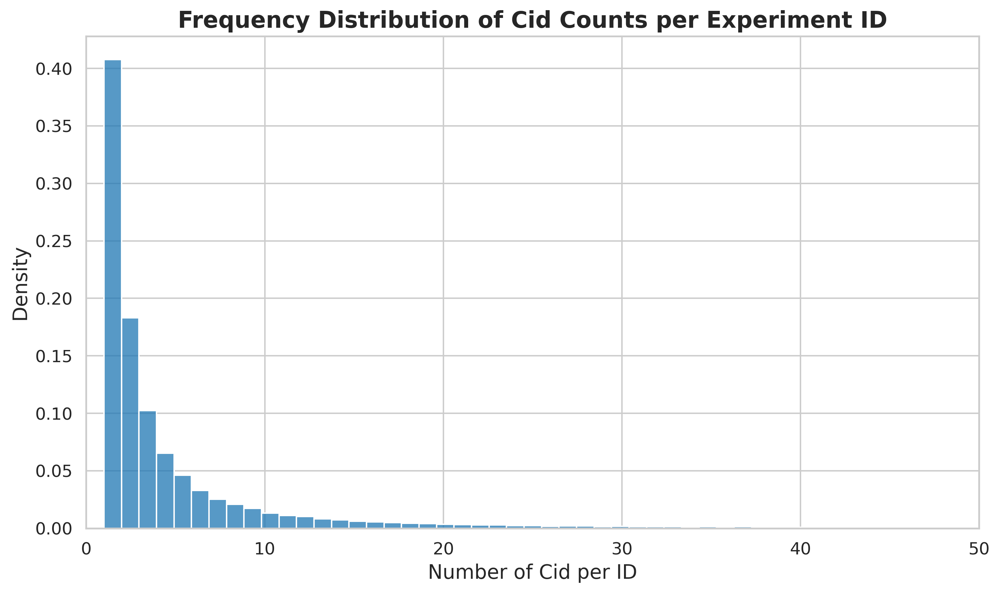

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

# 去掉极端值 > 50
data = NumC_of_E[NumC_of_E["NumC"] <= 50]

# 设置顶刊风格
sns.set(style="whitegrid")  # 干净网格背景
plt.figure(figsize=(10, 6), dpi=300)  # 高清输出

# 绘制频率分布直方图（去掉曲线）
sns.histplot(data=data, x="NumC", bins=50, stat="density", color="#1f77b4", edgecolor="white")

# 美化图表
plt.title("Frequency Distribution of Cid Counts per Experiment ID", fontsize=16, weight='bold')
plt.xlabel("Number of Cid per ID", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlim(0, 50)  # 保持一致
plt.tight_layout()

# 保存高清图片
plt.savefig("NumC_of_E_distribution.png", dpi=600)  # 600dpi 高清
plt.show()
##=============================================##
#可以看出实验组控制组1对1的还是占据了大部分（约42%）

## STEP2 ——选择筛选方法

In [2]:
E_C_df_clean

NameError: name 'E_C_df_clean' is not defined

In [ ]:
E_C_df_clean = E_C_df_clean.drop(["E_before_sum", "C_before_sum", "diff"], axis=1)


In [ ]:
E_C_df_clean

In [ ]:
output_path = '/Data4/yutao_wen/25.12.17/E_C_df_clean.csv'
# 保存为 CSV 文件
E_C_df_clean.to_csv(output_path, index=False)

In [ ]:
E_C_df_clean = pd.read_csv("/Data4/yutao_wen/25.12.17/E_C_df_clean.csv")

In [ ]:
E_C_df_clean

### Choice(1) YifangMa DOM


#### DOM筛选

In [22]:
import pandas as pd
import numpy as np
import ast

def filter_citations_dom(df, threshold=0.4):
    """
    模仿 PNAS 论文的 DOM 匹配方法筛选 Cid。
    
    参数:
    df: 包含 'Ecitation_Before' 和 'Ccitation_Before' 的 DataFrame
    threshold: 筛选阈值 (默认 0.6，对应论文中的宽松阈值，可根据对数距离的分布调整，建议对数下可以设得更小，如 0.1-0.3)
    
    返回:
    df_filtered: 筛选后的 DataFrame，包含计算出的 distance 列
    """
    
    # 1. 辅助函数：解析字符串元组
    def parse_tuple(val):
        if pd.isna(val) or val == '[]' or val == '':
            return []
        try:
            # 尝试将字符串 "(1, 2)" 转为元组 (1, 2)
            if isinstance(val, str):
                return ast.literal_eval(val)
            return val
        except:
            return []

    # 2. 核心距离计算函数
    def calculate_log_distance(row):
        # 解析数据
        e_hist = parse_tuple(row['Ecitation_Before'])
        c_hist = parse_tuple(row['Ccitation_Before'])
        
        # 如果任意一方为空，距离无穷大（无法匹配）
        if not e_hist or not c_hist:
            return np.inf
        
        # 转换为 Numpy 数组以便计算
        # 截取逻辑：取最后5个（从右往左的5个值）
        # Python 切片 [-5:] 会自动处理长度不足5的情况（取全部）
        e_arr = np.array(e_hist[-5:])
        c_arr = np.array(c_hist[-5:])
        
        # 长度对齐逻辑：
        # 如果截取后长度依然不一致（例如 E有2年数据，C有3年数据）
        # 此时应比较两者重叠的“最近”年份，即取两者的最小长度，从后往前对齐
        min_len = min(len(e_arr), len(c_arr))
        if min_len == 0:
            return np.inf
            
        e_comp = e_arr[-min_len:]
        c_comp = c_arr[-min_len:]
        
        # 3. 对数处理：Log(x + 1)
        e_log = np.log(e_comp + 1)
        c_log = np.log(c_comp + 1)
        
        # 4. 计算距离 (Distance Calculation)
        # 对应论文中的 Equation 4 (Robustness check using alternative distance metric)
        # 使用均方差 (Mean Squared Difference) 或者 绝对值差 (Mean Absolute Difference)
        # 这里使用均方差，因为它对异常值更敏感，符合"Optimal Matching"的严谨性
        
        # 计算每一年的 (LogE - LogC)^2
        squared_diffs = (e_log - c_log) ** 2
        
        # 计算平均距离 (归一化，消除年份长度带来的影响)
        distance = np.mean(squared_diffs)
        
        # 备选方案：如果你更倾向于线性差异，可以使用绝对值差：
        # distance = np.mean(np.abs(e_log - c_log))
        
        return distance

    # 复制一份数据以免修改原始数据
    df_out = df.copy()
    
    print("正在计算 Log Distance，这可能需要一点时间...")
    
    # 应用计算函数
    # 注意：axis=1 表示逐行应用
    df_out['log_citation_distance'] = df_out.apply(calculate_log_distance, axis=1)
    
    # 5. 筛选
    # 保留距离小于等于阈值，且距离不是无穷大的行
    filtered_df = df_out[
        (df_out['log_citation_distance'] <= threshold) & 
        (df_out['log_citation_distance'] != np.inf)
    ].copy()
    
    print(f"筛选完成。")
    print(f"原始行数: {len(df)}")
    print(f"筛选后行数: {len(filtered_df)} (阈值: {threshold})")
    
    return filtered_df

# ==========================================
# 使用示例
# ==========================================

# 假设你的 dataframe 叫 E_C_df_clean
# E_C_df_clean = pd.read_csv('your_data.csv') # 如果需要读取

# 设置阈值。
# 注意：论文中原始引用量相对偏差(Eq 3)的阈值是0.6。
# 但是，因为我们取了 Log，数值变小了，距离也会变小。
# Log距离的 0.1 已经代表由于 log 压缩后的差异，建议先设为 0.1 或 0.2 查看保留的数据量。
# 如果想严格模仿论文的宽松度，0.6 肯定能保留很多数据，但也可能不够精确。
matched_df = filter_citations_dom(E_C_df_clean, threshold=0.4)

# 查看结果
print(matched_df[['id', 'Cid', 'Ecitation_Before', 'Ccitation_Before', 'log_citation_distance']].head())

# 如果需要保存
# matched_df.to_csv('E_C_matched_filtered.csv', index=False)

正在计算 Log Distance，这可能需要一点时间...
筛选完成。
原始行数: 603871
筛选后行数: 164648 (阈值: 0.4)
                    id             Cid  \
18895   pub.1022200182  pub.1000000011   
202713  pub.1015882513  pub.1000000866   
76095   pub.1045901242  pub.1000000880   
377968  pub.1021379212  pub.1000001496   
514268  pub.1003140261  pub.1000002314   

                                Ecitation_Before  \
18895                                     (2, 6)   
202713  (1, 8, 13, 11, 7, 11, 16, 11, 9, 13, 14)   
76095                     (9, 10, 7, 7, 6, 6, 7)   
377968                      (13, 15, 16, 12, 11)   
514268  (19, 43, 44, 35, 32, 34, 27, 22, 31, 27)   

                               Ccitation_Before  log_citation_distance  
18895                                    (6, 8)               0.390536  
202713  (7, 19, 26, 18, 15, 12, 11, 9, 6, 9, 4)               0.320388  
76095                 (4, 5, 9, 15, 14, 13, 11)               0.351192  
377968                      (7, 13, 18, 22, 23)               0.2298

In [23]:
matched_df

,id,Cid,Ecitation_Before,Ccitation_Before,Ecitation_After,Ccitation_After,E_before_sum,C_before_sum,diff,log_citation_distance
18895,pub.1022200182,pub.1000000011,"(2, 6)","(6, 8)","(5, 3, 6, 9, 10, 7, 5, 5)","(3, 2, 2, 1, 0, 1, 2, 1)",NaN,NaN,NaN,0.390536
202713,pub.1015882513,pub.1000000866,"(1, 8, 13, 11, 7, 11, 16, 11, 9, 13, 14)","(7, 19, 26, 18, 15, 12, 11, 9, 6, 9, 4)","(10, 11, 17, 16, 13, 14, 16, 18, 12)","(0, 5, 10, 8, 4, 1, 2, 6, 6)",NaN,NaN,NaN,0.320388
76095,pub.1045901242,pub.1000000880,"(9, 10, 7, 7, 6, 6, 7)","(4, 5, 9, 15, 14, 13, 11)","(6,)","(9,)",NaN,NaN,NaN,0.351192
377968,pub.1021379212,pub.1000001496,"(13, 15, 16, 12, 11)","(7, 13, 18, 22, 23)","(12, 8, 5, 5, 6, 4, 3, 5, 4, 2, 1, 1, 2, 1, 1,...","(22, 17, 12, 18, 23, 15, 11, 14, 8, 5, 7, 10, ...",NaN,NaN,NaN,0.229869
514268,pub.1003140261,pub.1000002314,"(19, 43, 44, 35, 32, 34, 27, 22, 31, 27)","(1, 13, 23, 65, 68, 19, 18, 20, 13, 19)","(20, 17, 12, 6, 2, 2, 1, 1, 3, 5, 4, 3, 4)","(15, 3, 5, 5, 4, 4, 3, 4, 4, 3, 1, 2, 4)",NaN,NaN,NaN,0.253684
...,...,...,...,...,...,...,...,...,...,...
461256,pub.1163166155,pub.1163166132,"(0,)","(0,)","(1,)","(2,)",NaN,NaN,NaN,0.000000
278486,pub.1107888184,pub.1164040316,"(0, 1, 1, 1)","(0, 0, 0, 0)","(1,)","(0,)",NaN,NaN,NaN,0.360340
534895,pub.1061959193,pub.1164879656,"(0, 0)","(0, 0)","(0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1)","(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)",NaN,NaN,NaN,0.000000
449920,pub.1010960844,pub.1165282236,"(1, 2, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0)",NaN,NaN,NaN,0.000000


#### 1:1对应——实验组：控制组

In [24]:
import pandas as pd

def select_best_control(matched_df):
    """
    对已匹配的 DataFrame (matched_df) 进行 1:1 最佳匹配筛选。
    
    对于每个实验组 (id)，保留 log_citation_distance 最小的控制组 (Cid)。
    
    参数:
    matched_df: 经过动态匹配和阈值筛选后的 DataFrame。必须包含 'id' 和 'log_citation_distance' 列。
    
    返回:
    df_1to1: 包含 1:1 最佳匹配结果的 DataFrame。
    """
    
    if matched_df.empty:
        print("警告: 输入的 DataFrame 为空，无法进行 1:1 匹配。")
        return pd.DataFrame()
        
    print("正在执行 1:1 最佳匹配 (距离最小原则)...")

    # 1. 找到每个 'id' 对应的最小距离的索引 (Index)
    # idxmin() 会返回每组中最小值的索引
    idx_min_distance = matched_df.groupby('id')['log_citation_distance'].idxmin()
    
    # 2. 利用这些索引从原始 DataFrame 中筛选出最佳匹配行
    df_1to1 = matched_df.loc[idx_min_distance].reset_index(drop=True)
    
    print("\n=== 1:1 最佳匹配结果概览 ===")
    print(f"成功匹配的实验组数量: {len(df_1to1)}")
    print(f"平均匹配距离: {df_1to1['log_citation_distance'].mean():.6f}")
    print(f"最大匹配距离: {df_1to1['log_citation_distance'].max():.6f}")
    
    return df_1to1

# 运行最佳匹配函数
best_matched_df = select_best_control(matched_df)

# 打印最终结果
print("\n=== 1:1 最佳匹配结果 (前几行) ===")
print(best_matched_df[['id', 'Cid', 'log_citation_distance']])

# 如果需要保存最终的 1:1 匹配结果
# best_matched_df.to_csv('E_C_best_1to1_match.csv', index=False)

正在执行 1:1 最佳匹配 (距离最小原则)...

=== 1:1 最佳匹配结果概览 ===
成功匹配的实验组数量: 45059
平均匹配距离: 0.119791
最大匹配距离: 0.399852

=== 1:1 最佳匹配结果 (前几行) ===
                   id             Cid  log_citation_distance
0      pub.1000000694  pub.1013015745               0.183532
1      pub.1000002908  pub.1022133001               0.121206
2      pub.1000005181  pub.1016147241               0.160149
3      pub.1000005995  pub.1019542216               0.054183
4      pub.1000006527  pub.1029421037               0.056607
...               ...             ...                    ...
45054  pub.1160206067  pub.1160117658               0.000000
45055  pub.1160206333  pub.1160206839               0.225062
45056  pub.1161680265  pub.1158471273               0.000000
45057  pub.1163166155  pub.1163166132               0.000000
45058  pub.1164912181  pub.1070561906               0.000000

[45059 rows x 3 columns]


In [25]:
import pandas as pd

def select_best_control_1to2(matched_df):
    """
    对已匹配的 DataFrame (matched_df) 进行 1:2 最佳匹配筛选。

    对于每个实验组 (id)，按照 log_citation_distance 从小到大排序，
    只保留距离最小的两个控制组 (Cid)。

    参数:
    matched_df: 已匹配 DataFrame，必须包含 'id', 'Cid', 'log_citation_distance' 列。

    返回:
    df_1to2: 包含 1:2 最佳匹配结果的 DataFrame。
    """

    if matched_df.empty:
        print("警告: 输入的 DataFrame 为空，无法进行 1:2 匹配。")
        return pd.DataFrame()

    print("正在执行 1:K 最佳匹配 (距离最小原则) K可以修改...")

    # 核心逻辑：每个 id 取距离最小的两个控制组
    df_1to2 = (
        matched_df
        .sort_values(['id', 'log_citation_distance'])
        .groupby('id', group_keys=False)
        .head(1) #修改这里就好
        .reset_index(drop=True)
    )

    print("\n=== 1:K 最佳匹配结果概览 ===")
    print(f"成功匹配的实验组数量: {df_1to2['id'].nunique()}")
    print(f"总匹配对数量: {len(df_1to2)}")
    print(f"平均匹配距离: {df_1to2['log_citation_distance'].mean():.6f}")
    print(f"最大匹配距离: {df_1to2['log_citation_distance'].max():.6f}")

    return df_1to2


# ============================
# 运行 1:2 最佳匹配
# ============================

best_matched_df = select_best_control_1to2(matched_df)

# 查看结果
print("\n=== 1:K 最佳匹配结果（前几行） ===")
print(best_matched_df[['id', 'Cid', 'log_citation_distance']].head())



正在执行 1:K 最佳匹配 (距离最小原则) K可以修改...

=== 1:K 最佳匹配结果概览 ===
成功匹配的实验组数量: 45059
总匹配对数量: 45059
平均匹配距离: 0.119791
最大匹配距离: 0.399852

=== 1:K 最佳匹配结果（前几行） ===
               id             Cid  log_citation_distance
0  pub.1000000694  pub.1013015745               0.183532
1  pub.1000002908  pub.1022133001               0.121206
2  pub.1000005181  pub.1016147241               0.160149
3  pub.1000005995  pub.1019542216               0.054183
4  pub.1000006527  pub.1029421037               0.056607


In [26]:
best_matched_df

,id,Cid,Ecitation_Before,Ccitation_Before,Ecitation_After,Ccitation_After,E_before_sum,C_before_sum,diff,log_citation_distance
0,pub.1000000694,pub.1013015745,"(36, 46, 45, 43)","(16, 56, 59, 37)","(43, 44, 39, 41, 41, 38, 34, 32, 24, 22, 25, 3...","(28, 15, 12, 10, 8, 7, 5, 5, 3, 5, 4, 3, 3)",NaN,NaN,NaN,0.183532
1,pub.1000002908,pub.1022133001,"(1, 6, 10, 9, 6, 4, 6)","(4, 7, 6, 7, 7, 7, 4)","(9, 7, 3, 5, 6, 7, 8, 3)","(0, 2, 2, 1, 2, 2, 2, 1)",NaN,NaN,NaN,0.121206
2,pub.1000005181,pub.1016147241,"(4, 5, 4, 3)","(2, 4, 5, 6)","(2, 2, 2, 3, 6, 4)","(5, 3, 1, 5, 7, 7)",NaN,NaN,NaN,0.160149
3,pub.1000005995,pub.1019542216,"(4, 14, 11, 5, 8, 6, 8, 8, 8)","(0, 3, 6, 8, 10, 9, 8, 6, 10)","(8,)","(9,)",NaN,NaN,NaN,0.054183
4,pub.1000006527,pub.1029421037,"(4, 6)","(4, 4)","(4, 2, 0, 0, 0, 1, 2)","(1, 2, 2, 3, 5, 5, 2)",NaN,NaN,NaN,0.056607
...,...,...,...,...,...,...,...,...,...,...
45054,pub.1160206067,pub.1160117658,"(1, 2)","(1, 2)","(2, 1, 1, 4, 5, 6, 4)","(3, 4, 8, 7, 4, 7, 11)",NaN,NaN,NaN,0.000000
45055,pub.1160206333,pub.1160206839,"(0, 0, 1, 1, 0)","(0, 1, 2, 1, 1)","(0, 1, 1, 0, 0, 0)","(1, 0, 0, 0, 0, 0)",NaN,NaN,NaN,0.225062
45056,pub.1161680265,pub.1158471273,"(0, 0)","(0, 0)","(0, 0, 0)","(0, 0, 1)",NaN,NaN,NaN,0.000000
45057,pub.1163166155,pub.1163166132,"(0,)","(0,)","(1,)","(2,)",NaN,NaN,NaN,0.000000


In [27]:
final_filtered = best_matched_df

### Choice（2）—— slope%+欧氏距离 筛选

In [29]:
E_C_df_clean

,id,Cid,Ecitation_Before,Ccitation_Before,Ecitation_After,Ccitation_After,E_before_sum,C_before_sum,diff
18895,pub.1022200182,pub.1000000011,"(2, 6)","(6, 8)","(5, 3, 6, 9, 10, 7, 5, 5)","(3, 2, 2, 1, 0, 1, 2, 1)",NaN,NaN,NaN
43643,pub.1023832291,pub.1000000140,"(0, 0, 0, 1, 4, 4)","(0, 0, 0, 0, 0, 0)","(1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)",NaN,NaN,NaN
202305,pub.1002168182,pub.1000000415,"(7,)","(2,)","(9, 10, 15, 20, 17, 18, 17, 14)","(4, 5, 7, 5, 2, 2, 2, 1)",NaN,NaN,NaN
202713,pub.1015882513,pub.1000000866,"(1, 8, 13, 11, 7, 11, 16, 11, 9, 13, 14)","(7, 19, 26, 18, 15, 12, 11, 9, 6, 9, 4)","(10, 11, 17, 16, 13, 14, 16, 18, 12)","(0, 5, 10, 8, 4, 1, 2, 6, 6)",NaN,NaN,NaN
76095,pub.1045901242,pub.1000000880,"(9, 10, 7, 7, 6, 6, 7)","(4, 5, 9, 15, 14, 13, 11)","(6,)","(9,)",NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
263665,pub.1149260706,pub.1164983019,[],[],"(1,)","(0,)",NaN,NaN,NaN
449920,pub.1010960844,pub.1165282236,"(1, 2, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 0, 0, 0)",NaN,NaN,NaN
479789,pub.1070816764,pub.1166106125,"(17, 20, 10, 8, 14, 15, 9, 8, 9, 7, 7, 8, 7, 9...","(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","(6, 4, 4)","(0, 0, 0)",NaN,NaN,NaN
446827,pub.1128449483,pub.1166801607,[],[],"(1, 1, 0)","(0, 0, 0)",NaN,NaN,NaN


#### ①筛选代码

In [ ]:
import ast 
import numpy as np
import pandas as pd
from scipy.stats import linregress

# ========= Step 1: 解析元组字符串为真正的 tuple =========
def parse_tuple_column(col):
    return col.apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

E_C_df_clean['Ecitation_Before'] = parse_tuple_column(E_C_df_clean['Ecitation_Before'])
E_C_df_clean['Ccitation_Before'] = parse_tuple_column(E_C_df_clean['Ccitation_Before'])

# ========= Step 2: log(1+x) 变换 =========
def log_transform_tuple(col):
    return col.apply(lambda tup: tuple(np.log1p(np.array(tup))) if isinstance(tup, (tuple, list)) else tup)

E_C_df_clean['log_E_Before'] = log_transform_tuple(E_C_df_clean['Ecitation_Before'])
E_C_df_clean['log_C_Before'] = log_transform_tuple(E_C_df_clean['Ccitation_Before'])

# ========= Step 3: 定义计算线性回归斜率 =========
def get_slope(tup):
    if isinstance(tup, (tuple, list)) and len(tup) >= 2:
        x = np.arange(len(tup))
        y = np.array(tup)
        if np.all(y == y[0]):  # 所有值都一样，斜率=0
            return 0.0
        return linregress(x, y).slope
    else:
        return None  # 数据不足

#==========取log之后的citation============
E_C_df_clean['E_slope'] = E_C_df_clean['log_E_Before'].apply(get_slope)
E_C_df_clean['C_slope'] = E_C_df_clean['log_C_Before'].apply(get_slope)

# ========= Step 4: 斜率绝对差值筛选 =========

slope_filtered = E_C_df_clean[
    E_C_df_clean['E_slope'].notnull() &
    E_C_df_clean['C_slope'].notnull() &
    ((E_C_df_clean['E_slope'] - E_C_df_clean['C_slope']).abs() < 0.01) 
]

#改进版
# ========= Step 5: 欧式距离函数 =========
def euclidean_distance(t1, t2):
    if not isinstance(t1, (tuple, list)) or not isinstance(t2, (tuple, list)):
        return np.nan
    max_len = max(len(t1), len(t2))
    v1 = np.array(list(t1) + [0] * (max_len - len(t1)))
    v2 = np.array(list(t2) + [0] * (max_len - len(t2)))
    return np.linalg.norm(v1 - v2)

# ========= Step 6: 计算欧式距离 =========
slope_filtered['euclidean_dist'] = slope_filtered.apply(
    lambda row: euclidean_distance(row['log_E_Before'], row['log_C_Before']), axis=1
)
d_filtered = slope_filtered.copy()
print(f"斜率筛选后剩余：{len(d_filtered)} 条")

# 设置阈值，比如 5
slope_filtered = slope_filtered[slope_filtered['euclidean_dist'] < 5]
print(f"欧氏距离阈值筛选后剩余：{len(slope_filtered)} 条")

# ========= Step 7: 每个实验组只保留欧氏距离最小的控制组 =========
# groupby 'id'（实验组），取欧氏距离最小的行
final_filtered = slope_filtered.loc[slope_filtered.groupby('id')['euclidean_dist'].idxmin()]
#
print(f"最终匹配后剩余：{len(final_filtered)} 条")
# final_filtered 就是你要的最终 DataFrame


In [ ]:
"""# 获取斜率差在 [0, 0.05] 范围内的实验组
pos_slope_diff = slope_filtered[(slope_filtered['slope_diff'] > 0) & (slope_filtered['slope_diff'] <= 0.05)]
# 获取斜率差在 [-0.05, 0] 范围内的实验组
neg_slope_diff = slope_filtered[(slope_filtered['slope_diff'] < 0) & (slope_filtered['slope_diff'] >= -0.05)]

# 计算正斜率差群体的均值
pos_slope_diff_mean = pos_slope_diff['slope_diff'].mean()
# 计算负斜率差群体的均值
neg_slope_diff_mean = neg_slope_diff['slope_diff'].mean()

print(f"正斜率差群体的均值: {pos_slope_diff_mean}")
print(f"负斜率差群体的均值: {neg_slope_diff_mean}")"""


In [ ]:
final_filtered

#### ②筛选欧式距离前的欧氏距离分布

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 取斜率筛选后但未进行欧氏距离阈值筛选的欧氏距离
dist_series = d_filtered['euclidean_dist'].dropna()
N = len(dist_series)  # 只统计有效距离数量

plt.figure(figsize=(8, 5))
sns.histplot(dist_series, bins=50, kde=True, stat="percent")
plt.xlabel("Euclidean Distance")
plt.ylabel("Percentage (%)")
plt.title(f"Distribution of Euclidean Distances between E and C after slope filter (N = {N})")
plt.show()

# 打印统计信息
print("欧氏距离分布统计：")
print(dist_series.describe())


#### ③筛选欧氏距离后的欧氏距离分布

In [ ]:
# 取筛选后的欧氏距离
dist_series = slope_filtered['euclidean_dist'].dropna()
N = len(dist_series)

plt.figure(figsize=(8, 5))
sns.histplot(dist_series, bins=50, kde=True, stat="percent")
plt.xlabel("Euclidean Distance")
plt.ylabel("Percentage (%)")
plt.title(f"Distribution of Euclidean Distances between E and C (N = {N})")
plt.show()

# 打印统计信息
print("欧氏距离分布统计：")
print(dist_series.describe())


In [ ]:
# 取1:1筛选后的欧氏距离
dist_series = final_filtered['euclidean_dist'].dropna()
N = len(dist_series)

plt.figure(figsize=(8, 5))
sns.histplot(dist_series, bins=50, kde=True, stat="percent")
plt.xlabel("Euclidean Distance")
plt.ylabel("Percentage (%)")
plt.title(f"Distribution of Euclidean Distances between E and C (N = {N})")
plt.show()

# 打印统计信息
print("欧氏距离分布统计：")
print(dist_series.describe())

### Choice (3) —— 年年范围

In [ ]:
E_C_df_clean

In [ ]:
# 假设您的 DataFrame 变量名是 E_C_df_clean
# 导入 pandas (如果您还没有导入的话)
import pandas as pd

# 假设 E_C_df_clean 已经加载

# 统计 'id' 列中的唯一值数量
unique_id_count = E_C_df_clean['id'].nunique()

# 打印结果
print(f"E_C_df_clean 中 'id' 列的唯一 ID 数量是: {unique_id_count}")

In [ ]:
import numpy as np
import pandas as pd
import ast

# ==========================================
# Step 0: 准备工作 - 解析字符串为元组
# ==========================================

def parse_tuple_data(val):
    """安全地将字符串解析为元组"""
    if isinstance(val, (tuple, list)):
        return tuple(val)
    if isinstance(val, str):
        try:
            return tuple(ast.literal_eval(val))
        except:
            return np.nan
    return np.nan

# *** 假设 E_C_df_clean 已加载 ***

E_C_df_clean['E_tuple'] = E_C_df_clean['Ecitation_Before'].apply(parse_tuple_data)
E_C_df_clean['C_tuple'] = E_C_df_clean['Ccitation_Before'].apply(parse_tuple_data)

# 清除解析失败或为空的行
E_C_df_clean.dropna(subset=['E_tuple', 'C_tuple'], inplace=True)


# ==========================================
# Step 1: log1p 转换
# ==========================================

def log_transform_tuple(tpl):
    if not tpl: return tuple()
    return tuple(np.log1p(np.array(tpl)))

E_C_df_clean['log_E_Before'] = E_C_df_clean['E_tuple'].apply(log_transform_tuple)
E_C_df_clean['log_C_Before'] = E_C_df_clean['C_tuple'].apply(log_transform_tuple)


# ==========================================
# Step 2: 核心筛选逻辑 (包含“最近5年”规则)
# ==========================================

def check_trend_similarity(row, threshold=0.2):
    e_seq = row['log_E_Before']
    c_seq = row['log_C_Before']

    # 1. 基础检查
    if len(e_seq) != len(c_seq) or len(e_seq) < 2:
        return False
    
    # 2. 截取最近 5 年
    e_check = e_seq[-5:]
    c_check = c_seq[-5:]

    # 3. 逐年计算差异比例
    for e_val, c_val in zip(e_check, c_check):
        diff = abs(e_val - c_val)
        base = max(e_val, c_val, 1e-6) # 防止除零
        ratio = diff / base

        if ratio > threshold:
            return False

    return True

# 设置卡尺阈值
current_threshold = 0.00

# 应用卡尺筛选（第一阶段过滤）
E_C_df_clean['is_candidate'] = E_C_df_clean.apply(
    lambda row: check_trend_similarity(row, threshold=current_threshold), 
    axis=1
)

# 筛选出的合格候选池 (对应您代码中的 filtered_df)
candidate_filtered = E_C_df_clean[E_C_df_clean['is_candidate']].copy()

print(f"原始行数: {len(E_C_df_clean)}")
print(f"阶段一（卡尺匹配）后剩余候选行数: {len(candidate_filtered)}")


# ==========================================
# Step 3: 欧氏距离函数（看最近 5 年）
# ==========================================
# 注意：这里使用 log_E_Before 和 log_C_Before
def euclidean_dist_last5(e_list, c_list):
    """计算 log 变换后的序列的倒数5年欧氏距离"""
    
    # 保证序列长度至少为 5，如果不足，则使用所有长度，但我们知道经过 Step 2 筛选，
    # 长度至少为 2，且我们只需关注末尾
    
    # 截取倒数 5 年
    e_arr = np.array(e_list[-5:], dtype=float)
    c_arr = np.array(c_list[-5:], dtype=float)
    
    # 填充：如果序列长度不足 5（例如长度为 3），则需要将数组填充到统一长度，
    # 但由于 Step 2 已经确保了 e_list 和 c_list 长度相同，这里简单截取即可。
    # 对于长度 < 5 的情况，它会截取整个序列 (e.g. [-5:] on a len 3 list returns the whole list)
    return np.linalg.norm(e_arr - c_arr)


# ==========================================
# Step 4: 对每个实验组 id 只选最接近的控制组 Cid
# ==========================================

# 我们在 candidate_filtered (合格池) 上操作

best_matches = []

# 遍历每个实验组 ID
for exp_id, group in candidate_filtered.groupby("id"):
    
    # 计算欧氏距离。由于 group 是 candidate_filtered 的子集，我们直接操作
    group.loc[:, "distance"] = group.apply(
        lambda r: euclidean_dist_last5(r["log_E_Before"], r["log_C_Before"]),
        axis=1
    )

    # 选择距离最小的那一行
    best_row = group.loc[group["distance"].idxmin()]
    best_matches.append(best_row)

# 合并结果
final_filtered = pd.DataFrame(best_matches)

print(f"最终匹配后的实验组数量（1-对-1 匹配）：{len(final_filtered)}")

# final_filtered 就是最终的 1-对-1 匹配结果。

In [ ]:
final_filtered

### exactly


In [ ]:
E_C_df_clean

In [ ]:
import ast
import pandas as pd

# ----------------------------
# 复制一份避免修改原数据
# ----------------------------
df = E_C_df_clean.copy()

# 如果列是字符串，需要转成 tuple 对象（安全解析）
def ensure_tuple(x):
    if isinstance(x, str):
        return tuple(ast.literal_eval(x))
    return x

df["Ecitation_Before"] = df["Ecitation_Before"].apply(ensure_tuple)
df["Ccitation_Before"] = df["Ccitation_Before"].apply(ensure_tuple)

# ----------------------------
# 筛选事前完全相等的行
# ----------------------------
E_C_df_exactly = df[df["Ecitation_Before"] == df["Ccitation_Before"]].copy()

# 去掉空值行
E_C_df_exactly = E_C_df_exactly[
    ~((E_C_df_exactly['Ecitation_Before'] == ()) &
      (E_C_df_exactly['Ccitation_Before'] == ()))
]

# ----------------------------
# 1 对 1 匹配：每个实验组只保留一个控制组
# ----------------------------
# 假设原始 df 有实验组 id 和控制组 id 列 'id' 和 'Cid'
# 使用 groupby + first 实现每个实验组只保留一个控制组
E_C_df_1to1 = E_C_df_exactly.groupby('id').first().reset_index()

# ----------------------------
# 输出信息
# ----------------------------
original_rows = len(E_C_df_clean)
exact_match_rows = len(E_C_df_exactly)
matched_control_rows = len(E_C_df_1to1)

print(f"原始数据量：{original_rows}")
print(f"筛选出事前完全相等的数据量：{exact_match_rows}")
print(f"1 对 1 筛选后的控制组数量：{matched_control_rows}")


In [ ]:
E_C_df_1to1

In [ ]:
final_filtered = E_C_df_1to1

### 绘图尝试

In [ ]:
final_filtered

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem

# ----------------------------
# 1. 解析元组列
# ----------------------------
def parse_tuple_column(col):
    return col.apply(lambda x: eval(x) if isinstance(x, str) else x)

final_filtered['Ecitation_Before'] = parse_tuple_column(final_filtered['Ecitation_Before'])
final_filtered['Ccitation_Before'] = parse_tuple_column(final_filtered['Ccitation_Before'])
final_filtered['Ecitation_After'] = parse_tuple_column(final_filtered['Ecitation_After'])
final_filtered['Ccitation_After'] = parse_tuple_column(final_filtered['Ccitation_After'])

# ----------------------------
# 2. 多长度绘图：2~10
# ----------------------------

fig, axes = plt.subplots(3, 3, figsize=(18, 15))
axes = axes.flatten()

length_list = list(range(2, 11))   # 2~10

for idx, L in enumerate(length_list):
    ax = axes[idx]

    records = []

    # ----- 逐行处理 -----
    for _, row in final_filtered.iterrows():

        # ⭐⭐ 只保留：log_E_Before_cum 长度 = L 的样本
        if len(row['Ecitation_Before']) != L:
            continue

        # --- 事前 ---
        e_before = np.log1p(row['Ecitation_Before'])
        c_before = np.log1p(row['Ccitation_Before'])

        for i, v in enumerate(e_before):
            t = -(len(e_before) - i)
            records.append({"t": t, "group": "Treatment", "value": v})
        for i, v in enumerate(c_before):
            t = -(len(c_before) - i)
            records.append({"t": t, "group": "Control", "value": v})

        # --- 事后，log1p ---
        e_after = np.log1p(row['Ecitation_After'])
        c_after = np.log1p(row['Ccitation_After'])

        for i, v in enumerate(e_after):
            t = i
            records.append({"t": t, "group": "Treatment", "value": v})
        for i, v in enumerate(c_after):
            t = i
            records.append({"t": t, "group": "Control", "value": v})

    df_long = pd.DataFrame(records)

    # 若样本太少跳过
    if len(df_long) == 0:
        ax.set_title(f"L={L} (No Data)")
        continue

    # ----------------------------
    # ⭐⭐ 只保留 t ∈ [-10, 15]
    # ----------------------------
    df_long = df_long[(df_long["t"] >= -10) & (df_long["t"] <= 15)]

    # ---- 计算平均趋势 + 95%CI ----
    summary = (
        df_long.groupby(["t", "group"])
            .agg(mean=("value", "mean"),
                 se=("value", sem),
                 n=("value", "count"))
            .reset_index()
    )
    summary["ci_low"] = summary["mean"] - 1.96 * summary["se"]
    summary["ci_high"] = summary["mean"] + 1.96 * summary["se"]

    # ---- 绘图 ----
    groups = ["Treatment", "Control"]
    colors = ["#1f77b4", "#ff7f0e"]

    for g, c in zip(groups, colors):
        sdf = summary[summary["group"] == g]
        ax.plot(sdf["t"], sdf["mean"], label=g, color=c, linewidth=1.8)
        ax.fill_between(sdf["t"], sdf["ci_low"], sdf["ci_high"], color=c, alpha=0.15)

    ax.axvline(0, color="black", linestyle="--", linewidth=1)
    ax.set_title(f"Pre-length = {L}", fontsize=13)
    ax.grid(alpha=0.3)

    if idx % 3 == 0:
        ax.set_ylabel("log(Citations)")

    if idx >= 6:
        ax.set_xlabel("Event Time (t)")


plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem, ttest_ind

# ----------------------------
# 1. 解析元组列
# ----------------------------
def parse_tuple_column(col):
    return col.apply(lambda x: eval(x) if isinstance(x, str) else x)

final_filtered['Ecitation_Before'] = parse_tuple_column(final_filtered['Ecitation_Before'])
final_filtered['Ccitation_Before'] = parse_tuple_column(final_filtered['Ccitation_Before'])
final_filtered['Ecitation_After'] = parse_tuple_column(final_filtered['Ecitation_After'])
final_filtered['Ccitation_After'] = parse_tuple_column(final_filtered['Ccitation_After'])

# ----------------------------
# 2. 多长度绘图：2~10
# ----------------------------
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
axes = axes.flatten()

length_list = list(range(2, 11))   # 2~10

for idx, L in enumerate(length_list):
    ax = axes[idx]

    records = []

    # ----- 逐行处理 -----
    for _, row in final_filtered.iterrows():

        # ⭐⭐ 只保留：长度 = L 的样本
        if len(row['Ecitation_Before']) != L:
            continue

        # --- 事前 ---
        e_before = np.log1p(row['Ecitation_Before'])
        c_before = np.log1p(row['Ccitation_Before'])

        for i, v in enumerate(e_before):
            t = -(len(e_before) - i)
            records.append({"t": t, "group": "Treatment", "value": v})
        for i, v in enumerate(c_before):
            t = -(len(c_before) - i)
            records.append({"t": t, "group": "Control", "value": v})

        # --- 事后 ---
        e_after = np.log1p(row['Ecitation_After'])
        c_after = np.log1p(row['Ccitation_After'])

        for i, v in enumerate(e_after):
            t = i
            records.append({"t": t, "group": "Treatment", "value": v})
        for i, v in enumerate(c_after):
            t = i
            records.append({"t": t, "group": "Control", "value": v})

    df_long = pd.DataFrame(records)

    # 若样本太少跳过
    if len(df_long) == 0:
        ax.set_title(f"L={L} (No Data)")
        continue

    # 只保留 t ∈ [-10, 15]
    df_long = df_long[(df_long["t"] >= -10) & (df_long["t"] <= 15)]

    # ---- 计算平均趋势 + 95%CI ----
    summary = (
        df_long.groupby(["t", "group"])
               .agg(mean=("value", "mean"),
                    se=("value", sem),
                    n=("value", "count"))
               .reset_index()
    )
    summary["ci_low"] = summary["mean"] - 1.96 * summary["se"]
    summary["ci_high"] = summary["mean"] + 1.96 * summary["se"]

    # ---- 绘趋势 ----
    groups = ["Treatment", "Control"]
    colors = ["#1f77b4", "#ff7f0e"]

    for g, c in zip(groups, colors):
        sdf = summary[summary["group"] == g]
        ax.plot(sdf["t"], sdf["mean"], label=g, color=c, linewidth=1.8)
        ax.fill_between(sdf["t"], sdf["ci_low"], sdf["ci_high"], color=c, alpha=0.15)

    ax.axvline(0, color="black", linestyle="--", linewidth=1)
    ax.set_title(f"Pre-length = {L}", fontsize=13)
    ax.grid(alpha=0.3)

    # -------------------------------------------------------
    # ⭐⭐ 新增：对每个事前年份做 T 检验 + 竖着标 p 值
    # -------------------------------------------------------
    ymax = summary["mean"].max()
    p_label_height = ymax * 1.05   # 竖直放置位置（不会重叠）

    for t_val in sorted(summary["t"].unique()):
        if t_val >= 0:
            continue  # 只做事前
        
        # 取该年份 Treatment 与 Control 的样本
        t_vals = df_long[(df_long["t"] == t_val) & (df_long["group"] == "Treatment")]["value"]
        c_vals = df_long[(df_long["t"] == t_val) & (df_long["group"] == "Control")]["value"]

        if len(t_vals) > 1 and len(c_vals) > 1:
            stat, p = ttest_ind(t_vals, c_vals, equal_var=False)
            p_text = f"p={p:.3f}"
        else:
            p_text = "p=NA"

        # ⭐⭐ 竖着标记，不会重叠
        ax.text(
            t_val, 
            p_label_height, 
            p_text, 
            ha="center", 
            va="bottom",
            rotation=90, 
            fontsize=9,
            color="black"
        )

    # 标签
    if idx % 3 == 0:
        ax.set_ylabel("log(Citations)")
    if idx >= 6:
        ax.set_xlabel("Event Time (t)")

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem

# ----------------------------
# 1. 解析元组列 (与您的参考代码保持一致)
# ----------------------------
def parse_tuple_column(col):
    # 增加对 NaN 和非字符串类型的安全检查
    def safe_eval(x):
        if pd.isna(x):
            return x
        if isinstance(x, str):
            try:
                # 假设 eval(x) 返回 tuple 或 list
                return eval(x)
            except:
                return x
        return x
        
    return col.apply(safe_eval)

# 假设 final_filtered 已经是上一步匹配后的结果
# 必须先确保列数据类型正确
# final_filtered['Ecitation_Before'] = parse_tuple_column(final_filtered['Ecitation_Before'])
# final_filtered['Ccitation_Before'] = parse_tuple_column(final_filtered['Ccitation_Before'])
# final_filtered['Ecitation_After'] = parse_tuple_column(final_filtered['Ecitation_After']) # 不用于平行趋势检验，但为完整性保留
# final_filtered['Ccitation_After'] = parse_tuple_column(final_filtered['Ccitation_After']) # 不用于平行趋势检验，但为完整性保留


# ----------------------------
# 2. 平行趋势检验绘图：按事前长度分组
# ----------------------------

# 预设要检查的事前年份长度 L (与您的参考代码一致)
length_list = list(range(2, 11))  

# 设置绘图布局
fig, axes = plt.subplots(3, 3, figsize=(18, 15), sharey=True)
axes = axes.flatten()

# 创建一个字典来存储所有分组的平行趋势数据
parallel_trend_data = {}

for idx, L in enumerate(length_list):
    # ----------------------------
    # 2.1 数据准备：提取事前数据并计算差异
    # ----------------------------
    
    # 筛选当前长度 L 的样本
    subset_L = final_filtered[final_filtered['Ecitation_Before'].apply(lambda x: len(x) if isinstance(x, (tuple, list)) else 0) == L].copy()
    
    if len(subset_L) == 0:
        ax = axes[idx]
        ax.set_title(f"L={L} (No Data)", fontsize=13)
        ax.axhline(0, color='red', linestyle='--', linewidth=0.8)
        continue

    # 存储所有 (Treatment - Control) 差异值的列表
    diff_records = [] 
    
    # 遍历当前分组中的每一行匹配对
    for _, row in subset_L.iterrows():
        # log(1+x) 转换
        e_before = np.log1p(row['Ecitation_Before'])
        c_before = np.log1p(row['Ccitation_Before'])
        
        # 计算差异序列 (Treatment - Control)
        diff_seq = np.array(e_before) - np.array(c_before)
        
        # 生成时间轴 t (t < 0)
        # 对应时间 t = -L, -L+1, ..., -1
        for i, diff_v in enumerate(diff_seq):
            t = -(L - i) # L 是当前长度，i 从 0 开始
            diff_records.append({"t": t, "diff_value": diff_v})

    # 转换成长格式 DataFrame
    df_diff_long = pd.DataFrame(diff_records)

    # ----------------------------
    # 2.2 计算平均差异和置信区间
    # ----------------------------
    
    # 按时间 t 分组，计算平均差异、标准误和样本量
    summary_diff = (
        df_diff_long.groupby("t")
            .agg(mean_diff=("diff_value", "mean"),
                 se_diff=("diff_value", sem),
                 n_count=("diff_value", "count"))
            .reset_index()
    )
    
    # 计算 95% 置信区间 (1.96 * 标准误)
    summary_diff["ci_low"] = summary_diff["mean_diff"] - 1.96 * summary_diff["se_diff"]
    summary_diff["ci_high"] = summary_diff["mean_diff"] + 1.96 * summary_diff["se_diff"]
    
    # 存储以便统一分析
    summary_diff['Pre_Length'] = L
    parallel_trend_data[L] = summary_diff
    
    # ----------------------------
    # 2.3 绘图 (平行趋势检验图)
    # ----------------------------
    ax = axes[idx]

    # 绘制平均差异点
    ax.scatter(summary_diff["t"], summary_diff["mean_diff"], color='blue', marker='o', label='Mean Diff (log Citations)')
    
    # 绘制 95% 置信区间
    ax.errorbar(summary_diff["t"], summary_diff["mean_diff"], 
                yerr=[summary_diff["mean_diff"] - summary_diff["ci_low"], summary_diff["ci_high"] - summary_diff["mean_diff"]],
                fmt='none', capsize=4, color='blue', alpha=0.6, linewidth=1.5, label='95% CI')
    
    # 绘制零线（平行趋势的基准线）
    ax.axhline(0, color='red', linestyle='--', linewidth=1.5, label='Zero Line')
    
    # 设置图表属性
    ax.set_title(f"Parallel Trend Test: L={L} (N={len(subset_L['id'].unique() if 'id' in subset_L.columns else len(subset_L))})", fontsize=13)
    ax.grid(axis='y', alpha=0.4)
    ax.set_xticks(summary_diff["t"]) # 确保显示所有时间点

    if idx % 3 == 0:
        ax.set_ylabel("Diff in log(Citations) (T - C)")

    if idx >= 6:
        ax.set_xlabel("Event Time (t < 0)")

# 统一展示
plt.tight_layout()
plt.show()

# ----------------------------
# 3. 结果汇总 (可选)
# ----------------------------
# 将所有 L 的平行趋势数据合并，方便进一步的统计检验或报告
all_parallel_data = pd.concat(parallel_trend_data.values(), ignore_index=True)
print("\n--- 平行趋势检验结果汇总 (前 5 行) ---")
print(all_parallel_data.head())
print("\n* 结论：如果 'ci_low' 和 'ci_high' 都包含 0，则该时间点通过平行趋势检验。")

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem
import ast

# ----------------------------
# 1. 解析元组列 (与您的参考代码保持一致)
# ----------------------------
def parse_tuple_column(col):
    """确保列是元组/列表格式"""
    def safe_eval(x):
        if pd.isna(x):
            return x
        if isinstance(x, str):
            try:
                # 使用 ast.literal_eval 保证安全解析
                return ast.literal_eval(x)
            except:
                return [] # 解析失败返回空列表
        if isinstance(x, (tuple, list)):
            return x
        return []

    return col.apply(safe_eval)

# 假设 final_filtered 已经加载并经过了匹配筛选
# 确保列数据类型正确 (如果它们在之前的步骤中是字符串)
# final_filtered['Ecitation_Before'] = parse_tuple_column(final_filtered['Ecitation_Before'])
# final_filtered['Ccitation_Before'] = parse_tuple_column(final_filtered['Ccitation_Before'])
# final_filtered['Ecitation_After'] = parse_tuple_column(final_filtered['Ecitation_After'])
# final_filtered['Ccitation_After'] = parse_tuple_column(final_filtered['Ccitation_After'])


# ----------------------------
# 2. L-分组事件研究绘图
# ----------------------------

# 预设要检查的事前年份长度 L (与您的参考代码一致)
length_list = list(range(2, 11))

# 设置绘图布局
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
axes = axes.flatten()

for idx, L in enumerate(length_list):
    ax = axes[idx]

    # ----------------------------
    # 2.1 数据准备：提取事前+事后数据并计算差异
    # ----------------------------

    # 筛选当前长度 L 的样本 (基于 BEFORE 数据的长度)
    subset_L = final_filtered[final_filtered['Ecitation_Before'].apply(lambda x: len(x) if isinstance(x, (tuple, list)) else 0) == L].copy()

    if len(subset_L) == 0:
        ax.set_title(f"L={L} (No Data)", fontsize=13)
        ax.axhline(0, color='red', linestyle='--', linewidth=0.8)
        continue

    # 存储所有 (Treatment - Control) 差异值的列表
    diff_records = []

    # 遍历当前分组中的每一行匹配对
    for _, row in subset_L.iterrows():
        # --- A. 事前部分 (t < 0) ---
        e_before = row['Ecitation_Before']
        c_before = row['Ccitation_Before']
        
        if len(e_before) > 0 and len(e_before) == len(c_before):
            e_pre_log = np.log1p(np.array(e_before))
            c_pre_log = np.log1p(np.array(c_before))
            diff_pre = e_pre_log - c_pre_log
            L_pre = len(diff_pre)

            # 生成时间轴 t (-L_pre 到 -1)
            for i, val in enumerate(diff_pre):
                t = -(L_pre - i)
                diff_records.append({"t": t, "diff_value": val})

        # --- B. 事后部分 (t >= 0) ---
        e_after = row['Ecitation_After']
        c_after = row['Ccitation_After']
        
        if len(e_after) > 0 and len(e_after) == len(c_after):
            e_post_log = np.log1p(np.array(e_after))
            c_post_log = np.log1p(np.array(c_after))
            diff_post = e_post_log - c_post_log

            # 生成时间轴 t (0, 1, 2, ...)
            for i, val in enumerate(diff_post):
                t = i
                diff_records.append({"t": t, "diff_value": val})

    df_diff_long = pd.DataFrame(diff_records)

    # ----------------------------
    # 2.2 统计聚合
    # ----------------------------

    # 按时间 t 分组，计算平均差异、标准误和样本量
    summary_diff = (
        df_diff_long.groupby("t")
            .agg(mean_diff=("diff_value", "mean"),
                 se_diff=("diff_value", sem),
                 n_count=("diff_value", "count"))
            .reset_index()
    )

    # 计算 95% 置信区间
    summary_diff["ci_low"] = summary_diff["mean_diff"] - 1.96 * summary_diff["se_diff"]
    summary_diff["ci_high"] = summary_diff["mean_diff"] + 1.96 * summary_diff["se_diff"]

    # ----------------------------
    # 2.3 绘图 (Event Study Plot)
    # ----------------------------
    
    # 1. 绘制零线
    ax.axhline(0, color='red', linestyle='--', linewidth=1.5, alpha=0.8)
    
    # 2. 绘制事件分割线 (t = -0.5)
    ax.axvline(-0.5, color='black', linestyle='-', linewidth=1, alpha=0.7)
    
    # 3. 绘制置信区间 (阴影区域)
    ax.fill_between(
        summary_diff['t'],
        summary_diff['ci_low'],
        summary_diff['ci_high'],
        color='#1f77b4',
        alpha=0.2
    )

    # 4. 绘制均值连线和散点
    ax.plot(summary_diff['t'], summary_diff['mean_diff'], color='#1f77b4', linewidth=2)
    ax.scatter(summary_diff['t'], summary_diff['mean_diff'], color='#1f77b4', s=40, zorder=5)

    # 设置图表属性
    N_pairs = len(subset_L['id'].unique() if 'id' in subset_L.columns else len(subset_L))
    ax.set_title(f"L={L} Event Study (N={N_pairs})", fontsize=13)
    ax.grid(axis='y', alpha=0.4)
    ax.set_xticks(summary_diff["t"][::2]) # 每隔两年显示一个刻度，避免拥挤

    # 标签设置
    if idx % 3 == 0:
        ax.set_ylabel("Diff in log(Citations) (Treatment - Control)")

    if idx >= 6:
        ax.set_xlabel("Event Time (t)")
        
# 统一展示
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem
import ast

# ----------------------------
# 1. 配置参数
# ----------------------------
# 预设要检查的事前年份长度 L (与您的参考代码一致)
length_list = list(range(2, 11))
# 限制事后最大年份长度 (t=0到t=14，共15年)
MAX_POST_YEARS = 15 


# ----------------------------
# 2. 解析元组列
# ----------------------------
def parse_tuple_column(col):
    """确保列是元组/列表格式"""
    def safe_eval(x):
        if pd.isna(x):
            return x
        if isinstance(x, str):
            try:
                # 使用 ast.literal_eval 保证安全解析
                return ast.literal_eval(x)
            except:
                return [] # 解析失败返回空列表
        if isinstance(x, (tuple, list)):
            return x
        return []

    return col.apply(safe_eval)

# 假设 final_filtered 已经加载并经过了匹配筛选
# 确保列数据类型正确 (如果它们在之前的步骤中是字符串)
# final_filtered['Ecitation_Before'] = parse_tuple_column(final_filtered['Ecitation_Before'])
# final_filtered['Ccitation_Before'] = parse_tuple_column(final_filtered['Ccitation_Before'])
# final_filtered['Ecitation_After'] = parse_tuple_column(final_filtered['Ecitation_After'])
# final_filtered['Ccitation_After'] = parse_tuple_column(final_filtered['Ccitation_After'])


# ----------------------------
# 3. L-分组事件研究绘图
# ----------------------------

# 设置绘图布局
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
axes = axes.flatten()

for idx, L in enumerate(length_list):
    ax = axes[idx]

    # ----------------------------
    # 3.1 数据准备：提取事前+事后数据并计算差异
    # ----------------------------

    # 筛选当前长度 L 的样本 (基于 BEFORE 数据的长度)
    subset_L = final_filtered[final_filtered['Ecitation_Before'].apply(lambda x: len(x) if isinstance(x, (tuple, list)) else 0) == L].copy()

    if len(subset_L) == 0:
        ax.set_title(f"L={L} (No Data)", fontsize=13)
        ax.axhline(0, color='red', linestyle='--', linewidth=0.8)
        continue

    # 存储所有 (Treatment - Control) 差异值的列表
    diff_records = []

    # 遍历当前分组中的每一行匹配对
    for _, row in subset_L.iterrows():
        # --- A. 事前部分 (t < 0) ---
        e_before = row['Ecitation_Before']
        c_before = row['Ccitation_Before']
        
        if len(e_before) > 0 and len(e_before) == len(c_before):
            e_pre_log = np.log1p(np.array(e_before))
            c_pre_log = np.log1p(np.array(c_before))
            diff_pre = e_pre_log - c_pre_log
            L_pre = len(diff_pre)

            # 生成时间轴 t (-L_pre 到 -1)
            for i, val in enumerate(diff_pre):
                t = -(L_pre - i)
                diff_records.append({"t": t, "diff_value": val})

        # --- B. 事后部分 (t >= 0) ---
        e_after = row['Ecitation_After']
        c_after = row['Ccitation_After']
        
        if len(e_after) > 0 and len(e_after) == len(c_after):
            e_post_log = np.log1p(np.array(e_after))
            c_post_log = np.log1p(np.array(c_after))
            diff_post = e_post_log - c_post_log

            # 生成时间轴 t (0, 1, 2, ...)
            for i, val in enumerate(diff_post):
                t = i
                # ⭐ 核心修改: 限制事后最长长度
                if t < MAX_POST_YEARS: # 只包含 t=0 到 t=14
                    diff_records.append({"t": t, "diff_value": val})

    df_diff_long = pd.DataFrame(diff_records)

    # ----------------------------
    # 3.2 统计聚合
    # ----------------------------

    # 按时间 t 分组，计算平均差异、标准误和样本量
    summary_diff = (
        df_diff_long.groupby("t")
            .agg(mean_diff=("diff_value", "mean"),
                 se_diff=("diff_value", sem),
                 n_count=("diff_value", "count"))
            .reset_index()
    )

    # 计算 95% 置信区间
    summary_diff["ci_low"] = summary_diff["mean_diff"] - 1.96 * summary_diff["se_diff"]
    summary_diff["ci_high"] = summary_diff["mean_diff"] + 1.96 * summary_diff["se_diff"]

    # ----------------------------
    # 3.3 绘图 (Event Study Plot)
    # ----------------------------
    
    # 1. 绘制零线
    ax.axhline(0, color='red', linestyle='--', linewidth=1.5, alpha=0.8)
    
    # 2. 绘制事件分割线 (t = -0.5)
    ax.axvline(-0.5, color='black', linestyle='-', linewidth=1, alpha=0.7)
    
    # 3. 绘制置信区间 (阴影区域)
    ax.fill_between(
        summary_diff['t'],
        summary_diff['ci_low'],
        summary_diff['ci_high'],
        color='#1f77b4',
        alpha=0.2
    )

    # 4. 绘制均值连线和散点
    ax.plot(summary_diff['t'], summary_diff['mean_diff'], color='#1f77b4', linewidth=2)
    ax.scatter(summary_diff['t'], summary_diff['mean_diff'], color='#1f77b4', s=40, zorder=5)

    # 设置图表属性
    N_pairs = len(subset_L['id'].unique() if 'id' in subset_L.columns else len(subset_L))
    ax.set_title(f"L={L} Event Study (N={N_pairs})", fontsize=13)
    ax.grid(axis='y', alpha=0.4)
    
    # ⭐ 动态设置 x 轴范围，确保事后部分最大到 t=15 左右
    min_t = summary_diff['t'].min()
    ax.set_xlim(min_t - 0.5, MAX_POST_YEARS) 
    
    # 动态设置 x 轴刻度，只显示存在的时间点
    ax.set_xticks(summary_diff["t"][::2]) 

    # 标签设置
    if idx % 3 == 0:
        ax.set_ylabel("Diff in log(Citations) (Treatment - Control)")

    if idx >= 6:
        ax.set_xlabel("Event Time (t)")
        
# 统一展示
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem
import ast

# ==========================================
# 1. 数据准备与清洗
# ==========================================
# 假设 final_filtered 是您已经匹配好的 DataFrame

def parse_tuple_column(col):
    """确保列是元组/列表格式"""
    def safe_eval(x):
        if isinstance(x, (tuple, list)): return x
        if isinstance(x, str):
            try: return ast.literal_eval(x)
            except: return []
        return []
    return col.apply(safe_eval)

# 确保列被正确解析
final_filtered['Ecitation_Before'] = parse_tuple_column(final_filtered['Ecitation_Before'])
final_filtered['Ccitation_Before'] = parse_tuple_column(final_filtered['Ccitation_Before'])
final_filtered['Ecitation_After'] = parse_tuple_column(final_filtered['Ecitation_After'])
final_filtered['Ccitation_After'] = parse_tuple_column(final_filtered['Ccitation_After'])

# ==========================================
# 2. 数据展开 (Flattening) - 核心步骤
# ==========================================
# 将每一行的数据“炸开”，变成长格式：每一行是一个 (id, t) 的观测点

all_diff_records = []

for _, row in final_filtered.iterrows():
    # --- A. 处理事前部分 (Pre-treatment) ---
    e_pre = row['Ecitation_Before']
    c_pre = row['Ccitation_Before']
    
    # 确保有数据且长度一致
    if len(e_pre) > 0 and len(e_pre) == len(c_pre):
        # 计算 log(1+x)
        e_pre_log = np.log1p(np.array(e_pre))
        c_pre_log = np.log1p(np.array(c_pre))
        
        # 计算差值 (Treatment - Control)
        diff_pre = e_pre_log - c_pre_log
        
        # 生成时间轴 t (最后一年是 -1, 倒数第二年是 -2...)
        L = len(diff_pre)
        # 例如 L=3, range(3) -> 0, 1, 2. 
        # i=0 -> t = -(3-0) = -3
        # i=2 -> t = -(3-2) = -1
        for i, val in enumerate(diff_pre):
            t = -(L - i)
            all_diff_records.append({
                "t": t, 
                "diff": val, 
                "period": "Pre"
            })

    # --- B. 处理事后部分 (Post-treatment) ---
    # 虽然主要看事前，但画出事后能展示“处理效应”是否发生
    e_post = row['Ecitation_After']
    c_post = row['Ccitation_After']
    
    if len(e_post) > 0 and len(e_post) == len(c_post):
        e_post_log = np.log1p(np.array(e_post))
        c_post_log = np.log1p(np.array(c_post))
        diff_post = e_post_log - c_post_log
        
        # 生成时间轴 t (从 0 开始)
        for i, val in enumerate(diff_post):
            t = i
            all_diff_records.append({
                "t": t, 
                "diff": val, 
                "period": "Post"
            })

# 转换为 DataFrame
df_long = pd.DataFrame(all_diff_records)

# ==========================================
# 3. 统计聚合
# ==========================================

# 设置时间窗口范围 (避免极端的 t 值导致噪音过大)
# 例如：只看事前 8 年到事后 10 年
t_min, t_max = -8, 10
df_plot = df_long[(df_long['t'] >= t_min) & (df_long['t'] <= t_max)].copy()

# 按时间 t 分组计算：均值、标准误、置信区间
summary = (
    df_plot.groupby('t')['diff']
    .agg(
        mean='mean',
        se=sem,
        count='count'
    )
    .reset_index()
)

# 计算 90% 置信区间
summary['ci_lower'] = summary['mean'] - 1.96 * summary['se']
summary['ci_upper'] = summary['mean'] + 1.96 * summary['se']

# ==========================================
# 4. 绘图 (Total Parallel Trend Plot)
# ==========================================

plt.figure(figsize=(12, 7))

# 1. 绘制零线 (基准线)
plt.axhline(0, color='red', linestyle='--', linewidth=1.5, alpha=0.8, label='Zero Difference')

# 2. 绘制事件分割线 (t = -0.5)
plt.axvline(-0.5, color='gray', linestyle='-', linewidth=1, alpha=0.5)
plt.text(-0.6, summary['mean'].max()*0.9, 'Pre-Trend', ha='right', fontsize=12, color='gray')
plt.text(0.4, summary['mean'].max()*0.9, 'Post-Trend', ha='left', fontsize=12, color='gray')

# 3. 绘制置信区间 (阴影区域)
plt.fill_between(
    summary['t'], 
    summary['ci_lower'], 
    summary['ci_upper'], 
    color='#1f77b4', 
    alpha=0.2, 
    label='95% Confidence Interval'
)

# 4. 绘制均值连线和散点
plt.plot(summary['t'], summary['mean'], color='#1f77b4', linewidth=2, label='Mean Difference (T - C)')
plt.scatter(summary['t'], summary['mean'], color='#1f77b4', s=40, zorder=5)

# --- 美化设置 ---
plt.title('Overall Parallel Trends Test & Dynamic Effect\n(Difference in log(Citations): Treatment - Control)', fontsize=15, pad=15)
plt.xlabel('Event Time (t)', fontsize=12)
plt.ylabel('Difference in log(Citations)', fontsize=12)

# 设置 x 轴刻度
plt.xticks(np.arange(t_min, t_max + 1, 1))

# 添加网格
plt.grid(axis='y', linestyle='--', alpha=0.4)

# 添加图例
plt.legend(loc='best', fontsize=11)

# 在图下方标注样本量信息 (可选)
# 检查 t=-1 处的样本量
n_t_minus_1 = summary.loc[summary['t'] == -1, 'count'].values[0] if -1 in summary['t'].values else 0
plt.figtext(0.5, 0.01, f"Based on {len(final_filtered)} pairs. N at t=-1: {n_t_minus_1}", ha="center", fontsize=10, style='italic')

plt.tight_layout()
plt.show()

# ==========================================
# 5. 输出事前检验结果数据
# ==========================================
print("\n--- 事前平行趋势检验数据 (t < 0) ---")
pre_trend_data = summary[summary['t'] < 0][['t', 'mean', 'ci_lower', 'ci_upper', 'count']]
print(pre_trend_data)

# 简单的文本判断
pre_trend_fail = pre_trend_data[
    (pre_trend_data['ci_lower'] > 0) | (pre_trend_data['ci_upper'] < 0)
]

if len(pre_trend_fail) == 0:
    print("\n✅ 结论：所有事前年份的 95% 置信区间均包含 0。平行趋势假设成立！")
else:
    print(f"\n⚠️ 警告：在以下时间点，差异显著不为 0：{pre_trend_fail['t'].tolist()}")

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem
import ast

# ==========================================
# 1. 数据解析
# ==========================================
def parse_tuple_column(col):
    """解析含字符串的 tuple/list 列为真正的列表"""
    def safe_eval(x):
        if isinstance(x, (tuple, list)): return list(x)
        if isinstance(x, str):
            try: return list(ast.literal_eval(x))
            except: return []
        return []
    return col.apply(safe_eval)

final_filtered['Ecitation_Before'] = parse_tuple_column(final_filtered['Ecitation_Before'])
final_filtered['Ccitation_Before'] = parse_tuple_column(final_filtered['Ccitation_Before'])
final_filtered['Ecitation_After'] = parse_tuple_column(final_filtered['Ecitation_After'])
final_filtered['Ccitation_After'] = parse_tuple_column(final_filtered['Ccitation_After'])

# ==========================================
# 2. 计算两期的均值与置信区间
# ==========================================
def compute_mean_ci(arr_list):
    """对一组 list 的列表求整体均值、se、CI"""
    flat = []
    for arr in arr_list:
        flat.extend(arr)
    if len(flat) == 0:
        return np.nan, np.nan, np.nan, np.nan
    flat = np.log1p(np.array(flat))
    mean = flat.mean()
    se_val = sem(flat)
    ci_low = mean - 1.96 * se_val
    ci_high = mean + 1.96 * se_val
    return mean, se_val, ci_low, ci_high

# 事前
pre_T_mean, pre_T_se, pre_T_low, pre_T_high = compute_mean_ci(final_filtered['Ecitation_Before'])
pre_C_mean, pre_C_se, pre_C_low, pre_C_high = compute_mean_ci(final_filtered['Ccitation_Before'])

# 事后
post_T_mean, post_T_se, post_T_low, post_T_high = compute_mean_ci(final_filtered['Ecitation_After'])
post_C_mean, post_C_se, post_C_low, post_C_high = compute_mean_ci(final_filtered['Ccitation_After'])

# ==========================================
# 3. 整理成绘图 DataFrame
# ==========================================
plot_df = pd.DataFrame({
    "period": ["Pre", "Pre", "Post", "Post"],
    "group": ["Treatment", "Control", "Treatment", "Control"],
    "mean": [pre_T_mean, pre_C_mean, post_T_mean, post_C_mean],
    "ci_low": [pre_T_low, pre_C_low, post_T_low, post_C_low],
    "ci_high": [pre_T_high, pre_C_high, post_T_high, post_C_high]
})


# ==========================================
# 4. 绘图（四个点 + 95% CI, 两个颜色）
# ==========================================
plt.figure(figsize=(8, 6))

# x 轴为 period, group 用水平偏移区分
x_positions = {"Pre": 0, "Post": 1}
offset = {"Treatment": -0.1, "Control": 0.1}
colors = {"Treatment": "#1f77b4", "Control": "#ff7f0e"}  # 蓝色, 橙色

for _, row in plot_df.iterrows():
    x = x_positions[row['period']] + offset[row['group']]
    plt.errorbar(
        x, row['mean'],
        yerr=np.array([[row['mean'] - row['ci_low']], [row['ci_high'] - row['mean']]]),
        fmt='o', capsize=5, markersize=8,
        color=colors[row['group']],  # 使用统一颜色
        label=row['group']  # 先使用 group 作为 legend
    )

# x 轴设置
plt.xticks([0, 1], ["Pre", "Post"], fontsize=12)
plt.ylabel("log(1 + Citations)", fontsize=12)
plt.title("Pre vs Post Mean Citations\n(Treatment vs Control with 95% CI)", fontsize=14)

# 去重 legend（只显示两个颜色）
handles, labels = plt.gca().get_legend_handles_labels()
unique = dict(zip(labels, handles))
plt.legend(unique.values(), unique.keys(), fontsize=10)

plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


### 去均值后绘图尝试

In [ ]:
final_filtered

In [ ]:
#我定义final_filtered2的，他是将final_filtered的Ecitation_Before、Ccitation_Before、Ecitation_After、Ccitation_After列都进行去均值的处理，
# 这个均值的计算是Ecitation_Before和Ecitation_After以及Ccitation_Before和Ccitation_After
# 的所有数值按照pd年份汇总再平均的，
#pd年份是相对事件的年份，比如事件发生前3年是-3，事件发生当年是0，事件发生后2年是2 
#比如对于before的（2，4，5）pd=-3对应的就是2，pd=-2对应的就是4，pd=-1对应的就是5
#对于after的（1，3，2，4）pd=0对应的就是1，pd=1对应的就是3，pd=2对应的就是2
#我需要你计算出这个样本的每个pd点的均值，然后用每个样本的对应pd点的数值减去这个均值，得到新的列
#最后生成final_filtered2这个新的dataframe
#final_filtered2的结构和final_filtered一样，只不过多了四列，分别是Ecitation_Before_DA、Ccitation_Before_DA、Ecitation_After_DA、Ccitation_After_DA
#DA代表de-meaned adjusted
#之后final_filtered2新的列为Ecitation_Before_DA、Ccitation_Before_DA、Ecitation_After_DA、Ccitation_After_DA
#与Ecitation_Before、Ccitation_Before、Ecitation_After、Ccitation_After格式一样，只不过每个数值都减去了每个pd点算出的均值
#final_filtered形如id	Cid	Ecitation_Before	Ccitation_Before	Ecitation_After	Ccitation_After	E_before_sum	C_before_sum	diff	log_citation_distance
"""0	pub.1000015006	pub.

In [ ]:
import pandas as pd
import numpy as np
import ast

def process_demeaning(df):
    # 复制一份以防修改原数据
    df_new = df.copy()

    # -----------------------------------------------------------
    # 1. 预处理：确保数据列是列表格式 (如果是字符串需转换)
    # -----------------------------------------------------------
    cols_to_process = ['Ecitation_Before', 'Ccitation_Before', 'Ecitation_After', 'Ccitation_After']
    for col in cols_to_process:
        if isinstance(df_new[col].iloc[0], str):
            # 如果是字符串形式的列表 "[1,2,3]"，转换为实际列表
            df_new[col] = df_new[col].apply(lambda x: ast.literal_eval(x) if pd.notnull(x) else [])
    
    # -----------------------------------------------------------
    # 2. 定义处理 Before 数据的逻辑 (向右对齐，基准为 -1)
    # -----------------------------------------------------------
    def get_before_means(series_e, series_c):
        # 将 E 和 C 的数据合并，用于计算共同的均值
        all_lists = series_e.tolist() + series_c.tolist()
        
        # 找到最大长度
        max_len = max([len(x) for x in all_lists if isinstance(x, (list, tuple, np.ndarray))])
        
        # 构建矩阵：向右对齐 (填充 NaN 在左侧)
        # 比如 [2,4,5] (len3) 和 [9,9] (len2) -> 变成:
        # [2, 4, 5]
        # [NaN, 9, 9]
        matrix = []
        for x in all_lists:
            if not isinstance(x, (list, tuple, np.ndarray)) or len(x) == 0:
                matrix.append([np.nan] * max_len)
            else:
                pad_len = max_len - len(x)
                matrix.append([np.nan]*pad_len + list(x))
        
        matrix_np = np.array(matrix)
        
        # 计算每列的均值 (忽略 NaN)
        # 结果是一个数组，对应 [PD_min, ..., PD_-2, PD_-1]
        means = np.nanmean(matrix_np, axis=0)
        
        return means, max_len

    # -----------------------------------------------------------
    # 3. 定义处理 After 数据的逻辑 (向左对齐，基准为 0)
    # -----------------------------------------------------------
    def get_after_means(series_e, series_c):
        all_lists = series_e.tolist() + series_c.tolist()
        max_len = max([len(x) for x in all_lists if isinstance(x, (list, tuple, np.ndarray))])
        
        # 构建矩阵：向左对齐 (填充 NaN 在右侧)
        # 比如 [1,3] 和 [2] -> 变成:
        # [1, 3]
        # [2, NaN]
        matrix = []
        for x in all_lists:
            if not isinstance(x, (list, tuple, np.ndarray)) or len(x) == 0:
                matrix.append([np.nan] * max_len)
            else:
                pad_len = max_len - len(x)
                matrix.append(list(x) + [np.nan]*pad_len)
        
        matrix_np = np.array(matrix)
        
        # 计算每列的均值
        # 结果对应 [PD_0, PD_1, ..., PD_max]
        means = np.nanmean(matrix_np, axis=0)
        
        return means

    # -----------------------------------------------------------
    # 4. 计算均值向量
    # -----------------------------------------------------------
    # Before 部分均值 (E 和 C 混合计算)
    before_means, before_max_len = get_before_means(df_new['Ecitation_Before'], df_new['Ccitation_Before'])
    
    # After 部分均值 (E 和 C 混合计算)
    after_means = get_after_means(df_new['Ecitation_After'], df_new['Ccitation_After'])
    
    # -----------------------------------------------------------
    # 5. 执行减法 (De-meaning)
    # -----------------------------------------------------------
    
    # 辅助函数：根据对齐方式减去均值
    def subtract_before(row_list, means, max_len):
        if not isinstance(row_list, (list, tuple, np.ndarray)) or len(row_list) == 0:
            return []
        # 对齐 means：取 means 的最后 len(row_list) 个元素
        # 因为 means 是 [PD_min ... PD_-1]，row_list 也是以 -1 结尾
        relevant_means = means[-len(row_list):]
        return [val - m for val, m in zip(row_list, relevant_means)]

    def subtract_after(row_list, means):
        if not isinstance(row_list, (list, tuple, np.ndarray)) or len(row_list) == 0:
            return []
        # 对齐 means：取 means 的前 len(row_list) 个元素
        # 因为 means 是 [PD_0 ... PD_max]，row_list 也是以 0 开头
        relevant_means = means[:len(row_list)]
        return [val - m for val, m in zip(row_list, relevant_means)]

    # 生成新列
    df_new['Ecitation_Before_DA'] = df_new['Ecitation_Before'].apply(lambda x: subtract_before(x, before_means, before_max_len))
    df_new['Ccitation_Before_DA'] = df_new['Ccitation_Before'].apply(lambda x: subtract_before(x, before_means, before_max_len))
    
    df_new['Ecitation_After_DA'] = df_new['Ecitation_After'].apply(lambda x: subtract_after(x, after_means))
    df_new['Ccitation_After_DA'] = df_new['Ccitation_After'].apply(lambda x: subtract_after(x, after_means))

    return df_new

# 假设你的原始 dataframe 叫 final_filtered
# final_filtered2 = process_demeaning(final_filtered)

# ---------------------------------------
# 测试代码 (你可以直接运行下面这段来验证逻辑)
# ---------------------------------------

final_filtered2 = process_demeaning(final_filtered)

print("原始数据 (Ecitation_Before):")
print(final_filtered['Ecitation_Before'])
print("\n处理后数据 (Ecitation_Before_DA):")
print(final_filtered2['Ecitation_Before_DA'])
print("\n生成的列名:")
print(final_filtered2.columns)

In [ ]:
final_filtered2

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem

# ----------------------------
# 1. 多长度绘图：2~10
# ----------------------------
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
axes = axes.flatten()

length_list = list(range(2, 11))   # 2~10

for idx, L in enumerate(length_list):
    ax = axes[idx]

    records = []

    # ----- 逐行处理 -----
    for _, row in final_filtered2.iterrows():

        # ⭐⭐ 只保留：事前长度 = L 的样本
        if len(row['Ecitation_Before_DA']) != L:
            continue

        # --- 事前 ---
        e_before = np.array(row['Ecitation_Before_DA'])
        c_before = np.array(row['Ccitation_Before_DA'])

        for i, v in enumerate(e_before):
            t = -(len(e_before) - i)
            records.append({"t": t, "group": "Treatment", "value": v})
        for i, v in enumerate(c_before):
            t = -(len(c_before) - i)
            records.append({"t": t, "group": "Control", "value": v})

        # --- 事后 ---
        e_after = np.array(row['Ecitation_After_DA'])
        c_after = np.array(row['Ccitation_After_DA'])

        for i, v in enumerate(e_after):
            t = i
            records.append({"t": t, "group": "Treatment", "value": v})
        for i, v in enumerate(c_after):
            t = i
            records.append({"t": t, "group": "Control", "value": v})

    df_long = pd.DataFrame(records)

    # 若样本太少跳过
    if len(df_long) == 0:
        ax.set_title(f"L={L} (No Data)")
        continue

    # ---- 限定时间范围 ----
    df_long = df_long[(df_long["t"] >= -10) & (df_long["t"] <= 15)]

    # ---- 计算平均趋势 + 95%CI ----
    summary = (
        df_long.groupby(["t", "group"])
               .agg(mean=("value", "mean"),
                    se=("value", sem))
               .reset_index()
    )
    summary["ci_low"] = summary["mean"] - 1.96 * summary["se"]
    summary["ci_high"] = summary["mean"] + 1.96 * summary["se"]

    # ---- 绘图 ----
    groups = ["Treatment", "Control"]
    colors = ["#1f77b4", "#ff7f0e"]

    for g, c in zip(groups, colors):
        sdf = summary[summary["group"] == g]
        ax.plot(sdf["t"], sdf["mean"], label=g, color=c, linewidth=1.8)
        ax.fill_between(sdf["t"], sdf["ci_low"], sdf["ci_high"],
                        color=c, alpha=0.15)

    ax.axvline(0, color="black", linestyle="--", linewidth=1)
    ax.set_title(f"Pre-length = {L}", fontsize=13)
    ax.grid(alpha=0.3)

    # 标签
    if idx % 3 == 0:
        ax.set_ylabel("Demeaned Citations")
    if idx >= 6:
        ax.set_xlabel("Event Time (t)")

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import sem
import ast

# ==========================================
# 1. 数据解析函数
# ==========================================
def parse_tuple_column(col):
    """保证列被解析为 tuple/list"""
    def safe_eval(x):
        if isinstance(x, (tuple, list)): 
            return x
        if isinstance(x, str):
            try:
                return ast.literal_eval(x)
            except:
                return []
        return []
    return col.apply(safe_eval)

# 确保列解析正确
final_filtered2['Ecitation_Before_DA'] = parse_tuple_column(final_filtered2['Ecitation_Before_DA'])
final_filtered2['Ccitation_Before_DA'] = parse_tuple_column(final_filtered2['Ccitation_Before_DA'])
final_filtered2['Ecitation_After_DA'] = parse_tuple_column(final_filtered2['Ecitation_After_DA'])
final_filtered2['Ccitation_After_DA'] = parse_tuple_column(final_filtered2['Ccitation_After_DA'])

# ==========================================
# 2. 数据展开（核心修改：改为使用 DA 列）
# ==========================================
all_diff_records = []

for _, row in final_filtered2.iterrows():

    # --- A. 事前 ---
    e_pre = row['Ecitation_Before_DA']
    c_pre = row['Ccitation_Before_DA']

    if len(e_pre) > 0 and len(e_pre) == len(c_pre):
        diff_pre = np.array(e_pre) - np.array(c_pre)
        L = len(diff_pre)

        for i, val in enumerate(diff_pre):
            t = -(L - i)   # 事前年份从负数开始
            all_diff_records.append({
                "t": t,
                "diff": val,
                "period": "Pre"
            })
    
    # --- B. 事后 ---
    e_post = row['Ecitation_After_DA']
    c_post = row['Ccitation_After_DA']

    if len(e_post) > 0 and len(e_post) == len(c_post):
        diff_post = np.array(e_post) - np.array(c_post)

        for i, val in enumerate(diff_post):
            t = i  # 事后从 t=0 开始
            all_diff_records.append({
                "t": t,
                "diff": val,
                "period": "Post"
            })

# 转换为长格式
df_long = pd.DataFrame(all_diff_records)

# ==========================================
# 3. 限制时间窗口并计算统计量
# ==========================================
t_min, t_max = -8, 10
df_plot = df_long[(df_long['t'] >= t_min) & (df_long['t'] <= t_max)].copy()

summary = (
    df_plot.groupby("t")["diff"]
    .agg(mean="mean", se=sem, count="count")
    .reset_index()
)

summary["ci_lower"] = summary["mean"] - 1.96 * summary["se"]
summary["ci_upper"] = summary["mean"] + 1.96 * summary["se"]

# ==========================================
# 4. 绘图（完全复刻你给的格式）
# ==========================================
plt.figure(figsize=(12, 7))

# 零基线
plt.axhline(0, color='red', linestyle='--', linewidth=1.5, alpha=0.8)

# 事件线
plt.axvline(-0.5, color='gray', linestyle='-', linewidth=1, alpha=0.5)
plt.text(-0.6, summary['mean'].max()*0.9, 'Pre-Trend', ha='right', fontsize=12, color='gray')
plt.text(0.4, summary['mean'].max()*0.9, 'Post-Trend', ha='left', fontsize=12, color='gray')

# 阴影 95% CI
plt.fill_between(
    summary['t'],
    summary['ci_lower'],
    summary['ci_upper'],
    color='#1f77b4',
    alpha=0.2
)

# 均值线
plt.plot(summary['t'], summary['mean'], color='#1f77b4', linewidth=2)
plt.scatter(summary['t'], summary['mean'], color='#1f77b4', s=40, zorder=5)

plt.title("Parallel Trend Test (Using Deseasonalized Differences)\nTreatment - Control", fontsize=15, pad=15)
plt.xlabel("Event Time (t)", fontsize=12)
plt.ylabel("Difference (E - C, Demeaned)", fontsize=12)

plt.xticks(np.arange(t_min, t_max + 1, 1))
plt.grid(axis='y', linestyle='--', alpha=0.4)

# 图例
plt.legend([
    "Zero Difference",
    "95% Confidence Interval",
    "Mean Difference"
])

# 样本量提示
n_t_minus_1 = summary.loc[summary['t'] == -1, 'count'].values[0] if -1 in summary['t'].values else 0
plt.figtext(0.5, 0.01, f"Based on {len(final_filtered2)} matched pairs. N at t=-1: {n_t_minus_1}", ha="center", fontsize=10, style='italic')

plt.tight_layout()
plt.show()

# ==========================================
# 5. 输出事前平行趋势检查
# ==========================================
print("\n--- Pre-trend check (t < 0) ---")
pre = summary[summary['t'] < 0][['t', 'mean', 'ci_lower', 'ci_upper', 'count']]
print(pre)

violations = pre[(pre['ci_lower'] > 0) | (pre['ci_upper'] < 0)]
if len(violations) == 0:
    print("\n✅ 平行趋势成立（所有事前年份 CI 包含 0）")
else:
    print("\n⚠️ 平行趋势不成立，以下年份显著不为 0：", violations['t'].tolist())


# 模块（五）：添加变量/创建面板

In [70]:
E_C_df_choice = final_filtered 

In [71]:
#筛选后的对照组：
E_C_df_choice

,id,Cid,Ecitation_Before,Ccitation_Before,Ecitation_After,Ccitation_After,E_before_sum,C_before_sum,diff,log_citation_distance
0,pub.1000000694,pub.1013015745,"(36, 46, 45, 43)","(16, 56, 59, 37)","(43, 44, 39, 41, 41, 38, 34, 32, 24, 22, 25, 3...","(28, 15, 12, 10, 8, 7, 5, 5, 3, 5, 4, 3, 3)",NaN,NaN,NaN,0.183532
1,pub.1000002908,pub.1022133001,"(1, 6, 10, 9, 6, 4, 6)","(4, 7, 6, 7, 7, 7, 4)","(9, 7, 3, 5, 6, 7, 8, 3)","(0, 2, 2, 1, 2, 2, 2, 1)",NaN,NaN,NaN,0.121206
2,pub.1000005181,pub.1016147241,"(4, 5, 4, 3)","(2, 4, 5, 6)","(2, 2, 2, 3, 6, 4)","(5, 3, 1, 5, 7, 7)",NaN,NaN,NaN,0.160149
3,pub.1000005995,pub.1019542216,"(4, 14, 11, 5, 8, 6, 8, 8, 8)","(0, 3, 6, 8, 10, 9, 8, 6, 10)","(8,)","(9,)",NaN,NaN,NaN,0.054183
4,pub.1000006527,pub.1029421037,"(4, 6)","(4, 4)","(4, 2, 0, 0, 0, 1, 2)","(1, 2, 2, 3, 5, 5, 2)",NaN,NaN,NaN,0.056607
...,...,...,...,...,...,...,...,...,...,...
34023,pub.1160125227,pub.1160125255,"(1,)","(1,)","(2, 2, 1, 0, 0, 1, 2, 1, 0, 0, 0, 0)","(2, 3, 4, 2, 2, 2, 0, 0, 1, 1, 1, 1)",1.0,1.0,0.0,0.000000
34024,pub.1160206067,pub.1160117658,"(1, 2)","(1, 2)","(2, 1, 1, 4, 5, 6, 4)","(3, 4, 8, 7, 4, 7, 11)",NaN,NaN,NaN,0.000000
34025,pub.1161680265,pub.1158471273,"(0, 0)","(0, 0)","(0, 0, 0)","(0, 0, 1)",NaN,NaN,NaN,0.000000
34026,pub.1163166155,pub.1163166132,"(0,)","(0,)","(1,)","(2,)",NaN,NaN,NaN,0.000000


## STEP1——添加变量

### 一些基础的变量

In [28]:
E_C_df_choice = final_filtered 


In [29]:
#为了能够进一步进行展开面板的操作，我需要增添几个维度的数据
#增添后数据结构如下：
# id————实验组论文唯一标识符
# Cid————控制组论文唯一标识符
# Ecitation_Before	
# Ccitation_Before	
# Ecitation_After	
# Ccitation_After
# PYear
# Journal_id
# NumA、NumR
# reference_ids 
# RPYear
# RYear
# RJournal_id
# Num_Retra	
# Now
# T_PtoR
# T_RtoN

In [30]:
df_merged_ECR

,orderE,id,PYear,Journal_id,NumA,NumR,orderC,Cid,reference_ids,RPYear,RYear,RJournal_id,Num_Retra,Now,T_PtoR,T_RtoN
0,E000001,pub.1000000694,2006,jour.1029717,1,89,E000001_1,pub.1013015745,"('pub.1076569140',)",2003.0,2010.0,"('jour.1077134',)",1,2023,4.0,13.0
1,E000002,pub.1000002908,2008,jour.1092102,7,50,E000002_1,pub.1037416417,"('pub.1007764568',)",2002.0,2015.0,"('jour.1017574',)",1,2023,7.0,8.0
2,E000002,pub.1000002908,2008,jour.1092102,7,50,E000002_2,pub.1022133001,"('pub.1007764568',)",2002.0,2015.0,"('jour.1017574',)",1,2023,7.0,8.0
3,E000003,pub.1000005181,2013,jour.1077138,2,54,E000003_5,pub.1019297182,"('pub.1004718702',)",2007.0,2017.0,"('jour.1099159',)",1,2023,4.0,6.0
4,E000003,pub.1000005181,2013,jour.1077138,2,54,E000003_6,pub.1016147241,"('pub.1004718702',)",2007.0,2017.0,"('jour.1099159',)",1,2023,4.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1330401,E115052,pub.1164912181,1995,jour.1023000,2,3,E115052_1,pub.1070561906,"('pub.1033569250',)",1991.0,1996.0,"('jour.1312259',)",1,2023,1.0,27.0
1330402,E115053,pub.1164948030,2020,jour.1320609,11,37,E115053_1,pub.1129351535,"('pub.1126668311',)",2020.0,2020.0,"('jour.1297452',)",1,2023,0.0,3.0
1330403,E115054,pub.1166136474,2001,jour.1086802,4,42,E115054_2,pub.1032595242,"('pub.1070819411',)",1995.0,2020.0,"('jour.1017902',)",1,2023,19.0,3.0
1330404,E115054,pub.1166136474,2001,jour.1086802,4,42,E115054_1,pub.1047614739,"('pub.1070819411',)",1995.0,2020.0,"('jour.1017902',)",1,2023,19.0,3.0


In [31]:
# 需要匹配的列
cols_to_merge = [
    "PYear", "Journal_id", "NumA", "NumR", "reference_ids",
    "RPYear", "RYear", "RJournal_id", "Num_Retra","Now", "T_PtoR", "T_RtoN"
]

# 以 E_C_df_choice 为基础，左连接
E_C_df_merged = E_C_df_choice.merge(
    df_merged_ECR[["id"] + cols_to_merge],  # 只取需要的列
    on="id",
    how="left"
)

# 去掉 id + Cid 重复的行
E_C_df_merged = E_C_df_merged.drop_duplicates(subset=["id", "Cid"])

In [32]:
E_C_df_merged

,id,Cid,Ecitation_Before,Ccitation_Before,Ecitation_After,Ccitation_After,E_before_sum,C_before_sum,diff,log_citation_distance,...,NumA,NumR,reference_ids,RPYear,RYear,RJournal_id,Num_Retra,Now,T_PtoR,T_RtoN
0,pub.1000000694,pub.1013015745,"(36, 46, 45, 43)","(16, 56, 59, 37)","(43, 44, 39, 41, 41, 38, 34, 32, 24, 22, 25, 3...","(28, 15, 12, 10, 8, 7, 5, 5, 3, 5, 4, 3, 3)",NaN,NaN,NaN,0.183532,...,1,89,"('pub.1076569140',)",2003.0,2010.0,"('jour.1077134',)",1,2023,4.0,13.0
1,pub.1000002908,pub.1022133001,"(1, 6, 10, 9, 6, 4, 6)","(4, 7, 6, 7, 7, 7, 4)","(9, 7, 3, 5, 6, 7, 8, 3)","(0, 2, 2, 1, 2, 2, 2, 1)",NaN,NaN,NaN,0.121206,...,7,50,"('pub.1007764568',)",2002.0,2015.0,"('jour.1017574',)",1,2023,7.0,8.0
3,pub.1000005181,pub.1016147241,"(4, 5, 4, 3)","(2, 4, 5, 6)","(2, 2, 2, 3, 6, 4)","(5, 3, 1, 5, 7, 7)",NaN,NaN,NaN,0.160149,...,2,54,"('pub.1004718702',)",2007.0,2017.0,"('jour.1099159',)",1,2023,4.0,6.0
9,pub.1000005995,pub.1019542216,"(4, 14, 11, 5, 8, 6, 8, 8, 8)","(0, 3, 6, 8, 10, 9, 8, 6, 10)","(8,)","(9,)",NaN,NaN,NaN,0.054183,...,5,34,"('pub.1047583985',)",2012.0,2022.0,"('jour.1094102',)",1,2023,9.0,1.0
12,pub.1000006527,pub.1029421037,"(4, 6)","(4, 4)","(4, 2, 0, 0, 0, 1, 2)","(1, 2, 2, 3, 5, 5, 2)",NaN,NaN,NaN,0.056607,...,5,34,"('pub.1027975563',)",2013.0,2016.0,"('jour.1005853',)",1,2023,2.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
489937,pub.1160206067,pub.1160117658,"(1, 2)","(1, 2)","(2, 1, 1, 4, 5, 6, 4)","(3, 4, 8, 7, 4, 7, 11)",NaN,NaN,NaN,0.000000,...,4,33,"('pub.1000339535',)",2010.0,2016.0,"('jour.1035078',)",1,2023,2.0,7.0
489945,pub.1160206333,pub.1160206839,"(0, 0, 1, 1, 0)","(0, 1, 2, 1, 1)","(0, 1, 1, 0, 0, 0)","(1, 0, 0, 0, 0, 0)",NaN,NaN,NaN,0.225062,...,3,20,"('pub.1055889731',)",2010.0,2017.0,"('jour.1062233',)",1,2023,5.0,6.0
489949,pub.1161680265,pub.1158471273,"(0, 0)","(0, 0)","(0, 0, 0)","(0, 0, 1)",NaN,NaN,NaN,0.000000,...,3,19,"('pub.1048284879',)",2013.0,2020.0,"('jour.1037553',)",1,2023,2.0,3.0
489950,pub.1163166155,pub.1163166132,"(0,)","(0,)","(1,)","(2,)",NaN,NaN,NaN,0.000000,...,4,41,"('pub.1022004375',)",2014.0,2022.0,"('jour.1050206',)",1,2023,1.0,1.0


In [33]:
# 检查实验组 id 是否有重复
dup_ids = E_C_df_merged[E_C_df_merged['id'].duplicated(keep=False)]
print(f"重复的实验组 id 数量: {dup_ids['id'].nunique()}")
print(f"涉及的重复行数: {len(dup_ids)}")

# 检查对照组 Cid 是否有重复
dup_cids = E_C_df_merged[E_C_df_merged['Cid'].duplicated(keep=False)]
print(f"重复的对照组 Cid 数量: {dup_cids['Cid'].nunique()}")
print(f"涉及的重复行数: {len(dup_cids)}")


重复的实验组 id 数量: 0
涉及的重复行数: 0
重复的对照组 Cid 数量: 0
涉及的重复行数: 0


### 加入SelfRetra_papers.csv（自己本身也被撤稿的论文）

In [34]:
SelfRetra_papers = pd.read_csv("/Data4/yutao_wen/25.11.10/SelfRetra_papers.csv")

In [35]:
SelfRetra_papers

,id
0,pub.1101637799
1,pub.1016928556
2,pub.1035301553
3,pub.1120011286
4,pub.1119951021
...,...
5211,pub.1038401942
5212,pub.1016960001
5213,pub.1112682881
5214,pub.1129310926


In [36]:
#生成selfretra虚拟变量
# ② 提取撤稿论文 id 集合
selfretra_ids = set(SelfRetra_papers['id'])

# ③ 在 E_C_df_merged 中创建新列 SelfRetra（0/1 虚拟变量）
E_C_df_merged['SelfRetra'] = E_C_df_merged['id'].isin(selfretra_ids).astype(int)

In [37]:
E_C_df_merged.describe()

,E_before_sum,C_before_sum,diff,log_citation_distance,PYear,NumA,NumR,RPYear,RYear,Num_Retra,Now,T_PtoR,T_RtoN,SelfRetra
count,1476.000000,1476.000000,1476.000000,45059.000000,45059.000000,45059.000000,45059.000000,45059.000000,45059.000000,45059.000000,45059.0,45059.000000,45059.000000,45059.000000
mean,18.760163,18.540650,4.376694,0.119791,2013.481990,5.353115,40.652655,2010.319936,2017.262101,1.142302,2023.0,3.780111,5.737899,0.030271
std,38.627022,37.936312,12.626863,0.112826,6.566756,2.917377,23.850837,7.187655,5.582840,0.546387,0.0,3.540165,5.582840,0.171335
min,0.000000,0.000000,0.000000,0.000000,1960.000000,1.000000,1.000000,1959.000000,1966.000000,1.000000,2023.0,1.000000,1.000000,0.000000
25%,2.000000,2.000000,0.000000,0.016621,2010.000000,3.000000,27.000000,2006.000000,2015.000000,1.000000,2023.0,1.000000,2.000000,0.000000
50%,7.000000,7.000000,1.000000,0.086525,2015.000000,5.000000,38.000000,2011.000000,2019.000000,1.000000,2023.0,3.000000,4.000000,0.000000
75%,19.000000,19.000000,4.000000,0.195907,2019.000000,7.000000,50.000000,2016.000000,2021.000000,1.000000,2023.0,5.000000,8.000000,0.000000
max,498.000000,427.000000,173.000000,0.399852,2021.000000,31.000000,542.000000,2024.000000,2022.000000,13.000000,2023.0,44.000000,57.000000,1.000000


In [38]:
E_C_df_merged

,id,Cid,Ecitation_Before,Ccitation_Before,Ecitation_After,Ccitation_After,E_before_sum,C_before_sum,diff,log_citation_distance,...,NumR,reference_ids,RPYear,RYear,RJournal_id,Num_Retra,Now,T_PtoR,T_RtoN,SelfRetra
0,pub.1000000694,pub.1013015745,"(36, 46, 45, 43)","(16, 56, 59, 37)","(43, 44, 39, 41, 41, 38, 34, 32, 24, 22, 25, 3...","(28, 15, 12, 10, 8, 7, 5, 5, 3, 5, 4, 3, 3)",NaN,NaN,NaN,0.183532,...,89,"('pub.1076569140',)",2003.0,2010.0,"('jour.1077134',)",1,2023,4.0,13.0,0
1,pub.1000002908,pub.1022133001,"(1, 6, 10, 9, 6, 4, 6)","(4, 7, 6, 7, 7, 7, 4)","(9, 7, 3, 5, 6, 7, 8, 3)","(0, 2, 2, 1, 2, 2, 2, 1)",NaN,NaN,NaN,0.121206,...,50,"('pub.1007764568',)",2002.0,2015.0,"('jour.1017574',)",1,2023,7.0,8.0,0
3,pub.1000005181,pub.1016147241,"(4, 5, 4, 3)","(2, 4, 5, 6)","(2, 2, 2, 3, 6, 4)","(5, 3, 1, 5, 7, 7)",NaN,NaN,NaN,0.160149,...,54,"('pub.1004718702',)",2007.0,2017.0,"('jour.1099159',)",1,2023,4.0,6.0,0
9,pub.1000005995,pub.1019542216,"(4, 14, 11, 5, 8, 6, 8, 8, 8)","(0, 3, 6, 8, 10, 9, 8, 6, 10)","(8,)","(9,)",NaN,NaN,NaN,0.054183,...,34,"('pub.1047583985',)",2012.0,2022.0,"('jour.1094102',)",1,2023,9.0,1.0,0
12,pub.1000006527,pub.1029421037,"(4, 6)","(4, 4)","(4, 2, 0, 0, 0, 1, 2)","(1, 2, 2, 3, 5, 5, 2)",NaN,NaN,NaN,0.056607,...,34,"('pub.1027975563',)",2013.0,2016.0,"('jour.1005853',)",1,2023,2.0,7.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
489937,pub.1160206067,pub.1160117658,"(1, 2)","(1, 2)","(2, 1, 1, 4, 5, 6, 4)","(3, 4, 8, 7, 4, 7, 11)",NaN,NaN,NaN,0.000000,...,33,"('pub.1000339535',)",2010.0,2016.0,"('jour.1035078',)",1,2023,2.0,7.0,0
489945,pub.1160206333,pub.1160206839,"(0, 0, 1, 1, 0)","(0, 1, 2, 1, 1)","(0, 1, 1, 0, 0, 0)","(1, 0, 0, 0, 0, 0)",NaN,NaN,NaN,0.225062,...,20,"('pub.1055889731',)",2010.0,2017.0,"('jour.1062233',)",1,2023,5.0,6.0,0
489949,pub.1161680265,pub.1158471273,"(0, 0)","(0, 0)","(0, 0, 0)","(0, 0, 1)",NaN,NaN,NaN,0.000000,...,19,"('pub.1048284879',)",2013.0,2020.0,"('jour.1037553',)",1,2023,2.0,3.0,0
489950,pub.1163166155,pub.1163166132,"(0,)","(0,)","(1,)","(2,)",NaN,NaN,NaN,0.000000,...,41,"('pub.1022004375',)",2014.0,2022.0,"('jour.1050206',)",1,2023,1.0,1.0,0


### 加入作者H指数

In [39]:
"""#第一个df文件：先导入“作者”——“H指数”对应关系
df_hindex = pd.read_csv("/Data4/yutao_wen/25.11.10/H_index.csv")"""

'#第一个df文件：先导入“作者”——“H指数”对应关系\ndf_hindex = pd.read_csv("/Data4/yutao_wen/25.11.10/H_index.csv")'

In [40]:
"""df_hindex"""

'df_hindex'

In [41]:
"""#第二个df文件：再导入“论文”——“作者”对应关系
df_authors = pd.read_csv("/data6/Data1/DATA/Dimensions2024/20240101/PaperAuthor.csv")"""


'#第二个df文件：再导入“论文”——“作者”对应关系\ndf_authors = pd.read_csv("/data6/Data1/DATA/Dimensions2024/20240101/PaperAuthor.csv")'

In [42]:
"""df_authors"""

'df_authors'

In [43]:
"""
现在我有2个df文件，分别为df_hindex（“作者”——“H指数”对应关系）、df_authors（“论文”——“作者”对应关系）
前者有两列，分别为researcher_id	与H_index ，数据形如：
0	ur.01000000010.53	17
1	ur.010000000360.97	1
2	ur.010000002457.43	24
后者有两列，分别为id、researcher_id，数据性如：
0	pub.1104981304	ur.01106645421.24
1	pub.1104981304	ur.01145132115.75
2	pub.1104981304	ur.011034104467.53
现在我需要你结合这两个df文件，给我一个综合性的df，具体的描述如下：
新的df名称为df_paper_author_hindex,分别有这几列：
（1）id：代表论文的编号，形如pub.1104981304
（2）researcher_id ：论文所有作者的编号集合，形如('ur.01106645421.24','ur.01145132115.75','ur.011034104467.53',)
（3）H_index_all: 根据作者编号researcher_id从df_hindex里找到对应的H_index数据，并将论文所有作者的H_index汇总，展现为集合形式，形如(2,3,4,18)
（4）H_index_max: 数值型数据，选取H_index_all集合内最大的数值
（5）H_index_min: 数值型数据，选取H_index_all集合内最小的数值
（6）H_index_average: 数值型数据，数值为H_index_all集合内所有数值的平均值

"""

"\n现在我有2个df文件，分别为df_hindex（“作者”——“H指数”对应关系）、df_authors（“论文”——“作者”对应关系）\n前者有两列，分别为researcher_id\t与H_index ，数据形如：\n0\tur.01000000010.53\t17\n1\tur.010000000360.97\t1\n2\tur.010000002457.43\t24\n后者有两列，分别为id、researcher_id，数据性如：\n0\tpub.1104981304\tur.01106645421.24\n1\tpub.1104981304\tur.01145132115.75\n2\tpub.1104981304\tur.011034104467.53\n现在我需要你结合这两个df文件，给我一个综合性的df，具体的描述如下：\n新的df名称为df_paper_author_hindex,分别有这几列：\n（1）id：代表论文的编号，形如pub.1104981304\n（2）researcher_id ：论文所有作者的编号集合，形如('ur.01106645421.24','ur.01145132115.75','ur.011034104467.53',)\n（3）H_index_all: 根据作者编号researcher_id从df_hindex里找到对应的H_index数据，并将论文所有作者的H_index汇总，展现为集合形式，形如(2,3,4,18)\n（4）H_index_max: 数值型数据，选取H_index_all集合内最大的数值\n（5）H_index_min: 数值型数据，选取H_index_all集合内最小的数值\n（6）H_index_average: 数值型数据，数值为H_index_all集合内所有数值的平均值\n\n"

In [44]:
"""import pandas as pd
from tqdm import tqdm

# 创建 researcher_id -> H_index 的映射字典（非常省内存方式）
hindex_dict = dict(zip(df_hindex['researcher_id'], df_hindex['H_index']))

# 按论文 id 进行分组（仅存分组索引，省内存）
grouped = df_authors.groupby('id')['researcher_id']

# 准备存储结果
records = []

for paper_id, authors in tqdm(grouped, desc="Processing papers", unit="paper"):
    authors_list = list(authors)  # 当前论文的作者列表

    # 获取 H-index，若找不到则填 None
    h_list = [hindex_dict.get(a, None) for a in authors_list]

    # 去除 None
    h_valid = [h for h in h_list if h is not None]

    record = {
        "id": paper_id,
        "researcher_id": tuple(authors_list),
        "H_index_all": tuple(h_valid),
        "H_index_max": max(h_valid) if h_valid else None,
        "H_index_min": min(h_valid) if h_valid else None,
        "H_index_average": sum(h_valid) / len(h_valid) if h_valid else None,
    }
    records.append(record)

# 转为 df
df_paper_author_hindex = pd.DataFrame(records)"""


'import pandas as pd\nfrom tqdm import tqdm\n\n# 创建 researcher_id -> H_index 的映射字典（非常省内存方式）\nhindex_dict = dict(zip(df_hindex[\'researcher_id\'], df_hindex[\'H_index\']))\n\n# 按论文 id 进行分组（仅存分组索引，省内存）\ngrouped = df_authors.groupby(\'id\')[\'researcher_id\']\n\n# 准备存储结果\nrecords = []\n\nfor paper_id, authors in tqdm(grouped, desc="Processing papers", unit="paper"):\n    authors_list = list(authors)  # 当前论文的作者列表\n\n    # 获取 H-index，若找不到则填 None\n    h_list = [hindex_dict.get(a, None) for a in authors_list]\n\n    # 去除 None\n    h_valid = [h for h in h_list if h is not None]\n\n    record = {\n        "id": paper_id,\n        "researcher_id": tuple(authors_list),\n        "H_index_all": tuple(h_valid),\n        "H_index_max": max(h_valid) if h_valid else None,\n        "H_index_min": min(h_valid) if h_valid else None,\n        "H_index_average": sum(h_valid) / len(h_valid) if h_valid else None,\n    }\n    records.append(record)\n\n# 转为 df\ndf_paper_author_hindex = pd.DataFrame(records)'

In [45]:
#df_paper_author_hindex

In [46]:
"""output_path = '/Data4/yutao_wen/25.12.05/df_paper_author_hindex.csv'
# 保存为 CSV 文件
df_paper_author_hindex.to_csv(output_path, index=False)"""

"output_path = '/Data4/yutao_wen/25.12.05/df_paper_author_hindex.csv'\n# 保存为 CSV 文件\ndf_paper_author_hindex.to_csv(output_path, index=False)"

In [47]:
df_paper_author_hindex = pd.read_csv("/Data4/yutao_wen/25.12.05/df_paper_author_hindex.csv")

KeyboardInterrupt: 

In [ ]:
#第三个df文件：
#前面已经匹配好的汇总文件
E_C_df_merged

,id,Cid,Ecitation_Before,Ccitation_Before,Ecitation_After,Ccitation_After,E_before_sum,C_before_sum,diff,log_citation_distance,...,NumR,reference_ids,RPYear,RYear,RJournal_id,Num_Retra,Now,T_PtoR,T_RtoN,SelfRetra
0,pub.1000005995,pub.1019542216,"(4, 14, 11, 5, 8, 6, 8, 8, 8)","(0, 3, 6, 8, 10, 9, 8, 6, 10)","(8,)","(9,)",NaN,NaN,NaN,0.054183,...,34,"('pub.1047583985',)",2012.0,2022.0,"('jour.1094102',)",1,2023,9.0,1.0,0
3,pub.1000006527,pub.1029421037,"(4, 6)","(4, 4)","(4, 2, 0, 0, 0, 1, 2)","(1, 2, 2, 3, 5, 5, 2)",NaN,NaN,NaN,0.056607,...,34,"('pub.1027975563',)",2013.0,2016.0,"('jour.1005853',)",1,2023,2.0,7.0,0
7,pub.1000015006,pub.1030999000,"(10, 17, 16)","(11, 13, 13)","(19, 21, 21, 27, 21)","(17, 17, 21, 19, 18)",NaN,NaN,NaN,0.036142,...,45,"('pub.1000478466',)",2011.0,2018.0,"('jour.1018957',)",1,2023,3.0,5.0,0
18,pub.1000029500,pub.1013595837,"(4, 13, 19, 15, 13, 18, 13)","(10, 18, 19, 14, 13, 11, 9)","(6, 5, 8, 9, 2, 0, 0, 0, 0, 0, 0, 0)","(9, 7, 8, 6, 6, 7, 2, 1, 3, 2, 1, 2)",NaN,NaN,NaN,0.065710,...,32,"('pub.1037527411',)",2002.0,2011.0,"('jour.1055294',)",1,2023,7.0,12.0,1
22,pub.1000035343,pub.1004757387,"(0,)","(0,)","(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 1, 1, 0, 0, 1, 3, 2, 1)",NaN,NaN,NaN,0.000000,...,18,"('pub.1062460538', 'pub.1052030582', 'pub.1022...",2009.0,2011.0,"('jour.1346339', 'jour.1034963', 'jour.1082971')",3,2023,1.0,12.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397922,pub.1160125227,pub.1160125255,"(1,)","(1,)","(2, 2, 1, 0, 0, 1, 2, 1, 0, 0, 0, 0)","(2, 3, 4, 2, 2, 2, 0, 0, 1, 1, 1, 1)",1.0,1.0,0.0,0.000000,...,45,"('pub.1016839702', 'pub.1023918483')",2007.0,2011.0,"('jour.1030487', 'jour.1030487')",2,2023,1.0,12.0,0
397925,pub.1160206067,pub.1160117658,"(1, 2)","(1, 2)","(2, 1, 1, 4, 5, 6, 4)","(3, 4, 8, 7, 4, 7, 11)",NaN,NaN,NaN,0.000000,...,33,"('pub.1000339535',)",2010.0,2016.0,"('jour.1035078',)",1,2023,2.0,7.0,0
397933,pub.1161680265,pub.1158471273,"(0, 0)","(0, 0)","(0, 0, 0)","(0, 0, 1)",NaN,NaN,NaN,0.000000,...,19,"('pub.1048284879',)",2013.0,2020.0,"('jour.1037553',)",1,2023,2.0,3.0,0
397934,pub.1163166155,pub.1163166132,"(0,)","(0,)","(1,)","(2,)",NaN,NaN,NaN,0.000000,...,41,"('pub.1022004375',)",2014.0,2022.0,"('jour.1050206',)",1,2023,1.0,1.0,0


In [ ]:
"""
继续给E_C_df_merged匹配新的列，信息来源于df文件df_paper_author_hindex
df_paper_author_hindex有6列，id	、researcher_id、H_index_all、H_index_max、H_index_min、H_index_average
先根据E_C_df_merged的id列将df_paper_author_hindex的H_index_max与H_index_average匹配到E_C_df_merged上去，名称为EH_max与EH_average
再根据E_C_df_merged的Cid列，将df_paper_author_hindex的H_index_max与H_index_average匹配到E_C_df_merged上去，名称为CH_max与CH_average
继续根据E_C_df_merged的reference_ids列的第一个id（因为reference_ids列为id的集合，形如（	('pub.1076569140','pub.1007764568',)，而我只关注每行的第一个）），将df_paper_author_hindex的H_index_max与H_index_average匹配到E_C_df_merged上去，名称为RH_max与RH_average

"""

In [ ]:
# 建立字典，便于快速映射
h_max_dict = dict(zip(df_paper_author_hindex['id'], df_paper_author_hindex['H_index_max']))
h_avg_dict = dict(zip(df_paper_author_hindex['id'], df_paper_author_hindex['H_index_average']))


In [ ]:
import pandas as pd
from tqdm import tqdm
import ast

tqdm.pandas()
# === Step 2: 按 id 匹配 EH_max / EH_average ===
E_C_df_merged['EH_max'] = E_C_df_merged['id'].map(h_max_dict)
E_C_df_merged['EH_average'] = E_C_df_merged['id'].map(h_avg_dict)

# === Step 3: 按 Cid 匹配 CH_max / CH_average ===
E_C_df_merged['CH_max'] = E_C_df_merged['Cid'].map(h_max_dict)
E_C_df_merged['CH_average'] = E_C_df_merged['Cid'].map(h_avg_dict)

# === Step 4: 解析 reference_ids 并提取第一个 id ===
def extract_first_ref(x):
    if isinstance(x, str):  # 如果是字符串，则先解析
        try:
            x = ast.literal_eval(x)  # 转成 tuple 或 list
        except:
            return None
    return x[0] if isinstance(x, (tuple, list)) and len(x) > 0 else None

E_C_df_merged['ref_first'] = E_C_df_merged['reference_ids'].progress_apply(extract_first_ref)

# === Step 5: 按 ref_first 匹配 RH_max / RH_average ===
E_C_df_merged['RH_max'] = E_C_df_merged['ref_first'].map(h_max_dict)
E_C_df_merged['RH_average'] = E_C_df_merged['ref_first'].map(h_avg_dict)

100%|██████████| 24060/24060 [00:00<00:00, 105589.18it/s]


In [ ]:
"""output_path = '/Data4/yutao_wen/25.12.05/E_C_df_merged_try.csv'
# 保存为 CSV 文件
E_C_df_merged.to_csv(output_path, index=False)""" 


In [ ]:
E_C_df_merged

,id,Cid,Ecitation_Before,Ccitation_Before,Ecitation_After,Ccitation_After,E_before_sum,C_before_sum,diff,log_citation_distance,...,T_PtoR,T_RtoN,SelfRetra,EH_max,EH_average,CH_max,CH_average,ref_first,RH_max,RH_average
0,pub.1000005995,pub.1019542216,"(4, 14, 11, 5, 8, 6, 8, 8, 8)","(0, 3, 6, 8, 10, 9, 8, 6, 10)","(8,)","(9,)",NaN,NaN,NaN,0.054183,...,9.0,1.0,0,36.0,14.20,50.0,25.20,pub.1047583985,46.0,30.250000
3,pub.1000006527,pub.1029421037,"(4, 6)","(4, 4)","(4, 2, 0, 0, 0, 1, 2)","(1, 2, 2, 3, 5, 5, 2)",NaN,NaN,NaN,0.056607,...,2.0,7.0,0,53.0,25.00,46.0,28.00,pub.1027975563,103.0,60.666667
7,pub.1000015006,pub.1030999000,"(10, 17, 16)","(11, 13, 13)","(19, 21, 21, 27, 21)","(17, 17, 21, 19, 18)",NaN,NaN,NaN,0.036142,...,3.0,5.0,0,76.0,25.80,78.0,39.20,pub.1000478466,162.0,55.642857
18,pub.1000029500,pub.1013595837,"(4, 13, 19, 15, 13, 18, 13)","(10, 18, 19, 14, 13, 11, 9)","(6, 5, 8, 9, 2, 0, 0, 0, 0, 0, 0, 0)","(9, 7, 8, 6, 6, 7, 2, 1, 3, 2, 1, 2)",NaN,NaN,NaN,0.065710,...,7.0,12.0,1,54.0,27.00,82.0,36.00,pub.1037527411,54.0,27.500000
22,pub.1000035343,pub.1004757387,"(0,)","(0,)","(0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)","(0, 0, 0, 0, 1, 1, 0, 0, 1, 3, 2, 1)",NaN,NaN,NaN,0.000000,...,1.0,12.0,0,47.0,32.50,5.0,4.50,pub.1062460538,104.0,34.846154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397922,pub.1160125227,pub.1160125255,"(1,)","(1,)","(2, 2, 1, 0, 0, 1, 2, 1, 0, 0, 0, 0)","(2, 3, 4, 2, 2, 2, 0, 0, 1, 1, 1, 1)",1.0,1.0,0.0,0.000000,...,1.0,12.0,0,79.0,46.50,79.0,65.00,pub.1016839702,79.0,49.000000
397925,pub.1160206067,pub.1160117658,"(1, 2)","(1, 2)","(2, 1, 1, 4, 5, 6, 4)","(3, 4, 8, 7, 4, 7, 11)",NaN,NaN,NaN,0.000000,...,2.0,7.0,0,44.0,29.75,39.0,19.00,pub.1000339535,58.0,30.285714
397933,pub.1161680265,pub.1158471273,"(0, 0)","(0, 0)","(0, 0, 0)","(0, 0, 1)",NaN,NaN,NaN,0.000000,...,2.0,3.0,0,NaN,NaN,NaN,NaN,pub.1048284879,78.0,44.200000
397934,pub.1163166155,pub.1163166132,"(0,)","(0,)","(1,)","(2,)",NaN,NaN,NaN,0.000000,...,1.0,1.0,0,NaN,NaN,6.0,3.25,pub.1022004375,6.0,5.000000


In [ ]:
E_C_df_merged.describe()

,E_before_sum,C_before_sum,diff,log_citation_distance,PYear,NumA,NumR,RPYear,RYear,Num_Retra,Now,T_PtoR,T_RtoN,SelfRetra,EH_max,EH_average,CH_max,CH_average,RH_max,RH_average
count,1065.000000,1065.000000,1065.000000,24060.000000,24060.000000,24060.000000,24060.000000,24060.000000,24060.000000,24060.000000,24060.0,24060.000000,24060.000000,24060.000000,22891.000000,22891.000000,23220.000000,23220.000000,23499.000000,23499.000000
mean,14.083568,13.844131,2.314554,0.030984,2014.324480,5.265711,39.639942,2011.234622,2017.278470,1.141480,2023.0,2.953990,5.721530,0.030341,46.457341,23.713689,46.983592,23.887853,63.057407,30.215090
std,31.096919,28.944823,8.364669,0.032599,6.608766,2.902336,23.358067,7.216399,5.823299,0.556557,0.0,3.157187,5.823299,0.171527,34.219933,16.973492,33.478693,16.453326,44.938018,19.678669
min,0.000000,0.000000,0.000000,0.000000,1962.000000,1.000000,1.000000,1959.000000,1966.000000,1.000000,2023.0,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,1.000000,1.000000,0.000000,0.000000,2011.000000,3.000000,26.000000,2007.000000,2015.000000,1.000000,2023.0,1.000000,2.000000,0.000000,21.000000,12.000000,23.000000,12.428571,29.000000,15.881944
50%,5.000000,5.000000,0.000000,0.020964,2016.000000,5.000000,37.000000,2013.000000,2019.000000,1.000000,2023.0,2.000000,4.000000,0.000000,40.000000,20.666667,40.000000,21.000000,54.000000,27.181818
75%,15.000000,14.000000,2.000000,0.056890,2019.000000,7.000000,50.000000,2017.000000,2021.000000,1.000000,2023.0,3.000000,8.000000,0.000000,63.000000,31.470175,64.000000,31.500000,90.000000,40.772727
max,498.000000,389.000000,135.000000,0.099988,2021.000000,31.000000,398.000000,2024.000000,2022.000000,13.000000,2023.0,38.000000,57.000000,1.000000,326.000000,326.000000,326.000000,242.000000,261.000000,134.000000


In [ ]:
output_path = '/Data4/yutao_wen/25.12.05/E_C_df_merged_check.csv'
# 保存为 CSV 文件
E_C_df_merged.to_csv(output_path, index=False)

In [ ]:
E_C_df_merged

### 【重要】数据特征检查

In [ ]:
#增加Sum四列
import pandas as pd
import ast
import numpy as np

# 1. 定义安全求和函数
def safe_sum(x):
    if pd.isna(x):
        return np.nan
    # 如果是字符串形式 "(1, 2, 3)"
    if isinstance(x, str):
        try:
            x = ast.literal_eval(x)
        except:
            return np.nan
    # 如果是 tuple / list
    if isinstance(x, (list, tuple)):
        return sum(x)
    return np.nan

# 2. 复制数据，避免修改原 df
E_C_df_merged_check = E_C_df_merged.copy()

# 3. 增加四列求和
E_C_df_merged_check['Sum_E_B'] = E_C_df_merged_check['Ecitation_Before'].apply(safe_sum)
E_C_df_merged_check['Sum_C_B'] = E_C_df_merged_check['Ccitation_Before'].apply(safe_sum)
E_C_df_merged_check['Sum_E_A'] = E_C_df_merged_check['Ecitation_After'].apply(safe_sum)
E_C_df_merged_check['Sum_C_A'] = E_C_df_merged_check['Ccitation_After'].apply(safe_sum)



In [ ]:
E_C_df_merged_check

In [ ]:
#看df文件的列名
print(E_C_df_merged_check .columns)

#### 撤稿年份各长度占比

In [ ]:
import pandas as pd

# 计算各值占比
t_ptor_share = E_C_df_merged_check['T_PtoR'].value_counts(normalize=True)

# 打印占比（百分比形式）
print((t_ptor_share * 100).round(2))


#### 撤稿年份长度与最大H指数分布的关系

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

sns.set(style="whitegrid")

# ========= 参数 ==========
metrics_pair = ['EH_max', 'CH_max']
t_ptor_values = [1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0]
BIN_WIDTH = 5    # ⭐ 统一 bin 宽度（可改）

fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(32,4))
fig.subplots_adjust(hspace=0.9, wspace=0.4)

# ========= 统一横轴 ==========
x_min = E_C_df_merged_check[metrics_pair].min().min()
x_max = E_C_df_merged_check[metrics_pair].max().max()

# ========= 统一 bin 边界（关键） ==========
bin_edges = np.arange(x_min, x_max + BIN_WIDTH, BIN_WIDTH)

for j, t_val in enumerate(t_ptor_values):
    ax = axes[j]

    df_subset = E_C_df_merged_check[
        E_C_df_merged_check['T_PtoR'] == t_val
    ]

    # ===== 实验组 =====
    eh = df_subset['EH_max'].dropna()
    sns.histplot(
        eh,
        bins=bin_edges,
        kde=True,
        stat="probability",
        ax=ax,
        color='skyblue',
        alpha=0.5,
        label='Experiment'
    )

    # ===== 控制组 =====
    ch = df_subset['CH_max'].dropna()
    sns.histplot(
        ch,
        bins=bin_edges,
        kde=True,
        stat="probability",
        ax=ax,
        color='salmon',
        alpha=0.5,
        label='Control'
    )

    # ===== 样本量 =====
    n_e = eh.shape[0]
    n_c = ch.shape[0]

    # ===== 均值差 + t 检验 =====
    if n_e > 1 and n_c > 1:
        diff = eh.mean() - ch.mean()
        _, p_val = ttest_ind(eh, ch, equal_var=False)

        if p_val < 0.001:
            sig = '***'
        elif p_val < 0.01:
            sig = '**'
        elif p_val < 0.05:
            sig = '*'
        else:
            sig = 'ns'

        diff_text = f"Mean diff (E−C) = {diff:.2f} {sig} (p = {p_val:.3f})"
    else:
        diff_text = "Mean diff (E−C) = NA"

    # ===== 轴设置 =====
    ax.set_title(f"T_PtoR = {t_val}", fontsize=10)
    ax.set_xlim(x_min, x_max)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.legend()

    # ===== 图下方标注 =====
    ax.text(
        0.5, -0.20,
        f"N(E) = {n_e}   |   N(C) = {n_c}",
        ha='center', va='center',
        transform=ax.transAxes,
        fontsize=9
    )

    ax.text(
        0.5, -0.35,
        diff_text,
        ha='center', va='center',
        transform=ax.transAxes,
        fontsize=9
    )

plt.suptitle(
    "Distribution of EH_max and CH_max across T_PtoR values\n(Uniform bin width)",
    fontsize=16
)
plt.show()


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(32,4))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

x_min_rh = E_C_df_merged_check['RH_max'].min()
x_max_rh = E_C_df_merged_check['RH_max'].max()

for j, t_val in enumerate(t_ptor_values):
    ax = axes[j]
    data = E_C_df_merged_check.loc[
        E_C_df_merged_check['T_PtoR'] == t_val, 'RH_max'
    ].dropna()

    sns.histplot(data, kde=True, bins=15, ax=ax, color='lightgreen')

    ax.set_title(f"T_PtoR = {t_val}", fontsize=10)
    ax.set_xlim(x_min_rh, x_max_rh)
    ax.set_xlabel('')
    ax.set_ylabel('')

    ax.text(
        0.5, -0.18,
        f"N = {data.shape[0]}",
        ha='center', va='center',
        transform=ax.transAxes,
        fontsize=9
    )

plt.suptitle("Distribution of RH_max across T_PtoR values", fontsize=16)
plt.show()


#### 最大H指数与yearlycitation关系

In [ ]:
#我希望看看df文件E_C_df_merged_check的列'EH_max' <= 'CH_max'的这部分数据的Sum_E_B、Sum_C_B、Sum_E_A、Sum_C_A的均值状况
import pandas as pd

# 筛选 EH_max <= CH_max
df_filtered = E_C_df_merged_check[E_C_df_merged_check['EH_max'] <= E_C_df_merged_check['CH_max']]

# 计算均值
mean_values = df_filtered[['Sum_E_B','Sum_C_B','Sum_E_A','Sum_C_A']].mean()

print("EH_max <= CH_max 的样本均值：")
print(mean_values)


In [ ]:
import pandas as pd

# 筛选 EH_max >= CH_max
df_filtered = E_C_df_merged_check[E_C_df_merged_check['EH_max'] >= E_C_df_merged_check['CH_max']]

# 计算均值
mean_values = df_filtered[['Sum_E_B','Sum_C_B','Sum_E_A','Sum_C_A']].mean()

print("EH_max >= CH_max 的样本均值：")
print(mean_values)

In [ ]:
import pandas as pd

total_count = len(E_C_df_merged_check)

# EH_max >= CH_max
count_ge = (E_C_df_merged_check['EH_max'] >= E_C_df_merged_check['CH_max']).sum()
share_ge = count_ge / total_count

# EH_max <= CH_max
count_le = (E_C_df_merged_check['EH_max'] <= E_C_df_merged_check['CH_max']).sum()
share_le = count_le / total_count

print(f"EH_max >= CH_max 占比: {share_ge:.2%}")
print(f"EH_max <= CH_max 占比: {share_le:.2%}")


#### 撤稿年份长度与平均H指数分布的关系

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

sns.set(style="whitegrid")

# ========= 参数 ==========
metrics_pair = ['EH_average', 'CH_average']
t_ptor_values = [1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0]
BIN_WIDTH = 5   # ⭐ 统一 bin 宽度（可改为 2、5 等）

# ========= 建图 ==========
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(32,4))
fig.subplots_adjust(hspace=0.9, wspace=0.4)

# ========= 全局横轴范围 ==========
x_min = E_C_df_merged_check[metrics_pair].min().min()
x_max = E_C_df_merged_check[metrics_pair].max().max()

# ========= 统一 bin 边界（关键） ==========
bin_edges = np.arange(x_min, x_max + BIN_WIDTH, BIN_WIDTH)

for j, t_val in enumerate(t_ptor_values):
    ax = axes[j]

    df_subset = E_C_df_merged_check[
        E_C_df_merged_check['T_PtoR'] == t_val
    ]

    # ===== 实验组 =====
    eh = df_subset['EH_average'].dropna()
    sns.histplot(
        eh,
        bins=bin_edges,
        kde=True,
        stat="probability",
        ax=ax,
        color='skyblue',
        alpha=0.5,
        label='Experiment'
    )

    # ===== 控制组 =====
    ch = df_subset['CH_average'].dropna()
    sns.histplot(
        ch,
        bins=bin_edges,
        kde=True,
        stat="probability",
        ax=ax,
        color='salmon',
        alpha=0.5,
        label='Control'
    )

    # ===== 样本量 =====
    n_e = eh.shape[0]
    n_c = ch.shape[0]

    # ===== 均值差 + t 检验 =====
    if n_e > 1 and n_c > 1:
        diff = eh.mean() - ch.mean()
        _, p_val = ttest_ind(eh, ch, equal_var=False)

        if p_val < 0.001:
            sig = '***'
        elif p_val < 0.01:
            sig = '**'
        elif p_val < 0.05:
            sig = '*'
        else:
            sig = 'ns'

        diff_text = f"Mean diff (E−C) = {diff:.2f} {sig} (p = {p_val:.3f})"
    else:
        diff_text = "Mean diff (E−C) = NA"

    # ===== 轴设置 =====
    ax.set_title(f"T_PtoR = {t_val}", fontsize=10)
    ax.set_xlim(x_min, x_max)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.legend()

    # ===== 图下方标注 =====
    ax.text(
        0.5, -0.20,
        f"N(E) = {n_e}   |   N(C) = {n_c}",
        ha='center', va='center',
        transform=ax.transAxes,
        fontsize=9
    )

    ax.text(
        0.5, -0.35,
        diff_text,
        ha='center', va='center',
        transform=ax.transAxes,
        fontsize=9
    )

plt.suptitle(
    "Distribution of EH_average and CH_average across T_PtoR values\n(Uniform bin width)",
    fontsize=16
)
plt.show()


In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(32,4))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

x_min_rh = E_C_df_merged_check['RH_average'].min()
x_max_rh = E_C_df_merged_check['RH_average'].max()

for j, t_val in enumerate(t_ptor_values):
    ax = axes[j]

    data = E_C_df_merged_check.loc[
        E_C_df_merged_check['T_PtoR'] == t_val,
        'RH_average'
    ].dropna()

    sns.histplot(
        data,
        bins=15,
        kde=True,
        stat="probability",
        ax=ax,
        color='lightgreen'
    )

    ax.set_title(f"T_PtoR = {t_val}", fontsize=10)
    ax.set_xlim(x_min_rh, x_max_rh)
    ax.set_xlabel('')
    ax.set_ylabel('')

    ax.text(
        0.5, -0.18,
        f"N = {data.shape[0]}",
        ha='center', va='center',
        transform=ax.transAxes,
        fontsize=9
    )

plt.suptitle(
    "Distribution of RH_average across T_PtoR values",
    fontsize=16
)
plt.show()


#### 协变量T检验

##### NumA

In [ ]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

sns.set(style="whitegrid")

# ========= 参数 ==========
t_ptor_values = [1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0]
N_BINS = 15

# ========= 全样本统一 bin 边界 ==========
x_min = E_C_df_merged_check['NumA'].min()
x_max = E_C_df_merged_check['NumA'].max()

bin_edges = np.linspace(x_min, x_max, N_BINS + 1)

# ========= 画图 ==========
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(32,4))
fig.subplots_adjust(hspace=0.9, wspace=0.4)

for j, t_val in enumerate(t_ptor_values):
    ax = axes[j]

    df_subset = E_C_df_merged_check[
        E_C_df_merged_check['T_PtoR'] == t_val
    ]

    # ===== 实验组 =====
    eh = df_subset['NumA'].dropna()
    sns.histplot(
        eh,
        bins=bin_edges,          # ⭐ 固定 bin 边界
        kde=True,
        stat="probability",
        ax=ax,
        color='skyblue',
        alpha=0.5,
        label='Experiment'
    )

    # ===== 控制组 =====
    # ⚠️ 如果你后面是用 Cid 映射控制组 NumA，这里替换即可
    ch = df_subset['NumA'].dropna()
    sns.histplot(
        ch,
        bins=bin_edges,          # ⭐ 同一组 bin
        kde=True,
        stat="probability",
        ax=ax,
        color='salmon',
        alpha=0.5,
        label='Control'
    )

    # ===== 样本量 =====
    n_e = eh.shape[0]
    n_c = ch.shape[0]

    # ===== 均值差 + t 检验 =====
    if n_e > 1 and n_c > 1:
        diff = eh.mean() - ch.mean()
        _, p_val = ttest_ind(eh, ch, equal_var=False)

        if p_val < 0.001:
            sig = '***'
        elif p_val < 0.01:
            sig = '**'
        elif p_val < 0.05:
            sig = '*'
        else:
            sig = 'ns'

        diff_text = f"Mean diff (E−C) = {diff:.2f} {sig} (p = {p_val:.3f})"
    else:
        diff_text = "Mean diff (E−C) = NA"

    # ===== 轴设置 =====
    ax.set_title(f"T_PtoR = {t_val}", fontsize=10)
    ax.set_xlim(x_min, x_max)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.legend()

    # ===== 注释 =====
    ax.text(
        0.5, -0.20,
        f"N(E) = {n_e}   |   N(C) = {n_c}",
        ha='center', va='center',
        transform=ax.transAxes,
        fontsize=9
    )

    ax.text(
        0.5, -0.35,
        diff_text,
        ha='center', va='center',
        transform=ax.transAxes,
        fontsize=9
    )

plt.suptitle(
    "Distribution of NumA (Experiment vs Control) across T_PtoR values\n(Fixed bin width, fully comparable)",
    fontsize=16
)
plt.show()


##### NumR

In [ ]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

sns.set(style="whitegrid")

# ========= 参数 ==========
t_ptor_values = [1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0]
BIN_WIDTH = 20   # ⭐ 固定区间宽度

# ========= 统一横轴范围 ==========
x_min = E_C_df_merged_check['NumR'].min()
x_max = E_C_df_merged_check['NumR'].max()

# ========= 固定 bin 边界 ==========
bin_edges = np.arange(x_min, x_max + BIN_WIDTH, BIN_WIDTH)

# ========= 作图 ==========
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(32,4))
fig.subplots_adjust(hspace=0.9, wspace=0.4)

for j, t_val in enumerate(t_ptor_values):
    ax = axes[j]

    df_subset = E_C_df_merged_check[
        E_C_df_merged_check['T_PtoR'] == t_val
    ]

    # ===== NumR 是 pair-level：E / C 使用同一分布 =====
    eh = df_subset['NumR'].dropna()
    ch = df_subset['NumR'].dropna()   # ⚠️ 故意重复，用于视觉对比

    # ===== 实验组 =====
    sns.histplot(
        eh,
        bins=bin_edges,
        kde=True,
        stat="probability",
        ax=ax,
        color='skyblue',
        alpha=0.5,
        label='Experiment'
    )

    # ===== 控制组 =====
    sns.histplot(
        ch,
        bins=bin_edges,
        kde=True,
        stat="probability",
        ax=ax,
        color='salmon',
        alpha=0.5,
        label='Control'
    )

    # ===== 样本量 =====
    n_e = eh.shape[0]
    n_c = ch.shape[0]

    # ===== 均值差（理论上为 0）=====
    diff = eh.mean() - ch.mean()
    diff_text = f"Mean diff (E−C) = {diff:.2f} (pair-level)"

    # ===== 轴设置 =====
    ax.set_title(f"T_PtoR = {t_val}", fontsize=10)
    ax.set_xlim(x_min, x_max)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.legend()

    # ===== 注释 =====
    ax.text(
        0.5, -0.20,
        f"N(E) = {n_e}   |   N(C) = {n_c}",
        ha='center', va='center',
        transform=ax.transAxes,
        fontsize=9
    )

    ax.text(
        0.5, -0.35,
        diff_text,
        ha='center', va='center',
        transform=ax.transAxes,
        fontsize=9
    )

plt.suptitle(
    "Distribution of NumR (Pair-level variable shared by Experiment and Control)\n(Bin width = 20)",
    fontsize=16
)
plt.show()


##### PYear

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

# ========= 参数 ==========
t_ptor_values = [1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0]
BIN_WIDTH = 2   # ⭐ 年份区间宽度 = 2 年

# ========= 统一横轴范围 ==========
x_min = E_C_df_merged_check['PYear'].min()
x_max = E_C_df_merged_check['PYear'].max()

# ========= 固定 bin ==========
bin_edges = np.arange(x_min, x_max + BIN_WIDTH, BIN_WIDTH)

# ========= 作图 ==========
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(32,4))
fig.subplots_adjust(hspace=0.9, wspace=0.4)

for j, t_val in enumerate(t_ptor_values):
    ax = axes[j]

    df_subset = E_C_df_merged_check[
        E_C_df_merged_check['T_PtoR'] == t_val
    ]

    # ===== PYear 是 pair-level：E / C 使用同一分布 =====
    eh = df_subset['PYear'].dropna()
    ch = df_subset['PYear'].dropna()   # ⚠️ 有意重复

    # ===== 实验组 =====
    sns.histplot(
        eh,
        bins=bin_edges,
        kde=True,
        stat="probability",
        ax=ax,
        color='skyblue',
        alpha=0.5,
        label='Experiment'
    )

    # ===== 控制组 =====
    sns.histplot(
        ch,
        bins=bin_edges,
        kde=True,
        stat="probability",
        ax=ax,
        color='salmon',
        alpha=0.5,
        label='Control'
    )

    # ===== 样本量 =====
    n_e = eh.shape[0]
    n_c = ch.shape[0]

    # ===== 均值差（必为 0）=====
    diff = eh.mean() - ch.mean()
    diff_text = f"Mean diff (E−C) = {diff:.2f} (pair-level)"

    # ===== 轴设置 =====
    ax.set_title(f"T_PtoR = {t_val}", fontsize=10)
    ax.set_xlim(x_min, x_max)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.legend()

    # ===== 图下方说明 =====
    ax.text(
        0.5, -0.20,
        f"N(E) = {n_e}   |   N(C) = {n_c}",
        ha='center', va='center',
        transform=ax.transAxes,
        fontsize=9
    )

    ax.text(
        0.5, -0.35,
        diff_text,
        ha='center', va='center',
        transform=ax.transAxes,
        fontsize=9
    )

plt.suptitle(
    "Distribution of PYear (Pair-level variable shared by Experiment and Control)\n(Bin width = 2 years)",
    fontsize=16
)
plt.show()


## STEP2——创建面板

In [ ]:
#转化为：
#列名如下：
# group --- 0\1 (0为控制组，1为实验组)
# paper_id --- 即id与Cid
# year --- 观测年份，从PYear开始到2023结束，面板数据形式
# PYear --- 实验组对照组论文发表年份
# RYear --- 实验组参考论文撤稿年份
# yearlycitation --- 对于实验组id，将Ecitation_Before与Ecitation_After依年拆开；对于对照组id，将Ccitation_Before与Ccitation_After依年拆开
# log_yearlycitation --- 即yearlycitation加1取对数
# treated --- RYear前的观测年分为0，RYear后的观测年分为1
# did --- 即group与treated的乘积，同时满足RYear之后以及实验组的身份即为1
# pd --- 观测年分距离RYear的距离，比如观测年分为2014，RYear为2015，则该观测年的pd为-1；观测年分为2016，RYear为2015，则该观测年的pd为1
# numa --- 作者数
# numr --- 参考文献数


### 拆分

In [154]:
"""
#有H指数的版本：
import ast
import numpy as np
import pandas as pd
import re

# ==========================================
# 读取 SelfRetra_papers.csv
SelfRetra_papers = pd.read_csv("/Data4/yutao_wen/25.11.10/SelfRetra_papers.csv")
selfretra_ids = set(SelfRetra_papers['id'])
# ==========================================

df_sample = E_C_df_merged.copy()
panel_rows = []

def extract_journal_number(val):
    if pd.isna(val):
        return np.nan
    if isinstance(val, tuple) or isinstance(val, list):
        val = val[0]
    val = str(val)
    match = re.search(r'(\d+)', val)
    return int(match.group(1)) if match else np.nan


# =====================================================
# ✅ 关键新增：为每一组 id–Cid 生成一个 pair 编号
# =====================================================
pair_map = {
    (row["id"], row["Cid"]): i
    for i, (_, row) in enumerate(df_sample.iterrows(), start=1)
}

for _, row in df_sample.iterrows():

    pair_id = pair_map[(row["id"], row["Cid"])]
    years = list(range(int(row["PYear"]), 2022 + 1))

    # ======================
    # 实验组 (group = 1)
    # ======================
    exp_citations = []
    for col in ["Ecitation_Before", "Ecitation_After"]:
        val = row[col]
        if isinstance(val, str):
            val = ast.literal_eval(val)
        exp_citations.extend(val)
    if len(exp_citations) < len(years):
        exp_citations.extend([np.nan] * (len(years) - len(exp_citations)))

    journal_id_exp = extract_journal_number(row.get("Journal_id", np.nan))

    for y, c in zip(years, exp_citations):
        treated = 1 if y > row["RYear"] else 0
        panel_rows.append({
            "group": 1,
            "paper_id": row["id"],
            "year": y,
            "PYear": row["PYear"],
            "RYear": row["RYear"],
            "yearlycitation": c,
            "log_yearlycitation": np.log1p(c) if pd.notna(c) else np.nan,
            "treated": treated,
            "did": treated * 1,
            "pd": y - row["RYear"],
            "numa": row["NumA"],
            "numr": row["NumR"],
            "journal_id": journal_id_exp,
            "SelfRetra": 1 if row["id"] in selfretra_ids else 0,
            "pair": pair_id,
            "Num_Retra": row["Num_Retra"],
            "h_max": row["EH_max"],
            "h_average": row["EH_average"],
            "rh_max": row["RH_max"],      # 实验组取原值
            "rh_average": row["RH_average"]
        })

    # ======================
    # 对照组 (group = 0)
    # ======================
    ctrl_citations = []
    for col in ["Ccitation_Before", "Ccitation_After"]:
        val = row[col]
        if isinstance(val, str):
            val = ast.literal_eval(val)
        ctrl_citations.extend(val)
    if len(ctrl_citations) < len(years):
        ctrl_citations.extend([np.nan] * (len(years) - len(ctrl_citations)))

    journal_id_ctrl = extract_journal_number(row.get("RJournal_id", np.nan))

    for y, c in zip(years, ctrl_citations):
        treated = 1 if y > row["RYear"] else 0
        panel_rows.append({
            "group": 0,
            "paper_id": row["Cid"],
            "year": y,
            "PYear": row["PYear"],
            "RYear": row["RYear"],
            "yearlycitation": c,
            "log_yearlycitation": np.log1p(c) if pd.notna(c) else np.nan,
            "treated": treated,
            "did": treated * 0,
            "pd": y - row["RYear"],
            "numa": row["NumA"],
            "numr": row["NumR"],
            "journal_id": journal_id_ctrl,
            "SelfRetra": 1 if row["Cid"] in selfretra_ids else 0,
            "pair": pair_id,

            # -------------- 改进点：控制组继承实验组的撤稿特征 --------------
            "Num_Retra": 0,
            "h_max": row["CH_max"],
            "h_average": row["CH_average"],
            "rh_max": row["RH_max"],      # 修改处：不再是 None，而是赋予实验组的值
            "rh_average": row["RH_average"] # 修改处：不再是 None，而是赋予实验组的值
        })

# ----------------------------
# 生成面板数据 DataFrame
# ----------------------------
panel_df = pd.DataFrame(panel_rows)
panel_df = panel_df.drop_duplicates(subset=["paper_id", "year"])

paper_id_map = {pid: i for i, pid in enumerate(panel_df["paper_id"].unique(), start=1)}
panel_df["paper_numid"] = panel_df["paper_id"].map(paper_id_map)"""

'\n#有H指数的版本：\nimport ast\nimport numpy as np\nimport pandas as pd\nimport re\n\n# ==========================================\n# 读取 SelfRetra_papers.csv\nSelfRetra_papers = pd.read_csv("/Data4/yutao_wen/25.11.10/SelfRetra_papers.csv")\nselfretra_ids = set(SelfRetra_papers[\'id\'])\n# ==========================================\n\ndf_sample = E_C_df_merged.copy()\npanel_rows = []\n\ndef extract_journal_number(val):\n    if pd.isna(val):\n        return np.nan\n    if isinstance(val, tuple) or isinstance(val, list):\n        val = val[0]\n    val = str(val)\n    match = re.search(r\'(\\d+)\', val)\n    return int(match.group(1)) if match else np.nan\n\n\n# =====================================================\n# ✅ 关键新增：为每一组 id–Cid 生成一个 pair 编号\n# =====================================================\npair_map = {\n    (row["id"], row["Cid"]): i\n    for i, (_, row) in enumerate(df_sample.iterrows(), start=1)\n}\n\nfor _, row in df_sample.iterrows():\n\n    pair_id = pair_map[(row["id"], ro

In [ ]:
"""
#无H指数的版本：
import ast
import numpy as np
import pandas as pd
import re

# ==========================================
# 读取 SelfRetra_papers.csv
SelfRetra_papers = pd.read_csv("/Data4/yutao_wen/25.11.10/SelfRetra_papers.csv")
selfretra_ids = set(SelfRetra_papers['id'])
# ==========================================

df_sample = E_C_df_merged.copy()
panel_rows = []

def extract_journal_number(val):
    if pd.isna(val):
        return np.nan
    if isinstance(val, tuple) or isinstance(val, list):
        val = val[0]
    val = str(val)
    match = re.search(r'(\d+)', val)
    return int(match.group(1)) if match else np.nan


# =====================================================
# ✅ 关键新增：为每一组 id–Cid 生成一个 pair 编号
# =====================================================
pair_map = {
    (row["id"], row["Cid"]): i
    for i, (_, row) in enumerate(df_sample.iterrows(), start=1)
}

for _, row in df_sample.iterrows():

    # 取得当前行的 pair
    pair_id = pair_map[(row["id"], row["Cid"])]

    # ----------------------------
    # 共同变量设置
    # ----------------------------
    years = list(range(int(row["PYear"]), 2022 + 1))

    # ----------------------------
    # 实验组 (group = 1)
    # ----------------------------
    exp_citations = []
    for col in ["Ecitation_Before", "Ecitation_After"]:
        val = row[col]
        if isinstance(val, str):
            val = ast.literal_eval(val)
        exp_citations.extend(val)

    if len(exp_citations) < len(years):
        exp_citations.extend([np.nan] * (len(years) - len(exp_citations)))

    journal_id_exp = extract_journal_number(row.get("Journal_id", np.nan))
    selfretra_exp = 0

    for y, c in zip(years, exp_citations):
        treated = 1 if y > row["RYear"] else 0
        panel_rows.append({
            "group": 1,
            "paper_id": row["id"],
            "year": y,
            "PYear": row["PYear"],
            "RYear": row["RYear"],
            "yearlycitation": c,
            "log_yearlycitation": np.log1p(c) if pd.notna(c) else np.nan,
            "treated": treated,
            "did": treated * 1,
            "pd": y - row["RYear"],
            "numa": row["NumA"],
            "numr": row["NumR"],
            "journal_id": journal_id_exp,
            "SelfRetra": 1 if row["id"] in selfretra_ids else 0,
            "pair": pair_id,            # <-- 新增 pair
            "Num_Retra": row["Num_Retra"]
        })

    # ----------------------------
    # 对照组 (group = 0)
    # ----------------------------
    ctrl_citations = []
    for col in ["Ccitation_Before", "Ccitation_After"]:
        val = row[col]
        if isinstance(val, str):
            val = ast.literal_eval(val)
        ctrl_citations.extend(val)

    if len(ctrl_citations) < len(years):
        ctrl_citations.extend([np.nan] * (len(years) - len(ctrl_citations)))

    journal_id_ctrl = extract_journal_number(row.get("RJournal_id", np.nan))
    selfretra_ctrl = 1 if row["Cid"] in selfretra_ids else 0

    for y, c in zip(years, ctrl_citations):
        treated = 1 if y > row["RYear"] else 0
        panel_rows.append({
            "group": 0,
            "paper_id": row["Cid"],
            "year": y,
            "PYear": row["PYear"],
            "RYear": row["RYear"],
            "yearlycitation": c,
            "log_yearlycitation": np.log1p(c) if pd.notna(c) else np.nan,
            "treated": treated,
            "did": treated * 0,
            "pd": y - row["RYear"],
            "numa": row["NumA"],
            "numr": row["NumR"],
            "journal_id": journal_id_ctrl,
            "SelfRetra": 1 if row["Cid"] in selfretra_ids else 0,
            "pair": pair_id,            # <-- 新增 pair（对照组同样套用）
            "Num_Retra": 0
        })

# ----------------------------
# 生成面板数据 DataFrame
# ----------------------------
panel_df = pd.DataFrame(panel_rows)
panel_df = panel_df.drop_duplicates(subset=["paper_id", "year"])

paper_id_map = {pid: i for i, pid in enumerate(panel_df["paper_id"].unique(), start=1)}
panel_df["paper_numid"] = panel_df["paper_id"].map(paper_id_map)

print("✅ 'pair' 已成功加入，每个实验组与控制组共享同一 pair。")
print(panel_df[['paper_id', 'group', 'pair', 'year']].head())"""


✅ 'pair' 已成功加入，每个实验组与控制组共享同一 pair。
         paper_id  group  pair  year
0  pub.1000000694      1     1  2006
1  pub.1000000694      1     1  2007
2  pub.1000000694      1     1  2008
3  pub.1000000694      1     1  2009
4  pub.1000000694      1     1  2010


In [48]:
import ast
import numpy as np
import pandas as pd
import re

# ==========================================
# 读取 SelfRetra_papers.csv
# ==========================================
SelfRetra_papers = pd.read_csv("/Data4/yutao_wen/25.11.10/SelfRetra_papers.csv")
selfretra_ids = set(SelfRetra_papers['id'])

df_sample = E_C_df_merged.copy()
panel_rows = []

def extract_journal_number(val):
    if pd.isna(val):
        return np.nan
    if isinstance(val, tuple) or isinstance(val, list):
        val = val[0]
    val = str(val)
    match = re.search(r'(\d+)', val)
    return int(match.group(1)) if match else np.nan

# =====================================================
# ✅ 关键新增：为每一组 id–Cid 生成一个 pair 编号
# =====================================================
pair_map = {
    (row["id"], row["Cid"]): i
    for i, (_, row) in enumerate(df_sample.iterrows(), start=1)
}

for _, row in df_sample.iterrows():

    # 取得当前行的 pair
    pair_id = pair_map[(row["id"], row["Cid"])]

    # ----------------------------
    # 共同变量设置
    # ----------------------------
    years = list(range(int(row["PYear"]), 2022 + 1))
    
    # 提前提取共享的期刊 ID
    # 既然实验组和控制组都在同一个期刊下，提取一次即可
    shared_journal_id = extract_journal_number(row.get("Journal_id", np.nan))

    # ----------------------------
    # 实验组 (group = 1)
    # ----------------------------
    exp_citations = []
    for col in ["Ecitation_Before", "Ecitation_After"]:
        val = row[col]
        if isinstance(val, str):
            val = ast.literal_eval(val)
        exp_citations.extend(val)

    if len(exp_citations) < len(years):
        exp_citations.extend([np.nan] * (len(years) - len(exp_citations)))

    for y, c in zip(years, exp_citations):
        treated = 1 if y > row["RYear"] else 0
        panel_rows.append({
            "group": 1,
            "paper_id": row["id"],
            "year": y,
            "PYear": row["PYear"],
            "RYear": row["RYear"],
            "yearlycitation": c,
            "log_yearlycitation": np.log1p(c) if pd.notna(c) else np.nan,
            "treated": treated,
            "did": treated * 1,
            "pd": y - row["RYear"],
            "numa": row["NumA"],
            "numr": row["NumR"],
            "journal_id": shared_journal_id, # 使用共享 ID
            "SelfRetra": 1 if row["id"] in selfretra_ids else 0,
            "pair": pair_id,
            "Num_Retra": row["Num_Retra"]
        })

    # ----------------------------
    # 对照组 (group = 0)
    # ----------------------------
    ctrl_citations = []
    for col in ["Ccitation_Before", "Ccitation_After"]:
        val = row[col]
        if isinstance(val, str):
            val = ast.literal_eval(val)
        ctrl_citations.extend(val)

    if len(ctrl_citations) < len(years):
        ctrl_citations.extend([np.nan] * (len(years) - len(ctrl_citations)))

    # ✅ 修改点：这里原先是 RJournal_id，现在统一改为 Journal_id
    journal_id_ctrl = shared_journal_id 

    for y, c in zip(years, ctrl_citations):
        treated = 1 if y > row["RYear"] else 0
        panel_rows.append({
            "group": 0,
            "paper_id": row["Cid"],
            "year": y,
            "PYear": row["PYear"],
            "RYear": row["RYear"],
            "yearlycitation": c,
            "log_yearlycitation": np.log1p(c) if pd.notna(c) else np.nan,
            "treated": treated,
            "did": treated * 0,
            "pd": y - row["RYear"],
            "numa": row["NumA"],
            "numr": row["NumR"],
            "journal_id": journal_id_ctrl, # 现在与实验组完全一致
            "SelfRetra": 1 if row["Cid"] in selfretra_ids else 0,
            "pair": pair_id,
            "Num_Retra": 0
        })

# ----------------------------
# 生成面板数据 DataFrame
# ----------------------------
panel_df = pd.DataFrame(panel_rows)

# 注意：如果同一篇 Cid 被多个 id 匹配，drop_duplicates 可能会删掉不同 pair 里的同一篇文章
# 如果你做的是 Pair-FE 回归，建议保留重复（因为同一篇文章在不同 pair 里扮演对照角色）
# panel_df = panel_df.drop_duplicates(subset=["paper_id", "year"]) 

paper_id_map = {pid: i for i, pid in enumerate(panel_df["paper_id"].unique(), start=1)}
panel_df["paper_numid"] = panel_df["paper_id"].map(paper_id_map)

print("✅ 修改完成：同一 pair 下的实验组与控制组现在共享同一个 journal_id。")
print(panel_df[['pair', 'group', 'paper_id', 'journal_id']].head(10))

✅ 修改完成：同一 pair 下的实验组与控制组现在共享同一个 journal_id。
   pair  group        paper_id  journal_id
0     1      1  pub.1000000694     1029717
1     1      1  pub.1000000694     1029717
2     1      1  pub.1000000694     1029717
3     1      1  pub.1000000694     1029717
4     1      1  pub.1000000694     1029717
5     1      1  pub.1000000694     1029717
6     1      1  pub.1000000694     1029717
7     1      1  pub.1000000694     1029717
8     1      1  pub.1000000694     1029717
9     1      1  pub.1000000694     1029717


In [49]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,numr,journal_id,SelfRetra,pair,Num_Retra,paper_numid
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,1,89,1029717,0,1,1,1
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,1,89,1029717,0,1,1,1
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,1,89,1029717,0,1,1,1
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,1,89,1029717,0,1,1,1
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,1,89,1029717,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
857739,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,2,3,1023000,0,45059,0,90118
857740,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,2,3,1023000,0,45059,0,90118
857741,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,2,3,1023000,0,45059,0,90118
857742,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,2,3,1023000,0,45059,0,90118


In [156]:
"""import ast
import numpy as np
import pandas as pd
import re

# ==========================================
# 读取 SelfRetra_papers.csv
SelfRetra_papers = pd.read_csv("/Data4/yutao_wen/25.11.10/SelfRetra_papers.csv")
selfretra_ids = set(SelfRetra_papers['id'])
# ==========================================

df_sample = E_C_df_merged.copy()
panel_rows = []

def extract_journal_number(val):
    if pd.isna(val):
        return np.nan
    if isinstance(val, tuple) or isinstance(val, list):
        val = val[0]
    val = str(val)
    match = re.search(r'(\d+)', val)
    return int(match.group(1)) if match else np.nan


# =====================================================
# ✅ 关键新增：为每一组 id–Cid 生成一个 pair 编号
# =====================================================
pair_map = {
    (row["id"], row["Cid"]): i
    for i, (_, row) in enumerate(df_sample.iterrows(), start=1)
}
for _, row in df_sample.iterrows():

    pair_id = pair_map[(row["id"], row["Cid"])]
    years = list(range(int(row["PYear"]), 2022 + 1))

    # ======================
    # 实验组 (group = 1)
    # ======================
    exp_citations = []
    for col in ["Ecitation_Before", "Ecitation_After"]:
        val = row[col]
        if isinstance(val, str):
            val = ast.literal_eval(val)
        exp_citations.extend(val)
    if len(exp_citations) < len(years):
        exp_citations.extend([np.nan] * (len(years) - len(exp_citations)))

    journal_id_exp = extract_journal_number(row.get("Journal_id", np.nan))

    for y, c in zip(years, exp_citations):
        treated = 1 if y > row["RYear"] else 0
        panel_rows.append({
            "group": 1,
            "paper_id": row["id"],
            "year": y,
            "PYear": row["PYear"],
            "RYear": row["RYear"],
            "yearlycitation": c,
            "log_yearlycitation": np.log1p(c) if pd.notna(c) else np.nan,
            "treated": treated,
            "did": treated * 1,
            "pd": y - row["RYear"],
            "numa": row["NumA"],
            "numr": row["NumR"],
            "journal_id": journal_id_exp,
            "SelfRetra": 1 if row["id"] in selfretra_ids else 0,
            "pair": pair_id,

            # -------------- 新增字段 --------------
            "Num_Retra": row["Num_Retra"],
            "h_max": row["EH_max"],
            "h_average": row["EH_average"],
            "rh_max": row["RH_max"],
            "rh_average": row["RH_average"]
        })

    # ======================
    # 对照组 (group = 0)
    # ======================
    ctrl_citations = []
    for col in ["Ccitation_Before", "Ccitation_After"]:
        val = row[col]
        if isinstance(val, str):
            val = ast.literal_eval(val)
        ctrl_citations.extend(val)
    if len(ctrl_citations) < len(years):
        ctrl_citations.extend([np.nan] * (len(years) - len(ctrl_citations)))

    journal_id_ctrl = extract_journal_number(row.get("RJournal_id", np.nan))

    for y, c in zip(years, ctrl_citations):
        treated = 1 if y > row["RYear"] else 0
        panel_rows.append({
            "group": 0,
            "paper_id": row["Cid"],
            "year": y,
            "PYear": row["PYear"],
            "RYear": row["RYear"],
            "yearlycitation": c,
            "log_yearlycitation": np.log1p(c) if pd.notna(c) else np.nan,
            "treated": treated,
            "did": treated * 0,
            "pd": y - row["RYear"],
            "numa": row["NumA"],
            "numr": row["NumR"],
            "journal_id": journal_id_ctrl,
            "SelfRetra": 1 if row["Cid"] in selfretra_ids else 0,
            "pair": pair_id,

            # -------------- 新增字段 --------------
            "Num_Retra": 0,
            "h_max": row["CH_max"],
            "h_average": row["CH_average"],
            "rh_max": None,
            "rh_average": None
        })

# ----------------------------
# 生成面板数据 DataFrame
# ----------------------------
panel_df = pd.DataFrame(panel_rows)
panel_df = panel_df.drop_duplicates(subset=["paper_id", "year"])

paper_id_map = {pid: i for i, pid in enumerate(panel_df["paper_id"].unique(), start=1)}
panel_df["paper_numid"] = panel_df["paper_id"].map(paper_id_map)"""


'import ast\nimport numpy as np\nimport pandas as pd\nimport re\n\n# ==========================================\n# 读取 SelfRetra_papers.csv\nSelfRetra_papers = pd.read_csv("/Data4/yutao_wen/25.11.10/SelfRetra_papers.csv")\nselfretra_ids = set(SelfRetra_papers[\'id\'])\n# ==========================================\n\ndf_sample = E_C_df_merged.copy()\npanel_rows = []\n\ndef extract_journal_number(val):\n    if pd.isna(val):\n        return np.nan\n    if isinstance(val, tuple) or isinstance(val, list):\n        val = val[0]\n    val = str(val)\n    match = re.search(r\'(\\d+)\', val)\n    return int(match.group(1)) if match else np.nan\n\n\n# =====================================================\n# ✅ 关键新增：为每一组 id–Cid 生成一个 pair 编号\n# =====================================================\npair_map = {\n    (row["id"], row["Cid"]): i\n    for i, (_, row) in enumerate(df_sample.iterrows(), start=1)\n}\nfor _, row in df_sample.iterrows():\n\n    pair_id = pair_map[(row["id"], row["Cid"])]\n   

In [157]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,numr,journal_id,SelfRetra,pair,Num_Retra,paper_numid
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,1,89,1029717,0,1,1,1
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,1,89,1029717,0,1,1,1
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,1,89,1029717,0,1,1,1
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,1,89,1029717,0,1,1,1
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,1,89,1029717,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
857739,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,2,3,1312259,0,45059,0,90118
857740,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,2,3,1312259,0,45059,0,90118
857741,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,2,3,1312259,0,45059,0,90118
857742,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,2,3,1312259,0,45059,0,90118


In [158]:
panel_df.describe()

,group,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,numr,journal_id,SelfRetra,pair,Num_Retra,paper_numid
count,857744.0,857744.000000,857744.000000,857744.000000,857744.000000,857744.000000,857744.000000,857744.000000,857744.000000,857744.000000,857744.000000,8.577440e+05,857744.000000,857744.000000,857744.000000,857744.000000
mean,0.5,2015.475746,2008.951491,2014.017921,8.218470,1.645435,0.497783,0.248891,1.457824,5.064322,37.970192,1.103202e+06,0.015050,17039.183864,0.572868,34077.867727
std,0.5,6.175233,8.081479,7.812477,14.762385,1.069481,0.499995,0.432371,6.796914,2.853238,22.158485,1.086673e+05,0.121752,10759.583362,0.689478,21519.166731
min,0.0,1960.000000,1960.000000,1966.000000,0.000000,0.000000,0.000000,0.000000,-44.000000,1.000000,1.000000,1.000063e+06,0.000000,1.000000,0.000000,1.000000
25%,0.0,2013.000000,2005.000000,2011.000000,1.000000,0.693147,0.000000,0.000000,-2.000000,3.000000,24.000000,1.030495e+06,0.000000,8117.000000,0.000000,16234.000000
50%,0.5,2017.000000,2010.000000,2016.000000,4.000000,1.609438,0.000000,0.000000,0.000000,5.000000,36.000000,1.077138e+06,0.000000,16274.000000,0.500000,32547.000000
75%,1.0,2020.000000,2015.000000,2019.000000,10.000000,2.397895,1.000000,0.000000,4.000000,7.000000,48.000000,1.103715e+06,0.000000,24349.000000,1.000000,48698.000000
max,1.0,2022.000000,2021.000000,2022.000000,1114.000000,7.016610,1.000000,1.000000,56.000000,31.000000,542.000000,1.454783e+06,1.000000,45059.000000,13.000000,90118.000000


In [50]:
# 筛选 PYear 在 1995~2015 的数据
panel_df = panel_df[(panel_df["PYear"] >=1995) & (panel_df["PYear"] <=2015)]

In [51]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,numr,journal_id,SelfRetra,pair,Num_Retra,paper_numid
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,1,89,1029717,0,1,1,1
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,1,89,1029717,0,1,1,1
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,1,89,1029717,0,1,1,1
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,1,89,1029717,0,1,1,1
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,1,89,1029717,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
857739,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,2,3,1023000,0,45059,0,90118
857740,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,2,3,1023000,0,45059,0,90118
857741,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,2,3,1023000,0,45059,0,90118
857742,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,2,3,1023000,0,45059,0,90118


### 保存数据

In [54]:
output_path = '/Data4/yutao_wen/26.1.30/DOM_0.4_1x1_95to15.csv'
# 保存为 CSV 文件
panel_df.to_csv(output_path, index=False)

In [55]:
panel_df = pd.read_csv("/Data4/yutao_wen/26.1.30/DOM_0.4_1x1_95to15.csv")

In [56]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,numr,journal_id,SelfRetra,pair,Num_Retra,paper_numid
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,1,89,1029717,0,1,1,1
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,1,89,1029717,0,1,1,1
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,1,89,1029717,0,1,1,1
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,1,89,1029717,0,1,1,1
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,1,89,1029717,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,2,3,1023000,0,45059,0,90118
631986,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,2,3,1023000,0,45059,0,90118
631987,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,2,3,1023000,0,45059,0,90118
631988,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,2,3,1023000,0,45059,0,90118


# 模块（六）：Stata补充绘图

In [ ]:
import statsmodels.formula.api as smf

In [162]:
panel_df = pd.read_csv("/Data4/yutao_wen/26.1.5/DOM_0.4_1x4_95to15.csv")

In [ ]:
#output_path = '/Data4/yutao_wen/25.10.22/panel_df_New_Dslope0.025_D1000_1_1.csv'
# 保存为 CSV 文件
#panel_df.to_csv(output_path, index=False)

## panel_df各协变量基础信息

In [91]:
#生成T_PtoR与T_RtoN列
#T_PtoR = RYear - PYear
#T_RtoN = 2023 - RYear
panel_df["T_PtoR"] = panel_df["RYear"] - panel_df["PYear"]   # RYear - PYear
panel_df["T_RtoN"] = 2023 - panel_df["RYear"]

/tmp/ipykernel_964138/1808195147.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  panel_df["T_PtoR"] = panel_df["RYear"] - panel_df["PYear"]   # RYear - PYear
/tmp/ipykernel_964138/1808195147.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  panel_df["T_RtoN"] = 2023 - panel_df["RYear"]


In [92]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,numr,journal_id,SelfRetra,pair,Num_Retra,paper_numid,T_PtoR,T_RtoN
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,1,89,1029717,0,1,1,1,4.0,13.0
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,1,89,1029717,0,1,1,1,4.0,13.0
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,1,89,1029717,0,1,1,1,4.0,13.0
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,1,89,1029717,0,1,1,1,4.0,13.0
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,1,89,1029717,0,1,1,1,4.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1257051,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,2,3,1312259,0,66846,0,111905,1.0,27.0
1257052,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,2,3,1312259,0,66846,0,111905,1.0,27.0
1257053,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,2,3,1312259,0,66846,0,111905,1.0,27.0
1257054,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,2,3,1312259,0,66846,0,111905,1.0,27.0


### 全年份PYear分布

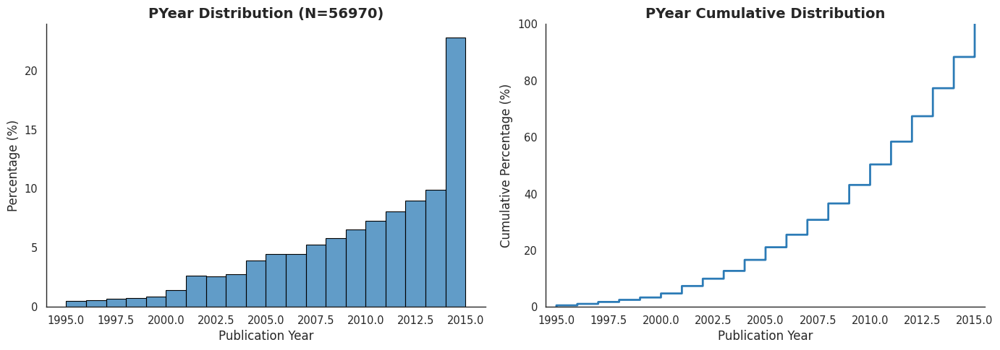

In [93]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 按 paper_numid 去重
unique_papers = panel_df.drop_duplicates(subset="paper_numid")

# 样本数量
N = len(unique_papers)

# 设置Nature风格
sns.set_style("white")
sns.set_context("paper", font_scale=1.2)

# 设置画布：2个图
fig, axes = plt.subplots(1, 2, figsize=(14, 5))  # 横向排列
axes = axes.flatten()

# ---------------- PYear 柱状图 ----------------
sns.histplot(
    unique_papers["PYear"], 
    bins=range(int(unique_papers["PYear"].min()), int(unique_papers["PYear"].max())+1),
    stat="percent",
    kde=False,
    color="#2c7bb6",
    edgecolor="black",
    ax=axes[0]
)
axes[0].set_title(f"PYear Distribution (N={N})", fontsize=14, weight='bold')
axes[0].set_xlabel("Publication Year", fontsize=12)
axes[0].set_ylabel("Percentage (%)", fontsize=12)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ---------------- PYear 累积分布 ----------------
pyear_sorted = np.sort(unique_papers["PYear"])
cdf_pyear = np.arange(1, len(pyear_sorted)+1) / len(pyear_sorted) * 100
axes[1].step(pyear_sorted, cdf_pyear, where='post', color="#2c7bb6", linewidth=2)
axes[1].set_title("PYear Cumulative Distribution", fontsize=14, weight='bold')
axes[1].set_xlabel("Publication Year", fontsize=12)
axes[1].set_ylabel("Cumulative Percentage (%)", fontsize=12)
axes[1].set_xlim(pyear_sorted.min()-0.5, pyear_sorted.max()+0.5)
axes[1].set_ylim(0, 100)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


### 全年份T_PtoR and T_RtoN 分布

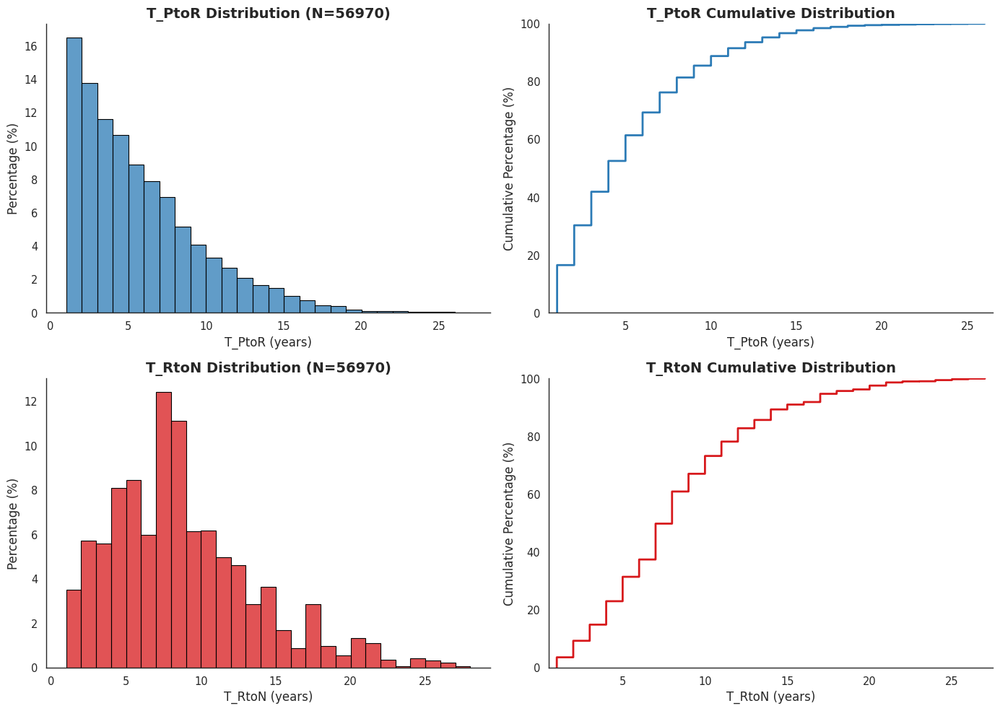

In [94]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 按 paper_numid 去重，只保留一条记录
unique_papers = panel_df.drop_duplicates(subset="paper_numid")

# 样本数量
N = len(unique_papers)

# 设置Nature风格
sns.set_style("white")
sns.set_context("paper", font_scale=1.2)

# 设置画布：两个柱状图 + 两个累积分布曲线
fig, axes = plt.subplots(2, 2, figsize=(14, 10))  # 2x2布局
axes = axes.flatten()  # 方便索引

# ---------------- T_PtoR 柱状图 ----------------
sns.histplot(
    unique_papers["T_PtoR"], 
    bins=range(int(unique_papers["T_PtoR"].min()), int(unique_papers["T_PtoR"].max())+2),
    stat="percent",
    kde=False,
    color="#2c7bb6",
    edgecolor="black",
    ax=axes[0]
)
axes[0].set_title(f"T_PtoR Distribution (N={N})", fontsize=14, weight='bold')
axes[0].set_xlabel("T_PtoR (years)", fontsize=12)
axes[0].set_ylabel("Percentage (%)", fontsize=12)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ---------------- T_PtoR 累积分布 ----------------
t_ptor_sorted = np.sort(unique_papers["T_PtoR"])
cdf_ptor = np.arange(1, len(t_ptor_sorted)+1) / len(t_ptor_sorted) * 100  # 百分比
axes[1].step(t_ptor_sorted, cdf_ptor, where='post', color="#2c7bb6", linewidth=2)
axes[1].set_title("T_PtoR Cumulative Distribution", fontsize=14, weight='bold')
axes[1].set_xlabel("T_PtoR (years)", fontsize=12)
axes[1].set_ylabel("Cumulative Percentage (%)", fontsize=12)
axes[1].set_xlim(t_ptor_sorted.min()-0.5, t_ptor_sorted.max()+0.5)
axes[1].set_ylim(0, 100)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

# ---------------- T_RtoN 柱状图 ----------------
sns.histplot(
    unique_papers["T_RtoN"], 
    bins=range(int(unique_papers["T_RtoN"].min()), int(unique_papers["T_RtoN"].max())+2),
    stat="percent",
    kde=False,
    color="#d7191c",
    edgecolor="black",
    ax=axes[2]
)
axes[2].set_title(f"T_RtoN Distribution (N={N})", fontsize=14, weight='bold')
axes[2].set_xlabel("T_RtoN (years)", fontsize=12)
axes[2].set_ylabel("Percentage (%)", fontsize=12)
axes[2].spines['top'].set_visible(False)
axes[2].spines['right'].set_visible(False)

# ---------------- T_RtoN 累积分布 ----------------
t_rton_sorted = np.sort(unique_papers["T_RtoN"])
cdf_rton = np.arange(1, len(t_rton_sorted)+1) / len(t_rton_sorted) * 100
axes[3].step(t_rton_sorted, cdf_rton, where='post', color="#d7191c", linewidth=2)
axes[3].set_title("T_RtoN Cumulative Distribution", fontsize=14, weight='bold')
axes[3].set_xlabel("T_RtoN (years)", fontsize=12)
axes[3].set_ylabel("Cumulative Percentage (%)", fontsize=12)
axes[3].set_xlim(t_rton_sorted.min()-0.5, t_rton_sorted.max()+0.5)
axes[3].set_ylim(0, 100)
axes[3].spines['top'].set_visible(False)
axes[3].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


### PYear numa numr实验组vs控制组分布（1996-2014）

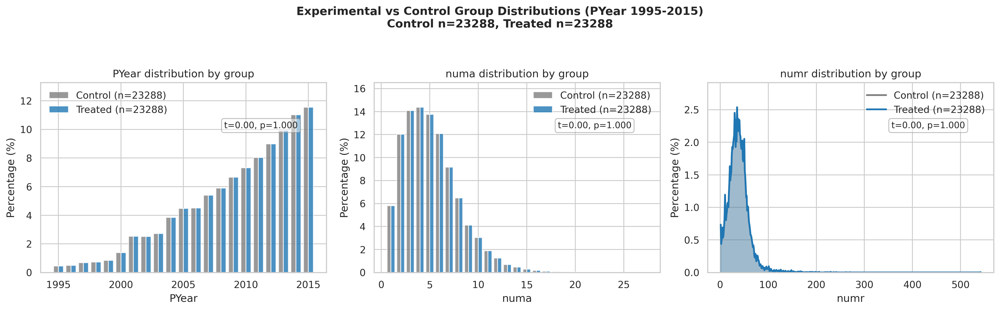

In [160]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import ttest_ind

# 保留 
df = panel_df[(panel_df['PYear'] >= 1995) & (panel_df['PYear'] <= 2015)]

# 对每个 paper_numid 去重，只保留第一条记录
df = df.drop_duplicates(subset="paper_numid")

sns.set(style="whitegrid")
plt.rcParams.update({"font.size": 11})

# 变量列表（现在加上 PYear）
variables = ['PYear', 'numa', 'numr']

# 样本数量
n_control = df[df['group']==0]['paper_numid'].nunique()
n_treated = df[df['group']==1]['paper_numid'].nunique()

fig, axes = plt.subplots(1, 3, figsize=(16, 5), dpi=300)

colors = ['#7f7f7f', '#1f77b4']

for ax, var in zip(axes, variables):
    if var in ['PYear','numa']:   # 用柱状图
        bins = np.arange(df[var].min()-0.5, df[var].max()+1.5, 1)
        max_percent = 0
        for g, color, label in zip([0,1], colors, ['Control','Treated']):
            data = df[df['group']==g][var]
            counts, _ = np.histogram(data, bins=bins)
            counts_percent = counts / counts.sum() * 100
            ax.bar(bins[:-1]+0.5 + (0.2 if g==1 else -0.2), counts_percent, 
                   width=0.4, color=color, alpha=0.8, 
                   label=f"{label} (n={df[df['group']==g]['paper_numid'].nunique()})",
                   edgecolor="white")
            max_percent = max(max_percent, counts_percent.max())
        ax.set_ylim(0, max_percent*1.15)
    else:   # numr 用曲线
        max_percent = 0
        for g, color, label in zip([0,1], colors, ['Control','Treated']):
            data = df[df['group']==g][var]
            counts, bins = np.histogram(data, bins=np.arange(data.min()-0.5, data.max()+1.5, 1))
            counts_percent = counts / counts.sum() * 100
            centers = bins[:-1] + 0.5
            ax.plot(centers, counts_percent, color=color, lw=2,
                    label=f"{label} (n={df[df['group']==g]['paper_numid'].nunique()})")
            ax.fill_between(centers, counts_percent, color=color, alpha=0.3)
            max_percent = max(max_percent, counts_percent.max())
        ax.set_ylim(0, max_percent*1.15)
    
    # t-test
    control = df[df['group']==0][var]
    treated = df[df['group']==1][var]
    t_stat, p_val = ttest_ind(treated, control, equal_var=False)
    ax.text(0.90, 0.75, f"t={t_stat:.2f}, p={p_val:.3f}", 
            transform=ax.transAxes, ha="right", va="bottom",
            fontsize=10, bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="grey", alpha=0.5))

    ax.set_xlabel(var)
    ax.set_ylabel("Percentage (%)")
    ax.set_title(f"{var} distribution by group")
    ax.legend(frameon=False)

plt.suptitle(f"Experimental vs Control Group Distributions (PYear 1995-2015)\n"
             f"Control n={n_control}, Treated n={n_treated}",
             fontsize=13, fontweight="bold")
plt.tight_layout(rect=[0,0,1,0.92])
plt.show()


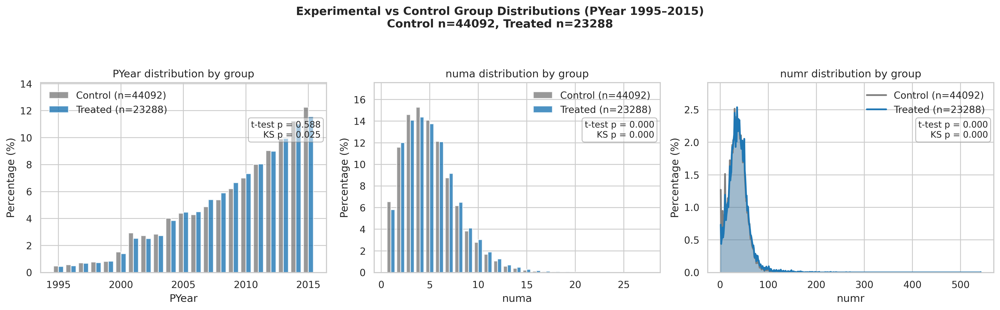

In [163]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import ttest_ind, ks_2samp

# 保留指定年份
df = panel_df[(panel_df['PYear'] >= 1995) & (panel_df['PYear'] <= 2015)]

# 对每个 paper_numid 去重，只保留第一条记录
df = df.drop_duplicates(subset="paper_numid")

sns.set(style="whitegrid")
plt.rcParams.update({"font.size": 11})

# 变量列表
variables = ['PYear', 'numa', 'numr']

# 样本数量
n_control = df[df['group'] == 0]['paper_numid'].nunique()
n_treated = df[df['group'] == 1]['paper_numid'].nunique()

fig, axes = plt.subplots(1, 3, figsize=(16, 5), dpi=300)

colors = ['#7f7f7f', '#1f77b4']

for ax, var in zip(axes, variables):
    if var in ['PYear', 'numa']:   # 用柱状图
        bins = np.arange(df[var].min() - 0.5, df[var].max() + 1.5, 1)
        max_percent = 0
        for g, color, label in zip([0, 1], colors, ['Control', 'Treated']):
            data = df[df['group'] == g][var]
            counts, _ = np.histogram(data, bins=bins)
            counts_percent = counts / counts.sum() * 100
            ax.bar(
                bins[:-1] + 0.5 + (0.2 if g == 1 else -0.2),
                counts_percent,
                width=0.4,
                color=color,
                alpha=0.8,
                label=f"{label} (n={df[df['group']==g]['paper_numid'].nunique()})",
                edgecolor="white"
            )
            max_percent = max(max_percent, counts_percent.max())
        ax.set_ylim(0, max_percent * 1.15)
    else:   # numr 用曲线
        max_percent = 0
        for g, color, label in zip([0, 1], colors, ['Control', 'Treated']):
            data = df[df['group'] == g][var]
            counts, bins = np.histogram(
                data,
                bins=np.arange(data.min() - 0.5, data.max() + 1.5, 1)
            )
            counts_percent = counts / counts.sum() * 100
            centers = bins[:-1] + 0.5
            ax.plot(
                centers,
                counts_percent,
                color=color,
                lw=2,
                label=f"{label} (n={df[df['group']==g]['paper_numid'].nunique()})"
            )
            ax.fill_between(centers, counts_percent, color=color, alpha=0.3)
            max_percent = max(max_percent, counts_percent.max())
        ax.set_ylim(0, max_percent * 1.15)

    # ============================
    # t-test（均值差异）
    # ============================
    control = df[df['group'] == 0][var]
    treated = df[df['group'] == 1][var]
    t_stat, t_p = ttest_ind(treated, control, equal_var=False)

    # ============================
    # KS test（分布差异）
    # ============================
    ks_stat, ks_p = ks_2samp(treated, control)

    # ============================
    # 在图中显示两个检验
    # ============================
    ax.text(
        0.98, 0.80,
        f"t-test p = {t_p:.3f}\nKS p = {ks_p:.3f}",
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=10,
        bbox=dict(
            boxstyle="round,pad=0.3",
            fc="white",
            ec="grey",
            alpha=0.5
        )
    )

    ax.set_xlabel(var)
    ax.set_ylabel("Percentage (%)")
    ax.set_title(f"{var} distribution by group")
    ax.legend(frameon=False)

plt.suptitle(
    f"Experimental vs Control Group Distributions (PYear 1995–2015)\n"
    f"Control n={n_control}, Treated n={n_treated}",
    fontsize=13,
    fontweight="bold"
)

plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()


### T_PtoR and T_RtoN（1996-2014）

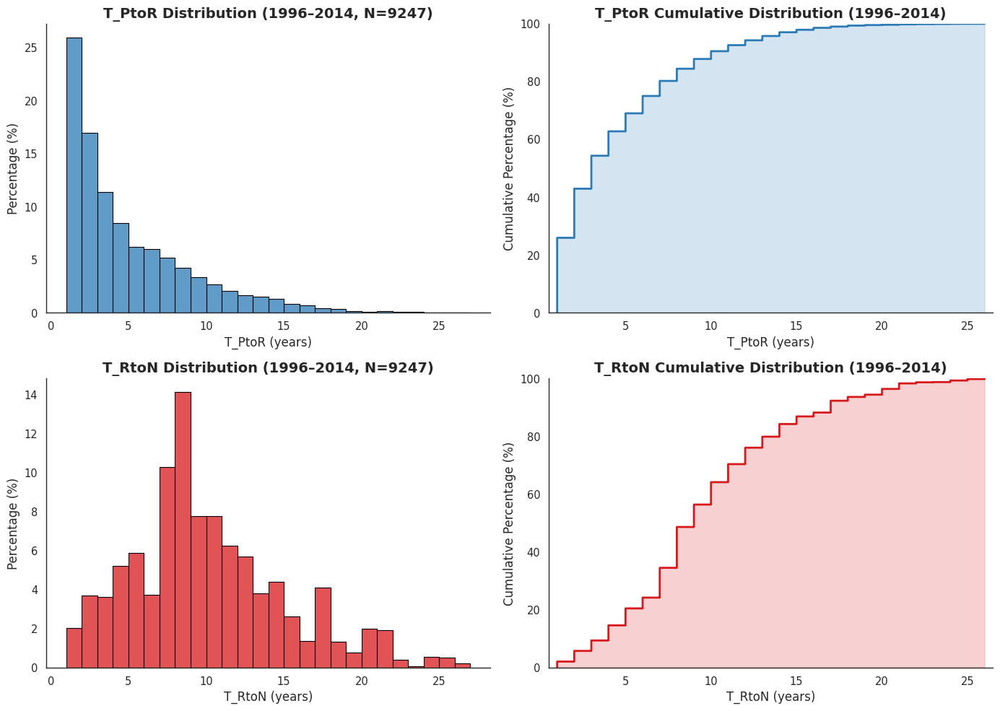

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 按 paper_numid 去重
unique_papers = panel_df.drop_duplicates(subset="paper_numid")

# 仅保留 1995–2015 的子集
subset = unique_papers[(unique_papers["PYear"] >= 1996) & (unique_papers["PYear"] <= 2014)]

# 排除 group == 0 的控制组
subset = subset[subset["group"] != 0]

# 样本数量
N = len(subset)

# 设置Nature风格
sns.set_style("white")
sns.set_context("paper", font_scale=1.2)

# 设置画布：两个柱状图 + 两个累积分布曲线
fig, axes = plt.subplots(2, 2, figsize=(14, 10))  # 2x2布局
axes = axes.flatten()

# ---------------- T_PtoR 柱状图 ----------------
sns.histplot(
    subset["T_PtoR"], 
    bins=range(int(subset["T_PtoR"].min()), int(subset["T_PtoR"].max())+2),
    stat="percent",
    kde=False,
    color="#2c7bb6",
    edgecolor="black",
    ax=axes[0]
)
axes[0].set_title(f"T_PtoR Distribution (1996–2014, N={N})", fontsize=14, weight='bold')
axes[0].set_xlabel("T_PtoR (years)", fontsize=12)
axes[0].set_ylabel("Percentage (%)", fontsize=12)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ---------------- T_PtoR 累积分布 ----------------
t_ptor_sorted = np.sort(subset["T_PtoR"].dropna())
cdf_ptor = np.arange(1, len(t_ptor_sorted)+1) / len(t_ptor_sorted) * 100
axes[1].step(t_ptor_sorted, cdf_ptor, where='post', color="#2c7bb6", linewidth=2)
axes[1].fill_between(t_ptor_sorted, 0, cdf_ptor, step='post', color="#2c7bb6", alpha=0.2)
axes[1].set_title("T_PtoR Cumulative Distribution (1996–2014)", fontsize=14, weight='bold')
axes[1].set_xlabel("T_PtoR (years)", fontsize=12)
axes[1].set_ylabel("Cumulative Percentage (%)", fontsize=12)
axes[1].set_xlim(t_ptor_sorted.min()-0.5, t_ptor_sorted.max()+0.5)
axes[1].set_ylim(0, 100)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

# ---------------- T_RtoN 柱状图 ----------------
sns.histplot(
    subset["T_RtoN"], 
    bins=range(int(subset["T_RtoN"].min()), int(subset["T_RtoN"].max())+2),
    stat="percent",
    kde=False,
    color="#d7191c",
    edgecolor="black",
    ax=axes[2]
)
axes[2].set_title(f"T_RtoN Distribution (1996–2014, N={N})", fontsize=14, weight='bold')
axes[2].set_xlabel("T_RtoN (years)", fontsize=12)
axes[2].set_ylabel("Percentage (%)", fontsize=12)
axes[2].spines['top'].set_visible(False)
axes[2].spines['right'].set_visible(False)

# ---------------- T_RtoN 累积分布 ----------------
t_rton_sorted = np.sort(subset["T_RtoN"].dropna())
cdf_rton = np.arange(1, len(t_rton_sorted)+1) / len(t_rton_sorted) * 100
axes[3].step(t_rton_sorted, cdf_rton, where='post', color="#d7191c", linewidth=2)
axes[3].fill_between(t_rton_sorted, 0, cdf_rton, step='post', color="#d7191c", alpha=0.2)
axes[3].set_title("T_RtoN Cumulative Distribution (1996–2014)", fontsize=14, weight='bold')
axes[3].set_xlabel("T_RtoN (years)", fontsize=12)
axes[3].set_ylabel("Cumulative Percentage (%)", fontsize=12)
axes[3].set_xlim(t_rton_sorted.min()-0.5, t_rton_sorted.max()+0.5)
axes[3].set_ylim(0, 100)
axes[3].spines['top'].set_visible(False)
axes[3].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


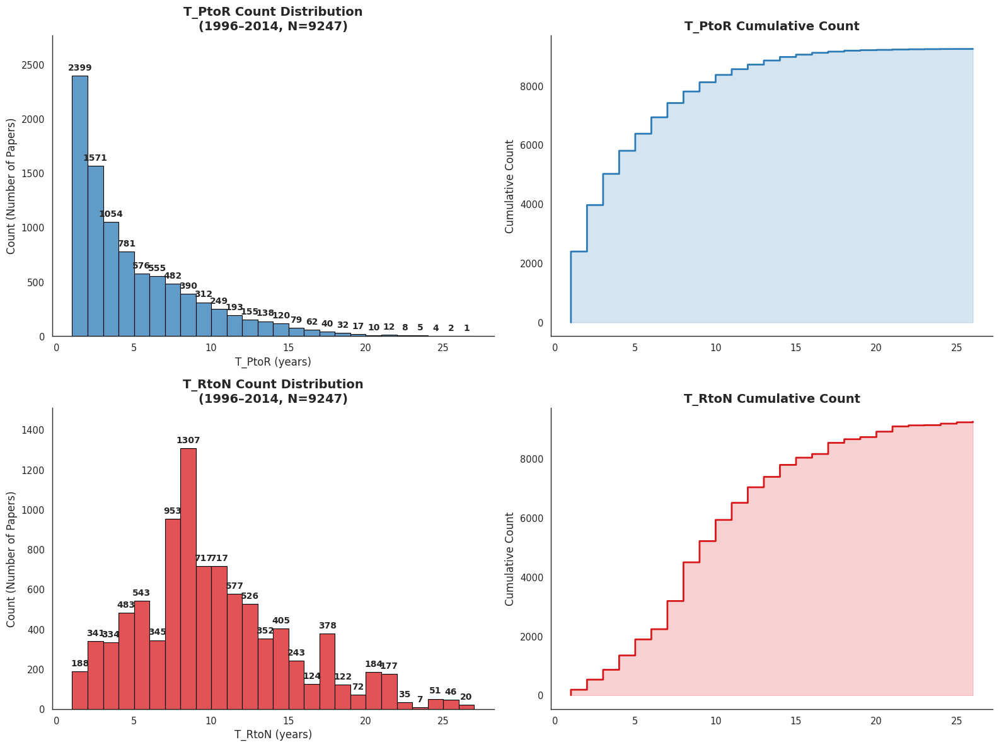

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. 数据预处理（保持与原逻辑一致）
# 按 paper_numid 去重，确保每篇论文只计算一次
unique_papers = panel_df.drop_duplicates(subset="paper_numid")

# 仅保留 1995–2015 的子集
subset = unique_papers[(unique_papers["PYear"] >= 1996) & (unique_papers["PYear"] <= 2014)]

# 排除 group == 0 的控制组
subset = subset[subset["group"] != 0].copy()

# 2. 设置绘图风格
sns.set_style("white")
sns.set_context("paper", font_scale=1.2)

# 创建 2x2 画布
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

def plot_with_counts(ax, data_col, title, color):
    """
    辅助函数：绘制带数量标签的柱状图
    """
    # 计算每个年份出现的频数
    counts = subset[data_col].value_counts().sort_index()
    x_values = counts.index
    y_values = counts.values
    
    # 绘制柱状图 (stat="count" 显示具体数量)
    sns.histplot(
        subset[data_col], 
        bins=range(int(subset[data_col].min()), int(subset[data_col].max()) + 2),
        stat="count",
        color=color,
        edgecolor="black",
        ax=ax
    )
    
    # 在柱子上方添加具体的数量标注
    for p in ax.patches:
        height = p.get_height()
        if height > 0: # 仅对大于0的柱子标注
            ax.annotate(f'{int(height)}', 
                        (p.get_x() + p.get_width() / 2., height), 
                        ha='center', va='center', 
                        xytext=(0, 9), 
                        textcoords='offset points',
                        fontsize=10, 
                        fontweight='bold')

    ax.set_title(title, fontsize=14, weight='bold')
    ax.set_xlabel(f"{data_col} (years)", fontsize=12)
    ax.set_ylabel("Count (Number of Papers)", fontsize=12)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    # 适当调高y轴上限以防标注超出
    ax.set_ylim(0, ax.get_ylim()[1] * 1.1)

# ---------------- 1. T_PtoR 数量分布 ----------------
plot_with_counts(axes[0], "T_PtoR", f"T_PtoR Count Distribution\n(1996–2014, N={len(subset)})", "#2c7bb6")

# ---------------- 2. T_PtoR 累积数量 ----------------
t_ptor_sorted = np.sort(subset["T_PtoR"].dropna())
cum_counts_ptor = np.arange(1, len(t_ptor_sorted) + 1)
axes[1].step(t_ptor_sorted, cum_counts_ptor, where='post', color="#2c7bb6", linewidth=2)
axes[1].fill_between(t_ptor_sorted, 0, cum_counts_ptor, step='post', color="#2c7bb6", alpha=0.2)
axes[1].set_title("T_PtoR Cumulative Count", fontsize=14, weight='bold')
axes[1].set_ylabel("Cumulative Count", fontsize=12)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

# ---------------- 3. T_RtoN 数量分布 ----------------
plot_with_counts(axes[2], "T_RtoN", f"T_RtoN Count Distribution\n(1996–2014, N={len(subset)})", "#d7191c")

# ---------------- 4. T_RtoN 累积数量 ----------------
t_rton_sorted = np.sort(subset["T_RtoN"].dropna())
cum_counts_rton = np.arange(1, len(t_rton_sorted) + 1)
axes[3].step(t_rton_sorted, cum_counts_rton, where='post', color="#d7191c", linewidth=2)
axes[3].fill_between(t_rton_sorted, 0, cum_counts_rton, step='post', color="#d7191c", alpha=0.2)
axes[3].set_title("T_RtoN Cumulative Count", fontsize=14, weight='bold')
axes[3].set_ylabel("Cumulative Count", fontsize=12)
axes[3].spines['top'].set_visible(False)
axes[3].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

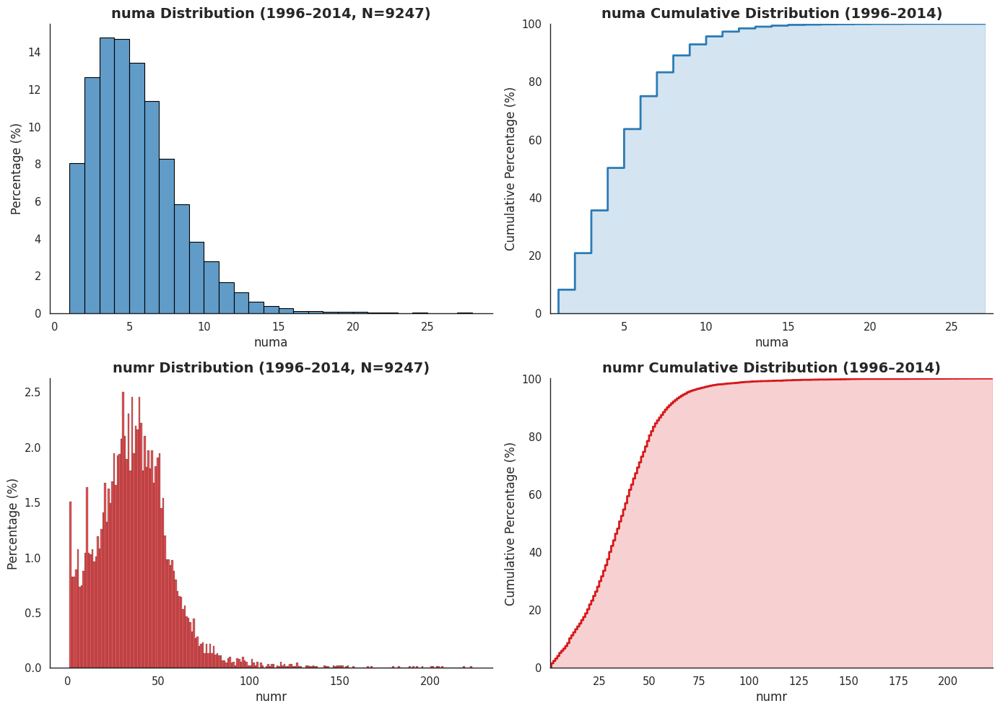

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 按 paper_numid 去重
unique_papers = panel_df.drop_duplicates(subset="paper_numid")

# 仅保留 2000–2015 的子集
subset = unique_papers[(unique_papers["PYear"] >= 1996) & (unique_papers["PYear"] <= 2014)]

# 筛选实验组数据（假设实验组的 group 值为 1）
subset_experiment = subset[subset["group"] == 1]

# 样本数量
N = len(subset_experiment)

# 设置Nature风格
sns.set_style("white")
sns.set_context("paper", font_scale=1.2)

# 设置画布：两个柱状图 + 两个累积分布曲线
fig, axes = plt.subplots(2, 2, figsize=(14, 10))  # 2x2布局
axes = axes.flatten()

# ---------------- numa 柱状图 ----------------
sns.histplot(
    subset_experiment["numa"], 
    bins=range(int(subset_experiment["numa"].min()), int(subset_experiment["numa"].max())+2),
    stat="percent",
    kde=False,
    color="#2c7bb6",
    edgecolor="black",
    ax=axes[0]
)
axes[0].set_title(f"numa Distribution (1996–2014, N={N})", fontsize=14, weight='bold')
axes[0].set_xlabel("numa", fontsize=12)
axes[0].set_ylabel("Percentage (%)", fontsize=12)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ---------------- numa 累积分布 ----------------
numa_sorted = np.sort(subset_experiment["numa"].dropna())
cdf_numa = np.arange(1, len(numa_sorted)+1) / len(numa_sorted) * 100
axes[1].step(numa_sorted, cdf_numa, where='post', color="#2c7bb6", linewidth=2)
axes[1].fill_between(numa_sorted, 0, cdf_numa, step='post', color="#2c7bb6", alpha=0.2)
axes[1].set_title("numa Cumulative Distribution (1996–2014)", fontsize=14, weight='bold')
axes[1].set_xlabel("numa", fontsize=12)
axes[1].set_ylabel("Cumulative Percentage (%)", fontsize=12)
axes[1].set_xlim(numa_sorted.min()-0.5, numa_sorted.max()+0.5)
axes[1].set_ylim(0, 100)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

# ---------------- numr 柱状图 ----------------
sns.histplot(
    subset_experiment["numr"], 
    bins=range(int(subset_experiment["numr"].min()), int(subset_experiment["numr"].max())+2),
    stat="percent",
    kde=False,
    color="#d7191c",
    edgecolor="black",
    ax=axes[2]
)
axes[2].set_title(f"numr Distribution (1996–2014, N={N})", fontsize=14, weight='bold')
axes[2].set_xlabel("numr", fontsize=12)
axes[2].set_ylabel("Percentage (%)", fontsize=12)
axes[2].spines['top'].set_visible(False)
axes[2].spines['right'].set_visible(False)

# ---------------- numr 累积分布 ----------------
numr_sorted = np.sort(subset_experiment["numr"].dropna())
cdf_numr = np.arange(1, len(numr_sorted)+1) / len(numr_sorted) * 100
axes[3].step(numr_sorted, cdf_numr, where='post', color="#d7191c", linewidth=2)
axes[3].fill_between(numr_sorted, 0, cdf_numr, step='post', color="#d7191c", alpha=0.2)
axes[3].set_title("numr Cumulative Distribution (1996–2014)", fontsize=14, weight='bold')
axes[3].set_xlabel("numr", fontsize=12)
axes[3].set_ylabel("Cumulative Percentage (%)", fontsize=12)
axes[3].set_xlim(numr_sorted.min()-0.5, numr_sorted.max()+0.5)
axes[3].set_ylim(0, 100)
axes[3].spines['top'].set_visible(False)
axes[3].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


### 回归结果

#### 各个回归结果汇总

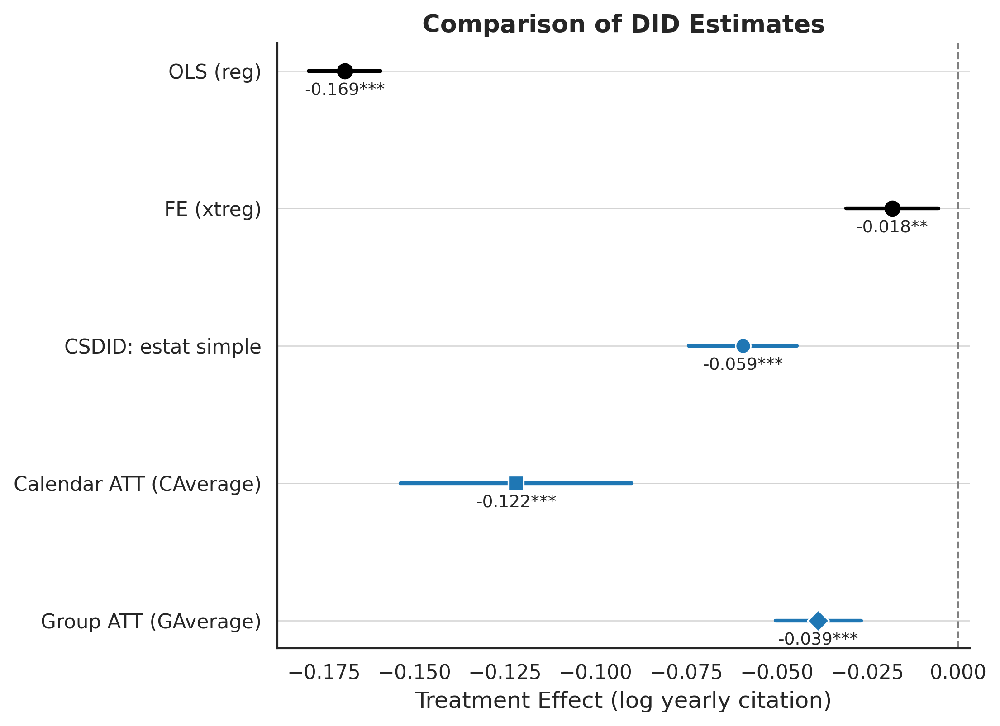

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# 方法与结果
methods = [
    "OLS (reg)",
    "FE (xtreg)",
    "estat simple",
    "Calendar ATT (CAverage)",
    "Group ATT (GAverage)"
]

# 根据你提供的新回归结果更新
coef = [-0.1692007, -0.0181367, -0.0593668, -0.1219392, -0.0385732]
lower = [-0.1791323, -0.0309032, -0.0743372, -0.1538317, -0.0503819]
upper = [-0.1592691, -0.0053702, -0.0443964, -0.0900467, -0.0267645]

# p 值
p_values = [0.000, 0.005, 0.000, 0.000, 0.000]

# 根据 p 值生成显著性符号
def stars(p):
    if p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return ""

sig_labels = [stars(p) for p in p_values]

# y 轴
y = np.arange(len(methods))

plt.figure(figsize=(7.5, 5.5), dpi=300)

# 背景横线
for i in range(len(methods)):
    plt.axhline(y[i], color="lightgrey", lw=0.6, zorder=1)

# 分组颜色
colors = {
    "Traditional DID": "black",
    "CSDID": "#1f77b4"
}

# 不同 marker 给 CSDID 三个方法
markers = ["o", "s", "D"]

# 绘制
for i, method in enumerate(methods):
    if i < 2:  # Traditional DID
        group = "Traditional DID"
        plt.plot([lower[i], upper[i]], [y[i], y[i]], color=colors[group], lw=2)
        plt.scatter(coef[i], y[i], color=colors[group], s=60, zorder=3, marker="o")
    else:      # CSDID
        group = "CSDID"
        plt.plot([lower[i], upper[i]], [y[i], y[i]], color=colors[group], lw=2)
        plt.scatter(coef[i], y[i], color=colors[group], s=65, zorder=3,
                    marker=markers[i-2], edgecolor="white", linewidth=0.8)
    
    # 标注数值和显著性 —— 放在点下方
    label = f"{coef[i]:.3f}{sig_labels[i]}"
    plt.text(coef[i], y[i] + 0.08, label, ha="center", va="top", fontsize=9)

# 参考线
plt.axvline(0, color="grey", linestyle="--", lw=1)

# Y 轴标签
yticks = [
    "OLS (reg)",
    "FE (xtreg)",
    "CSDID: estat simple",
    "Calendar ATT (CAverage)",
    "Group ATT (GAverage)"
]
plt.yticks(y, yticks, fontsize=10.5)

# 反转顺序
plt.gca().invert_yaxis()

# X 轴 & 标题
plt.xlabel("Treatment Effect (log yearly citation)", fontsize=12)
plt.title("Comparison of DID Estimates", fontsize=13, weight="bold")

# 去掉上右边框
for spine in ["top", "right"]:
    plt.gca().spines[spine].set_visible(False)

plt.tight_layout()
plt.show()


#### CSDID  estat calendar

/tmp/ipykernel_969452/4161156173.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("coolwarm", len(periods)-1)


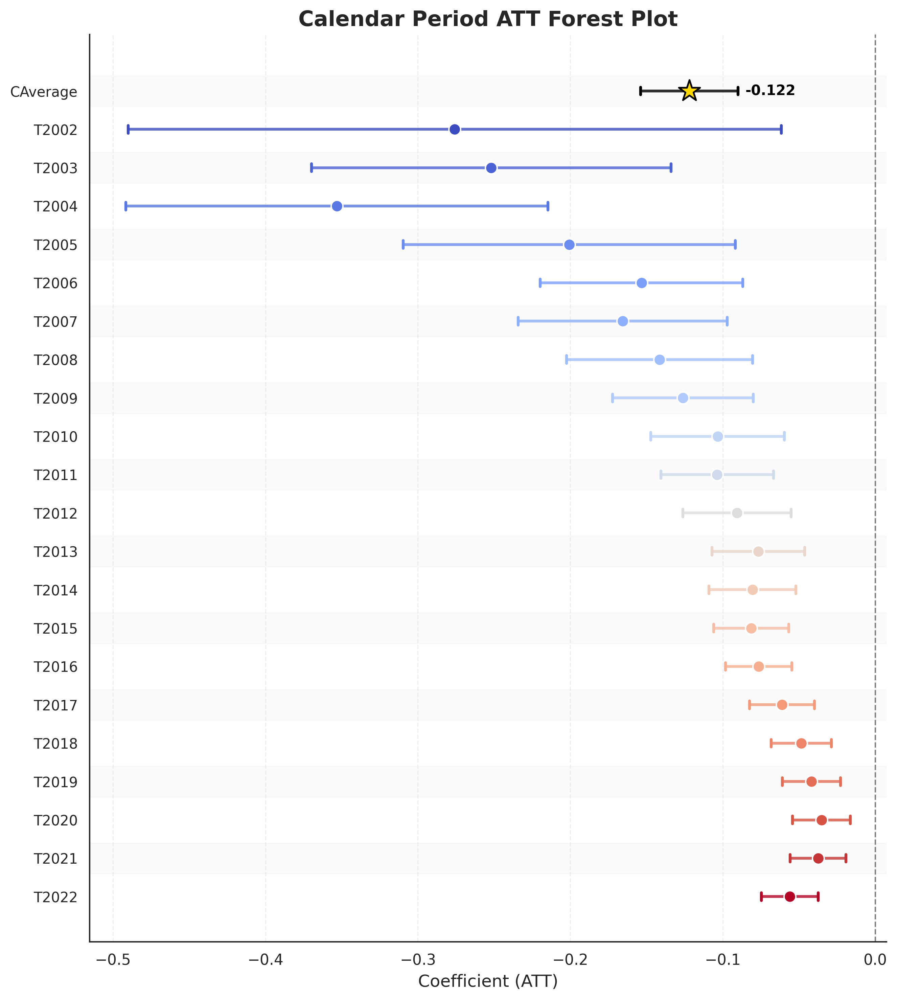

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm

# 数据
periods = ["CAverage","T2002","T2003","T2004","T2005","T2006","T2007","T2008","T2009",
           "T2010","T2011","T2012","T2013","T2014","T2015","T2016","T2017","T2018",
           "T2019","T2020","T2021","T2022"]

coef = [-0.1219392, -0.275808, -0.2518364, -0.3531409, -0.2006371, -0.1533085,
        -0.1656154, -0.1414095, -0.1261374, -0.1033726, -0.1036347, -0.0906548,
        -0.0766698, -0.0804833, -0.0812978, -0.0764522, -0.0611677, -0.048497,
        -0.0418476, -0.0352692, -0.0374532, -0.0560295]

lower = [-0.1538317, -0.4900508, -0.369703, -0.4916148, -0.3095134, -0.2198415,
         -0.2341362, -0.2024036, -0.1723221, -0.1472648, -0.1405508, -0.1260662,
         -0.1070889, -0.1089603, -0.106005, -0.0982564, -0.0824235, -0.068325,
         -0.0610133, -0.0542872, -0.0558128, -0.0746239]

upper = [-0.0900467, -0.0615652, -0.1339697, -0.2146669, -0.0917607, -0.0867755,
         -0.0970947, -0.0804155, -0.0799527, -0.0594803, -0.0667186, -0.0552435,
         -0.0462507, -0.0520062, -0.0565906, -0.0546481, -0.0399119, -0.028669,
         -0.0226819, -0.0162513, -0.0190937, -0.0374352]

y = np.arange(len(periods))

# 渐变颜色：年份用 coolwarm，CAverage 黑色
cmap = cm.get_cmap("coolwarm", len(periods)-1)
colors = ["black"] + [cmap(i) for i in range(len(periods)-1)]

plt.figure(figsize=(9, 10), dpi=300)

# 背景交替灰色横带
for i in range(len(periods)):
    if i % 2 == 0:
        plt.axhspan(i-0.4, i+0.4, color="lightgrey", alpha=0.1)

# 绘制森林图
for i in range(len(periods)):
    # CI 区间
    plt.plot([lower[i], upper[i]], [y[i], y[i]], color=colors[i], lw=2, alpha=0.8, solid_capstyle="round")
    plt.plot([lower[i], lower[i]], [y[i]-0.1, y[i]+0.1], color=colors[i], lw=2)
    plt.plot([upper[i], upper[i]], [y[i]-0.1, y[i]+0.1], color=colors[i], lw=2)

    # 中心点：CAverage 用五角星，其余用圆点
    if i == 0:
        plt.scatter(coef[i], y[i], marker="*", color="gold", s=250, edgecolor="black", linewidth=1.2, zorder=3)
        plt.text(upper[i]+0.005, y[i], f"{coef[i]:.3f}", va="center", fontsize=10, color="black", fontweight="bold")
    else:
        plt.scatter(coef[i], y[i], color=colors[i], s=70, edgecolor="white", linewidth=1, zorder=3)

# 参考线
plt.axvline(0, color="grey", linestyle="--", lw=1)

# 坐标轴 & 标签
plt.yticks(y, periods, fontsize=10)
plt.gca().invert_yaxis()
plt.xlabel("Coefficient (ATT)", fontsize=12)
plt.title("Calendar Period ATT Forest Plot", fontsize=15, fontweight="bold")

# 去掉上右边框
for spine in ["top", "right"]:
    plt.gca().spines[spine].set_visible(False)

plt.grid(axis="x", linestyle="--", alpha=0.3)
plt.tight_layout()
plt.show()


#### CSDID  estat group

/tmp/ipykernel_969452/2912690599.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("coolwarm", len(periods)-1)


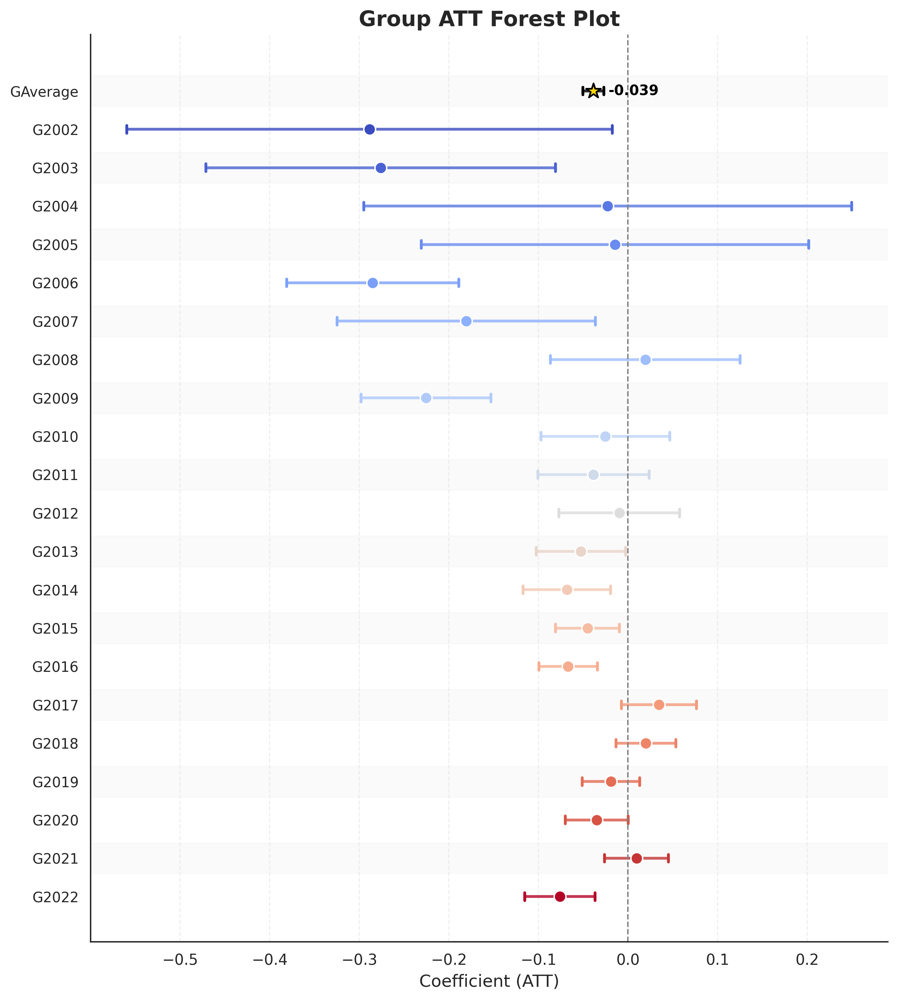

In [14]:
import matplotlib.pyplot as plt 
import numpy as np
import matplotlib.cm as cm

# 数据
periods = ["GAverage","G2002","G2003","G2004","G2005","G2006","G2007","G2008","G2009",
           "G2010","G2011","G2012","G2013","G2014","G2015","G2016","G2017","G2018",
           "G2019","G2020","G2021","G2022"]

coef = [-0.0385732, -0.2885247, -0.2761582, -0.0225915, -0.014513, -0.2849595,
        -0.1806534, 0.0194434, -0.2252967, -0.0252852, -0.0385195, -0.0097146,
        -0.0526426, -0.0681202, -0.045151, -0.0667936, 0.0346947, 0.0200061,
        -0.0191378, -0.0348526, 0.0095841, -0.0761414]

lower = [-0.0503819, -0.5594404, -0.4712406, -0.2949181, -0.2308345, -0.381097,
         -0.3247757, -0.0863669, -0.2977721, -0.0972799, -0.1006526, -0.0771336,
         -0.1024983, -0.1170367, -0.0808226, -0.0993883, -0.0071377, -0.0134733,
         -0.0512609, -0.0699801, -0.026101, -0.115398]

upper = [-0.0267645, -0.017609, -0.0810757, 0.2497352, 0.2018085, -0.1888219,
         -0.0365311, 0.1252537, -0.1528214, 0.0467095, 0.0236136, 0.0577043,
         -0.0027869, -0.0192038, -0.0094793, -0.0341989, 0.076527, 0.0534855,
         0.0129854, 0.0002749, 0.0452692, -0.0368848]

y = np.arange(len(periods))

# 渐变颜色：年份用 coolwarm，GAverage 黑色
cmap = cm.get_cmap("coolwarm", len(periods)-1)
colors = ["black"] + [cmap(i) for i in range(len(periods)-1)]

plt.figure(figsize=(9, 10), dpi=300)

# 背景交替灰色横带
for i in range(len(periods)):
    if i % 2 == 0:
        plt.axhspan(i-0.4, i+0.4, color="lightgrey", alpha=0.1)

# 绘制森林图
for i in range(len(periods)):
    # CI 区间
    plt.plot([lower[i], upper[i]], [y[i], y[i]], color=colors[i], lw=2, alpha=0.8, solid_capstyle="round")
    plt.plot([lower[i], lower[i]], [y[i]-0.1, y[i]+0.1], color=colors[i], lw=2)
    plt.plot([upper[i], upper[i]], [y[i]-0.1, y[i]+0.1], color=colors[i], lw=2)

    # 中心点：GAverage 用五角星，其余用圆点
    if i == 0:
        plt.scatter(coef[i], y[i], marker="*", color="gold", s=120, edgecolor="black", linewidth=1.2, zorder=3)
        plt.text(upper[i]+0.005, y[i], f"{coef[i]:.3f}", va="center", fontsize=10, color="black", fontweight="bold")
    else:
        plt.scatter(coef[i], y[i], color=colors[i], s=70, edgecolor="white", linewidth=1, zorder=3)

# 参考线
plt.axvline(0, color="grey", linestyle="--", lw=1)

# 坐标轴 & 标签
plt.yticks(y, periods, fontsize=10)
plt.gca().invert_yaxis()
plt.xlabel("Coefficient (ATT)", fontsize=12)
plt.title("Group ATT Forest Plot", fontsize=15, fontweight="bold")

# 去掉上右边框
for spine in ["top", "right"]:
    plt.gca().spines[spine].set_visible(False)

plt.grid(axis="x", linestyle="--", alpha=0.3)
plt.tight_layout()
plt.show()


### event研究（-2，12）

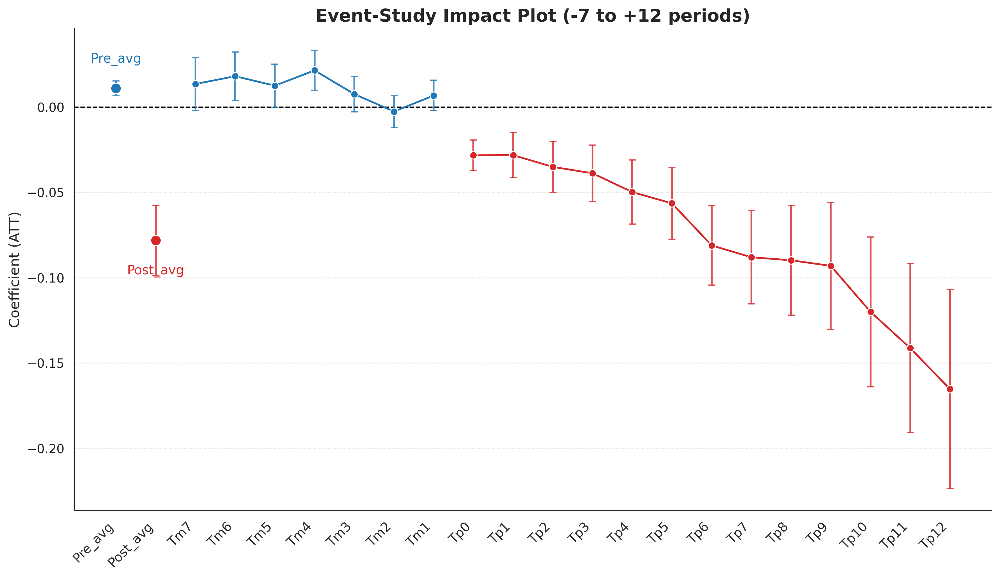

In [15]:
import matplotlib.pyplot as plt
import numpy as np

# 期数
periods = ["Pre_avg", "Post_avg", "Tm7","Tm6","Tm5","Tm4","Tm3","Tm2","Tm1",
           "Tp0","Tp1","Tp2","Tp3","Tp4","Tp5","Tp6","Tp7","Tp8","Tp9","Tp10","Tp11","Tp12"]

# 系数
coef = [0.0111031, -0.0780492, 0.0135527, 0.0181413, 0.0125858, 0.0215325, 0.0076681, -0.0025736, 0.0068151,
        -0.0282323, -0.0281364, -0.0350136, -0.0387556, -0.0497762, -0.0563963, -0.081051, -0.0879935,
        -0.0897532, -0.093044, -0.1200177, -0.1412251, -0.1652453]

# 置信区间
lower = [0.0068588, -0.0985509, -0.0019547, 0.0040278, -0.0000987, 0.0098567, -0.0027128, -0.0119935, -0.0022029,
         -0.037218, -0.0414135, -0.0498676, -0.0552987, -0.0686096, -0.0774359, -0.104273, -0.1153824,
         -0.1218363, -0.1303267, -0.1639901, -0.1907975, -0.2235686]

upper = [0.0153474, -0.0575475, 0.0290601, 0.0322547, 0.0252702, 0.0332083, 0.018049, 0.0068462, 0.0158331,
         -0.0192466, -0.0148593, -0.0201595, -0.0222124, -0.0309427, -0.0353567, -0.0578289, -0.0606046,
         -0.05767, -0.0557613, -0.0760453, -0.0916528, -0.106922]

x = np.arange(len(periods))

# 颜色
pre_color = "#1f77b4"   # 深蓝
post_color = "#d62728"  # 深红

plt.figure(figsize=(12, 7), dpi=300)
plt.axhline(0, color="black", linestyle="--", linewidth=1)

# 画线条（趋势）
plt.plot(x[2:9], coef[2:9], color=pre_color, lw=1.5)   # Tm -7到-1
plt.plot(x[9:], coef[9:], color=post_color, lw=1.5)    # Tp 0到12

# 效应点 + 置信区间
for i, label in enumerate(periods):
    color = pre_color if ("Tm" in label or label=="Pre_avg") else post_color
    size = 80 if label in ["Pre_avg", "Post_avg"] else 40
    
    plt.errorbar(x[i], coef[i],
                 yerr=[[coef[i]-lower[i]], [upper[i]-coef[i]]],
                 fmt='o', color=color, markersize=0, capsize=3, lw=1.5, alpha=0.8)
    plt.scatter(x[i], coef[i], color=color, s=size, edgecolor="white", zorder=3)

# 注释关键点
plt.text(x[0], coef[0]+0.015, "Pre_avg", color=pre_color, fontsize=11, ha="center")
plt.text(x[1], coef[1]-0.02, "Post_avg", color=post_color, fontsize=11, ha="center")

# 美化
plt.xticks(x, periods, rotation=45, ha="right", fontsize=11)
plt.ylabel("Coefficient (ATT)", fontsize=12)
plt.title("Event-Study Impact Plot (-7 to +12 periods)", fontsize=15, fontweight="bold")

# 优雅风格：去边框 + 添加网格
for spine in ["top", "right"]:
    plt.gca().spines[spine].set_visible(False)

plt.grid(axis="y", linestyle="--", alpha=0.4)

plt.tight_layout()
plt.show()


## 普通DID回归/因变量log_yearlycitation

## 普通DID回归/因变量yearlycitation

## Eventstudy

# 模块（七）异质性 （26年改进版）

## 一、撤稿原因

### 数据导入

In [57]:
#导入未进行异质性变量匹配的数据
#panel_df 是一个包含实验组和控制组的完整数据集
panel_df = pd.read_csv("/Data4/yutao_wen/26.1.30/DOM_0.4_1x1_95to15.csv")

In [58]:
#撤稿论文信息原始数据
original_file2 = '/Data4/yutao_wen/matched_output2.csv'
df_retrapapers = pd.read_csv(original_file2)

In [59]:
#目标论文与撤稿论文对应关系
df_containretra3 = pd.read_csv("/Data4/yutao_wen/25.10.12/df_containretra3.csv")

### 数据基本格式处理

In [60]:
"""
reference_ids_gather: 所有参考文献的集合（tuple形式）

reference_ids: 当前 id 下最早 RYear 的那一篇论文

RJournal_id_gather: 所有期刊 id 的集合

RJournal_id: 与上面那篇最早论文对应的期刊 id

Num_Retra: 撤稿数量
 """
#合并的列为 _gather（reference_ids_gather, RJournal_id_gather）
#同时新增两列：
#reference_ids：每个 id 下 最早 RYear 对应的那篇论文的 reference_id
#RJournal_id：上面那篇论文对应的 RJournal_id
# Step 1: 去掉 RYear-Year 列
if 'RYear-Year' in df_containretra3.columns:
    df_containretra3 = df_containretra3.drop(columns=['RYear-Year'])

# Step 2: 定义聚合函数
agg_dict = {
    'reference_ids': lambda x: tuple(x),       # 所有 reference_ids 的集合
    'Year': 'first',
    'Journal_id': 'first',
    'RPYear': 'first',
    'RYear': 'min',                            # 最早的 RYear
    'RJournal_id': lambda x: tuple(x),         # 所有 RJournal_id 的集合
}

# Step 3: 按 id 聚合
df_merged = df_containretra3.groupby('id', as_index=False).agg(agg_dict)

# Step 4: 重命名集合列
df_merged = df_merged.rename(columns={
    'reference_ids': 'reference_ids_gather',
    'RJournal_id': 'RJournal_id_gather'
})

# Step 5: 找出最早 RYear 对应的 reference_id 与 RJournal_id
# 方法：在原始数据中按 id、RYear 排序后取最早一条
df_first = (
    df_containretra3.sort_values(['id', 'RYear'])
    .groupby('id', as_index=False)
    .first()[['id', 'reference_ids', 'RJournal_id']]
)

# Step 6: 合并回 df_merged，新增 reference_ids 和 RJournal_id 两列
df_merged = df_merged.merge(df_first, on='id', how='left', suffixes=('', '_first'))

# Step 7: 增加 Num_Retra 列
df_merged['Num_Retra'] = df_merged['reference_ids_gather'].apply(len)

# Step 8: 可选——调整列顺序，让结构更清晰
cols = [
    'id', 'Num_Retra', 'reference_ids_gather', 'reference_ids', 
    'RJournal_id_gather', 'RJournal_id', 'RYear',
    'Year', 'Journal_id', 'RPYear'
]
df_merged = df_merged[[c for c in cols if c in df_merged.columns]]


### 两步Merge

In [61]:
#调试过后合适的面板数据
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,numr,journal_id,SelfRetra,pair,Num_Retra,paper_numid
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,1,89,1029717,0,1,1,1
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,1,89,1029717,0,1,1,1
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,1,89,1029717,0,1,1,1
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,1,89,1029717,0,1,1,1
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,1,89,1029717,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,2,3,1023000,0,45059,0,90118
631986,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,2,3,1023000,0,45059,0,90118
631987,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,2,3,1023000,0,45059,0,90118
631988,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,2,3,1023000,0,45059,0,90118


In [62]:
#目标论文与撤稿论文对应关系
df_merged

,id,Num_Retra,reference_ids_gather,reference_ids,RJournal_id_gather,RJournal_id,RYear,Year,Journal_id,RPYear
0,pub.1000000164,1,"(pub.1010898888,)",pub.1010898888,"(jour.1030105,)",jour.1030105,2014.0,2013.0,jour.1412994,2012.0
1,pub.1000000166,1,"(pub.1018478241,)",pub.1018478241,"(jour.1017429,)",jour.1017429,2009.0,2008.0,jour.1103555,2003.0
2,pub.1000000280,2,"(pub.1047817620, pub.1008130062)",pub.1047817620,"(jour.1346339, jour.1346339)",jour.1346339,2006.0,2005.0,jour.1102504,2004.0
3,pub.1000000321,1,"(pub.1007963239,)",pub.1007963239,"(jour.1137177,)",jour.1137177,2021.0,2014.0,jour.1052836,2011.0
4,pub.1000000694,1,"(pub.1076569140,)",pub.1076569140,"(jour.1077134,)",jour.1077134,2010.0,2006.0,jour.1029717,2003.0
...,...,...,...,...,...,...,...,...,...,...
259591,pub.1166111640,1,"(pub.1101698676,)",pub.1101698676,"(jour.1095895,)",jour.1095895,2022.0,2022.0,jour.1424534,2018.0
259592,pub.1166136474,1,"(pub.1070819411,)",pub.1070819411,"(jour.1017902,)",jour.1017902,2020.0,2001.0,jour.1086802,1995.0
259593,pub.1166220733,1,"(pub.1138169865,)",pub.1138169865,"(jour.1050238,)",jour.1050238,2022.0,2022.0,jour.1159814,2023.0
259594,pub.1166368507,2,"(pub.1001834054, pub.1010536182)",pub.1001834054,"(jour.1082971, jour.1019114)",jour.1082971,2018.0,2017.0,jour.1017429,2011.0


In [63]:
# Step 1: 检查两边的键
# 确保 id 与 paper_id 的类型一致（否则 merge 可能出错）
panel_df['paper_id'] = panel_df['paper_id'].astype(str)
df_merged['id'] = df_merged['id'].astype(str)

# Step 2: 只保留要合并的列
merge_cols = ['id', 'reference_ids', 'RJournal_id']
df_merge_subset = df_merged[merge_cols]

# Step 3: 合并（左连接，保留 panel_df 全部）
panel_df = panel_df.merge(
    df_merge_subset,
    how='left',
    left_on='paper_id',
    right_on='id'
)

# Step 4: 合并后删除重复的 id 列
panel_df = panel_df.drop(columns=['id'])

# Step 5: 检查匹配结果（可选）
print(panel_df[['paper_id', 'Num_Retra', 'reference_ids', 'RJournal_id']].head())


         paper_id  Num_Retra   reference_ids   RJournal_id
0  pub.1000000694          1  pub.1076569140  jour.1077134
1  pub.1000000694          1  pub.1076569140  jour.1077134
2  pub.1000000694          1  pub.1076569140  jour.1077134
3  pub.1000000694          1  pub.1076569140  jour.1077134
4  pub.1000000694          1  pub.1076569140  jour.1077134


In [64]:
# -----------------------------
# Step 0: 确保键类型一致
# -----------------------------
panel_df['reference_ids'] = panel_df['reference_ids'].astype(str).str.strip()
df_retrapapers['id'] = df_retrapapers['id'].astype(str).str.strip()

# -----------------------------
# Step 1: 处理 Tags 编码
# -----------------------------
def fix_tags_encoding(x):
    if pd.isna(x):
        return x
    # 如果是 bytes 类型
    if isinstance(x, bytes):
        try:
            return x.decode('gbk').strip()
        except:
            return x.decode('utf-8', errors='ignore').strip()
    # 如果是字符串但原本被错误解码成 latin1
    try:
        return x.encode('latin1').decode('gbk').strip()
    except:
        return x.strip()

df_retrapapers['Tags'] = df_retrapapers['Tags'].apply(fix_tags_encoding)

# -----------------------------
# Step 2: 构建 id -> Tags 映射字典
# -----------------------------
id_tags_map = dict(zip(df_retrapapers['id'], df_retrapapers['Tags']))

# -----------------------------
# Step 3: 高效匹配到 panel_df，确保 reference_ids 为空时 Tags 也为空
# -----------------------------
panel_df['Tags'] = panel_df['reference_ids'].map(lambda x: id_tags_map.get(x) if pd.notna(x) and x != 'nan' else pd.NA)

# -----------------------------
# Step 4: 检查结果
# -----------------------------
print(panel_df[['reference_ids', 'Tags']].head(10))


    reference_ids   Tags
0  pub.1076569140  图像剽窃;
1  pub.1076569140  图像剽窃;
2  pub.1076569140  图像剽窃;
3  pub.1076569140  图像剽窃;
4  pub.1076569140  图像剽窃;
5  pub.1076569140  图像剽窃;
6  pub.1076569140  图像剽窃;
7  pub.1076569140  图像剽窃;
8  pub.1076569140  图像剽窃;
9  pub.1076569140  图像剽窃;


### 查看实验组Tags的匹配情况

In [65]:
# =========================
# 1. 实验组（group = 1）
# =========================
treated_df = panel_df[panel_df['group'] == 1]

treated_tags_by_id = (
    treated_df
    .groupby('paper_numid')['Tags']
    .apply(lambda x: x.notna().any())
)

treated_total_ids = treated_tags_by_id.shape[0]
treated_tags_nonempty_ids = treated_tags_by_id.sum()
treated_tags_nan_ids = treated_total_ids - treated_tags_nonempty_ids


# =========================
# 2. 控制组（group = 0）
# =========================
control_df = panel_df[panel_df['group'] == 0]

control_tags_by_id = (
    control_df
    .groupby('paper_numid')['Tags']
    .apply(lambda x: x.notna().any())
)

control_total_ids = control_tags_by_id.shape[0]
control_tags_nonempty_ids = control_tags_by_id.sum()
control_tags_nan_ids = control_total_ids - control_tags_nonempty_ids


# =========================
# 3. 打印结果
# =========================
print("=== Tags 覆盖情况（个体层面）===")
print("\n【实验组 group = 1】")
print(f"实验组个体总数: {treated_total_ids}")
print(f"Tags 至少一次非空的实验组个体数: {treated_tags_nonempty_ids}")
print(f"Tags 全部为空的实验组个体数: {treated_tags_nan_ids}")

print("\n【控制组 group = 0】")
print(f"控制组个体总数: {control_total_ids}")
print(f"Tags 至少一次非空的控制组个体数: {control_tags_nonempty_ids}")
print(f"Tags 全部为空的控制组个体数: {control_tags_nan_ids}")


=== Tags 覆盖情况（个体层面）===

【实验组 group = 1】
实验组个体总数: 23288
Tags 至少一次非空的实验组个体数: 22649
Tags 全部为空的实验组个体数: 639

【控制组 group = 0】
控制组个体总数: 23288
Tags 至少一次非空的控制组个体数: 0
Tags 全部为空的控制组个体数: 23288


### Tags的种类统计

In [66]:
#根据研究内容的实际情况
#将撤稿原因分为四大类
#（1）无心之失，且对论文结论无影响
#（2）学术不端，但对论文结论无影响
#（3）无心之失，但对论文结论有影响
#（4）学术不端，且对论文结论有影响

##重要更新：但是这样分太细了，很多撤稿原因其实是模糊的
##还是就只保留两类吧：
#（1）对论文结论无影响
#（2）对论文结论有影响


In [67]:
#想先看看撤稿原因一共有哪些
#文件名称为panel_df ，撤稿原因列为Tags，
#注意是面板数据，统计的时候不能重复计算同一个id的
unique_papers = panel_df.drop_duplicates(subset="paper_numid")
#统计不同撤稿原因的数量
retraction_reasons = unique_papers['Tags'].value_counts()
print(retraction_reasons)

Tags
图像重用;                  3093
数据伪造;                  2018
图像重用;图像篡改;             1581
图像篡改;                  1482
数据错误;                  1107
                       ... 
利益冲突;文本重用;文本剽窃;           1
作者冒用;作者虚假评审;不当基金标注;       1
图像重用;作者冒用;图像篡改;           1
作者虚假评审;虚假信息;作者冒用;         1
文章剽窃;作者虚假评审;署名冲突;         1
Name: count, Length: 290, dtype: int64


In [68]:
# 现在我想拆分出来Tags下的每一种撤稿原因
#因为有的Tags里包含多个撤稿原因
#所以我需要先把Tags列拆分成多个原因
#然后再统计每个原因的数量
#原因之间由分号隔开
#形如：
"""
Tags
图像重用;                  3093
数据伪造;                  2018
图像重用;图像篡改;             1581
图像篡改;                  1482
数据错误;                  1107
                       ... 
利益冲突;文本重用;文本剽窃;           1
作者冒用;作者虚假评审;不当基金标注;       1
图像重用;作者冒用;图像篡改;           1
作者虚假评审;虚假信息;作者冒用;         1
文章剽窃;作者虚假评审;署名冲突;         1
Name: count, Length: 290, dtype: int64
"""
#现在我需要拆分这些原因
#我需要知道一共有多少类原因
#比如利益冲突;文本重用;文本剽窃;就可以拆分成三类原因
#我想要一个包含所有独立原因的列表
all_reasons = set()
for tags in unique_papers['Tags'].dropna():
    reasons = [reason.strip() for reason in tags.split(';') if reason.strip()]
    all_reasons.update(reasons)
all_reasons = sorted(all_reasons)
print(f"Total unique retraction reasons: {len(all_reasons)}")
print("List of unique retraction reasons:")
for reason in all_reasons:
    print(reason)

Total unique retraction reasons: 54
List of unique retraction reasons:
一稿多投
不可复现
不当基金标注
不当引用
代理虚假评审
作者主动撤回
作者冒用
作者虚假评审
出版商错误
分析错误
切片文章
利益冲突
原因不详
图像伪造
图像剽窃
图像篡改
图像重用
图像错误
客观错误
引用伪造
引用撤回文章
引用篡改
撤回再发表
数据伪造
数据剽窃
数据篡改
数据重用
数据错误
文本剽窃
文本重用
文本错误
文章剽窃
方法剽窃
方法错误
未经授权
未说明的学术不端
材料污染
材料错误
版权纠纷
篡改数据
结果伪造
结果篡改
结论错误
编辑虚假评审
缺乏伦理批准
缺乏实验注册
缺乏知情同意书
署名冲突
自动生成
虚假信息
论文工厂
过时
重复发表
隐私泄露


In [69]:
import pandas as pd
from collections import Counter

# 1. 拆分并收集所有单个撤稿原因
all_reasons = []

for tags in unique_papers['Tags'].dropna():
    reasons = [r.strip() for r in tags.split(';') if r.strip()]
    all_reasons.extend(reasons)

# 2. 统计每种撤稿原因的出现次数
reason_counts = Counter(all_reasons)

# 转为 DataFrame 并按频数排序
reason_counts_df = (
    pd.DataFrame(reason_counts.items(), columns=['RetractionReason', 'Count'])
    .sort_values('Count', ascending=False)
    .reset_index(drop=True)
)

print(f"Total unique retraction reasons (before grouping): {reason_counts_df.shape[0]}")

# 3. 取 Top 30 原因
top30 = reason_counts_df.head(30).copy()

# 4. 其余原因合并为“其他”
other_count = reason_counts_df.iloc[30:]['Count'].sum()

other_row = pd.DataFrame({
    'RetractionReason': ['其他'],
    'Count': [other_count]
})

# 5. 合并 Top 30 + 其他
final_reason_counts = pd.concat([top30, other_row], ignore_index=True)

# 6. 输出结果
print("\nTop 30 Retraction Reasons + Other:")
print(final_reason_counts)


Total unique retraction reasons (before grouping): 54

Top 30 Retraction Reasons + Other:
   RetractionReason  Count
0              图像重用   5891
1              图像篡改   3659
2              数据伪造   3329
3              数据错误   2312
4              重复发表   1637
5              结论错误   1398
6              图像错误   1394
7              图像伪造   1358
8              分析错误   1044
9              方法错误    918
10             数据重用    738
11             不可复现    589
12             文本剽窃    509
13             文章剽窃    476
14             数据篡改    469
15             自动生成    468
16             原因不详    453
17           缺乏伦理批准    383
18             文本重用    380
19         未说明的学术不端    356
20             未经授权    312
21             材料污染    307
22             图像剽窃    252
23             材料错误    251
24           作者虚假评审    224
25             结果伪造    187
26             数据剽窃    178
27             署名冲突    168
28             不当引用    165
29          缺乏知情同意书    154
30               其他    972


In [70]:
import pandas as pd

# 假定 panel_df 已经在内存中，且有一列 'Tags'

# 1. Top30 撤稿原因（不含“其他”）
top30_cn = [
    '图像重用',
    '图像篡改',
    '数据伪造',
    '数据错误',
    '重复发表',
    '结论错误',
    '图像错误',
    '图像伪造',
    '分析错误',
    '方法错误',
    '数据重用',
    '不可复现',
    '文本剽窃',
    '文章剽窃',
    '数据篡改',
    '自动生成',
    '原因不详',
    '缺乏伦理批准',
    '文本重用',
    '未说明的学术不端',
    '未经授权',
    '材料污染',
    '图像剽窃',
    '材料错误',
    '作者虚假评审',
    '结果伪造',
    '数据剽窃',
    '署名冲突',
    '不当引用',
    '缺乏知情同意书'
]

# 2. 中英变量名映射（31 个：Top30 + Other）
reason_to_var = {
    '图像重用':       'ImageReuse_i',
    '图像篡改':       'ImageManipulation_i',
    '数据伪造':       'DataFabrication_i',
    '数据错误':       'DataError_i',
    '重复发表':       'RedundantPublication_i',
    '结论错误':       'ConclusionError_i',
    '图像错误':       'ImageError_i',
    '图像伪造':       'ImageFabrication_i',
    '分析错误':       'AnalysisError_i',
    '方法错误':       'MethodError_i',
    '数据重用':       'DataReuse_i',
    '不可复现':       'Irreproducible_i',
    '文本剽窃':       'TextPlagiarism_i',
    '文章剽窃':       'ArticlePlagiarism_i',
    '数据篡改':       'DataManipulation_i',
    '自动生成':       'AutomaticGeneration_i',
    '原因不详':       'UnknownReason_i',
    '缺乏伦理批准':   'NoEthicsApproval_i',
    '文本重用':       'TextReuse_i',
    '未说明的学术不端': 'UnspecifiedMisconduct_i',
    '未经授权':       'Unauthorized_i',
    '材料污染':       'MaterialContamination_i',
    '图像剽窃':       'ImagePlagiarism_i',
    '材料错误':       'MaterialError_i',
    '作者虚假评审':   'FakePeerReview_i',
    '结果伪造':       'ResultFabrication_i',
    '数据剽窃':       'DataPlagiarism_i',
    '署名冲突':       'AuthorshipDispute_i',
    '不当引用':       'InappropriateCitation_i',
    '缺乏知情同意书': 'NoInformedConsent_i',
    '其他':          'OtherReason_i'
}

# 3. 把 Tags 列拆成“原因列表”
panel_df['ReasonList'] = (
    panel_df['Tags']
    .fillna('')
    .astype(str)
    .apply(lambda x: [r.strip() for r in x.split(';') if r.strip()])
)

# 4. 得到所有实际出现过的撤稿原因（原始 54 类）
all_reasons = set()
for lst in panel_df['ReasonList']:
    all_reasons.update(lst)

# 5. 低频原因集合 = 总原因 - Top30
low_freq_reasons = all_reasons - set(top30_cn)

# 6. 为 Top30 每一个原因生成 dummy 变量
for cn_reason in top30_cn:
    var_name = reason_to_var[cn_reason]
    panel_df[var_name] = panel_df['ReasonList'].apply(
        lambda lst, r=cn_reason: int(r in lst)
    )

# 7. 生成“其他”虚拟变量：只要含有任何不在 Top30 列表中的原因，即记为 1
panel_df[reason_to_var['其他']] = panel_df['ReasonList'].apply(
    lambda lst: int(any(r in low_freq_reasons for r in lst))
)

# 8. 如不再需要中间列，可删除
# del panel_df['ReasonList']


In [71]:
panel_df.describe()

,group,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,...,MaterialContamination_i,ImagePlagiarism_i,MaterialError_i,FakePeerReview_i,ResultFabrication_i,DataPlagiarism_i,AuthorshipDispute_i,InappropriateCitation_i,NoInformedConsent_i,OtherReason_i
count,631990.0,631990.00000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,...,631990.000000,631990.000000,631990.00000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000
mean,0.5,2014.93229,2007.864580,2013.659001,8.231820,1.640486,0.536834,0.268417,1.273289,5.012469,...,0.007019,0.005206,0.00604,0.003114,0.005711,0.004163,0.003492,0.003703,0.003114,0.018450
std,0.5,5.21755,4.964693,5.381865,15.409225,1.068767,0.498642,0.443136,6.272990,2.826784,...,0.083486,0.071963,0.07748,0.055716,0.075352,0.064387,0.058991,0.060736,0.055716,0.134571
min,0.0,1995.00000,1995.000000,1996.000000,0.000000,0.000000,0.000000,0.000000,-26.000000,1.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.0,2012.00000,2004.000000,2011.000000,1.000000,0.693147,0.000000,0.000000,-3.000000,3.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.5,2016.00000,2008.000000,2015.000000,4.000000,1.609438,1.000000,0.000000,1.000000,5.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.0,2019.00000,2012.000000,2018.000000,10.000000,2.397895,1.000000,1.000000,5.000000,7.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.0,2022.00000,2015.000000,2022.000000,1114.000000,7.016610,1.000000,1.000000,26.000000,27.000000,...,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### 建立ConclusionImpact的映射关系

In [72]:
"""
划分方式1
result_impact_dict = {
    '不可复现': 1, '分析错误': 1, '图像伪造': 1, '图像剽窃': 1,
    '图像篡改': 1, '图像重用': 1, '图像错误': 1, '客观错误': 1,
    '数据伪造': 1, '数据剽窃': 1, '数据篡改': 1, '篡改数据': 1,
    '数据重用': 1, '数据错误': 1, '方法错误': 1, '方法剽窃': 1,
    '材料污染': 1, '材料错误': 1, '结果伪造': 1, '结果篡改': 1,
    '结论错误': 1, '自动生成': 1, '虚假信息': 1, '论文工厂': 1,
    '撤回再发表': 1, '未说明的学术不端': 1, '过时': 1,

    '一稿多投': 0, '不当基金标注': 0, '不当引用': 0,
    '代理虚假评审': 0, '作者主动撤回': 0, '作者冒用': 0,
    '作者虚假评审': 0, '编辑虚假评审': 0, '出版商错误': 0,
    '切片文章': 0, '利益冲突': 0, '原因不详': 0,
    '引用伪造': 0, '引用撤回文章': 0, '引用篡改': 0,
    '文本剽窃': 0, '文本重用': 0, '文本错误': 0,
    '文章剽窃': 0, '未经授权': 0, '版权纠纷': 0,
    '缺乏伦理批准': 0, '缺乏实验注册': 0,
    '缺乏知情同意书': 0, '署名冲突': 0,
    '重复发表': 0, '隐私泄露': 0
}"""


"\n划分方式1\nresult_impact_dict = {\n    '不可复现': 1, '分析错误': 1, '图像伪造': 1, '图像剽窃': 1,\n    '图像篡改': 1, '图像重用': 1, '图像错误': 1, '客观错误': 1,\n    '数据伪造': 1, '数据剽窃': 1, '数据篡改': 1, '篡改数据': 1,\n    '数据重用': 1, '数据错误': 1, '方法错误': 1, '方法剽窃': 1,\n    '材料污染': 1, '材料错误': 1, '结果伪造': 1, '结果篡改': 1,\n    '结论错误': 1, '自动生成': 1, '虚假信息': 1, '论文工厂': 1,\n    '撤回再发表': 1, '未说明的学术不端': 1, '过时': 1,\n\n    '一稿多投': 0, '不当基金标注': 0, '不当引用': 0,\n    '代理虚假评审': 0, '作者主动撤回': 0, '作者冒用': 0,\n    '作者虚假评审': 0, '编辑虚假评审': 0, '出版商错误': 0,\n    '切片文章': 0, '利益冲突': 0, '原因不详': 0,\n    '引用伪造': 0, '引用撤回文章': 0, '引用篡改': 0,\n    '文本剽窃': 0, '文本重用': 0, '文本错误': 0,\n    '文章剽窃': 0, '未经授权': 0, '版权纠纷': 0,\n    '缺乏伦理批准': 0, '缺乏实验注册': 0,\n    '缺乏知情同意书': 0, '署名冲突': 0,\n    '重复发表': 0, '隐私泄露': 0\n}"

In [73]:
"""
划分方式2
result_impact_dict = {
    # --- (1) 无心之失，且对论文结论无影响 ---
    '文本错误': 1, '出版商错误': 1, '作者主动撤回': 1, '撤回再发表': 1, 
    '不当基金标注': 1, '不当引用': 1, '原因不详': 1, '过时': 1, 
    '版权纠纷': 1, '利益冲突': 1, '未经授权': 1, '署名冲突': 1, 
    '引用撤回文章': 1,

    # --- (2) 学术不端，但对论文结论无影响 ---
    '一稿多投': 2, '重复发表': 2, '切片文章': 2, '文本剽窃': 2, 
    '文本重用': 2, '引用伪造': 2, '引用篡改': 2, '缺乏伦理批准': 2, 
    '缺乏实验注册': 2, '缺乏知情同意书': 2, '隐私泄露': 2, '作者冒用': 2, 
    '代理虚假评审': 2, '作者虚假评审': 2, '编辑虚假评审': 2,

    # --- (3) 无心之失，但对论文结论有影响 ---
    '分析错误': 3, '方法错误': 3, '数据错误': 3, '图像错误': 3, 
    '材料错误': 3, '材料污染': 3, '不可复现': 3, '客观错误': 3, 
    '结论错误': 3,

    # --- (4) 学术不端，且对论文结论有影响 ---
    '数据伪造': 4, '数据篡改': 4, '篡改数据': 4, '数据重用': 4, 
    '数据剽窃': 4, '图像伪造': 4, '图像篡改': 4, '图像重用': 4, 
    '图像剽窃': 4, '方法剽窃': 4, '结果伪造': 4, '结果篡改': 4, 
    '文章剽窃': 4, '论文工厂': 4, '自动生成': 4, '虚假信息': 4, 
    '未说明的学术不端': 4
} """

"\n划分方式2\nresult_impact_dict = {\n    # --- (1) 无心之失，且对论文结论无影响 ---\n    '文本错误': 1, '出版商错误': 1, '作者主动撤回': 1, '撤回再发表': 1, \n    '不当基金标注': 1, '不当引用': 1, '原因不详': 1, '过时': 1, \n    '版权纠纷': 1, '利益冲突': 1, '未经授权': 1, '署名冲突': 1, \n    '引用撤回文章': 1,\n\n    # --- (2) 学术不端，但对论文结论无影响 ---\n    '一稿多投': 2, '重复发表': 2, '切片文章': 2, '文本剽窃': 2, \n    '文本重用': 2, '引用伪造': 2, '引用篡改': 2, '缺乏伦理批准': 2, \n    '缺乏实验注册': 2, '缺乏知情同意书': 2, '隐私泄露': 2, '作者冒用': 2, \n    '代理虚假评审': 2, '作者虚假评审': 2, '编辑虚假评审': 2,\n\n    # --- (3) 无心之失，但对论文结论有影响 ---\n    '分析错误': 3, '方法错误': 3, '数据错误': 3, '图像错误': 3, \n    '材料错误': 3, '材料污染': 3, '不可复现': 3, '客观错误': 3, \n    '结论错误': 3,\n\n    # --- (4) 学术不端，且对论文结论有影响 ---\n    '数据伪造': 4, '数据篡改': 4, '篡改数据': 4, '数据重用': 4, \n    '数据剽窃': 4, '图像伪造': 4, '图像篡改': 4, '图像重用': 4, \n    '图像剽窃': 4, '方法剽窃': 4, '结果伪造': 4, '结果篡改': 4, \n    '文章剽窃': 4, '论文工厂': 4, '自动生成': 4, '虚假信息': 4, \n    '未说明的学术不端': 4\n} "

In [74]:
"""#划分方式3：（1）客观错误（2）学术不端
result_impact_dict = {
    # ==========================================
    # 赋值为 1：客观错误 (Honest Error / Unintentional)
    # ==========================================
    '分析错误': 1, 
    '图像错误': 1, 
    '数据错误': 1, 
    '方法错误': 1, 
    '材料错误': 1, 
    '文本错误': 1,
    '结论错误': 1, 
    '客观错误': 1,
    '不可复现': 1,      # 通常归类为科学发现的局限性
    '材料污染': 1, 
    '过时': 1,          # 科学进步导致的结论不再成立
    '撤回再发表': 1,     # 通常是修正严重错误后的重新出版
    '出版商错误': 1,     # 非作者主观过错
    '作者主动撤回': 1,   # 态度积极，通常是因为发现了诚实错误

    # ==========================================
    # 赋值为 0：学术不端 (Misconduct / Intentional / Ethical Breach)
    # ==========================================
    # 1. 伪造与篡改 (Fabrication & Falsification)
    '图像伪造': 0, '图像篡改': 0, '图像重用': 0, 
    '数据伪造': 0, '数据篡改': 0, '数据重用': 0, '篡改数据': 0,
    '结果伪造': 0, '结果篡改': 0, '虚假信息': 0, 
    '引用伪造': 0, '引用篡改': 0,

    # 2. 剽窃与重复 (Plagiarism & Duplication)
    '图像剽窃': 0, '数据剽窃': 0, '方法剽窃': 0, '文本剽窃': 0, 
    '文章剽窃': 0, '文本重用': 0, '一稿多投': 0, '重复发表': 0, 
    '切片文章': 0, 

    # 3. 论文工厂与第三方中介 (Paper Mills & Peer Review Fraud)
    '论文工厂': 0, '自动生成': 0, '代理虚假评审': 0, '作者虚假评审': 0, 
    '编辑虚假评审': 0, '未说明的学术不端': 0,

    # 4. 伦理、合规与行政违规 (Ethics & Compliance)
    '缺乏伦理批准': 0, '缺乏实验注册': 0, '缺乏知情同意书': 0, 
    '不当基金标注': 0, '不当引用': 0, '利益冲突': 0, 
    '作者冒用': 0, '未经授权': 0, '版权纠纷': 0, '署名冲突': 0, 
    '隐私泄露': 0, '引用撤回文章': 0,

    # 5. 模糊地带 (通常按不端处理)
    '原因不详': 0 
}"""

"#划分方式3：（1）客观错误（2）学术不端\nresult_impact_dict = {\n    # ==========================================\n    # 赋值为 1：客观错误 (Honest Error / Unintentional)\n    # ==========================================\n    '分析错误': 1, \n    '图像错误': 1, \n    '数据错误': 1, \n    '方法错误': 1, \n    '材料错误': 1, \n    '文本错误': 1,\n    '结论错误': 1, \n    '客观错误': 1,\n    '不可复现': 1,      # 通常归类为科学发现的局限性\n    '材料污染': 1, \n    '过时': 1,          # 科学进步导致的结论不再成立\n    '撤回再发表': 1,     # 通常是修正严重错误后的重新出版\n    '出版商错误': 1,     # 非作者主观过错\n    '作者主动撤回': 1,   # 态度积极，通常是因为发现了诚实错误\n\n    # ==========================================\n    # 赋值为 0：学术不端 (Misconduct / Intentional / Ethical Breach)\n    # ==========================================\n    # 1. 伪造与篡改 (Fabrication & Falsification)\n    '图像伪造': 0, '图像篡改': 0, '图像重用': 0, \n    '数据伪造': 0, '数据篡改': 0, '数据重用': 0, '篡改数据': 0,\n    '结果伪造': 0, '结果篡改': 0, '虚假信息': 0, \n    '引用伪造': 0, '引用篡改': 0,\n\n    # 2. 剽窃与重复 (Plagiarism & Duplication)\n    '图像剽窃': 0, '数据剽窃': 0, '方法剽窃': 0, '文本剽窃': 0, \n    '文章

### 执行映射程序

In [75]:

"""#ConclusionImpact两分类
import pandas as pd
import numpy as np

# =========================
# 0. 前提：result_impact_dict 已定义
# =========================
# result_impact_dict = {...}


# =========================
# 1. 初始化 ConclusionImpact
# =========================
panel_df['ConclusionImpact'] = np.nan


# =========================
# 2. 定义 Tags → ConclusionImpact 的判定函数
# =========================
def has_conclusion_impact(tags, impact_dict):
    """
    #Tags 为空        -> -1
    #任一原因影响结论 -> 1
    #否则            -> 0
"""
    if pd.isna(tags):
        return -1
    
    reasons = [t.strip() for t in tags.split(';') if t.strip()]
    return int(any(impact_dict.get(r, 0) == 1 for r in reasons))


# =========================
# 3. 仅对实验组（group=1）计算 ConclusionImpact
# =========================
treated_mask = panel_df['group'] == 1

panel_df.loc[treated_mask, 'ConclusionImpact'] = (
    panel_df.loc[treated_mask, 'Tags']
    .apply(lambda x: has_conclusion_impact(x, result_impact_dict))
)


# =========================
# 4. 控制组继承同 pair 实验组的 ConclusionImpact
# =========================
pair_impact_map = (
    panel_df.loc[treated_mask, ['pair', 'ConclusionImpact']]
    .drop_duplicates(subset='pair')
    .set_index('pair')['ConclusionImpact']
)

control_mask = panel_df['group'] == 0
panel_df.loc[control_mask, 'ConclusionImpact'] = (
    panel_df.loc[control_mask, 'pair']
    .map(pair_impact_map)
)


# =========================
# 5. 使用可空整数类型（保留 -1 / 0 / 1）
# =========================
panel_df['ConclusionImpact'] = panel_df['ConclusionImpact'].astype('Int64')


# =========================
# 6. 个体层面（paper_numid）统计分布
# =========================
impact_by_id = (
    panel_df
    .groupby(['group', 'ConclusionImpact'])['paper_numid']
    .nunique()
)

print("=== ConclusionImpact 分布（个体数）===")
print(impact_by_id)


# =========================
# 7. （可选）宽表形式，更适合论文展示
# =========================
impact_by_id_table = (
    panel_df
    .groupby(['group', 'ConclusionImpact'])['paper_numid']
    .nunique()
    .unstack(fill_value=0)
)

impact_by_id_table.index = ['Control (group=0)', 'Treated (group=1)']
impact_by_id_table.columns = ['Missing (-1)', 'No impact (0)', 'Impact (1)']

print("\n=== ConclusionImpact 分布（个体数，宽表）===")
print(impact_by_id_table) """


'\n    if pd.isna(tags):\n        return -1\n    \n    reasons = [t.strip() for t in tags.split(\';\') if t.strip()]\n    return int(any(impact_dict.get(r, 0) == 1 for r in reasons))\n\n\n# =========================\n# 3. 仅对实验组（group=1）计算 ConclusionImpact\n# =========================\ntreated_mask = panel_df[\'group\'] == 1\n\npanel_df.loc[treated_mask, \'ConclusionImpact\'] = (\n    panel_df.loc[treated_mask, \'Tags\']\n    .apply(lambda x: has_conclusion_impact(x, result_impact_dict))\n)\n\n\n# =========================\n# 4. 控制组继承同 pair 实验组的 ConclusionImpact\n# =========================\npair_impact_map = (\n    panel_df.loc[treated_mask, [\'pair\', \'ConclusionImpact\']]\n    .drop_duplicates(subset=\'pair\')\n    .set_index(\'pair\')[\'ConclusionImpact\']\n)\n\ncontrol_mask = panel_df[\'group\'] == 0\npanel_df.loc[control_mask, \'ConclusionImpact\'] = (\n    panel_df.loc[control_mask, \'pair\']\n    .map(pair_impact_map)\n)\n\n\n# =========================\n# 5. 使用可空整数类型（保留 -1 / 0

In [76]:

"""# 1. 定义最高伤害等级判定函数
# =========================
def get_max_severity(tags, impact_dict):
    """
    #Tags 为空 -> -1
    #存在多个原因 -> 取 impact_dict 中对应的最大值
    #若原因不在字典中 -> 视为 -1 或 0 (根据业务需求)
"""
    if pd.isna(tags) or str(tags).strip() == "":
        return -1
    
    # 拆分标签并去空格
    reasons = [t.strip() for t in str(tags).split(';') if t.strip()]
    
    # 获取所有原因对应的数值列表
    values = [impact_dict.get(r) for r in reasons if r in impact_dict]
    
    # 如果所有原因都不在字典里，返回 -1
    if not values:
        return -1
    
    # 返回其中的最大值（实现伤害叠加逻辑）
    return max(values)
# 初始化列，命名为 RetractionSeverity (或沿用 ConclusionImpact)
panel_df['ConclusionImpact'] = np.nan

# --- 2.1 仅对实验组 (group=1) 计算最高等级 ---
treated_mask = panel_df['group'] == 1
panel_df.loc[treated_mask, 'ConclusionImpact'] = (
    panel_df.loc[treated_mask, 'Tags']
    .apply(lambda x: get_max_severity(x, result_impact_dict))
)

# --- 2.2 控制组 (group=0) 继承同 pair 的等级 ---
# 建立 pair -> severity 的映射表
pair_impact_map = (
    panel_df.loc[treated_mask, ['pair', 'ConclusionImpact']]
    .drop_duplicates(subset='pair')
    .set_index('pair')['ConclusionImpact']
)

control_mask = panel_df['group'] == 0
panel_df.loc[control_mask, 'ConclusionImpact'] = (
    panel_df.loc[control_mask, 'pair']
    .map(pair_impact_map)
)

# --- 2.3 格式转换 ---
panel_df['ConclusionImpact'] = panel_df['ConclusionImpact'].astype('Int64')
"""

'\n    if pd.isna(tags) or str(tags).strip() == "":\n        return -1\n    \n    # 拆分标签并去空格\n    reasons = [t.strip() for t in str(tags).split(\';\') if t.strip()]\n    \n    # 获取所有原因对应的数值列表\n    values = [impact_dict.get(r) for r in reasons if r in impact_dict]\n    \n    # 如果所有原因都不在字典里，返回 -1\n    if not values:\n        return -1\n    \n    # 返回其中的最大值（实现伤害叠加逻辑）\n    return max(values)\n# 初始化列，命名为 RetractionSeverity (或沿用 ConclusionImpact)\npanel_df[\'ConclusionImpact\'] = np.nan\n\n# --- 2.1 仅对实验组 (group=1) 计算最高等级 ---\ntreated_mask = panel_df[\'group\'] == 1\npanel_df.loc[treated_mask, \'ConclusionImpact\'] = (\n    panel_df.loc[treated_mask, \'Tags\']\n    .apply(lambda x: get_max_severity(x, result_impact_dict))\n)\n\n# --- 2.2 控制组 (group=0) 继承同 pair 的等级 ---\n# 建立 pair -> severity 的映射表\npair_impact_map = (\n    panel_df.loc[treated_mask, [\'pair\', \'ConclusionImpact\']]\n    .drop_duplicates(subset=\'pair\')\n    .set_index(\'pair\')[\'ConclusionImpact\']\n)\n\ncontrol_mask = pane

In [77]:
"""
# 宽表统计个体数 (paper_numid)
impact_summary = (
    panel_df
    .groupby(['group', 'ConclusionImpact'])['paper_numid']
    .nunique()
    .unstack(fill_value=0)
)

# 重命名索引和列名以便阅读
impact_summary.index = ['Control (group=0)', 'Treated (group=1)']
impact_summary.columns = [
    'Missing (-1)', 
    'Cat 1: Unint./No Impact', 
    'Cat 2: Misc./No Impact', 
    'Cat 3: Unint./Impact', 
    'Cat 4: Misc./Impact'
]

print("=== 重新映射后的撤稿原因伤害等级分布（个体数） ===")
print(impact_summary)
"""

'\n# 宽表统计个体数 (paper_numid)\nimpact_summary = (\n    panel_df\n    .groupby([\'group\', \'ConclusionImpact\'])[\'paper_numid\']\n    .nunique()\n    .unstack(fill_value=0)\n)\n\n# 重命名索引和列名以便阅读\nimpact_summary.index = [\'Control (group=0)\', \'Treated (group=1)\']\nimpact_summary.columns = [\n    \'Missing (-1)\', \n    \'Cat 1: Unint./No Impact\', \n    \'Cat 2: Misc./No Impact\', \n    \'Cat 3: Unint./Impact\', \n    \'Cat 4: Misc./Impact\'\n]\n\nprint("=== 重新映射后的撤稿原因伤害等级分布（个体数） ===")\nprint(impact_summary)\n'

In [78]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,...,MaterialContamination_i,ImagePlagiarism_i,MaterialError_i,FakePeerReview_i,ResultFabrication_i,DataPlagiarism_i,AuthorshipDispute_i,InappropriateCitation_i,NoInformedConsent_i,OtherReason_i
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,...,0,1,0,0,0,0,0,0,0,0
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,...,0,1,0,0,0,0,0,0,0,0
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,...,0,1,0,0,0,0,0,0,0,0
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,...,0,1,0,0,0,0,0,0,0,0
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,...,0,0,0,0,0,0,0,0,0,0
631986,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,...,0,0,0,0,0,0,0,0,0,0
631987,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,...,0,0,0,0,0,0,0,0,0,0
631988,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,...,0,0,0,0,0,0,0,0,0,0


### 保存含ConclusionImpact的panel_df

In [79]:
output_path = '/Data4/yutao_wen/26.1.30/DOM_0.4_ConclusionInd.csv'
# 保存为 CSV 文件
panel_df.to_csv(output_path, index=False)

### 1.20绘图

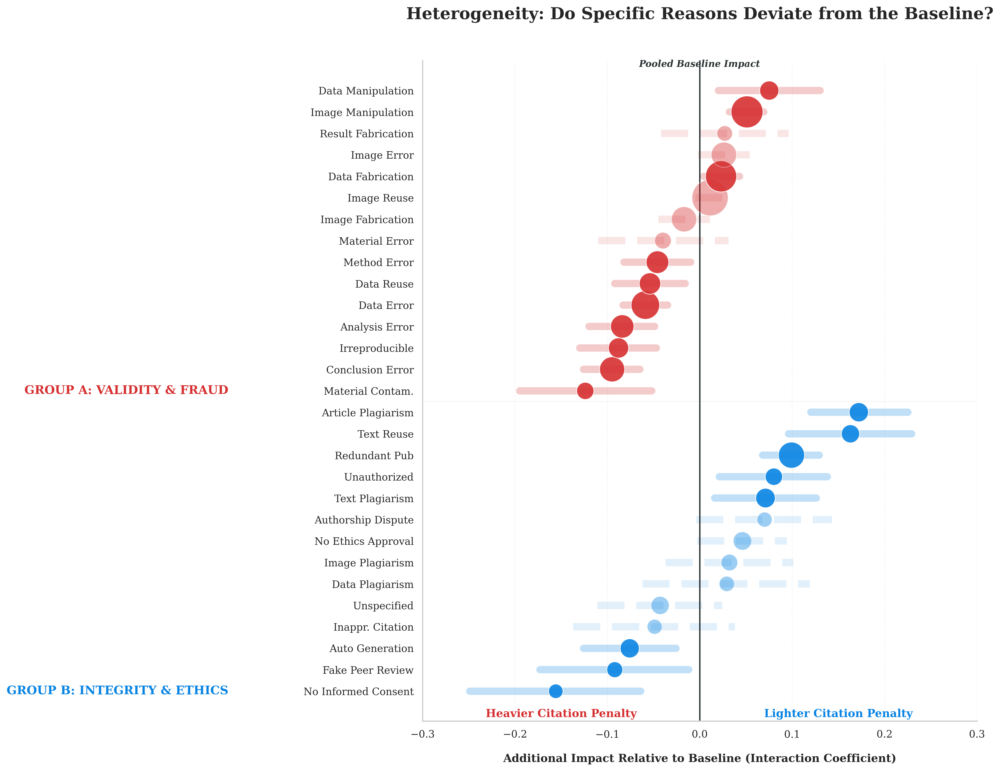

In [80]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 1. 整理交互项数据 (DID x Reason Interaction)
data = {
    'Variable': [
        'Image Reuse', 'Image Manipulation', 'Data Fabrication', 'Data Error', 'Redundant Pub', 
        'Conclusion Error', 'Image Error', 'Image Fabrication', 'Analysis Error', 'Method Error',
        'Data Reuse', 'Irreproducible', 'Text Plagiarism', 'Article Plagiarism', 'Data Manipulation', 
        'Auto Generation', 'Unknown Reason', 'No Ethics Approval', 'Text Reuse', 'Unspecified',
        'Unauthorized', 'Material Contam.', 'Image Plagiarism', 'Material Error', 'Fake Peer Review', 
        'Result Fabrication', 'Data Plagiarism', 'Authorship Dispute', 'Inappr. Citation', 'No Informed Consent', 'Other'
    ],
    'Estimate': [
        0.011, 0.051, 0.023, -0.059, 0.099, -0.095, 0.026, -0.017, -0.084, -0.046,
        -0.054, -0.088, 0.071, 0.172, 0.075, -0.076, -0.064, 0.046, 0.163, -0.043,
        0.080, -0.124, 0.032, -0.040, -0.092, 0.027, 0.029, 0.070, -0.049, -0.156, 0.043
    ],
    'CI_Lower': [
        -0.005, 0.032, 0.004, -0.083, 0.068, -0.126, -0.002, -0.045, -0.120, -0.082,
        -0.092, -0.130, 0.016, 0.120, 0.020, -0.126, -0.115, -0.003, 0.096, -0.111,
        0.021, -0.195, -0.037, -0.110, -0.173, -0.042, -0.062, -0.004, -0.137, -0.249, 0.007
    ],
    'CI_Upper': [
        0.027, 0.069, 0.043, -0.035, 0.129, -0.065, 0.054, 0.011, -0.049, -0.010,
        -0.016, -0.047, 0.126, 0.225, 0.130, -0.026, -0.014, 0.094, 0.229, 0.024,
        0.138, -0.052, 0.101, 0.031, -0.012, 0.096, 0.119, 0.143, 0.038, -0.064, 0.078
    ],
    'TreatedPapers': [
        5887, 3659, 3329, 2312, 1637, 1398, 1394, 1358, 1044, 918,
        738, 589, 509, 476, 469, 468, 453, 383, 380, 356,
        312, 307, 252, 251, 224, 187, 178, 168, 165, 154, 947
    ]
}

df = pd.DataFrame(data)

# 过滤噪声变量
df = df[~df['Variable'].isin(['Other', 'Unknown Reason'])].copy()

# 2. 分类逻辑 (Group A vs Group B)
group_a_list = [
    'Image Reuse', 'Image Manipulation', 'Data Fabrication', 'Data Error', 
    'Conclusion Error', 'Image Error', 'Image Fabrication', 'Analysis Error', 
    'Method Error', 'Irreproducible', 'Data Manipulation', 
    'Material Contam.', 'Material Error', 'Result Fabrication', 'Data Reuse'
]
df['Group'] = df['Variable'].apply(lambda x: 'Group A: Validity & Fraud' if x in group_a_list else 'Group B: Integrity & Ethics')

# 按照组别和系数大小排序
df = df.sort_values(['Group', 'Estimate'], ascending=[False, True]).reset_index(drop=True)

# 3. 绘图配置
plt.rcParams['font.family'] = 'serif'
fig, ax = plt.subplots(figsize=(14, 13), dpi=300)
fig.subplots_adjust(left=0.3, right=0.9)

colors = {'Group A: Validity & Fraud': '#d63031', 'Group B: Integrity & Ethics': '#0984e3'}

for i, row in df.iterrows():
    color = colors[row['Group']]
    
    # 显著性判断 (不跨越 0 线)
    is_significant = (row['CI_Lower'] > 0) or (row['CI_Upper'] < 0)
    line_style = '-' if is_significant else '--'
    line_alpha = 0.25 if is_significant else 0.12
    dot_alpha = 0.9 if is_significant else 0.4
    
    # 绘制误差棒
    ax.plot([row['CI_Lower'], row['CI_Upper']], [i, i], 
            color=color, alpha=line_alpha, linewidth=8, 
            linestyle=line_style, solid_capstyle='round', zorder=1)
    
    # 绘制气泡
    size = np.sqrt(row['TreatedPapers']) * 20
    ax.scatter(row['Estimate'], i, s=size, color=color, 
               edgecolor='white', linewidth=0.8, zorder=5, alpha=dot_alpha)

# 4. 核心参考线标记 (Baseline)
ax.axvline(0, color='#2d3436', linewidth=1.5, zorder=2)
# 在竖线上方添加 Baseline 标记
ax.text(0, len(df), 'Pooled Baseline Impact', color='#2d3436', 
        ha='center', va='bottom', fontsize=10, fontweight='bold', fontstyle='italic')

# 5. 分组标签与装饰线
last_group = None
for i, row in df.iterrows():
    if row['Group'] != last_group:
        ax.text(-0.35, i, row['Group'].upper(), transform=ax.get_yaxis_transform(), 
                fontsize=13, fontweight='black', color=colors[row['Group']], va='center', ha='right')
        if i > 0:
            ax.axhline(i - 0.5, color='gray', linestyle='-', linewidth=0.8, alpha=0.1)
        last_group = row['Group']

# 6. 美化细节
ax.set_yticks(range(len(df)))
ax.set_yticklabels(df['Variable'], fontsize=11)
ax.set_xlim(-0.3, 0.3) # 扩大范围以适应更宽的交互项系数
ax.set_xlabel('Additional Impact Relative to Baseline (Interaction Coefficient)', fontsize=12, fontweight='bold', labelpad=15)
ax.set_title('Heterogeneity: Do Specific Reasons Deviate from the Baseline?', pad=45, fontsize=18, fontweight='bold')

# 添加方向注释
ax.annotate('Heavier Citation Penalty', xy=(-0.15, -1.2), xycoords='data', ha='center', color='#d63031', fontweight='bold', annotation_clip=False)
ax.annotate('Lighter Citation Penalty', xy=(0.15, -1.2), xycoords='data', ha='center', color='#0984e3', fontweight='bold', annotation_clip=False)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.yaxis.grid(False)
ax.xaxis.grid(True, linestyle=':', alpha=0.3)

plt.show()

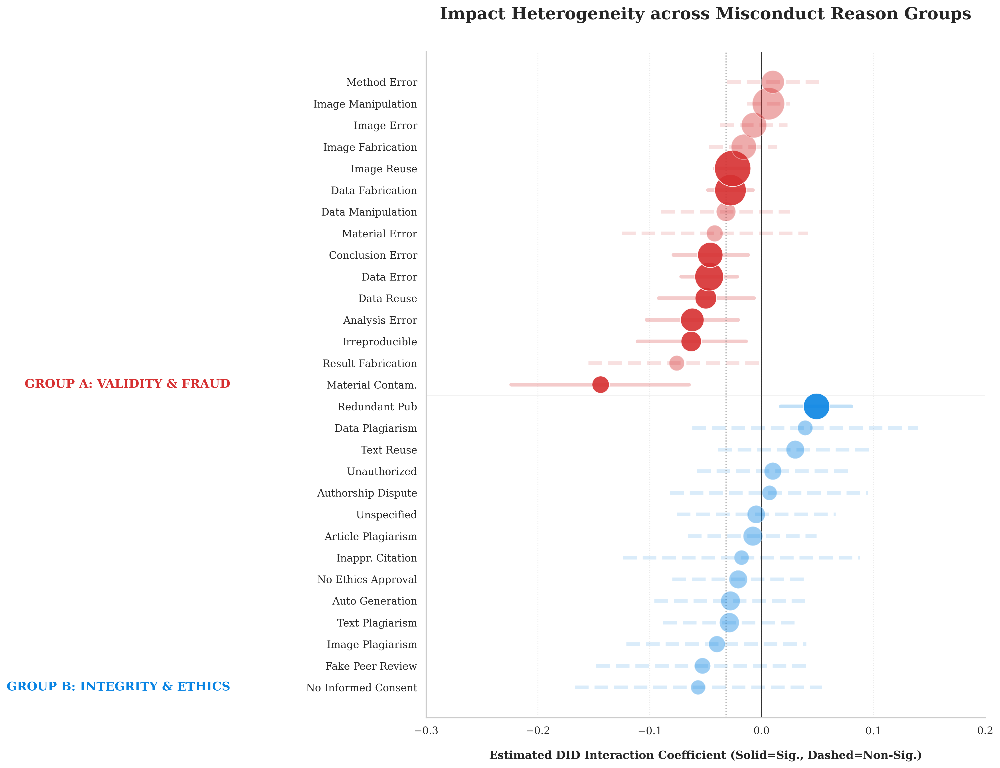

In [81]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 1. 原始数据录入
data = {
    'Variable': [
        'Image Reuse', 'Image Manipulation', 'Data Fabrication', 'Data Error', 'Redundant Pub', 
        'Conclusion Error', 'Image Error', 'Image Fabrication', 'Analysis Error', 'Method Error',
        'Data Reuse', 'Irreproducible', 'Text Plagiarism', 'Article Plagiarism', 'Data Manipulation', 
        'Auto Generation', 'Unknown Reason', 'No Ethics Approval', 'Text Reuse', 'Unspecified',
        'Unauthorized', 'Material Contam.', 'Image Plagiarism', 'Material Error', 'Fake Peer Review', 
        'Result Fabrication', 'Data Plagiarism', 'Authorship Dispute', 'Inappr. Citation', 'No Informed Consent', 'Other'
    ],
    'Estimate': [
        -0.026, 0.006, -0.028, -0.047, 0.049, -0.046, -0.007, -0.016, -0.062, 0.010,
        -0.050, -0.063, -0.029, -0.008, -0.032, -0.028, -0.082, -0.021, 0.030, -0.005,
        0.010, -0.144, -0.040, -0.042, -0.053, -0.076, 0.039, 0.007, -0.018, -0.057, -0.017
    ],
    'CI_Lower': [
        -0.042, -0.013, -0.048, -0.072, 0.017, -0.079, -0.037, -0.047, -0.103, -0.031,
        -0.092, -0.111, -0.088, -0.066, -0.090, -0.096, -0.138, -0.080, -0.039, -0.076,
        -0.058, -0.224, -0.121, -0.125, -0.148, -0.155, -0.062, -0.082, -0.124, -0.167, -0.055
    ],
    'CI_Upper': [
        -0.011, 0.025, -0.008, -0.022, 0.080, -0.012, 0.023, 0.014, -0.021, 0.051,
        -0.007, -0.014, 0.031, 0.049, 0.025, 0.040, -0.026, 0.039, 0.100, 0.066,
        0.079, -0.065, 0.040, 0.041, 0.043, 0.002, 0.140, 0.095, 0.088, 0.054, 0.022
    ],
    'TreatedPapers': [
        5887, 3659, 3329, 2312, 1637, 1398, 1394, 1358, 1044, 918,
        738, 589, 509, 476, 469, 468, 453, 383, 380, 356,
        312, 307, 252, 251, 224, 187, 178, 168, 165, 154, 947
    ]
}

df = pd.DataFrame(data)

# 过滤噪声
df = df[~df['Variable'].isin(['Other', 'Unknown Reason'])].copy()

# 分类逻辑
group_a_list = [
    'Image Reuse', 'Image Manipulation', 'Data Fabrication', 'Data Error', 
    'Conclusion Error', 'Image Error', 'Image Fabrication', 'Analysis Error', 
    'Method Error', 'Irreproducible', 'Data Manipulation', 
    'Material Contam.', 'Material Error', 'Result Fabrication', 'Data Reuse'
]
df['Group'] = df['Variable'].apply(lambda x: 'Group A: Validity & Fraud' if x in group_a_list else 'Group B: Integrity & Ethics')

# 排序
df = df.sort_values(['Group', 'Estimate'], ascending=[False, True]).reset_index(drop=True)

# 3. 绘图
plt.rcParams['font.family'] = 'serif'
fig, ax = plt.subplots(figsize=(14, 13), dpi=300)
fig.subplots_adjust(left=0.3, right=0.9)

colors = {'Group A: Validity & Fraud': '#d63031', 'Group B: Integrity & Ethics': '#0984e3'}

for i, row in df.iterrows():
    color = colors[row['Group']]
    
    # --- 核心逻辑：显著性判断 ---
    is_significant = (row['CI_Lower'] > 0) or (row['CI_Upper'] < 0)
    line_style = '-' if is_significant else '--'
    dot_alpha = 0.9 if is_significant else 0.4  # 不显著的点稍微淡化
    line_alpha = 0.25 if is_significant else 0.15
    
    # 绘制误差棒 (Confidence Interval)
    ax.plot([row['CI_Lower'], row['CI_Upper']], [i, i], 
            color=color, alpha=line_alpha, linewidth=4, 
            linestyle=line_style, solid_capstyle='round', zorder=1)
    
    # 绘制气泡 (Coefficient Point)
    size = np.sqrt(row['TreatedPapers']) * 20
    ax.scatter(row['Estimate'], i, s=size, color=color, 
               edgecolor='white', linewidth=0.8, zorder=5, alpha=dot_alpha)

# 4. 参考线
ax.axvline(0, color='black', linewidth=1, alpha=0.8)
ax.axvline(-0.032, color='gray', linestyle=':', linewidth=1.2, alpha=0.6) # 基准线改为点状线以区分

# 5. 分组标签与装饰
last_group = None
for i, row in df.iterrows():
    if row['Group'] != last_group:
        ax.text(-0.35, i, row['Group'].upper(), transform=ax.get_yaxis_transform(), 
                fontsize=13, fontweight='black', color=colors[row['Group']], va='center', ha='right')
        if i > 0:
            ax.axhline(i - 0.5, color='gray', linestyle='-', linewidth=0.8, alpha=0.1)
        last_group = row['Group']

# 6. 美化细节
ax.set_yticks(range(len(df)))
ax.set_yticklabels(df['Variable'], fontsize=11)
ax.set_xlim(-0.3, 0.2)
ax.set_xlabel('Estimated DID Interaction Coefficient (Solid=Sig., Dashed=Non-Sig.)', fontsize=12, fontweight='bold', labelpad=15)
ax.set_title('Impact Heterogeneity across Misconduct Reason Groups', pad=35, fontsize=18, fontweight='bold')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.yaxis.grid(False)
ax.xaxis.grid(True, linestyle=':', alpha=0.4)

plt.show()

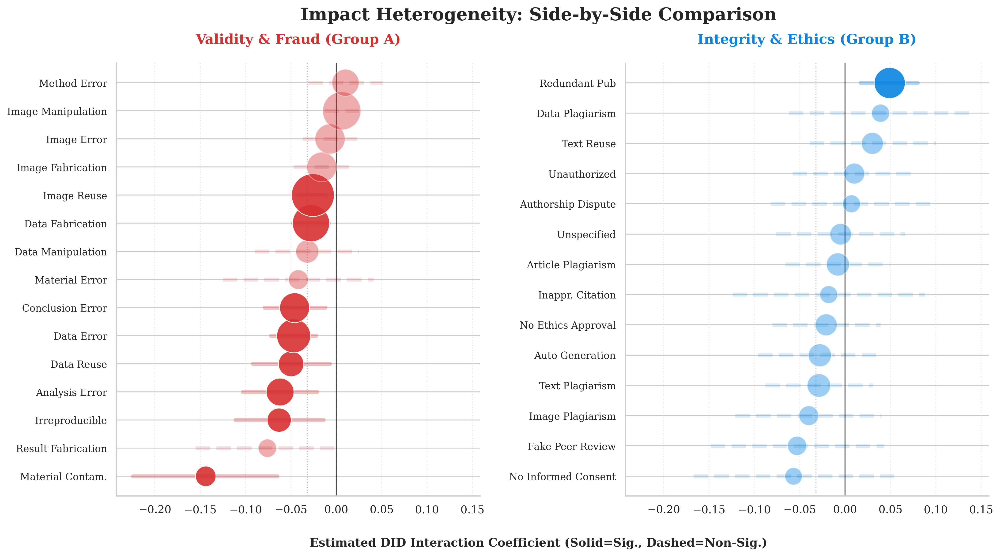

In [82]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 1. 数据准备
data = {
    'Variable': [
        'Image Reuse', 'Image Manipulation', 'Data Fabrication', 'Data Error', 'Redundant Pub', 
        'Conclusion Error', 'Image Error', 'Image Fabrication', 'Analysis Error', 'Method Error',
        'Data Reuse', 'Irreproducible', 'Text Plagiarism', 'Article Plagiarism', 'Data Manipulation', 
        'Auto Generation', 'No Ethics Approval', 'Text Reuse', 'Unspecified',
        'Unauthorized', 'Material Contam.', 'Image Plagiarism', 'Material Error', 'Fake Peer Review', 
        'Result Fabrication', 'Data Plagiarism', 'Authorship Dispute', 'Inappr. Citation', 'No Informed Consent'
    ],
    'Estimate': [
        -0.026, 0.006, -0.028, -0.047, 0.049, -0.046, -0.007, -0.016, -0.062, 0.010,
        -0.050, -0.063, -0.029, -0.008, -0.032, -0.028, -0.021, 0.030, -0.005,
        0.010, -0.144, -0.040, -0.042, -0.053, -0.076, 0.039, 0.007, -0.018, -0.057
    ],
    'CI_Lower': [
        -0.042, -0.013, -0.048, -0.072, 0.017, -0.079, -0.037, -0.047, -0.103, -0.031,
        -0.092, -0.111, -0.088, -0.066, -0.090, -0.096, -0.080, -0.039, -0.076,
        -0.058, -0.224, -0.121, -0.125, -0.148, -0.155, -0.062, -0.082, -0.124, -0.167
    ],
    'CI_Upper': [
        -0.011, 0.025, -0.008, -0.022, 0.080, -0.012, 0.023, 0.014, -0.021, 0.051,
        -0.007, -0.014, 0.031, 0.049, 0.025, 0.040, 0.039, 0.100, 0.066,
        0.079, -0.065, 0.040, 0.041, 0.043, 0.002, 0.140, 0.095, 0.088, 0.054
    ],
    'TreatedPapers': [
        5887, 3659, 3329, 2312, 1637, 1398, 1394, 1358, 1044, 918,
        738, 589, 509, 476, 469, 468, 383, 380, 356,
        312, 307, 252, 251, 224, 187, 178, 168, 165, 154
    ]
}

df = pd.DataFrame(data)

# 分类逻辑
group_a_list = [
    'Image Reuse', 'Image Manipulation', 'Data Fabrication', 'Data Error', 
    'Conclusion Error', 'Image Error', 'Image Fabrication', 'Analysis Error', 
    'Method Error', 'Irreproducible', 'Data Manipulation', 
    'Material Contam.', 'Material Error', 'Result Fabrication', 'Data Reuse'
]
df['Group'] = df['Variable'].apply(lambda x: 'Group A' if x in group_a_list else 'Group B')

# 2. 绘图参数
plt.rcParams['font.family'] = 'serif'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), sharex=True, dpi=300)
plt.subplots_adjust(wspace=0.4) # 增加左右子图间距

# 定义绘图辅助函数
def plot_group(ax, group_name, color, title):
    subset = df[df['Group'] == group_name].sort_values('Estimate', ascending=True).reset_index()
    
    for i, row in subset.iterrows():
        is_sig = (row['CI_Lower'] > 0) or (row['CI_Upper'] < 0)
        l_style = '-' if is_sig else '--'
        l_alpha = 0.3 if is_sig else 0.15
        d_alpha = 0.9 if is_sig else 0.4
        
        # 误差棒
        ax.plot([row['CI_Lower'], row['CI_Upper']], [i, i], 
                color=color, alpha=l_alpha, linewidth=4, linestyle=l_style, solid_capstyle='round')
        # 散点
        size = np.sqrt(row['TreatedPapers']) * 25
        ax.scatter(row['Estimate'], i, s=size, color=color, edgecolor='white', linewidth=0.8, alpha=d_alpha, zorder=3)
        
    ax.set_yticks(range(len(subset)))
    ax.set_yticklabels(subset['Variable'], fontsize=10)
    ax.axvline(0, color='black', linewidth=1, alpha=0.7)
    ax.axvline(-0.032, color='gray', linestyle=':', linewidth=1, alpha=0.5)
    ax.set_title(title, fontsize=14, fontweight='bold', pad=20, color=color)
    ax.xaxis.grid(True, linestyle=':', alpha=0.4)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# 执行绘图
plot_group(ax1, 'Group A', '#d63031', 'Validity & Fraud (Group A)')
plot_group(ax2, 'Group B', '#0984e3', 'Integrity & Ethics (Group B)')

# 公共标签
fig.text(0.5, 0.02, 'Estimated DID Interaction Coefficient (Solid=Sig., Dashed=Non-Sig.)', 
         ha='center', fontsize=12, fontweight='bold')
fig.suptitle('Impact Heterogeneity: Side-by-Side Comparison', fontsize=18, fontweight='bold', y=0.98)

plt.show()

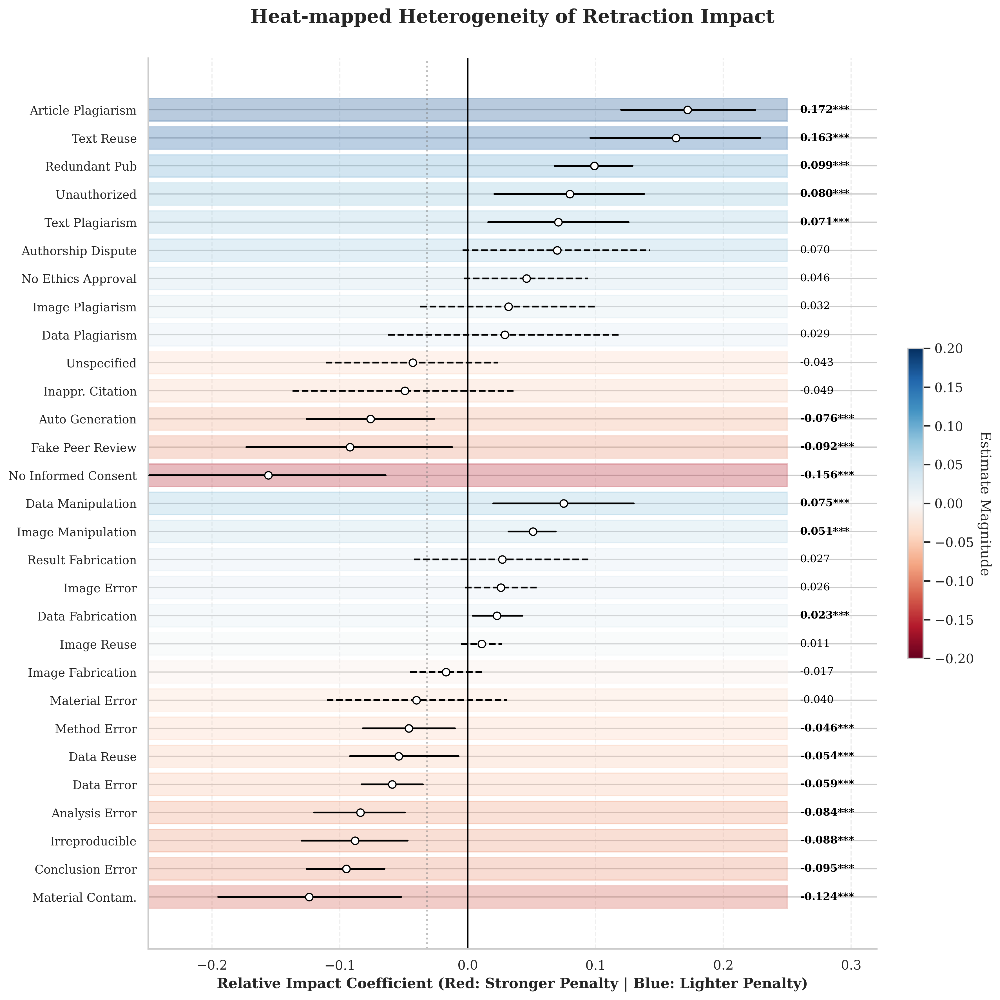

In [83]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.colors as mcolors

# 1. 原始数据录入
data = {
    'Variable': [
        'Image Reuse', 'Image Manipulation', 'Data Fabrication', 'Data Error', 'Redundant Pub', 
        'Conclusion Error', 'Image Error', 'Image Fabrication', 'Analysis Error', 'Method Error',
        'Data Reuse', 'Irreproducible', 'Text Plagiarism', 'Article Plagiarism', 'Data Manipulation', 
        'Auto Generation', 'No Ethics Approval', 'Text Reuse', 'Unspecified',
        'Unauthorized', 'Material Contam.', 'Image Plagiarism', 'Material Error', 'Fake Peer Review', 
        'Result Fabrication', 'Data Plagiarism', 'Authorship Dispute', 'Inappr. Citation', 'No Informed Consent'
    ],
    'Estimate': [
        0.011, 0.051, 0.023, -0.059, 0.099, -0.095, 0.026, -0.017, -0.084, -0.046,
        -0.054, -0.088, 0.071, 0.172, 0.075, -0.076, 0.046, 0.163, -0.043,
        0.080, -0.124, 0.032, -0.040, -0.092, 0.027, 0.029, 0.070, -0.049, -0.156
    ],
    'CI_Lower': [
        -0.005, 0.032, 0.004, -0.083, 0.068, -0.126, -0.002, -0.045, -0.120, -0.082,
        -0.092, -0.130, 0.016, 0.120, 0.020, -0.126, -0.003, 0.096, -0.111,
        0.021, -0.195, -0.037, -0.110, -0.173, -0.042, -0.062, -0.004, -0.137, -0.249
    ],
    'CI_Upper': [
        0.027, 0.069, 0.043, -0.035, 0.129, -0.065, 0.054, 0.011, -0.049, -0.010,
        -0.007, -0.047, 0.126, 0.225, 0.130, -0.026, 0.094, 0.229, 0.024,
        0.138, -0.052, 0.101, 0.031, -0.012, 0.096, 0.119, 0.143, 0.038, -0.064
    ]
}

df = pd.DataFrame(data)

# 分类逻辑
group_a_list = [
    'Image Reuse', 'Image Manipulation', 'Data Fabrication', 'Data Error', 
    'Conclusion Error', 'Image Error', 'Image Fabrication', 'Analysis Error', 
    'Method Error', 'Irreproducible', 'Data Manipulation', 
    'Material Contam.', 'Material Error', 'Result Fabrication', 'Data Reuse'
]
df['Group'] = df['Variable'].apply(lambda x: 'Validity & Fraud' if x in group_a_list else 'Integrity & Ethics')
df = df.sort_values(['Group', 'Estimate'], ascending=[False, True]).reset_index(drop=True)

# 3. 绘图
plt.rcParams['font.family'] = 'serif'
fig, ax = plt.subplots(figsize=(12, 12), dpi=300)

# 创建颜色映射：从深红(负)到深蓝(正)，0为白色
norm = mcolors.TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.2)
cmap = plt.cm.RdBu 

for i, row in df.iterrows():
    # 获取颜色
    color = cmap(norm(row['Estimate']))
    
    # 显著性判断
    is_significant = (row['CI_Lower'] > 0) or (row['CI_Upper'] < 0)
    
    # 绘制模拟热力图的色块 (背景条)
    ax.add_patch(plt.Rectangle((-0.25, i-0.4), 0.5, 0.8, color=color, alpha=0.3, zorder=1))
    
    # 绘制核心系数线 (显著为实线，不显著为虚线)
    line_style = '-' if is_significant else '--'
    ax.plot([row['CI_Lower'], row['CI_Upper']], [i, i], color='black', 
            linewidth=1.5, linestyle=line_style, solid_capstyle='round', zorder=3)
    
    # 绘制中心点
    ax.scatter(row['Estimate'], i, color='white', edgecolor='black', s=40, zorder=4)
    
    # 在右侧标注数值
    sig_star = "***" if is_significant else ""
    ax.text(0.26, i, f"{row['Estimate']:.3f}{sig_star}", va='center', fontsize=9, 
            color='black', fontweight='bold' if is_significant else 'normal')

# 4. 参考线
ax.axvline(0, color='black', linewidth=1.2)
ax.axvline(-0.032, color='gray', linestyle=':', alpha=0.5)

# 5. 美化
ax.set_yticks(range(len(df)))
ax.set_yticklabels(df['Variable'], fontsize=10)
ax.set_xlim(-0.25, 0.32)
ax.set_xlabel('Relative Impact Coefficient (Red: Stronger Penalty | Blue: Lighter Penalty)', fontweight='bold')
ax.set_title('Heat-mapped Heterogeneity of Retraction Impact', pad=30, fontsize=16, fontweight='bold')

# 添加色带 (Colorbar)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.02, pad=0.04)
cbar.set_label('Estimate Magnitude', rotation=270, labelpad=15)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()

## 二、领域差异

### 导入3组数据

In [86]:
#导入已经引入了一个异质性变量（conclusionimpact）的面板数据文件
panel_df = pd.read_csv('/Data4/yutao_wen/26.1.30/DOM_0.4_ConclusionInd.csv')

In [87]:
#使用数据库的field数据 l0 l1
field_df = pd.read_csv('/data6/Data1/DATA/Dimensions2024/20240101/PaperFields_l0.csv')

In [88]:
field_df

,id,field_l0
0,pub.1102821084,48
1,pub.1043326933,31
2,pub.1043326933,34
3,pub.1043326933,40
4,pub.1078112877,32
...,...,...
141712763,pub.1158374731,47
141712764,pub.1033071010,44
141712765,pub.1033071010,47
141712766,pub.1029063642,47


In [89]:
#field_l0的学科对应关系
fieldmap_df = pd.read_csv('/Data4/Yang_wenlong/dimensions_field0.csv')

In [90]:
fieldmap_df

,field_l0,filed_0_string
0,30,"AGRICULTURAL, VETERINARY AND FOOD SCIENCES"
1,31,BIOLOGICAL SCIENCES
2,32,BIOMEDICAL AND CLINICAL SCIENCES
3,33,BUILT ENVIRONMENT AND DESIGN
4,34,CHEMICAL SCIENCES
5,35,"COMMERCE, MANAGEMENT, TOURISM AND SERVICES"
6,36,CREATIVE ARTS AND WRITING
7,37,EARTH SCIENCES
8,38,ECONOMICS
9,39,EDUCATION


### 引入学科小类

In [91]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,...,MaterialContamination_i,ImagePlagiarism_i,MaterialError_i,FakePeerReview_i,ResultFabrication_i,DataPlagiarism_i,AuthorshipDispute_i,InappropriateCitation_i,NoInformedConsent_i,OtherReason_i
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,...,0,1,0,0,0,0,0,0,0,0
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,...,0,1,0,0,0,0,0,0,0,0
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,...,0,1,0,0,0,0,0,0,0,0
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,...,0,1,0,0,0,0,0,0,0,0
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,...,0,0,0,0,0,0,0,0,0,0
631986,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,...,0,0,0,0,0,0,0,0,0,0
631987,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,...,0,0,0,0,0,0,0,0,0,0
631988,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,...,0,0,0,0,0,0,0,0,0,0


In [92]:
#我的panel_df里有列paper_id，field_df里有列id，这两个相互对应，
#我需要你根据field_df里的字段映射关系，
#将field_df中的field_l0映射到panel_df中去
#在panel_df中新增一列E_field 表示实验组论文的一级学科领域
#进一步，我需要你根据panel_df里的列reference_ids，对应field_df里的id
#将field_df中的field_l0映射到panel_df中去
#在panel_df中新增一列C_field 表示撤稿论文的一级学科领域
# 1. 准备映射字典 (将 field_df 转换为字典以提高查询速度)
field_map = field_df.set_index('id')['field_l0'].to_dict()

# ==========================================
# 2. 映射 field (实验组论文自身的学科)
# ==========================================
# 直接使用 map 匹配 paper_id
panel_df['field'] = panel_df['paper_id'].map(field_map)

# ==========================================
# 3. 映射 R_field (参考文献/撤稿论文的学科)
# ==========================================

def get_reference_fields(ref_val, mapping):
    """
    处理 reference_ids：选取出现频率最高的一个学科
    """
    if pd.isna(ref_val) or str(ref_val).strip() == "":
        return np.nan
    
    # 兼容处理字符串和列表格式
    if isinstance(ref_val, str):
        ref_ids = [r.strip() for r in ref_val.replace(',', ';').split(';') if r.strip()]
    else:
        ref_ids = ref_val

    fields = [mapping.get(r_id) for r_id in ref_ids if r_id in mapping]
    
    if not fields:
        return np.nan
    
    # 返回众数学科
    return max(set(fields), key=fields.count)

# --- 3.1 仅对实验组计算 R_field ---
treated_mask = panel_df['group'] == 1
panel_df.loc[treated_mask, 'R_field'] = (
    panel_df.loc[treated_mask, 'reference_ids']
    .apply(lambda x: get_reference_fields(x, field_map))
)

# --- 3.2 控制组继承同 pair 实验组的 R_field ---
# 创建 pair -> R_field 的映射关系
pair_rfield_map = (
    panel_df.loc[treated_mask, ['pair', 'R_field']]
    .drop_duplicates(subset='pair')
    .set_index('pair')['R_field']
)

control_mask = panel_df['group'] == 0
panel_df.loc[control_mask, 'R_field'] = (
    panel_df.loc[control_mask, 'pair']
    .map(pair_rfield_map)
)

# ==========================================
# 4. 汇报匹配成功的个体数 (以 paper_numid 统计)
# ==========================================

# 提取唯一的个体数据（每篇论文只计一次）
unique_papers = panel_df.drop_duplicates(subset='paper_numid')

# 统计逻辑
total_treated = unique_papers[unique_papers['group'] == 1].shape[0]
total_control = unique_papers[unique_papers['group'] == 0].shape[0]

# 映射成功的个体 (即 R_field 不为空的个体)
success_treated = unique_papers[(unique_papers['group'] == 1) & (unique_papers['R_field'].notna())].shape[0]
success_control = unique_papers[(unique_papers['group'] == 0) & (unique_papers['R_field'].notna())].shape[0]

print("-" * 40)
print(f"{'Group Type':<15} | {'Total Papers':<15} | {'Mapped R_field'}")
print("-" * 40)
print(f"{'Treated (G1)':<15} | {total_treated:<15} | {success_treated}")
print(f"{'Control (G0)':<15} | {total_control:<15} | {success_control}")
print("-" * 40)
print(f"注：以上统计为 paper_numid 唯一文章数，非面板数据行数。")

# 预览结果
print("\n结果预览 (前5行):")
print(panel_df[['paper_id', 'pair', 'group', 'field', 'R_field']].head())

----------------------------------------
Group Type      | Total Papers    | Mapped R_field
----------------------------------------
Treated (G1)    | 23288           | 22644
Control (G0)    | 23288           | 22644
----------------------------------------
注：以上统计为 paper_numid 唯一文章数，非面板数据行数。

结果预览 (前5行):
         paper_id  pair  group  field  R_field
0  pub.1000000694     1      1   32.0     32.0
1  pub.1000000694     1      1   32.0     32.0
2  pub.1000000694     1      1   32.0     32.0
3  pub.1000000694     1      1   32.0     32.0
4  pub.1000000694     1      1   32.0     32.0


In [93]:
#学科小类的描述性
#哪些field_l0出现的频率最高，只看实验组控制组
#不是行数，因为是面板数据，所以需要根据paper_numid去重
#然后统计field_l0的频率分布
treated_unique = panel_df[panel_df['group'] == 1].drop_duplicates(subset='paper_numid')
control_unique = panel_df[panel_df['group'] == 0].drop_duplicates(subset='paper_numid')
#实验组的field_l0频率分布
treated_field_dist = treated_unique['field'].value_counts(normalize=True) * 100
print("实验组一级学科领域频率分布 (%):")
print(treated_field_dist)
#控制组的field_l0频率分布
control_field_dist = control_unique['field'].value_counts(normalize=True) * 100 
print("控制组一级学科领域频率分布 (%):")
print(control_field_dist)

实验组一级学科领域频率分布 (%):
field
32.0    43.663013
31.0    22.025052
40.0    10.699374
34.0     8.337683
51.0     4.658142
42.0     3.505567
52.0     2.326896
35.0     0.995999
30.0     0.926409
46.0     0.687196
41.0     0.635003
49.0     0.482777
38.0     0.226166
44.0     0.200070
50.0     0.182672
37.0     0.169624
47.0     0.082637
48.0     0.065240
39.0     0.043493
36.0     0.034795
33.0     0.030445
43.0     0.021747
Name: proportion, dtype: float64
控制组一级学科领域频率分布 (%):
field
32.0    42.087879
31.0    20.991786
40.0    10.117780
34.0     8.957365
51.0     5.076275
42.0     3.815898
52.0     2.742405
30.0     1.238646
41.0     1.021339
46.0     0.869225
35.0     0.582381
49.0     0.582381
38.0     0.530227
37.0     0.460689
44.0     0.417228
50.0     0.156461
48.0     0.134730
47.0     0.056500
39.0     0.047807
33.0     0.039115
36.0     0.039115
43.0     0.034769
Name: proportion, dtype: float64


In [94]:
panel_df["field"]

0         32.0
1         32.0
2         32.0
3         32.0
4         32.0
          ... 
631985    31.0
631986    31.0
631987    31.0
631988    31.0
631989    31.0
Name: field, Length: 631990, dtype: float64

In [95]:
# 我需要新的22个虚拟变量，用来进行论文领域的异质性分析
# 这些变量分别对应以下的领域
"""
field_l0	filed_0_string
0	30	AGRICULTURAL, VETERINARY AND FOOD SCIENCES
1	31	BIOLOGICAL SCIENCES
2	32	BIOMEDICAL AND CLINICAL SCIENCES
3	33	BUILT ENVIRONMENT AND DESIGN
4	34	CHEMICAL SCIENCES
5	35	COMMERCE, MANAGEMENT, TOURISM AND SERVICES
6	36	CREATIVE ARTS AND WRITING
7	37	EARTH SCIENCES
8	38	ECONOMICS
9	39	EDUCATION
10	40	ENGINEERING
11	41	ENVIRONMENTAL SCIENCES
12	42	HEALTH SCIENCES
13	43	HISTORY, HERITAGE AND ARCHAEOLOGY
14	44	HUMAN SOCIETY
15	45	INDIGENOUS STUDIES
16	46	INFORMATION AND COMPUTING SCIENCES
17	47	LANGUAGE, COMMUNICATION AND CULTURE
18	48	LAW AND LEGAL STUDIES
19	49	MATHEMATICAL SCIENCES
20	50	PHILOSOPHY AND RELIGIOUS STUDIES
21	51	PHYSICAL SCIENCES
22	52	PSYCHOLOGY """
# 我的panel_df里已经有field列，表示一级学科领域
# 请你根据field列，新增22个虚拟变量
# field列形如：
"""
0         32.0
1         32.0
2         32.0
3         32.0
4         32.0
          ... 
631985    31.0
631986    31.0
631987    31.0
631988    31.0
631989    31.0
"""
# 变量命名为field_30, field_31, ..., field_52
# 变量取值为0/1，表示该实验组论文（group=1）是否属于对应的一级学科领域
# 例如，field_30表示是否属于AGRICULTURAL, VETERINARY AND FOOD SCIENCES领域
# 如果是，则field_30=1，否则field_30=0
# 由于是进行交互项的回归，因此这里控制组不需要进行和实验组相同的反事实赋值了



'\n0         32.0\n1         32.0\n2         32.0\n3         32.0\n4         32.0\n          ... \n631985    31.0\n631986    31.0\n631987    31.0\n631988    31.0\n631989    31.0\n'

In [96]:
import numpy as np
import pandas as pd

# -----------------------------
# 0) 你指定的领域排序（按你给的频率顺序）
# -----------------------------
field_order = [32, 31, 40, 34, 51, 42, 52, 35, 30, 46, 41, 49, 38, 44, 50, 37, 47, 48, 39, 36, 33, 43]

# 需要生成的全部领域 code（30~52）
all_field_codes = list(range(30, 53))

# -----------------------------
# 1) 直接用每篇论文自身的 field 定义领域 code
#    不再按 pair 从实验组继承（去掉反事实）
# -----------------------------
panel_df['field_code'] = (
    pd.to_numeric(panel_df['field'], errors='coerce')
    .round()
    .astype('Int64')
)

# -----------------------------
# 2) 生成 22 个 dummy：field_30 ... field_52
#    dummy=1 当且仅当 “这篇论文本身属于该领域”
#    （实验组、控制组都一样用真实领域）
# -----------------------------
for code in all_field_codes:
    col = f'field_{code}'
    mask = panel_df['field_code'] == code      # BooleanArray，含 <NA>
    panel_df[col] = mask.fillna(False).astype('int8')


# -----------------------------
# 3) 按你给的频率顺序排列这 22 个 dummy 列
# -----------------------------
ordered_dummy_cols = [f'field_{c}' for c in field_order]

other_cols = [c for c in panel_df.columns if c not in ordered_dummy_cols]
panel_df = panel_df[other_cols + ordered_dummy_cols]

# -----------------------------
# 4) 快速验证（可选）
# -----------------------------
print("Created dummy columns:", len(ordered_dummy_cols))
print("Dummy columns order:", ordered_dummy_cols)

# 每个 paper 只能属于一个一级领域：按 paper_numid 检查 dummy 之和
check = (
    panel_df.groupby('paper_numid')[ordered_dummy_cols]
    .first()
    .sum(axis=1)
    .value_counts(dropna=False)
)
print("Per-paper sum of field dummies (should usually be 1 or 0 if missing):")
print(check)


Created dummy columns: 22
Dummy columns order: ['field_32', 'field_31', 'field_40', 'field_34', 'field_51', 'field_42', 'field_52', 'field_35', 'field_30', 'field_46', 'field_41', 'field_49', 'field_38', 'field_44', 'field_50', 'field_37', 'field_47', 'field_48', 'field_39', 'field_36', 'field_33', 'field_43']
Per-paper sum of field dummies (should usually be 1 or 0 if missing):
1    46001
0      575
Name: count, dtype: int64


In [97]:
panel_df.describe()

,group,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,...,field_38,field_44,field_50,field_37,field_47,field_48,field_39,field_36,field_33,field_43
count,631990.0,631990.00000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,...,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.00000
mean,0.5,2014.93229,2007.864580,2013.659001,8.231820,1.640486,0.536834,0.268417,1.273289,5.012469,...,0.003407,0.002745,0.001753,0.002984,0.000642,0.000956,0.000451,0.000407,0.000293,0.00025
std,0.5,5.21755,4.964693,5.381865,15.409225,1.068767,0.498642,0.443136,6.272990,2.826784,...,0.058267,0.052324,0.041834,0.054547,0.025338,0.030900,0.021231,0.020162,0.017107,0.01581
min,0.0,1995.00000,1995.000000,1996.000000,0.000000,0.000000,0.000000,0.000000,-26.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
25%,0.0,2012.00000,2004.000000,2011.000000,1.000000,0.693147,0.000000,0.000000,-3.000000,3.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
50%,0.5,2016.00000,2008.000000,2015.000000,4.000000,1.609438,1.000000,0.000000,1.000000,5.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
75%,1.0,2019.00000,2012.000000,2018.000000,10.000000,2.397895,1.000000,1.000000,5.000000,7.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
max,1.0,2022.00000,2015.000000,2022.000000,1114.000000,7.016610,1.000000,1.000000,26.000000,27.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000


### 引入小范围跨学科Crossfield_small

In [98]:
# ==========================================
# 1. 提取个体层面的数据（每篇论文仅保留一行）
# ==========================================
# 我们只关注已经成功映射了两个学科的论文
unique_papers = panel_df.drop_duplicates(subset='paper_numid').copy()
unique_papers = unique_papers[unique_papers['field'].notna() & unique_papers['R_field'].notna()]

# ==========================================
# 2. 识别不一致的行
# ==========================================
# 判定逻辑：field 不等于 R_field
mismatch_mask = unique_papers['field'] != unique_papers['R_field']
mismatched_df = unique_papers[mismatch_mask]

# ==========================================
# 3. 统计结果汇报
# ==========================================
total_mapped = unique_papers.shape[0]
mismatch_count = mismatched_df.shape[0]
mismatch_rate = (mismatch_count / total_mapped) * 100 if total_mapped > 0 else 0

print("-" * 50)
print(f"学科匹配统计（基于唯一个体 paper_numid）:")
print(f"1. 双学科信息完整的论文总数: {total_mapped}")
print(f"2. 自身学科(field)与引用学科(R_field)不一致的论文数: {mismatch_count}")
print(f"3. 跨学科引用比例: {mismatch_rate:.2f}%")
print("-" * 50)

# ==========================================
# 4. 展示不一致的详细情况 (前10行预览)
# ==========================================
print("\n学科不一致的论文明细预览 (前10行):")
display_cols = ['paper_numid', 'group', 'field', 'R_field']
print(mismatched_df[display_cols].head(10))

# 可选：查看最常见的跨学科组合
print("\n最常见的跨学科引用组合 (field -> R_field):")
print(mismatched_df.groupby(['field', 'R_field']).size().sort_values(ascending=False).head(10))

--------------------------------------------------
学科匹配统计（基于唯一个体 paper_numid）:
1. 双学科信息完整的论文总数: 44719
2. 自身学科(field)与引用学科(R_field)不一致的论文数: 18669
3. 跨学科引用比例: 41.75%
--------------------------------------------------

学科不一致的论文明细预览 (前10行):
     paper_numid  group  field  R_field
94             8      0   34.0     40.0
113           10      0   31.0     32.0
122           11      1   34.0     32.0
136           12      0   34.0     32.0
150           13      1   34.0     41.0
160           14      0   34.0     41.0
178           16      0   31.0     32.0
186           17      1   42.0     32.0
451           34      0   46.0     31.0
482           36      0   41.0     31.0

最常见的跨学科引用组合 (field -> R_field):
field  R_field
31.0   32.0       3638
32.0   31.0       3343
42.0   32.0       1142
34.0   32.0       1011
51.0   40.0        734
34.0   40.0        629
       31.0        585
40.0   51.0        508
       32.0        488
32.0   34.0        442
dtype: int64


In [99]:
#由于R_field本身就是控制组的反事实变量，因此这里的Crossfield_small变量也赋予控制组
#即控制组继承同pair的实验组值
import pandas as pd
import numpy as np

# ==========================================
# 1. 仅为实验组 (group=1) 计算 Crossfield_small
# ==========================================

# 初始化为 -1 (默认设为缺失状态)
panel_df['Crossfield_small'] = -1

def compute_crossfield(row):
    # 如果自身学科或引用学科缺失，判定为无法界定 (-1)
    if pd.isna(row['field']) or pd.isna(row['R_field']):
        return -1
    # 一致为 0，不一致为 1
    return 1 if row['field'] != row['R_field'] else 0

# 仅对实验组应用判定逻辑
treated_mask = panel_df['group'] == 1
panel_df.loc[treated_mask, 'Crossfield_small'] = (
    panel_df.loc[treated_mask].apply(compute_crossfield, axis=1)
)

# ==========================================
# 2. 让控制组 (group=0) 继承同 pair 的实验组值
# ==========================================

# 创建 pair -> Crossfield_small 的映射字典
# 这里包含了 0, 1 和 -1 三种状态
pair_cross_map = (
    panel_df.loc[treated_mask, ['pair', 'Crossfield_small']]
    .drop_duplicates(subset='pair')
    .set_index('pair')['Crossfield_small']
)

# 控制组继承。如果某个 pair 在 map 中找不到（极少见），填充为 -1
control_mask = panel_df['group'] == 0
panel_df.loc[control_mask, 'Crossfield_small'] = (
    panel_df.loc[control_mask, 'pair']
    .map(pair_cross_map)
    .fillna(-1) 
)

# 转换为整数类型
panel_df['Crossfield_small'] = panel_df['Crossfield_small'].astype(int)

# ==========================================
# 3. 统计个体层面的分布 (展示 -1, 0, 1)
# ==========================================

# 提取唯一的个体
unique_papers = panel_df.drop_duplicates(subset='paper_numid')

# 统计分布，确保 -1 也能展示出来
crossfield_counts = (
    unique_papers.groupby(['group', 'Crossfield_small'])
    .size()
    .unstack(fill_value=0)
)

# 规范化列名和行名
crossfield_counts.index = ['Control (G0)', 'Treated (G1)']
# 动态匹配列名，防止某些列完全缺失
column_mapping = {-1: 'Missing (-1)', 0: 'Within-Field (0)', 1: 'Cross-Field (1)'}
crossfield_counts.columns = [column_mapping.get(col, col) for col in crossfield_counts.columns]

print("=== Crossfield_small 分布统计 (含缺失个体数) ===")
print(crossfield_counts)

# 打印缺失比例
total_papers = unique_papers.shape[0]
missing_papers = unique_papers[unique_papers['Crossfield_small'] == -1].shape[0]
print(f"\n总论文数 (个体): {total_papers}")
print(f"缺失学科信息的论文数: {missing_papers} ({missing_papers/total_papers:.2%})")

/tmp/ipykernel_712311/708107340.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  panel_df['Crossfield_small'] = -1


=== Crossfield_small 分布统计 (含缺失个体数) ===
              Missing (-1)  Within-Field (0)  Cross-Field (1)
Control (G0)           937             13954             8397
Treated (G1)           937             13954             8397

总论文数 (个体): 46576
缺失学科信息的论文数: 1874 (4.02%)


/tmp/ipykernel_712311/708107340.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  panel_df['Crossfield_small'] = panel_df['Crossfield_small'].astype(int)


### 引入学科大类（四类）

In [100]:
"""# ==========================================
# 1. 定义大类映射字典
# ==========================================
# 键为二级学科全称，值为 1-4 的分类编号
broad_map_dict = {
    # (1) 生命科学与医学
    'AGRICULTURAL, VETERINARY AND FOOD SCIENCES': 1,
    'BIOLOGICAL SCIENCES': 1,
    'BIOMEDICAL AND CLINICAL SCIENCES': 1,
    'HEALTH SCIENCES': 1,
    'PSYCHOLOGY': 1,
    # (2) 理学与自然科学
    'CHEMICAL SCIENCES': 2,
    'EARTH SCIENCES': 2,
    'ENVIRONMENTAL SCIENCES': 2,
    'MATHEMATICAL SCIENCES': 2,
    'PHYSICAL SCIENCES': 2,
    # (3) 工程、计算与建筑
    'BUILT ENVIRONMENT AND DESIGN': 3,
    'ENGINEERING': 3,
    'INFORMATION AND COMPUTING SCIENCES': 3,
    # (4) 人文与社会科学
    'COMMERCE, MANAGEMENT, TOURISM AND SERVICES': 4,
    'CREATIVE ARTS AND WRITING': 4,
    'ECONOMICS': 4,
    'EDUCATION': 4,
    'HISTORY, HERITAGE AND ARCHAEOLOGY': 4,
    'HUMAN SOCIETY': 4,
    'INDIGENOUS STUDIES': 4,
    'LANGUAGE, COMMUNICATION AND CULTURE': 4,
    'LAW AND LEGAL STUDIES': 4,
    'PHILOSOPHY AND RELIGIOUS STUDIES': 4
} """

"# ==========================================\n# 1. 定义大类映射字典\n# ==========================================\n# 键为二级学科全称，值为 1-4 的分类编号\nbroad_map_dict = {\n    # (1) 生命科学与医学\n    'AGRICULTURAL, VETERINARY AND FOOD SCIENCES': 1,\n    'BIOLOGICAL SCIENCES': 1,\n    'BIOMEDICAL AND CLINICAL SCIENCES': 1,\n    'HEALTH SCIENCES': 1,\n    'PSYCHOLOGY': 1,\n    # (2) 理学与自然科学\n    'CHEMICAL SCIENCES': 2,\n    'EARTH SCIENCES': 2,\n    'ENVIRONMENTAL SCIENCES': 2,\n    'MATHEMATICAL SCIENCES': 2,\n    'PHYSICAL SCIENCES': 2,\n    # (3) 工程、计算与建筑\n    'BUILT ENVIRONMENT AND DESIGN': 3,\n    'ENGINEERING': 3,\n    'INFORMATION AND COMPUTING SCIENCES': 3,\n    # (4) 人文与社会科学\n    'COMMERCE, MANAGEMENT, TOURISM AND SERVICES': 4,\n    'CREATIVE ARTS AND WRITING': 4,\n    'ECONOMICS': 4,\n    'EDUCATION': 4,\n    'HISTORY, HERITAGE AND ARCHAEOLOGY': 4,\n    'HUMAN SOCIETY': 4,\n    'INDIGENOUS STUDIES': 4,\n    'LANGUAGE, COMMUNICATION AND CULTURE': 4,\n    'LAW AND LEGAL STUDIES': 4,\n    'PHILOSOPHY AND

In [101]:
"""import pandas as pd
import numpy as np

# ==========================================
# 1. 定义学科编码与大类的对应关系 (基于 30-52 编码)
# ==========================================
# 这样映射最稳健，因为数字编码通常是唯一的
code_to_broad = {
    # (1) 生命科学与医学: 30, 31, 32, 42, 52
    30: 1, 31: 1, 32: 1, 42: 1, 52: 1,
    # (2) 理学与自然科学: 34, 37, 41, 49, 51
    34: 2, 37: 2, 41: 2, 49: 2, 51: 2,
    # (3) 工程、计算与建筑: 33, 40, 46
    33: 3, 40: 3, 46: 3,
    # (4) 人文与社会科学: 35, 36, 38, 39, 43, 44, 45, 47, 48, 50
    35: 4, 36: 4, 38: 4, 39: 4, 43: 4, 44: 4, 45: 4, 47: 4, 48: 4, 50: 4
}

# 同时保留名称映射作为备份
name_to_broad = {
    'AGRICULTURAL, VETERINARY AND FOOD SCIENCES': 1, 'BIOLOGICAL SCIENCES': 1,
    'BIOMEDICAL AND CLINICAL SCIENCES': 1, 'HEALTH SCIENCES': 1, 'PSYCHOLOGY': 1,
    'CHEMICAL SCIENCES': 2, 'EARTH SCIENCES': 2, 'ENVIRONMENTAL SCIENCES': 2,
    'MATHEMATICAL SCIENCES': 2, 'PHYSICAL SCIENCES': 2,
    'BUILT ENVIRONMENT AND DESIGN': 3, 'ENGINEERING': 3, 'INFORMATION AND COMPUTING SCIENCES': 3,
    'COMMERCE, MANAGEMENT, TOURISM AND SERVICES': 4, 'CREATIVE ARTS AND WRITING': 4,
    'ECONOMICS': 4, 'EDUCATION': 4, 'HISTORY, HERITAGE AND ARCHAEOLOGY': 4,
    'HUMAN SOCIETY': 4, 'INDIGENOUS STUDIES': 4, 'LANGUAGE, COMMUNICATION AND CULTURE': 4,
    'LAW AND LEGAL STUDIES': 4, 'PHILOSOPHY AND RELIGIOUS STUDIES': 4
}

# ==========================================
# 2. 定义映射函数 (支持数字、浮点、字符串)
# ==========================================
def map_to_bigfield(val, code_map, name_map):
    if pd.isna(val):
        return -1
    
    # 尝试转化为整数进行编码匹配
    try:
        # 如果是 "31.0" 或 31 这种
        code = int(float(val))
        if code in code_map:
            return code_map[code]
    except (ValueError, TypeError):
        pass
    
    # 如果是字符串名称匹配
    clean_name = str(val).strip().upper()
    return name_map.get(clean_name, -1)

# ==========================================
# 3. 执行全表映射 (不继承，正常独立匹配)
# ==========================================
panel_df['Bigfield'] = panel_df['field'].apply(lambda x: map_to_bigfield(x, code_to_broad, name_to_broad))
panel_df['BigR_field'] = panel_df['R_field'].apply(lambda x: map_to_bigfield(x, code_to_broad, name_to_broad))

# ==========================================
# 4. 统计映射成功的个体数 (Unique paper_numid)
# ==========================================
unique_papers = panel_df.drop_duplicates(subset='paper_numid')

# 分别计算实验组和控制组
res = []
for g_val, g_label in [(1, "Treated (G1)"), (0, "Control (G0)")]:
    sub = unique_papers[unique_papers['group'] == g_val]
    res.append({
        "Group Type": g_label,
        "Total Papers": len(sub),
        "Success Bigfield": len(sub[sub['Bigfield'] != -1]),
        "Success BigR_field": len(sub[sub['BigR_field'] != -1])
    })

mapping_summary = pd.DataFrame(res)

print("-" * 65)
print("=== 映射成功的个体文章数统计 (Unique paper_numid) ===")
print(mapping_summary.to_string(index=False))
print("-" * 65)"""

'import pandas as pd\nimport numpy as np\n\n# ==========================================\n# 1. 定义学科编码与大类的对应关系 (基于 30-52 编码)\n# ==========================================\n# 这样映射最稳健，因为数字编码通常是唯一的\ncode_to_broad = {\n    # (1) 生命科学与医学: 30, 31, 32, 42, 52\n    30: 1, 31: 1, 32: 1, 42: 1, 52: 1,\n    # (2) 理学与自然科学: 34, 37, 41, 49, 51\n    34: 2, 37: 2, 41: 2, 49: 2, 51: 2,\n    # (3) 工程、计算与建筑: 33, 40, 46\n    33: 3, 40: 3, 46: 3,\n    # (4) 人文与社会科学: 35, 36, 38, 39, 43, 44, 45, 47, 48, 50\n    35: 4, 36: 4, 38: 4, 39: 4, 43: 4, 44: 4, 45: 4, 47: 4, 48: 4, 50: 4\n}\n\n# 同时保留名称映射作为备份\nname_to_broad = {\n    \'AGRICULTURAL, VETERINARY AND FOOD SCIENCES\': 1, \'BIOLOGICAL SCIENCES\': 1,\n    \'BIOMEDICAL AND CLINICAL SCIENCES\': 1, \'HEALTH SCIENCES\': 1, \'PSYCHOLOGY\': 1,\n    \'CHEMICAL SCIENCES\': 2, \'EARTH SCIENCES\': 2, \'ENVIRONMENTAL SCIENCES\': 2,\n    \'MATHEMATICAL SCIENCES\': 2, \'PHYSICAL SCIENCES\': 2,\n    \'BUILT ENVIRONMENT AND DESIGN\': 3, \'ENGINEERING\': 3, \'INFORMATION AND

In [102]:
"""import pandas as pd

# ==========================================
# 1. 提取个体层面的数据 (去重)
# ==========================================
unique_papers = panel_df.drop_duplicates(subset='paper_numid')

# 定义分类名称映射，方便阅读
label_map = {
    1: "1. Life & Medical",
    2: "2. Physical & Natural",
    3: "3. Engineering & Tech",
    4: "4. Social Sciences & Humanities",
    -1: "Missing / Unknown (-1)"
} 

# ==========================================
# 2. 统计函数：计算数量与占比
# ==========================================
def get_distribution_table(df, column_name, title):
    # 统计频数
    counts = df[column_name].value_counts(dropna=False).sort_index()
    # 计算占比
    percentage = (df[column_name].value_counts(normalize=True, dropna=False) * 100).sort_index()
    
    # 合并为 DataFrame
    dist_df = pd.DataFrame({
        'Count': counts,
        'Percentage (%)': percentage.map('{:.2f}%'.format)
    })
    
    # 映射名称
    dist_df.index = dist_df.index.map(lambda x: label_map.get(x, f"Other ({x})"))
    
    print(f"\n--- {title} ---")
    print(dist_df)
    return dist_df

# ==========================================
# 3. 执行统计
# ==========================================
# 统计 Bigfield (自身学科)
field_dist = get_distribution_table(unique_papers, 'Bigfield', "Bigfield (自身学科大类) 分布")

# 统计 BigR_field (引用撤稿学科大类)
rfield_dist = get_distribution_table(unique_papers, 'BigR_field', "BigR_field (引用撤稿学科大类) 分布")

# ==========================================
# 4. 交叉统计 (用于查看哪些大类是撤稿重灾区)
# ==========================================
print("\n--- Bigfield vs BigR_field 交叉频数表 (Top 10) ---")
cross_tab = pd.crosstab(unique_papers['Bigfield'], unique_papers['BigR_field'], margins=True)
print(cross_tab) """

'import pandas as pd\n\n# ==========================================\n# 1. 提取个体层面的数据 (去重)\n# ==========================================\nunique_papers = panel_df.drop_duplicates(subset=\'paper_numid\')\n\n# 定义分类名称映射，方便阅读\nlabel_map = {\n    1: "1. Life & Medical",\n    2: "2. Physical & Natural",\n    3: "3. Engineering & Tech",\n    4: "4. Social Sciences & Humanities",\n    -1: "Missing / Unknown (-1)"\n} \n\n# ==========================================\n# 2. 统计函数：计算数量与占比\n# ==========================================\ndef get_distribution_table(df, column_name, title):\n    # 统计频数\n    counts = df[column_name].value_counts(dropna=False).sort_index()\n    # 计算占比\n    percentage = (df[column_name].value_counts(normalize=True, dropna=False) * 100).sort_index()\n    \n    # 合并为 DataFrame\n    dist_df = pd.DataFrame({\n        \'Count\': counts,\n        \'Percentage (%)\': percentage.map(\'{:.2f}%\'.format)\n    })\n    \n    # 映射名称\n    dist_df.index = dist_df.index.map(lambda x: label_

In [103]:
"""import pandas as pd

# ==========================================
# 1. 提取个体数据并过滤无效学科 (-1)
# ==========================================
# 去重，确保每篇论文只计入一次
unique_papers = panel_df.drop_duplicates(subset='paper_numid').copy()

# 过滤掉 Bigfield 为 -1 的行
valid_papers = unique_papers[unique_papers['Bigfield'].isin([1, 2, 3, 4])]

# 定义类别名称映射
label_map = {
    1: "1. Life & Medical",
    2: "2. Physical & Natural",
    3: "3. Engineering & Tech",
    4: "4. Social Sciences & Humanities"
}

# ==========================================
# 2. 分组计算数量与组内占比
# ==========================================
# 按 group 和 Bigfield 分组统计数量
dist_stats = valid_papers.groupby(['group', 'Bigfield']).size().unstack(level=0)

# 重命名列名
dist_stats.columns = ['Control (G0)', 'Treated (G1)']

# 计算组内百分比 (每一列的总和为 100%)
dist_pct = dist_stats.div(dist_stats.sum(axis=0), axis=1) * 100

# ==========================================
# 3. 合并表格并展示
# ==========================================
# 合并数量和占比，方便对比
summary_table = pd.DataFrame({
    'G0_Count': dist_stats['Control (G0)'],
    'G0_Pct': dist_pct['Control (G0)'].map('{:.2f}%'.format),
    'G1_Count': dist_stats['Treated (G1)'],
    'G1_Pct': dist_pct['Treated (G1)'].map('{:.2f}%'.format)
})

# 映射行索引名称
summary_table.index = summary_table.index.map(label_map)

print("=== 实验组 vs 控制组 Bigfield 分布对比 (不含-1) ===")
print(summary_table)

# ==========================================
# 4. 检查两组分布是否均衡 (计算差异)
# ==========================================
diff = (dist_pct['Treated (G1)'] - dist_pct['Control (G0)']).abs()
print(f"\n两组学科分布的最大偏差: {diff.max():.2f} 个百分点") """

'import pandas as pd\n\n# ==========================================\n# 1. 提取个体数据并过滤无效学科 (-1)\n# ==========================================\n# 去重，确保每篇论文只计入一次\nunique_papers = panel_df.drop_duplicates(subset=\'paper_numid\').copy()\n\n# 过滤掉 Bigfield 为 -1 的行\nvalid_papers = unique_papers[unique_papers[\'Bigfield\'].isin([1, 2, 3, 4])]\n\n# 定义类别名称映射\nlabel_map = {\n    1: "1. Life & Medical",\n    2: "2. Physical & Natural",\n    3: "3. Engineering & Tech",\n    4: "4. Social Sciences & Humanities"\n}\n\n# ==========================================\n# 2. 分组计算数量与组内占比\n# ==========================================\n# 按 group 和 Bigfield 分组统计数量\ndist_stats = valid_papers.groupby([\'group\', \'Bigfield\']).size().unstack(level=0)\n\n# 重命名列名\ndist_stats.columns = [\'Control (G0)\', \'Treated (G1)\']\n\n# 计算组内百分比 (每一列的总和为 100%)\ndist_pct = dist_stats.div(dist_stats.sum(axis=0), axis=1) * 100\n\n# ==========================================\n# 3. 合并表格并展示\n# =========================================

In [104]:
"""import pandas as pd

# ==========================================
# 1. 提取个体数据并确保 Pair 完整
# ==========================================
# 仅保留 Bigfield 有效 (非-1) 的个体
unique_papers = panel_df.drop_duplicates(subset='paper_numid').copy()
valid_papers = unique_papers[unique_papers['Bigfield'] != -1]

# 找出成对的 Pair (即该 pair 下既有实验组又有控制组)
pair_counts = valid_papers['pair'].value_counts()
complete_pairs = pair_counts[pair_counts == 2].index
df_pairs = valid_papers[valid_papers['pair'].isin(complete_pairs)]

# ==========================================
# 2. 计算每个 Pair 内部的学科一致性
# ==========================================
def check_pair_consistency(group):
    # 获取该对子中实验组和控制组的 Bigfield
    fields = group['Bigfield'].unique()
    # 如果唯一值数量 > 1，说明不一致
    return len(fields) > 1

# 按 pair 分组并判定
pair_diff_status = df_pairs.groupby('pair').apply(check_pair_consistency)

# ==========================================
# 3. 结果汇总与展示
# ==========================================
total_pairs = len(pair_diff_status)
different_pairs = pair_diff_status.sum()
same_pairs = total_pairs - different_pairs

print("-" * 50)
print(f"=== 论文对 (Pair) 学科一致性统计 (不含-1) ===")
print(f"总对子数 (有效学科): {total_pairs}")
print(f"学科一致的对子 (Same): {same_pairs} ({same_pairs/total_pairs:.2%})")
print(f"学科不一致的对子 (Different): {different_pairs} ({different_pairs/total_pairs:.2%})")
print("-" * 50)

# ==========================================
# 4. 深度分析：哪些学科最容易出现“同刊不同学科”？
# ==========================================
if different_pairs > 0:
    diff_pair_ids = pair_diff_status[pair_diff_status == True].index
    diff_df = df_pairs[df_pairs['pair'].isin(diff_pair_ids)]
    print("\n学科不一致对子中，实验组(G1)的学科分布：")
    print(diff_df[diff_df['group']==1]['Bigfield'].value_counts(normalize=True).map('{:.2f}%'.format)) """

'import pandas as pd\n\n# ==========================================\n# 1. 提取个体数据并确保 Pair 完整\n# ==========================================\n# 仅保留 Bigfield 有效 (非-1) 的个体\nunique_papers = panel_df.drop_duplicates(subset=\'paper_numid\').copy()\nvalid_papers = unique_papers[unique_papers[\'Bigfield\'] != -1]\n\n# 找出成对的 Pair (即该 pair 下既有实验组又有控制组)\npair_counts = valid_papers[\'pair\'].value_counts()\ncomplete_pairs = pair_counts[pair_counts == 2].index\ndf_pairs = valid_papers[valid_papers[\'pair\'].isin(complete_pairs)]\n\n# ==========================================\n# 2. 计算每个 Pair 内部的学科一致性\n# ==========================================\ndef check_pair_consistency(group):\n    # 获取该对子中实验组和控制组的 Bigfield\n    fields = group[\'Bigfield\'].unique()\n    # 如果唯一值数量 > 1，说明不一致\n    return len(fields) > 1\n\n# 按 pair 分组并判定\npair_diff_status = df_pairs.groupby(\'pair\').apply(check_pair_consistency)\n\n# ==========================================\n# 3. 结果汇总与展示\n# =====================================

In [105]:
"""#现在我的panel_df有分类变量Bigfield，其取值为1,2,3,4
#现在我需要四个Bigfield虚拟变量dummy
# 创建 Bigfield 的虚拟变量
# Bigfield1 Bigfield2 Bigfield3 Bigfield4
import numpy as np

panel_df['Bigfield1'] = (panel_df['Bigfield'] == 1).astype('int8')
panel_df['Bigfield2'] = (panel_df['Bigfield'] == 2).astype('int8')
panel_df['Bigfield3'] = (panel_df['Bigfield'] == 3).astype('int8')
panel_df['Bigfield4'] = (panel_df['Bigfield'] == 4).astype('int8')"""

"#现在我的panel_df有分类变量Bigfield，其取值为1,2,3,4\n#现在我需要四个Bigfield虚拟变量dummy\n# 创建 Bigfield 的虚拟变量\n# Bigfield1 Bigfield2 Bigfield3 Bigfield4\nimport numpy as np\n\npanel_df['Bigfield1'] = (panel_df['Bigfield'] == 1).astype('int8')\npanel_df['Bigfield2'] = (panel_df['Bigfield'] == 2).astype('int8')\npanel_df['Bigfield3'] = (panel_df['Bigfield'] == 3).astype('int8')\npanel_df['Bigfield4'] = (panel_df['Bigfield'] == 4).astype('int8')"

In [106]:
"""panel_df.describe()"""

'panel_df.describe()'

### 引入学科大类（三类）

In [107]:
# 重新映射为三类：
# 1: "生物&医学" (原分类 1)
# 2: "理学&工学" (原分类 2 & 3)
# 3: "人文社科" (原分类 4)

broad_map_dict = {
    # --- (1) 生物&医学 ---
    'AGRICULTURAL, VETERINARY AND FOOD SCIENCES': 1,
    'BIOLOGICAL SCIENCES': 1,
    'BIOMEDICAL AND CLINICAL SCIENCES': 1,
    'HEALTH SCIENCES': 1,
    'PSYCHOLOGY': 1,

    # --- (2) 理学&工学 ---
    'CHEMICAL SCIENCES': 2,
    'EARTH SCIENCES': 2,
    'ENVIRONMENTAL SCIENCES': 2,
    'MATHEMATICAL SCIENCES': 2,
    'PHYSICAL SCIENCES': 2,
    'BUILT ENVIRONMENT AND DESIGN': 2,
    'ENGINEERING': 2,
    'INFORMATION AND COMPUTING SCIENCES': 2,

    # --- (3) 人文社科 ---
    'COMMERCE, MANAGEMENT, TOURISM AND SERVICES': 3,
    'CREATIVE ARTS AND WRITING': 3,
    'ECONOMICS': 3,
    'EDUCATION': 3,
    'HISTORY, HERITAGE AND ARCHAEOLOGY': 3,
    'HUMAN SOCIETY': 3,
    'INDIGENOUS STUDIES': 3,
    'LANGUAGE, COMMUNICATION AND CULTURE': 3,
    'LAW AND LEGAL STUDIES': 3,
    'PHILOSOPHY AND RELIGIOUS STUDIES': 3
} 

In [108]:
import pandas as pd
import numpy as np

# ==========================================
# 1. 定义学科编码与大类的对应关系 (更新为三类映射)
# ==========================================
# 映射说明：
# 1: 生物&医学
# 2: 理学&工学 (合并原 2 和 3)
# 3: 人文社科 (原 4 顺延)

code_to_broad = {
    # (1) 生物&医学: 30, 31, 32, 42, 52
    30: 1, 31: 1, 32: 1, 42: 1, 52: 1,
    
    # (2) 理学&工学: 34, 37, 41, 49, 51 (原理学) + 33, 40, 46 (原工学)
    34: 2, 37: 2, 41: 2, 49: 2, 51: 2, 
    33: 2, 40: 2, 46: 2,
    
    # (3) 人文社科: 35, 36, 38, 39, 43, 44, 45, 47, 48, 50
    35: 3, 36: 3, 38: 3, 39: 3, 43: 3, 44: 3, 45: 3, 47: 3, 48: 3, 50: 3
}

# 同时同步名称映射
name_to_broad = {
    # (1) 生物&医学
    'AGRICULTURAL, VETERINARY AND FOOD SCIENCES': 1, 'BIOLOGICAL SCIENCES': 1,
    'BIOMEDICAL AND CLINICAL SCIENCES': 1, 'HEALTH SCIENCES': 1, 'PSYCHOLOGY': 1,
    
    # (2) 理学&工学
    'CHEMICAL SCIENCES': 2, 'EARTH SCIENCES': 2, 'ENVIRONMENTAL SCIENCES': 2,
    'MATHEMATICAL SCIENCES': 2, 'PHYSICAL SCIENCES': 2,
    'BUILT ENVIRONMENT AND DESIGN': 2, 'ENGINEERING': 2, 'INFORMATION AND COMPUTING SCIENCES': 2,
    
    # (3) 人文社科
    'COMMERCE, MANAGEMENT, TOURISM AND SERVICES': 3, 'CREATIVE ARTS AND WRITING': 3,
    'ECONOMICS': 3, 'EDUCATION': 3, 'HISTORY, HERITAGE AND ARCHAEOLOGY': 3,
    'HUMAN SOCIETY': 3, 'INDIGENOUS STUDIES': 3, 'LANGUAGE, COMMUNICATION AND CULTURE': 3,
    'LAW AND LEGAL STUDIES': 3, 'PHILOSOPHY AND RELIGIOUS STUDIES': 3
}

# ==========================================
# 2. 定义映射函数 (保持不变)
# ==========================================
def map_to_bigfield(val, code_map, name_map):
    if pd.isna(val):
        return -1
    
    # 尝试转化为整数进行编码匹配
    try:
        code = int(float(val))
        if code in code_map:
            return code_map[code]
    except (ValueError, TypeError):
        pass
    
    # 如果是字符串名称匹配
    clean_name = str(val).strip().upper()
    return name_map.get(clean_name, -1)

# ==========================================
# 3. 执行全表映射
# ==========================================
panel_df['Bigfield'] = panel_df['field'].apply(lambda x: map_to_bigfield(x, code_to_broad, name_to_broad))
panel_df['BigR_field'] = panel_df['R_field'].apply(lambda x: map_to_bigfield(x, code_to_broad, name_to_broad))

# ==========================================
# 4. 统计映射成功的个体数 (Unique paper_numid)
# ==========================================
unique_papers = panel_df.drop_duplicates(subset='paper_numid')

res = []
for g_val, g_label in [(1, "Treated (G1)"), (0, "Control (G0)")]:
    sub = unique_papers[unique_papers['group'] == g_val]
    res.append({
        "Group Type": g_label,
        "Total Papers": len(sub),
        "Success Bigfield": len(sub[sub['Bigfield'] != -1]),
        "Success BigR_field": len(sub[sub['BigR_field'] != -1])
    })

mapping_summary = pd.DataFrame(res)

print("-" * 65)
print("=== 映射成功的个体文章数统计 (三类划分版) ===")
print(mapping_summary.to_string(index=False))
print("-" * 65) 

/tmp/ipykernel_712311/2310504733.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  panel_df['Bigfield'] = panel_df['field'].apply(lambda x: map_to_bigfield(x, code_to_broad, name_to_broad))


-----------------------------------------------------------------
=== 映射成功的个体文章数统计 (三类划分版) ===
  Group Type  Total Papers  Success Bigfield  Success BigR_field
Treated (G1)         23288             22992               22644
Control (G0)         23288             23009               22644
-----------------------------------------------------------------


/tmp/ipykernel_712311/2310504733.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  panel_df['BigR_field'] = panel_df['R_field'].apply(lambda x: map_to_bigfield(x, code_to_broad, name_to_broad))


In [109]:
import pandas as pd

# ==========================================
# 1. 提取个体层面的数据 (去重)
# ==========================================
unique_papers = panel_df.drop_duplicates(subset='paper_numid')

# 更新分类名称映射（适配三分类逻辑）
label_map = {
    1: "1. 生物&医学",
    2: "2. 理学&工学",
    3: "3. 人文社科",
    -1: "Missing / Unknown (-1)"
} 

# ==========================================
# 2. 统计函数：计算数量与占比 (保持逻辑不变)
# ==========================================
def get_distribution_table(df, column_name, title):
    # 统计频数
    counts = df[column_name].value_counts(dropna=False).sort_index()
    # 计算占比
    percentage = (df[column_name].value_counts(normalize=True, dropna=False) * 100).sort_index()
    
    # 合并为 DataFrame
    dist_df = pd.DataFrame({
        'Count': counts,
        'Percentage (%)': percentage.map('{:.2f}%'.format)
    })
    
    # 映射名称
    dist_df.index = dist_df.index.map(lambda x: label_map.get(x, f"Other ({x})"))
    
    print(f"\n--- {title} ---")
    print(dist_df)
    return dist_df

# ==========================================
# 3. 执行统计
# ==========================================
# 统计 Bigfield (自身学科大类)
field_dist = get_distribution_table(unique_papers, 'Bigfield', "Bigfield (自身学科大类) 分布")

# 统计 BigR_field (引用撤稿学科大类)
rfield_dist = get_distribution_table(unique_papers, 'BigR_field', "BigR_field (引用撤稿学科大类) 分布")

# ==========================================
# 4. 交叉统计 (用于查看哪些大类是撤稿重灾区)
# ==========================================
print("\n--- Bigfield vs BigR_field 交叉频数表 (三分类版) ---")
# 为了让交叉表的行列名更易读，我们先进行名称重命名
unique_papers_renamed = unique_papers.copy()
unique_papers_renamed['Bigfield_Name'] = unique_papers_renamed['Bigfield'].map(label_map)
unique_papers_renamed['BigR_field_Name'] = unique_papers_renamed['BigR_field'].map(label_map)

cross_tab = pd.crosstab(
    unique_papers_renamed['Bigfield_Name'], 
    unique_papers_renamed['BigR_field_Name'], 
    margins=True
)
print(cross_tab) 


--- Bigfield (自身学科大类) 分布 ---
                        Count Percentage (%)
Bigfield                                    
Missing / Unknown (-1)    575          1.23%
1. 生物&医学                32965         70.78%
2. 理学&工学                12150         26.09%
3. 人文社科                   886          1.90%

--- BigR_field (引用撤稿学科大类) 分布 ---
                        Count Percentage (%)
BigR_field                                  
Missing / Unknown (-1)   1288          2.77%
1. 生物&医学                34328         73.70%
2. 理学&工学                10216         21.93%
3. 人文社科                   744          1.60%

--- Bigfield vs BigR_field 交叉频数表 (三分类版) ---
BigR_field_Name         1. 生物&医学  2. 理学&工学  3. 人文社科  Missing / Unknown (-1)  \
Bigfield_Name                                                                 
1. 生物&医学                   30590      1337       78                     960   
2. 理学&工学                    3079      8661      108                     302   
3. 人文社科                      252   

In [110]:
import pandas as pd

# ==========================================
# 1. 提取个体数据并过滤无效学科 (-1)
# ==========================================
# 去重，确保每篇论文只计入一次
unique_papers = panel_df.drop_duplicates(subset='paper_numid').copy()

# 过滤掉 Bigfield 为 -1 的行 (现在只保留 1, 2, 3 三类)
valid_papers = unique_papers[unique_papers['Bigfield'].isin([1, 2, 3])]

# 定义三分类名称映射
label_map = {
    1: "1. 生物&医学",
    2: "2. 理学&工学",
    3: "3. 人文社科"
}

# ==========================================
# 2. 分组计算数量与组内占比
# ==========================================
# 按 group 和 Bigfield 分组统计数量
dist_stats = valid_papers.groupby(['group', 'Bigfield']).size().unstack(level=0)

# 重命名列名
dist_stats.columns = ['Control (G0)', 'Treated (G1)']

# 计算组内百分比 (每一列的总和为 100%)
dist_pct = dist_stats.div(dist_stats.sum(axis=0), axis=1) * 100

# ==========================================
# 3. 合并表格并展示
# ==========================================
# 合并数量和占比，方便对比
summary_table = pd.DataFrame({
    'G0_Count': dist_stats['Control (G0)'],
    'G0_Pct': dist_pct['Control (G0)'].map('{:.2f}%'.format),
    'G1_Count': dist_stats['Treated (G1)'],
    'G1_Pct': dist_pct['Treated (G1)'].map('{:.2f}%'.format)
})

# 映射行索引名称
summary_table.index = summary_table.index.map(label_map)

print("=== 实验组 vs 控制组 Bigfield 分布对比 (三分类版，不含-1) ===")
print(summary_table)

# ==========================================
# 4. 检查两组分布是否均衡 (计算差异)
# ==========================================
# 计算 G1 和 G0 在各学科占比上的绝对差值
diff = (dist_pct['Treated (G1)'] - dist_pct['Control (G0)']).abs()
print("-" * 50)
print(f"两组学科分布的最大占比偏差: {diff.max():.2f} 个百分点")

# 如果偏差过大，建议检查匹配逻辑
if diff.max() > 5:
    print("注意：实验组与控制组的学科分布偏差超过 5%，可能需要检查 PSM 匹配的平衡性。")
else:
    print("两组学科分布基本均衡。") 

=== 实验组 vs 控制组 Bigfield 分布对比 (三分类版，不含-1) ===
          G0_Count  G0_Pct  G1_Count  G1_Pct
Bigfield                                    
1. 生物&医学     16308  70.88%     16657  72.45%
2. 理学&工学      6241  27.12%      5909  25.70%
3. 人文社科        460   2.00%       426   1.85%
--------------------------------------------------
两组学科分布的最大占比偏差: 1.57 个百分点
两组学科分布基本均衡。


In [111]:
import pandas as pd

# ==========================================
# 1. 提取个体数据并确保 Pair 完整
# ==========================================
# 仅保留 Bigfield 有效 (1, 2, 3) 的个体
unique_papers = panel_df.drop_duplicates(subset='paper_numid').copy()
valid_papers = unique_papers[unique_papers['Bigfield'].isin([1, 2, 3])]

# 找出成对的 Pair (即该 pair 下既有实验组又有控制组)
pair_counts = valid_papers['pair'].value_counts()
complete_pairs = pair_counts[pair_counts == 2].index
df_pairs = valid_papers[valid_papers['pair'].isin(complete_pairs)]

# 定义三分类名称映射，用于后续分析展示
label_map = {
    1: "1. 生物&医学",
    2: "2. 理学&工学",
    3: "3. 人文社科"
}

# ==========================================
# 2. 计算每个 Pair 内部的学科一致性
# ==========================================
def check_pair_consistency(group):
    # 获取该对子中实验组和控制组的 Bigfield
    fields = group['Bigfield'].unique()
    # 在三分类逻辑下：如果唯一值数量 > 1，说明学科大类不一致
    return len(fields) > 1

# 按 pair 分组并判定（使用 include_groups=False 避免版本警告）
pair_diff_status = df_pairs.groupby('pair').apply(check_pair_consistency)

# ==========================================
# 3. 结果汇总与展示
# ==========================================
total_pairs = len(pair_diff_status)
different_pairs = pair_diff_status.sum()
same_pairs = total_pairs - different_pairs

print("-" * 55)
print(f"=== 论文对 (Pair) 学科一致性统计 (三分类版) ===")
print(f"总对子数 (有效学科): {total_pairs}")
print(f"学科一致的对子 (Same): {same_pairs} ({same_pairs/total_pairs:.2%})")
print(f"学科不一致的对子 (Different): {different_pairs} ({different_pairs/total_pairs:.2%})")
print("-" * 55)

# ==========================================
# 4. 深度分析：哪些学科最容易出现“跨类匹配”？
# ==========================================
if different_pairs > 0:
    diff_pair_ids = pair_diff_status[pair_diff_status == True].index
    diff_df = df_pairs[df_pairs['pair'].isin(diff_pair_ids)]
    
    print("\n[分析] 学科不一致对子中，实验组 (G1) 的三类分布：")
    g1_dist = diff_df[diff_df['group'] == 1]['Bigfield'].value_counts(normalize=True).sort_index()
    g1_dist.index = g1_dist.index.map(label_map)
    print(g1_dist.map('{:.2f}%'.format))
    
    print("\n[提示] 理学与工学合并后，一致性比例（Same %）理论上应高于之前的四分类版本。") 

-------------------------------------------------------
=== 论文对 (Pair) 学科一致性统计 (三分类版) ===
总对子数 (有效学科): 22923
学科一致的对子 (Same): 21075 (91.94%)
学科不一致的对子 (Different): 1848 (8.06%)
-------------------------------------------------------

[分析] 学科不一致对子中，实验组 (G1) 的三类分布：
Bigfield
1. 生物&医学    0.57%
2. 理学&工学    0.38%
3. 人文社科     0.05%
Name: proportion, dtype: object

[提示] 理学与工学合并后，一致性比例（Same %）理论上应高于之前的四分类版本。


In [112]:
#现在我的panel_df有分类变量Bigfield，其取值为1,2,3
#现在我需要三个Bigfield虚拟变量dummy
# 创建 Bigfield 的虚拟变量
# Bigfield1 Bigfield2 Bigfield3
import numpy as np

panel_df['Bigfield1'] = (panel_df['Bigfield'] == 1).astype('int8')
panel_df['Bigfield2'] = (panel_df['Bigfield'] == 2).astype('int8')
panel_df['Bigfield3'] = (panel_df['Bigfield'] == 3).astype('int8')




/tmp/ipykernel_712311/1370868289.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  panel_df['Bigfield1'] = (panel_df['Bigfield'] == 1).astype('int8')
/tmp/ipykernel_712311/1370868289.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  panel_df['Bigfield2'] = (panel_df['Bigfield'] == 2).astype('int8')
/tmp/ipykernel_712311/1370868289.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

In [113]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,...,field_39,field_36,field_33,field_43,Crossfield_small,Bigfield,BigR_field,Bigfield1,Bigfield2,Bigfield3
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,...,0,0,0,0,0,1,1,1,0,0
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,...,0,0,0,0,0,1,1,1,0,0
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,...,0,0,0,0,0,1,1,1,0,0
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,...,0,0,0,0,0,1,1,1,0,0
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,...,0,0,0,0,0,1,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,...,0,0,0,0,0,1,1,1,0,0
631986,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,...,0,0,0,0,0,1,1,1,0,0
631987,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,...,0,0,0,0,0,1,1,1,0,0
631988,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,...,0,0,0,0,0,1,1,1,0,0


### 引入敏感性分析虚拟变量field_consistent

In [114]:
import pandas as pd
import numpy as np

# ==========================================
# 1. 定义判定函数：检查 Pair 内部 Bigfield 是否完全一致
# ==========================================
def check_field_consistency(group):
    # 逻辑：
    # 1. 确保该对子中有 2 个成员（即实验组和控制组都在）
    # 2. 且这两个成员的 Bigfield 都不为 -1
    # 3. 且这两个 Bigfield 的值完全相等 (唯一值数量为 1)
    
    # 提取该 pair 内的所有 Bigfield 
    fields = group['Bigfield'].tolist()
    
    # 如果该 pair 不满两人，或者其中有任何一人学科信息缺失 (-1)，则判定为不一致/无效
    if len(fields) < 2 or -1 in fields:
        return 0
    
    # 如果实验组和控制组的 Bigfield 相等，则一致
    if fields[0] == fields[1]:
        return 1
    else:
        return 0

# ==========================================
# 2. 应用判定逻辑并生成新变量 field_consistent
# ==========================================
# 注意：为了提高性能，我们先提取每个 pair 的 Bigfield 列表进行判定
pair_status = panel_df.groupby('pair')['Bigfield'].apply(list).reset_index()
pair_status['field_consistent'] = pair_status['Bigfield'].apply(lambda x: 1 if len(set(x)) == 1 and -1 not in x else 0)

# 创建映射字典
consistency_map = dict(zip(pair_status['pair'], pair_status['field_consistent']))

# 将判定结果映射回原始全表 panel_df
panel_df['field_consistent'] = panel_df['pair'].map(consistency_map).fillna(0).astype(int)

# ==========================================
# 3. 结果验证与统计 (个体层面)
# ==========================================
unique_papers = panel_df.drop_duplicates(subset='paper_numid')

print("-" * 60)
print("=== field_consistent (期刊-学科一致性) 统计 ===")
# 统计每组内部的分布
consistency_summary = unique_papers.groupby(['group', 'field_consistent']).size().unstack(fill_value=0)
consistency_summary.columns = ['Inconsistent (0)', 'Consistent (1)']
consistency_summary.index = ['Control (G0)', 'Treated (G1)']

print(consistency_summary)

# 计算总体的对子一致性比例
total_pairs = unique_papers['pair'].nunique()
consistent_pairs_count = (unique_papers.groupby('pair')['field_consistent'].first() == 1).sum()

print(f"\n总有效对子数: {total_pairs}")
print(f"完全符合学科一致性的对子数: {consistent_pairs_count}")
print(f"一致性对子占比: {consistent_pairs_count/total_pairs:.2%}")
print("-" * 60)

------------------------------------------------------------
=== field_consistent (期刊-学科一致性) 统计 ===
              Inconsistent (0)  Consistent (1)
Control (G0)              2213           21075
Treated (G1)              2213           21075

总有效对子数: 23288
完全符合学科一致性的对子数: 21075
一致性对子占比: 90.50%
------------------------------------------------------------


/tmp/ipykernel_712311/4238352629.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  panel_df['field_consistent'] = panel_df['pair'].map(consistency_map).fillna(0).astype(int)


In [115]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,...,field_36,field_33,field_43,Crossfield_small,Bigfield,BigR_field,Bigfield1,Bigfield2,Bigfield3,field_consistent
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,...,0,0,0,0,1,1,1,0,0,1
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,...,0,0,0,0,1,1,1,0,0,1
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,...,0,0,0,0,1,1,1,0,0,1
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,...,0,0,0,0,1,1,1,0,0,1
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,...,0,0,0,0,1,1,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,...,0,0,0,0,1,1,1,0,0,1
631986,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,...,0,0,0,0,1,1,1,0,0,1
631987,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,...,0,0,0,0,1,1,1,0,0,1
631988,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,...,0,0,0,0,1,1,1,0,0,1


### 引入大范围跨学科Crossfield_big 

In [116]:
"""import pandas as pd
import numpy as np

# ==========================================
# 1. 初始化变量
# ==========================================
# 默认设为 -1 (代表信息缺失，无法界定)
panel_df['Crossfield_big'] = -1

# ==========================================
# 2. 在实验组 (group=1) 中界定跨学科属性
# ==========================================
# 判定逻辑：自身大类 Bigfield != 引用大类 BigR_field 
# 且两者都必须是有效学科 (1,2,3,4)，不能是 -1
treated_mask = panel_df['group'] == 1

def define_cross(row):
    # 如果任何一方学科信息缺失，返回 -1
    if row['Bigfield'] == -1 or row['BigR_field'] == -1:
        return -1
    # 如果不一致设为 1，一致设为 0
    return 1 if row['Bigfield'] != row['R_field_broad'] else 0

# 这里修正一下判定逻辑，使用我们之前生成的 Bigfield 和 BigR_field
# 注意：你的字典映射结果存的是 BigR_field
panel_df.loc[treated_mask, 'Crossfield_big'] = panel_df.loc[treated_mask].apply(
    lambda row: 1 if (row['Bigfield'] != row['BigR_field'] and row['Bigfield'] != -1 and row['BigR_field'] != -1) 
    else (0 if (row['Bigfield'] == row['BigR_field'] and row['Bigfield'] != -1) else -1), 
    axis=1
)

# ==========================================
# 3. 让控制组 (group=0) 通过 Pair 继承实验组的值
# ==========================================
# 创建 pair -> Crossfield_big 的映射字典
# 仅使用实验组的数据来构建这个字典
pair_to_cross_map = (
    panel_df.loc[treated_mask, ['pair', 'Crossfield_big']]
    .drop_duplicates(subset='pair')
    .set_index('pair')['Crossfield_big']
    .to_dict()
)

# 应用到全表（主要覆盖 group=0）
panel_df['Crossfield_big'] = panel_df['pair'].map(pair_to_cross_map).fillna(-1).astype(int)

# ==========================================
# 4. 统计与验证
# ==========================================
unique_papers = panel_df.drop_duplicates(subset='paper_numid')

print("-" * 60)
print("=== Crossfield_big (大类跨学科引用) 统计 ===")
# 展示每组中 0, 1, -1 的分布
dist_summary = unique_papers.groupby(['group', 'Crossfield_big']).size().unstack(fill_value=0)
dist_summary.columns = ['Missing (-1)', 'Within-Broad (0)', 'Cross-Broad (1)']
dist_summary.index = ['Control (G0)', 'Treated (G1)']

print(dist_summary)

# 验证 Pair 内部一致性
sample_pair = unique_papers['pair'].dropna().unique()[0]
print(f"\n验证 Pair [{sample_pair}] 的继承情况:")
print(unique_papers[unique_papers['pair'] == sample_pair][['pair', 'group', 'Bigfield', 'BigR_field', 'Crossfield_big']])
print("-" * 60)"""

'import pandas as pd\nimport numpy as np\n\n# ==========================================\n# 1. 初始化变量\n# ==========================================\n# 默认设为 -1 (代表信息缺失，无法界定)\npanel_df[\'Crossfield_big\'] = -1\n\n# ==========================================\n# 2. 在实验组 (group=1) 中界定跨学科属性\n# ==========================================\n# 判定逻辑：自身大类 Bigfield != 引用大类 BigR_field \n# 且两者都必须是有效学科 (1,2,3,4)，不能是 -1\ntreated_mask = panel_df[\'group\'] == 1\n\ndef define_cross(row):\n    # 如果任何一方学科信息缺失，返回 -1\n    if row[\'Bigfield\'] == -1 or row[\'BigR_field\'] == -1:\n        return -1\n    # 如果不一致设为 1，一致设为 0\n    return 1 if row[\'Bigfield\'] != row[\'R_field_broad\'] else 0\n\n# 这里修正一下判定逻辑，使用我们之前生成的 Bigfield 和 BigR_field\n# 注意：你的字典映射结果存的是 BigR_field\npanel_df.loc[treated_mask, \'Crossfield_big\'] = panel_df.loc[treated_mask].apply(\n    lambda row: 1 if (row[\'Bigfield\'] != row[\'BigR_field\'] and row[\'Bigfield\'] != -1 and row[\'BigR_field\'] != -1) \n    else (0 if (row[\'Bigfield\'] == row[\'

### 引入大范围跨学科Crossfield_big （三类）

In [117]:
import pandas as pd
import numpy as np

# ==========================================
# 1. 初始化变量
# ==========================================
# 默认设为 -1 (代表信息缺失，无法界定)
panel_df['Crossfield_big'] = -1

# ==========================================
# 2. 在实验组 (group=1) 中界定跨学科属性
# ==========================================
# 判定逻辑：自身大类 Bigfield != 引用大类 BigR_field 
# 且两者都必须是有效学科 (1,2,3,4)，不能是 -1
treated_mask = panel_df['group'] == 1

def define_cross(row):
    # 如果任何一方学科信息缺失，返回 -1
    if row['Bigfield'] == -1 or row['BigR_field'] == -1:
        return -1
    # 如果不一致设为 1，一致设为 0
    return 1 if row['Bigfield'] != row['R_field_broad'] else 0

# 这里修正一下判定逻辑，使用我们之前生成的 Bigfield 和 BigR_field
# 注意：你的字典映射结果存的是 BigR_field
panel_df.loc[treated_mask, 'Crossfield_big'] = panel_df.loc[treated_mask].apply(
    lambda row: 1 if (row['Bigfield'] != row['BigR_field'] and row['Bigfield'] != -1 and row['BigR_field'] != -1) 
    else (0 if (row['Bigfield'] == row['BigR_field'] and row['Bigfield'] != -1) else -1), 
    axis=1
)

# ==========================================
# 3. 让控制组 (group=0) 通过 Pair 继承实验组的值
# ==========================================
# 创建 pair -> Crossfield_big 的映射字典
# 仅使用实验组的数据来构建这个字典
pair_to_cross_map = (
    panel_df.loc[treated_mask, ['pair', 'Crossfield_big']]
    .drop_duplicates(subset='pair')
    .set_index('pair')['Crossfield_big']
    .to_dict()
)

# 应用到全表（主要覆盖 group=0）
panel_df['Crossfield_big'] = panel_df['pair'].map(pair_to_cross_map).fillna(-1).astype(int)


# ==========================================
# 4. 统计与验证
# ==========================================
unique_papers = panel_df.drop_duplicates(subset='paper_numid')

print("-" * 65)
print("=== Crossfield_big (三分类：大类跨学科引用) 统计 ===")

# 统计分布
dist_summary = unique_papers.groupby(['group', 'Crossfield_big']).size().unstack(fill_value=0)

# 确保列名映射正确
col_map = {-1: 'Missing (-1)', 0: 'Within-Broad (0)', 1: 'Cross-Broad (1)'}
dist_summary.columns = [col_map.get(c, f"Other({c})") for c in dist_summary.columns]
dist_summary.index = ['Control (G0)', 'Treated (G1)']

print(dist_summary)

# 打印占比分析
print("\n[占比分析] 跨大类引用的有效比例 (不含-1):")
# 选取存在的有效列
valid_cols = [c for c in ['Within-Broad (0)', 'Cross-Broad (1)'] if c in dist_summary.columns]
valid_only = dist_summary[valid_cols]

# 计算占比
pct_df = valid_only.div(valid_only.sum(axis=1), axis=0)

# 修正 AttributeError: 使用 applymap 替代 map (兼容旧版 Pandas)
print(pct_df.applymap('{:.2%}'.format))

# 验证 Pair 内部一致性
sample_pairs = unique_papers[unique_papers['Crossfield_big'] != -1]['pair'].unique()
if len(sample_pairs) > 0:
    s_id = sample_pairs[0]
    print(f"\n验证 Pair [{s_id}] 的继承情况:")
    print(unique_papers[unique_papers['pair'] == s_id][['pair', 'group', 'Bigfield', 'BigR_field', 'Crossfield_big']])
print("-" * 65)

/tmp/ipykernel_712311/1348993245.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  panel_df['Crossfield_big'] = -1


-----------------------------------------------------------------
=== Crossfield_big (三分类：大类跨学科引用) 统计 ===
              Missing (-1)  Within-Broad (0)  Cross-Broad (1)
Control (G0)           937             20207             2144
Treated (G1)           937             20207             2144

[占比分析] 跨大类引用的有效比例 (不含-1):
             Within-Broad (0) Cross-Broad (1)
Control (G0)           90.41%           9.59%
Treated (G1)           90.41%           9.59%

验证 Pair [1] 的继承情况:
    pair  group  Bigfield  BigR_field  Crossfield_big
0      1      1         1           1               0
17     1      0         1           1               0
-----------------------------------------------------------------


/tmp/ipykernel_712311/1348993245.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  panel_df['Crossfield_big'] = panel_df['pair'].map(pair_to_cross_map).fillna(-1).astype(int)


In [118]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,...,field_33,field_43,Crossfield_small,Bigfield,BigR_field,Bigfield1,Bigfield2,Bigfield3,field_consistent,Crossfield_big
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,...,0,0,0,1,1,1,0,0,1,0
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,...,0,0,0,1,1,1,0,0,1,0
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,...,0,0,0,1,1,1,0,0,1,0
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,...,0,0,0,1,1,1,0,0,1,0
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,...,0,0,0,1,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,...,0,0,0,1,1,1,0,0,1,0
631986,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,...,0,0,0,1,1,1,0,0,1,0
631987,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,...,0,0,0,1,1,1,0,0,1,0
631988,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,...,0,0,0,1,1,1,0,0,1,0


In [119]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,...,field_33,field_43,Crossfield_small,Bigfield,BigR_field,Bigfield1,Bigfield2,Bigfield3,field_consistent,Crossfield_big
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,...,0,0,0,1,1,1,0,0,1,0
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,...,0,0,0,1,1,1,0,0,1,0
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,...,0,0,0,1,1,1,0,0,1,0
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,...,0,0,0,1,1,1,0,0,1,0
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,...,0,0,0,1,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,...,0,0,0,1,1,1,0,0,1,0
631986,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,...,0,0,0,1,1,1,0,0,1,0
631987,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,...,0,0,0,1,1,1,0,0,1,0
631988,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,...,0,0,0,1,1,1,0,0,1,0


### 保存含有两部分异质性的文件

In [122]:
output_path = '/Data4/yutao_wen/26.1.30/DOM_0.4_ConclusionInd_field3.csv'
# 保存为 CSV 文件
panel_df.to_csv(output_path, index=False)

In [123]:

panel_df = pd.read_csv("/Data4/yutao_wen/26.1.30/DOM_0.4_ConclusionInd_field3.csv")

### 1.20绘图

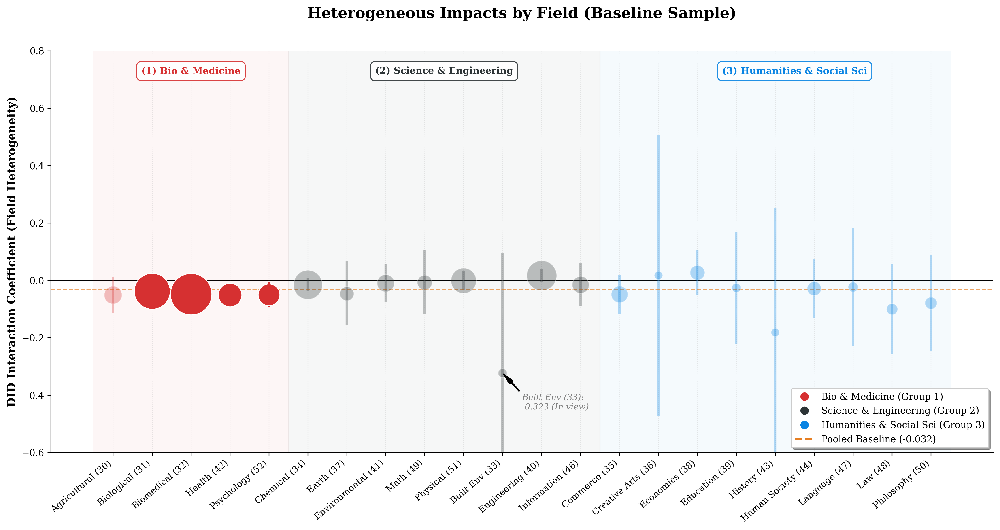

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.lines import Line2D

# 1. 整理数据（使用你提供的数据集）
data = {
    'Field': [
        'Agricultural (30)', 'Biological (31)', 'Biomedical (32)', 'Health (42)', 'Psychology (52)',
        'Chemical (34)', 'Earth (37)', 'Environmental (41)', 'Math (49)', 'Physical (51)',
        'Built Env (33)', 'Engineering (40)', 'Information (46)',
        'Commerce (35)', 'Creative Arts (36)', 'Economics (38)', 'Education (39)', 
        'History (43)', 'Human Society (44)', 'Language (47)', 'Law (48)', 'Philosophy (50)'
    ],
    'Estimate': [
        -0.051, -0.038, -0.048, -0.051, -0.050,
        -0.015, -0.046, -0.010, -0.007, -0.001,
        -0.323, 0.017, -0.015,
        -0.049, 0.018, 0.027, -0.026, 
        -0.181, -0.028, -0.023, -0.100, -0.079
    ],
    'CI_Lower': [
        -0.113, -0.052, -0.058, -0.086, -0.093,
        -0.038, -0.157, -0.076, -0.119, -0.034,
        -0.741, -0.006, -0.091,
        -0.119, -0.472, -0.050, -0.222, 
        -0.614, -0.131, -0.229, -0.257, -0.246
    ],
    'CI_Upper': [
        0.012, -0.023, -0.037, -0.017, -0.006,
        0.008, 0.066, 0.057, 0.105, 0.032,
        0.094, 0.040, 0.061,
        0.020, 0.508, 0.105, 0.169, 
        0.253, 0.075, 0.183, 0.057, 0.088
    ],
    'TreatedPapers': [
        355, 6554, 11652, 1160, 832, 
        2688, 125, 314, 162, 1554, 
        14, 3086, 285, 
        265, 10, 153, 17, 
        11, 125, 25, 45, 63
    ],
    'Category': [
        'Bio & Med', 'Bio & Med', 'Bio & Med', 'Bio & Med', 'Bio & Med',
        'Sci & Eng', 'Sci & Eng', 'Sci & Eng', 'Sci & Eng', 'Sci & Eng',
        'Sci & Eng', 'Sci & Eng', 'Sci & Eng',
        'Hum & Soc', 'Hum & Soc', 'Hum & Soc', 'Hum & Soc', 
        'Hum & Soc', 'Hum & Soc', 'Hum & Soc', 'Hum & Soc', 'Hum & Soc'
    ]
}

df = pd.DataFrame(data)

# 2. 绘图配置
plt.rcParams['font.family'] = 'serif'
fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

# 定义颜色
colors = {'Bio & Med': '#d63031', 'Sci & Eng': '#2d3436', 'Hum & Soc': '#0984e3'}

# 3. 循环绘制每个点和误差棒
for i, row in df.iterrows():
    # 显著性判断 (不跨越0)
    is_sig = (row['CI_Lower'] > 0) or (row['CI_Upper'] < 0)
    color = colors[row['Category']]
    
    # 视觉权重：基于样本量确定气泡大小
    size = np.sqrt(row['TreatedPapers']) * 18 + 20
    alpha_val = 1.0 if is_sig else 0.3
    
    # 绘制误差棒 (Confidence Interval)
    ax.vlines(i, row['CI_Lower'], row['CI_Upper'], color=color, alpha=alpha_val, linewidth=2.5, zorder=2)
    
    # 绘制点 (Estimate)
    ax.scatter(i, row['Estimate'], color=color, s=size, alpha=alpha_val, 
               edgecolor='white', linewidth=0.8, zorder=3)

# 4. 装饰与参考线
ax.axhline(0, color='black', linewidth=1.2, zorder=1)
# 添加基准参考线 (主回归系数)
ax.axhline(-0.032, color='#e67e22', linestyle='--', linewidth=1.2, alpha=0.7)

# 坐标轴美化
ax.set_xticks(range(len(df)))
ax.set_xticklabels(df['Field'], rotation=40, ha='right', fontsize=9.5)

# --- 重点：截断处理极端值 ---
# 根据当前数据分布，Built Env (-0.323) 虽然不比 -2.228，但为了保持风格一致，保留 y 轴范围限制
ax.set_ylim(-0.6, 0.8) 

# 在截断处添加标注（针对 Built Env 33）
ax.annotate('Built Env (33):\n-0.323 (In view)', xy=(10, -0.323), xytext=(10.5, -0.45),
            arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=5),
            fontsize=9, color='gray', fontstyle='italic')

# 5. 分区标注与背景色
cat_info = [
    (2, '(1) Bio & Medicine', '#d63031'),
    (8.5, '(2) Science & Engineering', '#2d3436'),
    (17.5, '(3) Humanities & Social Sci', '#0984e3')
]
for pos, label, clr in cat_info:
    ax.text(pos, 0.72, label, ha='center', fontweight='black', color=clr,
            bbox=dict(facecolor='white', alpha=0.9, edgecolor=clr, boxstyle='round,pad=0.5'))

ax.axvspan(-0.5, 4.5, color='#d63031', alpha=0.04)
ax.axvspan(4.5, 12.5, color='#2d3436', alpha=0.04)
ax.axvspan(12.5, 21.5, color='#0984e3', alpha=0.04)

# 6. 设置标签和标题
ax.set_ylabel('DID Interaction Coefficient (Field Heterogeneity)', fontweight='bold', fontsize=12)
ax.set_title('Heterogeneous Impacts by Field (Baseline Sample)', pad=35, fontsize=16, fontweight='bold')

# 7. 手动构造图例
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Bio & Medicine (Group 1)', markerfacecolor='#d63031', markersize=10),
    Line2D([0], [0], marker='o', color='w', label='Science & Engineering (Group 2)', markerfacecolor='#2d3436', markersize=10),
    Line2D([0], [0], marker='o', color='w', label='Humanities & Social Sci (Group 3)', markerfacecolor='#0984e3', markersize=10),
    Line2D([0], [0], color='#e67e22', lw=2, linestyle='--', label='Pooled Baseline (-0.032)')
]
ax.legend(handles=legend_elements, loc='lower right', frameon=True, fontsize=10, shadow=True)

ax.xaxis.grid(True, linestyle=':', alpha=0.3)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

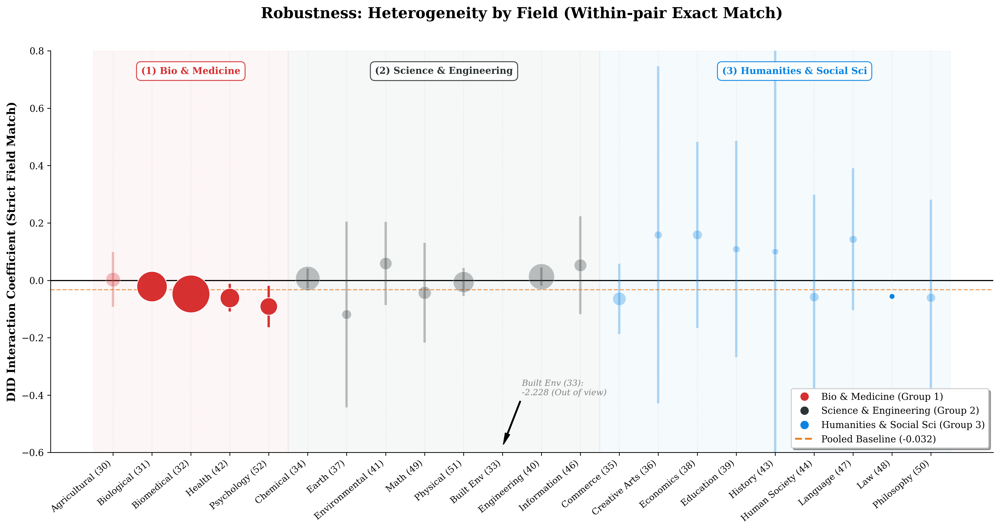

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.lines import Line2D

# 1. 整理最新数据 (Strict Field Match)
data = {
    'Field': [
        'Agricultural (30)', 'Biological (31)', 'Biomedical (32)', 'Health (42)', 'Psychology (52)',
        'Chemical (34)', 'Earth (37)', 'Environmental (41)', 'Math (49)', 'Physical (51)',
        'Built Env (33)', 'Engineering (40)', 'Information (46)',
        'Commerce (35)', 'Creative Arts (36)', 'Economics (38)', 'Education (39)', 
        'History (43)', 'Human Society (44)', 'Language (47)', 'Law (48)', 'Philosophy (50)'
    ],
    'Estimate': [
        0.003, -0.021, -0.047, -0.061, -0.091,
        0.007, -0.119, 0.059, -0.043, -0.006,
        -2.228, 0.013, 0.053,
        -0.064, 0.159, 0.159, 0.109, 
        0.100, -0.058, 0.143, -0.056, -0.060
    ],
    'CI_Lower': [
        -0.092, -0.041, -0.060, -0.109, -0.163,
        -0.027, -0.443, -0.086, -0.217, -0.055,
        -2.228, -0.019, -0.118,
        -0.187, -0.429, -0.166, -0.268, 
        -1.018, -0.415, -0.104, -0.056, -0.401
    ],
    'CI_Upper': [
        0.099, -0.001, -0.034, -0.012, -0.019,
        0.041, 0.205, 0.204, 0.131, 0.043,
        -2.228, 0.045, 0.223,
        0.058, 0.746, 0.483, 0.486, 
        1.217, 0.299, 0.391, -0.056, 0.281
    ],
    'TreatedPapers': [
        143, 3340, 8071, 524, 334,
        1290, 20, 67, 83, 685,
        2, 1702, 73,
        98, 7, 21, 4, 
        2, 17, 7, 1, 15
    ],
    'Category': [
        'Bio & Med', 'Bio & Med', 'Bio & Med', 'Bio & Med', 'Bio & Med',
        'Sci & Eng', 'Sci & Eng', 'Sci & Eng', 'Sci & Eng', 'Sci & Eng',
        'Sci & Eng', 'Sci & Eng', 'Sci & Eng',
        'Hum & Soc', 'Hum & Soc', 'Hum & Soc', 'Hum & Soc', 
        'Hum & Soc', 'Hum & Soc', 'Hum & Soc', 'Hum & Soc', 'Hum & Soc'
    ]
}

df = pd.DataFrame(data)

# 2. 绘图配置
plt.rcParams['font.family'] = 'serif'
fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

# 定义颜色
colors = {'Bio & Med': '#d63031', 'Sci & Eng': '#2d3436', 'Hum & Soc': '#0984e3'}

# 3. 循环绘制每个点和误差棒
for i, row in df.iterrows():
    # 显著性判断 (不跨越0)
    is_sig = (row['CI_Lower'] > 0) or (row['CI_Upper'] < 0)
    color = colors[row['Category']]
    
    # 视觉权重：基于样本量确定气泡大小
    size = np.sqrt(row['TreatedPapers']) * 18 + 20
    alpha_val = 1.0 if is_sig else 0.3
    
    # 绘制误差棒 (Confidence Interval)
    ax.vlines(i, row['CI_Lower'], row['CI_Upper'], color=color, alpha=alpha_val, linewidth=2.5, zorder=2)
    
    # 绘制点 (Estimate)
    ax.scatter(i, row['Estimate'], color=color, s=size, alpha=alpha_val, 
               edgecolor='white', linewidth=0.8, zorder=3)

# 4. 装饰与参考线
ax.axhline(0, color='black', linewidth=1.2, zorder=1)
# 添加基准参考线 (主回归系数)
ax.axhline(-0.032, color='#e67e22', linestyle='--', linewidth=1.2, alpha=0.7)

# 坐标轴美化
ax.set_xticks(range(len(df)))
ax.set_xticklabels(df['Field'], rotation=40, ha='right', fontsize=9.5)

# --- 重点：截断处理极端值 ---
# 因为 Built Env (-2.228) 严重拉长了 Y 轴，我们截断视图以聚焦大部分数据
ax.set_ylim(-0.6, 0.8) 

# 在截断处添加标注说明极端值
ax.annotate('Built Env (33):\n-2.228 (Out of view)', xy=(10, -0.58), xytext=(10.5, -0.4),
            arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=5),
            fontsize=9, color='gray', fontstyle='italic')

# 5. 分区标注与背景色
cat_info = [
    (2, '(1) Bio & Medicine', '#d63031'),
    (8.5, '(2) Science & Engineering', '#2d3436'),
    (17.5, '(3) Humanities & Social Sci', '#0984e3')
]
for pos, label, clr in cat_info:
    ax.text(pos, 0.72, label, ha='center', fontweight='black', color=clr,
            bbox=dict(facecolor='white', alpha=0.9, edgecolor=clr, boxstyle='round,pad=0.5'))

ax.axvspan(-0.5, 4.5, color='#d63031', alpha=0.04)
ax.axvspan(4.5, 12.5, color='#2d3436', alpha=0.04)
ax.axvspan(12.5, 21.5, color='#0984e3', alpha=0.04)

# 6. 设置标签和标题
ax.set_ylabel('DID Interaction Coefficient (Strict Field Match)', fontweight='bold', fontsize=12)
ax.set_title('Robustness: Heterogeneity by Field (Within-pair Exact Match)', pad=35, fontsize=16, fontweight='bold')

# 7. 手动构造图例 (修复 Line224 -> Line2D)
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Bio & Medicine (Group 1)', markerfacecolor='#d63031', markersize=10),
    Line2D([0], [0], marker='o', color='w', label='Science & Engineering (Group 2)', markerfacecolor='#2d3436', markersize=10),
    Line2D([0], [0], marker='o', color='w', label='Humanities & Social Sci (Group 3)', markerfacecolor='#0984e3', markersize=10),
    Line2D([0], [0], color='#e67e22', lw=2, linestyle='--', label='Pooled Baseline (-0.032)')
]
ax.legend(handles=legend_elements, loc='lower right', frameon=True, fontsize=10, shadow=True)

ax.xaxis.grid(True, linestyle=':', alpha=0.3)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

## 三、JCR分区


###  数据导入

In [124]:
#导入未进行异质性变量匹配的数据
panel_df = pd.read_csv("/Data4/yutao_wen/26.1.30/DOM_0.4_ConclusionInd_field3.csv")

In [125]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,...,field_33,field_43,Crossfield_small,Bigfield,BigR_field,Bigfield1,Bigfield2,Bigfield3,field_consistent,Crossfield_big
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,...,0,0,0,1,1,1,0,0,1,0
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,...,0,0,0,1,1,1,0,0,1,0
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,...,0,0,0,1,1,1,0,0,1,0
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,...,0,0,0,1,1,1,0,0,1,0
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,...,0,0,0,1,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,...,0,0,0,1,1,1,0,0,1,0
631986,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,...,0,0,0,1,1,1,0,0,1,0
631987,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,...,0,0,0,1,1,1,0,0,1,0
631988,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,...,0,0,0,1,1,1,0,0,1,0


In [126]:
#需要加上期刊信息
#df_containretra3有Journal_id和RJournal_id
df_containretra3 = pd.read_csv("/Data4/yutao_wen/25.9.29/df_containretra3.csv")

In [127]:
#导入分区数据
jcr_df = pd.read_csv("/Data4/yutao_wen/journal_if_issn_eissn2025.csv")

In [128]:
jcr_df

,期刊名称,2024JIF,Quartile,JIF rank,2023分区,Total citation,Category,ISSN,eISSN,match_key,journal.id
0,CA-A CANCER JOURNAL FOR CLINICIANS,232.4,Q1,1/326,Q1,71799.0,ONCOLOGY(SCIE),0007-9235,1542-4863,CA A CANCER JOURNAL FOR CLINICIANS,jour.1017088
1,NATURE REVIEWS MICROBIOLOGY,103.3,Q1,1/163,Q1,61109.0,MICROBIOLOGY(SCIE),1740-1526,1740-1534,NATURE REVIEWS MICROBIOLOGY,jour.1032854
2,NATURE REVIEWS DRUG DISCOVERY,101.8,Q1,1/352,Q1,52833.0,BIOTECHNOLOGY & APPLIED MICROBIOLOGY(SCIE);PHA...,1474-1776,1474-1784,NATURE REVIEWS DRUG DISCOVERY,jour.1327423
3,NATURE REVIEWS MOLECULAR CELL BIOLOGY,90.2,Q1,1/204,Q1,73135.0,CELL BIOLOGY(SCIE),1471-0072,1471-0080,NATURE REVIEWS MOLECULAR CELL BIOLOGY,jour.1023609
4,Kidney International Supplements,89.6,Q1,1/133,Q1,3196.0,UROLOGY & NEPHROLOGY(SCIE),2157-1724,2157-1716,KIDNEY INTERNATIONAL SUPPLEMENTS,jour.1045229
...,...,...,...,...,...,...,...,...,...,...,...
22244,PROCEEDINGS OF THE LONDON MATHEMATICAL SOCIETY,1.6,Q1,53/483,Q1,5484.0,MATHEMATICS(SCIE),0024-6115,1460-244X,PROCEEDINGS OF THE LONDON MATHEMATICAL SOCIETY,jour.1137070
22245,JOURNAL OF DIFFERENTIAL GEOMETRY,1.6,Q1,53/483,Q1,5531.0,MATHEMATICS(SCIE),0022-040X,1945-743X,JOURNAL OF DIFFERENTIAL GEOMETRY,jour.1222640
22246,JOURNAL OF FUNCTIONAL ANALYSIS,1.6,Q1,53/483,Q1,13833.0,MATHEMATICS(SCIE),0022-1236,1096-0783,JOURNAL OF FUNCTIONAL ANALYSIS,jour.1137002
22247,ANNALES SCIENTIFIQUES DE L ECOLE NORMALE SUPER...,1.6,Q1,53/483,Q1,2931.0,MATHEMATICS(SCIE),0012-9593,1873-2151,ANNALES SCIENTIFIQUES DE L ECOLE NORMALE SUPER...,jour.1142528


In [129]:
jcr_df = jcr_df.rename(columns={
    'Quartile': 'jcr',
    'journal.id': 'id'
})

In [130]:
jcr_df

,期刊名称,2024JIF,jcr,JIF rank,2023分区,Total citation,Category,ISSN,eISSN,match_key,id
0,CA-A CANCER JOURNAL FOR CLINICIANS,232.4,Q1,1/326,Q1,71799.0,ONCOLOGY(SCIE),0007-9235,1542-4863,CA A CANCER JOURNAL FOR CLINICIANS,jour.1017088
1,NATURE REVIEWS MICROBIOLOGY,103.3,Q1,1/163,Q1,61109.0,MICROBIOLOGY(SCIE),1740-1526,1740-1534,NATURE REVIEWS MICROBIOLOGY,jour.1032854
2,NATURE REVIEWS DRUG DISCOVERY,101.8,Q1,1/352,Q1,52833.0,BIOTECHNOLOGY & APPLIED MICROBIOLOGY(SCIE);PHA...,1474-1776,1474-1784,NATURE REVIEWS DRUG DISCOVERY,jour.1327423
3,NATURE REVIEWS MOLECULAR CELL BIOLOGY,90.2,Q1,1/204,Q1,73135.0,CELL BIOLOGY(SCIE),1471-0072,1471-0080,NATURE REVIEWS MOLECULAR CELL BIOLOGY,jour.1023609
4,Kidney International Supplements,89.6,Q1,1/133,Q1,3196.0,UROLOGY & NEPHROLOGY(SCIE),2157-1724,2157-1716,KIDNEY INTERNATIONAL SUPPLEMENTS,jour.1045229
...,...,...,...,...,...,...,...,...,...,...,...
22244,PROCEEDINGS OF THE LONDON MATHEMATICAL SOCIETY,1.6,Q1,53/483,Q1,5484.0,MATHEMATICS(SCIE),0024-6115,1460-244X,PROCEEDINGS OF THE LONDON MATHEMATICAL SOCIETY,jour.1137070
22245,JOURNAL OF DIFFERENTIAL GEOMETRY,1.6,Q1,53/483,Q1,5531.0,MATHEMATICS(SCIE),0022-040X,1945-743X,JOURNAL OF DIFFERENTIAL GEOMETRY,jour.1222640
22246,JOURNAL OF FUNCTIONAL ANALYSIS,1.6,Q1,53/483,Q1,13833.0,MATHEMATICS(SCIE),0022-1236,1096-0783,JOURNAL OF FUNCTIONAL ANALYSIS,jour.1137002
22247,ANNALES SCIENTIFIQUES DE L ECOLE NORMALE SUPER...,1.6,Q1,53/483,Q1,2931.0,MATHEMATICS(SCIE),0012-9593,1873-2151,ANNALES SCIENTIFIQUES DE L ECOLE NORMALE SUPER...,jour.1142528


### 匹配JCR分区

In [131]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,...,field_33,field_43,Crossfield_small,Bigfield,BigR_field,Bigfield1,Bigfield2,Bigfield3,field_consistent,Crossfield_big
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,...,0,0,0,1,1,1,0,0,1,0
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,...,0,0,0,1,1,1,0,0,1,0
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,...,0,0,0,1,1,1,0,0,1,0
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,...,0,0,0,1,1,1,0,0,1,0
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,...,0,0,0,1,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,...,0,0,0,1,1,1,0,0,1,0
631986,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,...,0,0,0,1,1,1,0,0,1,0
631987,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,...,0,0,0,1,1,1,0,0,1,0
631988,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,...,0,0,0,1,1,1,0,0,1,0


In [132]:
# 假设你的配对 ID 列名为 'pair_id'
# 计算每个 pair 内部 journal_id 的去重数量
mismatch_counts = panel_df.groupby('pair')['journal_id'].nunique()

# 筛选出数量大于 1 的 pair（即实验组和控制组 journal_id 不同）
mismatch_pairs = mismatch_counts[mismatch_counts > 1]

print(f"📊 总 Pair 数: {len(mismatch_counts)}")
print(f"🚨 存在 journal_id 不一致的 Pair 数: {len(mismatch_pairs)}")
print(f"❌ 不一致比例: {len(mismatch_pairs) / len(mismatch_counts):.2%}")

📊 总 Pair 数: 23288
🚨 存在 journal_id 不一致的 Pair 数: 0
❌ 不一致比例: 0.00%


In [133]:
import pandas as pd
import numpy as np

# =====================================================
# ✅ 修正：去除 Q 保留数字，且取最优分区 (1 > 2)
# =====================================================

# 1. 直接清洗 jcr 列：提取数字
# 例如 "Q1" -> 1.0, "Q2" -> 2.0
# 使用 float 是为了防止有空值(NaN)时报错，如果没有空值后续可转 int
jcr_df['jcr'] = jcr_df['jcr'].astype(str).str.extract(r"(\d+)").astype(float)

# 2. 关键：按 id 和 jcr (数值) 排序，然后只根据 id 去重
# 数值排序：1.0 < 2.0，升序排列会将 1 放在前面
# keep='first' 会保留数字最小（即分区最优）的那一行
jcr_df_unique = (
    jcr_df.sort_values(by=["id", "jcr"], ascending=[True, True])
    .drop_duplicates(subset=["id"], keep="first")
    .copy()
)

# 3. 处理 ID 字符串 (去除 'jour.' 并统一为字符串)
jcr_df_unique['id'] = (
    jcr_df_unique['id']
    .astype(str)
    .str.replace('jour.', '', regex=False)
    .str.replace(r'\.0$', '', regex=True) # 顺便把 .0 也处理掉，防止后面匹配不上
)

# =====================================================
# ✅ 修正版：对齐数据类型后再合并
# =====================================================

# 1. 记录原始行数
original_rows = len(panel_df)

# 2. 确保左表(panel_df)的关联键是清洗干净的字符串
panel_df['journal_id'] = panel_df['journal_id'].astype(str).str.replace(r'\.0$', '', regex=True)

# 3. 执行 merge
# 注意：此时 jcr_df_unique['jcr'] 已经是纯数字了
panel_df = panel_df.merge(
    jcr_df_unique[["id", "jcr"]],
    how="left",
    left_on="journal_id",
    right_on="id"
)

# 4. 删除多余的 id 列
panel_df = panel_df.drop(columns=["id"])

# (可选) 5. 美化 jcr 列：如果你不想要 1.0 这种带小数点的，且没有空值，可以转为 int
# panel_df['jcr'] = panel_df['jcr'].fillna(0).astype(int) # 视情况开启

# 验证结果
if len(panel_df) != original_rows:
    print(f"🚨 警告！行数不匹配：原 {original_rows}，现 {len(panel_df)}")
else:
    print(f"✅ 合并成功，行数保持一致：{original_rows}")
    # 打印前几行看看 jcr 是否变成了 1, 2...
    print(panel_df[['journal_id', 'jcr']].head())

✅ 合并成功，行数保持一致：631990
  journal_id  jcr
0    1029717  1.0
1    1029717  1.0
2    1029717  1.0
3    1029717  1.0
4    1029717  1.0


In [134]:
panel_df.describe()

,group,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,...,field_43,Crossfield_small,Bigfield,BigR_field,Bigfield1,Bigfield2,Bigfield3,field_consistent,Crossfield_big,jcr
count,631990.0,631990.00000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,...,631990.00000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.00000,586880.000000
mean,0.5,2014.93229,2007.864580,2013.659001,8.231820,1.640486,0.536834,0.268417,1.273289,5.012469,...,0.00025,0.307568,1.249854,1.173955,0.726814,0.241505,0.017927,0.907533,0.03919,1.698705
std,0.5,5.21755,4.964693,5.381865,15.409225,1.068767,0.498642,0.443136,6.272990,2.826784,...,0.01581,0.547344,0.552994,0.590008,0.445596,0.427996,0.132688,0.289684,0.35252,0.797228
min,0.0,1995.00000,1995.000000,1996.000000,0.000000,0.000000,0.000000,0.000000,-26.000000,1.000000,...,0.00000,-1.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,-1.00000,1.000000
25%,0.0,2012.00000,2004.000000,2011.000000,1.000000,0.693147,0.000000,0.000000,-3.000000,3.000000,...,0.00000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.00000,1.000000
50%,0.5,2016.00000,2008.000000,2015.000000,4.000000,1.609438,1.000000,0.000000,1.000000,5.000000,...,0.00000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.00000,2.000000
75%,1.0,2019.00000,2012.000000,2018.000000,10.000000,2.397895,1.000000,1.000000,5.000000,7.000000,...,0.00000,1.000000,2.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.00000,2.000000
max,1.0,2022.00000,2015.000000,2022.000000,1114.000000,7.016610,1.000000,1.000000,26.000000,27.000000,...,1.00000,1.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.00000,4.000000


In [135]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,...,field_43,Crossfield_small,Bigfield,BigR_field,Bigfield1,Bigfield2,Bigfield3,field_consistent,Crossfield_big,jcr
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,...,0,0,1,1,1,0,0,1,0,1.0
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,...,0,0,1,1,1,0,0,1,0,1.0
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,...,0,0,1,1,1,0,0,1,0,1.0
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,...,0,0,1,1,1,0,0,1,0,1.0
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,...,0,0,1,1,1,0,0,1,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,...,0,0,1,1,1,0,0,1,0,1.0
631986,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,...,0,0,1,1,1,0,0,1,0,1.0
631987,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,...,0,0,1,1,1,0,0,1,0,1.0
631988,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,...,0,0,1,1,1,0,0,1,0,1.0


In [136]:
import pandas as pd

# ==========================================
# 1. 填充 JCR 列的空值为 5
# ==========================================
# 假设 JCR 列原本是浮点数或整数，含有 NaN
panel_df['jcr'] = panel_df['jcr'].fillna(5).astype(int)

# ==========================================
# 2. 统计实验组与控制组的 JCR 分布
# ==========================================
# 注意：我们要看的是论文层面的分布，所以先按 paper_numid 去重
unique_papers = panel_df.drop_duplicates(subset='paper_numid')

# 使用 crosstab 生成频数表
jcr_dist = pd.crosstab(unique_papers['group'], unique_papers['jcr'])

# 转换为百分比（按行归一化）以观察分布比例
jcr_pct = pd.crosstab(unique_papers['group'], unique_papers['jcr'], normalize='index') * 100

# 整理显示
jcr_dist.index = ['Control (G0)', 'Treated (G1)']
jcr_pct.index = ['Control (G0) %', 'Treated (G1) %']

print("=== JCR 分区频数分布 (篇数) ===")
print(jcr_dist)
print("\n=== JCR 分区百分比分布 (%) ===")
print(jcr_pct.round(2))

=== JCR 分区频数分布 (篇数) ===
jcr               1     2     3    4     5
Control (G0)  10296  7695  2783  625  1889
Treated (G1)  10296  7695  2783  625  1889

=== JCR 分区百分比分布 (%) ===
jcr                 1      2      3     4     5
Control (G0) %  44.21  33.04  11.95  2.68  8.11
Treated (G1) %  44.21  33.04  11.95  2.68  8.11


In [137]:
panel_df


,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,...,field_43,Crossfield_small,Bigfield,BigR_field,Bigfield1,Bigfield2,Bigfield3,field_consistent,Crossfield_big,jcr
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,...,0,0,1,1,1,0,0,1,0,1
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,...,0,0,1,1,1,0,0,1,0,1
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,...,0,0,1,1,1,0,0,1,0,1
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,...,0,0,1,1,1,0,0,1,0,1
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,...,0,0,1,1,1,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,...,0,0,1,1,1,0,0,1,0,1
631986,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,...,0,0,1,1,1,0,0,1,0,1
631987,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,...,0,0,1,1,1,0,0,1,0,1
631988,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,...,0,0,1,1,1,0,0,1,0,1


### 匹配RJCR分区

In [138]:
import pandas as pd

# =====================================================
# ✅ 修正版：针对 RJournal_id 进行 rjcr 分区匹配
# =====================================================

# 1. 准备 JCR 字典表并【强制去重】
rjcr_lookup = jcr_df_unique[["id", "jcr"]].copy()
rjcr_lookup.columns = ["RJournal_id", "rjcr"]

# 预处理 ID
rjcr_lookup["RJournal_id"] = rjcr_lookup["RJournal_id"].astype(str).str.replace('jour.', '', regex=False)

# --- 关键去重步骤 ---
# 提取数字，用于在重复时取“最优分区”（即数字最小的，Q1 < Q4）
rjcr_lookup["rjcr_num"] = rjcr_lookup["rjcr"].astype(str).str.extract(r"(\d+)").astype(float)

# 按照 ID 分组，保留 jcr 数字最小的那一行
rjcr_lookup = (
    rjcr_lookup.sort_values(["RJournal_id", "rjcr_num"])
    .drop_duplicates(subset="RJournal_id", keep="first")
    .drop(columns=["rjcr_num"])
)
# --------------------

# 2. 预处理主表 ID 格式
panel_df['RJournal_id'] = panel_df['RJournal_id'].astype(str).str.replace('jour.', '', regex=False)

# 3. 执行合并前记录原始行数
original_row_count = len(panel_df)

if 'rjcr' in panel_df.columns:
    panel_df = panel_df.drop(columns=['rjcr'])

# 执行合并
panel_df = panel_df.merge(rjcr_lookup, on="RJournal_id", how="left")

# 验证行数是否发生膨胀
if len(panel_df) != original_row_count:
    raise ValueError(f"🚨 数据膨胀！原行数: {original_row_count}, 合并后: {len(panel_df)}。请检查 rjcr_lookup 是否唯一。")

# 4. 格式清洗
panel_df["rjcr"] = (
    panel_df["rjcr"]
    .astype(str)
    .str.extract(r"(\d+)")
    .astype(float)
    .fillna(5)      # 没匹配上的标记为 5 (Non-JCR)
    .astype(int)
)

# =====================================================
# ✅ 关键同步：确保相同 pair 的 rjcr 值一致
# =====================================================

# 提取每个 pair 中实验组 (group=1) 的 rjcr 值
# 使用 groupby().max() 或 first()，因为此时每个 pair 的实验组理应只有一个对应期刊
rjcr_pair_map = panel_df[panel_df['group'] == 1].groupby('pair')['rjcr'].first()

# 强制映射回全表
panel_df['rjcr'] = panel_df['pair'].map(rjcr_pair_map).fillna(5).astype(int)

# 清理冗余列
cols_to_drop = [c for c in panel_df.columns if c.endswith('_x') or c.endswith('_y')]
if cols_to_drop:
    panel_df = panel_df.drop(columns=cols_to_drop)

print(f"✅ 处理完成。最终行数: {len(panel_df)} (原始行数: {original_row_count})")

✅ 处理完成。最终行数: 631990 (原始行数: 631990)


### 定义高JCR引低JCR的虚拟变量

In [139]:
#我想知道jcr比rjcr低的比例是多少
#我需要分别统计实验组控制组的个体数

In [140]:
panel_df.describe()

,group,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,...,Crossfield_small,Bigfield,BigR_field,Bigfield1,Bigfield2,Bigfield3,field_consistent,Crossfield_big,jcr,rjcr
count,631990.0,631990.00000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,...,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.00000,631990.000000,631990.000000
mean,0.5,2014.93229,2007.864580,2013.659001,8.231820,1.640486,0.536834,0.268417,1.273289,5.012469,...,0.307568,1.249854,1.173955,0.726814,0.241505,0.017927,0.907533,0.03919,1.934344,1.401307
std,0.5,5.21755,4.964693,5.381865,15.409225,1.068767,0.498642,0.443136,6.272990,2.826784,...,0.547344,0.552994,0.590008,0.445596,0.427996,0.132688,0.289684,0.35252,1.145685,0.706246
min,0.0,1995.00000,1995.000000,1996.000000,0.000000,0.000000,0.000000,0.000000,-26.000000,1.000000,...,-1.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,-1.00000,1.000000,1.000000
25%,0.0,2012.00000,2004.000000,2011.000000,1.000000,0.693147,0.000000,0.000000,-3.000000,3.000000,...,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.00000,1.000000,1.000000
50%,0.5,2016.00000,2008.000000,2015.000000,4.000000,1.609438,1.000000,0.000000,1.000000,5.000000,...,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.00000,2.000000,1.000000
75%,1.0,2019.00000,2012.000000,2018.000000,10.000000,2.397895,1.000000,1.000000,5.000000,7.000000,...,1.000000,2.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.00000,2.000000,2.000000
max,1.0,2022.00000,2015.000000,2022.000000,1114.000000,7.016610,1.000000,1.000000,26.000000,27.000000,...,1.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.00000,5.000000,5.000000


In [141]:
import pandas as pd

# 1. 提取论文层面的唯一数据（避免面板数据多年观测值的重复干扰）
unique_papers = panel_df.drop_duplicates(subset='paper_numid').copy()

# 2. 类型强制转换与清洗 (防止 TypeError: '<' not supported)
# 确保 jcr 和 rjcr 都是纯数值，且空值填充为 5
for col in ['jcr', 'rjcr']:
    # 将所有内容转为字符串后再提取数字，最后转为 float
    unique_papers[col] = pd.to_numeric(
        unique_papers[col].astype(str).str.extract(r'(\d+)', expand=False), 
        errors='coerce'
    ).fillna(5).astype(int)

# 3. 计算逻辑：jcr 比 rjcr 低 (即档次更高，数值更小)
# 逻辑：jcr < rjcr
unique_papers['is_better'] = unique_papers['jcr'] < unique_papers['rjcr']

# 4. 统计实验组与控制组的个体数 (N)
group_counts = unique_papers['group'].value_counts()

# 5. 分组计算“jcr优于rjcr”的比例
# group=0: 控制组, group=1: 实验组
results = unique_papers.groupby('group')['is_better'].agg(['count', 'mean'])
results['mean'] = results['mean'] * 100  # 转为百分比

# 6. 整理输出表格
summary = pd.DataFrame({
    '个体数 (N)': results['count'].astype(int),
    'jcr优于rjcr的比例 (%)': results['mean'].round(2)
})
summary.index = ['控制组 (Group 0)', '实验组 (Group 1)']

print("=== 自身期刊 (jcr) 与 被引期刊 (rjcr) 档次对比统计 ===")
print(summary)

# 验证全局比例
total_ratio = unique_papers['is_better'].mean() * 100
print(f"\n全样本中总计有 {total_ratio:.2f}% 的论文发表在比其参考文献更高档次的期刊上。")

=== 自身期刊 (jcr) 与 被引期刊 (rjcr) 档次对比统计 ===
               个体数 (N)  jcr优于rjcr的比例 (%)
控制组 (Group 0)    23288             13.76
实验组 (Group 1)    23288             13.76

全样本中总计有 13.76% 的论文发表在比其参考文献更高档次的期刊上。


In [142]:
import numpy as np
import pandas as pd

# 1. 使用 np.select 重新定义 rjcr_better
# 条件逻辑：数值越小，分区越高
conditions = [
    (panel_df['rjcr'] < panel_df['jcr']),  # 参考文献更好 (1)
    (panel_df['rjcr'] == panel_df['jcr']), # 分区相同 (0)
    (panel_df['rjcr'] > panel_df['jcr'])   # 参考文献更差 (-1)
]
choices = [1, 0, -1]

panel_df['rjcr_better'] = np.select(conditions, choices, default=0)

# 2. 强制执行 Pair 同步逻辑（确保控制组和实验组完全一致）
# 提取实验组的判断结果作为映射表
rjcr_better_map = panel_df[panel_df['group'] == 1].groupby('pair')['rjcr_better'].first()

# 应用映射，确保同对子内的值对齐
panel_df['rjcr_better'] = panel_df['pair'].map(rjcr_better_map).fillna(0).astype(int)

# 3. 统计分布
unique_papers = panel_df.drop_duplicates(subset='paper_numid').copy()
dist_stats = pd.crosstab(unique_papers['group'], unique_papers['rjcr_better'], normalize='index') * 100

print("=== 重新定义后：rjcr_better 分布统计 (%) ===")
print("注：1:向上引用, 0:同级引用, -1:向下引用")
print(dist_stats.round(2))

# 4. 统计个体数 N
n_stats = unique_papers.groupby('group')['rjcr_better'].count()
print(f"\n每组个体数 (N): \n{n_stats}")

=== 重新定义后：rjcr_better 分布统计 (%) ===
注：1:向上引用, 0:同级引用, -1:向下引用
rjcr_better     -1     0      1
group                          
0            13.76  45.4  40.84
1            13.76  45.4  40.84

每组个体数 (N): 
group
0    23288
1    23288
Name: rjcr_better, dtype: int64


### 定义JCR引用距离


In [143]:
# 使用 rjcr - jcr 来定义 jcr_distance
# 这个数值为正说明 jcr 分区更高（数值更小）
# 这个数值为负说明 jcr 分区更低（数值更大）
import pandas as pd

# 1. 计算 jcr_distance (rjcr - jcr)
# 根据你的逻辑：
# jcr=1, rjcr=3 -> 2 (jcr更好)
# jcr=3, rjcr=1 -> -2 (jcr更差)
panel_df['jcr_distance'] = panel_df['rjcr'] - panel_df['jcr']

# 2. 强制同步：确保同对子 (pair) 内的数值以实验组 (group=1) 为准
# 这是为了消除匹配误差，确保回归时 Control 和 Treated 在这一维度上完全对齐
jcr_dist_map = panel_df[panel_df['group'] == 1].groupby('pair')['jcr_distance'].first()
panel_df['jcr_distance'] = panel_df['pair'].map(jcr_dist_map)

# 3. 统计个体数 (N) 与 描述性分析
unique_papers = panel_df.drop_duplicates(subset='paper_numid').copy()

# 4. 生成分布频数表
dist_summary = pd.crosstab(unique_papers['group'], unique_papers['jcr_distance'])

print("=== jcr_distance (rjcr - jcr) 频数分布统计 ===")
print(dist_summary)

# 5. 计算均值和标准差，观察整体偏移
print("\n=== jcr_distance 描述性统计 ===")
print(unique_papers.groupby('group')['jcr_distance'].agg(['mean', 'std', 'min', 'max']))

=== jcr_distance (rjcr - jcr) 频数分布统计 ===
jcr_distance    -4   -3    -2    -1      0     1    2    3   4
group                                                         
0             1247  797  1938  5528  10573  2560  468  102  75
1             1247  797  1938  5528  10573  2560  468  102  75

=== jcr_distance 描述性统计 ===
           mean       std  min  max
group                              
0     -0.544529  1.311425   -4    4
1     -0.544529  1.311425   -4    4


In [144]:
panel_df.describe()

,group,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,...,BigR_field,Bigfield1,Bigfield2,Bigfield3,field_consistent,Crossfield_big,jcr,rjcr,rjcr_better,jcr_distance
count,631990.0,631990.00000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,...,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.00000,631990.000000,631990.000000,631990.000000,631990.000000
mean,0.5,2014.93229,2007.864580,2013.659001,8.231820,1.640486,0.536834,0.268417,1.273289,5.012469,...,1.173955,0.726814,0.241505,0.017927,0.907533,0.03919,1.934344,1.401307,0.273343,-0.533037
std,0.5,5.21755,4.964693,5.381865,15.409225,1.068767,0.498642,0.443136,6.272990,2.826784,...,0.590008,0.445596,0.427996,0.132688,0.289684,0.35252,1.145685,0.706246,0.678083,1.270915
min,0.0,1995.00000,1995.000000,1996.000000,0.000000,0.000000,0.000000,0.000000,-26.000000,1.000000,...,-1.000000,0.000000,0.000000,0.000000,0.000000,-1.00000,1.000000,1.000000,-1.000000,-4.000000
25%,0.0,2012.00000,2004.000000,2011.000000,1.000000,0.693147,0.000000,0.000000,-3.000000,3.000000,...,1.000000,0.000000,0.000000,0.000000,1.000000,0.00000,1.000000,1.000000,0.000000,-1.000000
50%,0.5,2016.00000,2008.000000,2015.000000,4.000000,1.609438,1.000000,0.000000,1.000000,5.000000,...,1.000000,1.000000,0.000000,0.000000,1.000000,0.00000,2.000000,1.000000,0.000000,0.000000
75%,1.0,2019.00000,2012.000000,2018.000000,10.000000,2.397895,1.000000,1.000000,5.000000,7.000000,...,1.000000,1.000000,0.000000,0.000000,1.000000,0.00000,2.000000,2.000000,1.000000,0.000000
max,1.0,2022.00000,2015.000000,2022.000000,1114.000000,7.016610,1.000000,1.000000,26.000000,27.000000,...,3.000000,1.000000,1.000000,1.000000,1.000000,1.00000,5.000000,5.000000,1.000000,4.000000


In [145]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,...,BigR_field,Bigfield1,Bigfield2,Bigfield3,field_consistent,Crossfield_big,jcr,rjcr,rjcr_better,jcr_distance
0,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,-4.0,...,1,1,0,0,1,0,1,2,-1,1
1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,-3.0,...,1,1,0,0,1,0,1,2,-1,1
2,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,-2.0,...,1,1,0,0,1,0,1,2,-1,1
3,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,-1.0,...,1,1,0,0,1,0,1,2,-1,1
4,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,0.0,...,1,1,0,0,1,0,1,2,-1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,22.0,...,1,1,0,0,1,0,1,1,0,0
631986,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,23.0,...,1,1,0,0,1,0,1,1,0,0
631987,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,24.0,...,1,1,0,0,1,0,1,1,0,0
631988,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,25.0,...,1,1,0,0,1,0,1,1,0,0


### 保存备份panel_df

In [146]:
output_path = '/Data4/yutao_wen/26.1.30/DOM_0.4_ConclusionInd_field3_jcr.csv'
# 保存为 CSV 文件
panel_df.to_csv(output_path, index=False)

## 四、作者高被引论文数

### 数据导入

In [147]:
#需要的文件1
# 引入先前的数据
panel_df = pd.read_csv("/Data4/yutao_wen/26.1.30/DOM_0.4_ConclusionInd_field3_jcr.csv")

In [148]:
#看df文件的列名
print(panel_df .columns)

Index(['group', 'paper_id', 'year', 'PYear', 'RYear', 'yearlycitation',
       'log_yearlycitation', 'treated', 'did', 'pd', 'numa', 'numr',
       'journal_id', 'SelfRetra', 'pair', 'Num_Retra', 'paper_numid',
       'reference_ids', 'RJournal_id', 'Tags', 'ReasonList', 'ImageReuse_i',
       'ImageManipulation_i', 'DataFabrication_i', 'DataError_i',
       'RedundantPublication_i', 'ConclusionError_i', 'ImageError_i',
       'ImageFabrication_i', 'AnalysisError_i', 'MethodError_i', 'DataReuse_i',
       'Irreproducible_i', 'TextPlagiarism_i', 'ArticlePlagiarism_i',
       'DataManipulation_i', 'AutomaticGeneration_i', 'UnknownReason_i',
       'NoEthicsApproval_i', 'TextReuse_i', 'UnspecifiedMisconduct_i',
       'Unauthorized_i', 'MaterialContamination_i', 'ImagePlagiarism_i',
       'MaterialError_i', 'FakePeerReview_i', 'ResultFabrication_i',
       'DataPlagiarism_i', 'AuthorshipDispute_i', 'InappropriateCitation_i',
       'NoInformedConsent_i', 'OtherReason_i', 'field', 'R_fiel

In [149]:
#需要的文件2
#读取作者数据（每个作者每个存续年的累计高被引论文数）
import pandas as pd

# 指定你的文件路径
full_file_path = '/Data4/yutao_wen/26.1.5/cumulative_citations.parquet'

# 全量读取
res_df = pd.read_parquet(full_file_path, engine='pyarrow')

print("读取完成，数据预览：")
print(res_df.head())

读取完成，数据预览：
       researcher_id  year  whether_top1%_cumulative  \
0  ur.01000000010.53  2007                       0.0   
1  ur.01000000010.53  2008                       0.0   
2  ur.01000000010.53  2009                       0.0   
3  ur.01000000010.53  2010                       0.0   
4  ur.01000000010.53  2011                       0.0   

   whether_top5%_cumulative  whether_top10%_cumulative  
0                       0.0                        0.0  
1                       0.0                        0.0  
2                       0.0                        0.0  
3                       0.0                        0.0  
4                       0.0                        0.0  


In [150]:
#需要的文件3
# 此时需要第二个原始文件：论文—作者对应文件
# 其蕴含了数据库所有论文的各种信息
original_file2 = '/data6/Data1/DATA/Dimensions2024/20240101/PaperAuthor.csv'
df_author = pd.read_csv(original_file2)


In [151]:
df_author

,id,researcher_id
0,pub.1104981304,ur.01106645421.24
1,pub.1104981304,ur.01145132115.75
2,pub.1104981304,ur.011034104467.53
3,pub.1081444315,ur.046616417.23
4,pub.1081444315,ur.076556020.10
...,...,...
332743146,pub.1047334680,ur.010326562672.50
332743147,pub.1047334680,ur.07537520061.26
332743148,pub.1009104741,ur.011316210066.10
332743149,pub.1033071010,ur.010745345156.92


In [79]:
#我现在拥有一个有三个异质性的面板数据
#现在我要提取出来三列
#"paper_id"与"reference_ids"与"RYear"
#分别是实验组论文id、引用撤稿论文id、以及实验组论文受到冲击的年份
#因为我是需要去分别分别计算，
#在冲击发生年，每个实验组论文的所有作者的最高以及平均whether_topX%_cumulative
#以及每个对应的引用撤稿论文的所有作者的最高以及平均whether_topX%_cumulative
#这个X可以为1、5、10，在我后面的数据中会有
#然后我还有两个df文件
#一个是res_df
#展现的数据库所有作者每年的高被引论文累积量
#形如：
"""
researcher_id  year  whether_top1%_cumulative  \
0  ur.01000000010.53  2007                       0.0   
1  ur.01000000010.53  2008                       0.0   
2  ur.01000000010.53  2009                       0.0   
3  ur.01000000010.53  2010                       0.0   
4  ur.01000000010.53  2011                       0.0   

   whether_top5%_cumulative  whether_top10%_cumulative  
0                       0.0                        0.0  
1                       0.0                        0.0  
2                       0.0                        0.0  
3                       0.0                        0.0  
4                       0.0                        0.0  
"""
# 另一个是df_author
#展现的论文与作者对应关系
#形如：
"""
id	researcher_id
0	pub.1104981304	ur.01106645421.24
1	pub.1104981304	ur.01145132115.75
2	pub.1104981304	ur.011034104467.53
3	pub.1081444315	ur.046616417.23
4	pub.1081444315	ur.076556020.10
...	...	...
332743146	pub.1047334680	ur.010326562672.50
332743147	pub.1047334680	ur.07537520061.26
332743148	pub.1009104741	ur.011316210066.10
332743149	pub.1033071010	ur.010745345156.92
332743150	pub.1061382603	ur.013422206143.49
332743151 rows × 2 columns
"""

# 现在我们需要我的实验组论文的paper_id
# 以及引用撤稿论文的reference_ids
# 然后去df_author中匹配出对应的作者researcher_id
# 然后再去res_df中匹配出对应作者在对应年份RYear
# 的whether_topX%_cumulative（X为1、5、10）
# 最后计算出实验组论文与引用撤稿论文的作者
# 在对应年份的最高以及平均whether_topX%_cumulative
# 并存回panel_df中
#最终的panel_df只需要多这12列：
#（1）实验组论文作者在冲击年份的最高及平均whether_top1%_cumulative——Num_top1max、Num_top1mean
#（2）实验组论文作者在冲击年份的最高及平均whether_top5%_cumulative——Num_top5max、Num_top5mean
#（3）实验组论文作者在冲击年份的最高及平均whether_top10%_cumulative——Num_top10max、Num_top10mean
#（4）撤稿论文作者在冲击年份的最高以及平均whether_top1%_cumulative——RNum_top1max、RNum_top1mean
#（5）撤稿论文作者在冲击年份的最高以及平均whether_top5%_cumulative——RNum_top5max、RNum_top5mean
#（6）撤稿论文作者在冲击年份的最高以及平均whether_top10%_cumulative——RNum_top10max、RNum_top10mean
#由于每个实验组（group=1）都有一个控制组（group=0）与其对应，因此将相同pair下的控制组论文也赋予相同的数值
#即控制组论文的Num_top1max、Num_top1mean、Num_top5max、Num_top5mean、Num_top10max、Num_top10mean、RNum_top1max、RNum_top1mean、RNum_top5max、RNum_top5mean、RNum_top10max、RNum_top10mean
#均与其对应pair的实验组论文相同

'\nid\tresearcher_id\n0\tpub.1104981304\tur.01106645421.24\n1\tpub.1104981304\tur.01145132115.75\n2\tpub.1104981304\tur.011034104467.53\n3\tpub.1081444315\tur.046616417.23\n4\tpub.1081444315\tur.076556020.10\n...\t...\t...\n332743146\tpub.1047334680\tur.010326562672.50\n332743147\tpub.1047334680\tur.07537520061.26\n332743148\tpub.1009104741\tur.011316210066.10\n332743149\tpub.1033071010\tur.010745345156.92\n332743150\tpub.1061382603\tur.013422206143.49\n332743151 rows × 2 columns\n'

In [80]:
pip install polars tqdm

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [152]:
import polars as pl
import time
import gc

def process_research_data(panel_df_in, res_df_in, df_author_in):
    print(f"[{time.strftime('%H:%M:%S')}] 1. 启动任务：开始进行数据转换与类型统一...")
    
    # 将输入转为 Polars 并立即释放原始 Pandas 引用以节省内存
    panel_df = pl.from_pandas(panel_df_in) if not isinstance(panel_df_in, pl.DataFrame) else panel_df_in
    res_df = pl.from_pandas(res_df_in) if not isinstance(res_df_in, pl.DataFrame) else res_df_in
    df_author = pl.from_pandas(df_author_in) if not isinstance(df_author_in, pl.DataFrame) else df_author_in
    
    # 主动释放输入变量在函数外部可能占据的内存（如果适用）
    gc.collect()

    # 2. 核心修复：统一 Join Keys 的 Dtypes
    # 强制转换年份为 Int32，ID 列转为 String，解决 f64 vs i16 冲突
    print(f"[{time.strftime('%H:%M:%S')}] 2. 正在统一列类型 (解决 Dtype 不匹配问题)...")
    
    panel_df = panel_df.with_columns([
        pl.col("RYear").cast(pl.Int32, strict=False),
        pl.col("paper_id").cast(pl.String),
        pl.col("reference_ids").cast(pl.String)
    ])
    
    res_df = res_df.with_columns([
        pl.col("year").cast(pl.Int32),
        pl.col("researcher_id").cast(pl.String)
    ])
    
    df_author = df_author.with_columns([
        pl.col("id").cast(pl.String),
        pl.col("researcher_id").cast(pl.String)
    ])

    # 3. 提取实验组映射 (使用 pair 列)
    print(f"[{time.strftime('%H:%M:%S')}] 3. 提取实验组核心关系 (使用 pair 列)...")
    treatment_mapping = (
        panel_df.filter(pl.col("group") == 1)
        .select(["pair", "paper_id", "reference_ids", "RYear"])
        .drop_nulls(subset=["RYear"])
        .unique()
    )

    def get_author_metrics(id_col, prefix):
        print(f"[{time.strftime('%H:%M:%S')}] >> 正在并行计算 {id_col} 的作者指标...")
        
        # A. 获取 论文-作者 关系
        target_papers = treatment_mapping.select([id_col, "RYear"]).unique()
        paper_authors = target_papers.join(
            df_author, left_on=id_col, right_on="id", how="inner"
        )

        # B. 关联年度表现 (res_df)
        author_stats = paper_authors.join(
            res_df,
            left_on=["researcher_id", "RYear"],
            right_on=["researcher_id", "year"],
            how="inner"
        )

        # C. 聚合统计
        t_cols = ["whether_top1%_cumulative", "whether_top5%_cumulative", "whether_top10%_cumulative"]
        return author_stats.group_by(id_col).agg([
            pl.col(t_cols[0]).max().alias(f"{prefix}top1max"),
            pl.col(t_cols[0]).mean().alias(f"{prefix}top1mean"),
            pl.col(t_cols[1]).max().alias(f"{prefix}top5max"),
            pl.col(t_cols[1]).mean().alias(f"{prefix}top5mean"),
            pl.col(t_cols[2]).max().alias(f"{prefix}top10max"),
            pl.col(t_cols[2]).mean().alias(f"{prefix}top10mean")
        ])

    # 4. 执行核心计算
    paper_res = get_author_metrics("paper_id", "Num_")
    ref_res = get_author_metrics("reference_ids", "RNum_")

    # 5. 整合结果并广播同步
    print(f"[{time.strftime('%H:%M:%S')}] 4. 正在通过 pair 映射同步实验组与控制组数据...")
    final_treatment_metrics = (
        treatment_mapping
        .join(paper_res, on="paper_id", how="left")
        .join(ref_res, on="reference_ids", how="left")
        .select(pl.exclude(["paper_id", "reference_ids", "RYear"]))
    )

    # 通过 pair 列将指标回填至原始面板（所有相同 pair 的行都会得到相同数值）
    result = panel_df.join(final_treatment_metrics, on="pair", how="left")

    # 6. 最后的清理工作
    print(f"[{time.strftime('%H:%M:%S')}] 5. 处理完成！正在进行最后的数据清理...")
    gc.collect()
    
    return result

# --- 执行入口 ---
# 确保变量名为 panel_df, res_df, df_author
result_df = process_research_data(panel_df, res_df, df_author)

[22:18:28] 1. 启动任务：开始进行数据转换与类型统一...
[22:21:56] 2. 正在统一列类型 (解决 Dtype 不匹配问题)...
[22:21:58] 3. 提取实验组核心关系 (使用 pair 列)...
[22:21:58] >> 正在并行计算 paper_id 的作者指标...
[22:22:08] >> 正在并行计算 reference_ids 的作者指标...
[22:22:15] 4. 正在通过 pair 映射同步实验组与控制组数据...
[22:22:15] 5. 处理完成！正在进行最后的数据清理...


In [153]:
result_df

group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,numr,journal_id,SelfRetra,pair,Num_Retra,paper_numid,reference_ids,RJournal_id,Tags,ReasonList,ImageReuse_i,ImageManipulation_i,DataFabrication_i,DataError_i,RedundantPublication_i,ConclusionError_i,ImageError_i,ImageFabrication_i,AnalysisError_i,MethodError_i,DataReuse_i,Irreproducible_i,TextPlagiarism_i,ArticlePlagiarism_i,DataManipulation_i,AutomaticGeneration_i,…,field_46,field_41,field_49,field_38,field_44,field_50,field_37,field_47,field_48,field_39,field_36,field_33,field_43,Crossfield_small,Bigfield,BigR_field,Bigfield1,Bigfield2,Bigfield3,field_consistent,Crossfield_big,jcr,rjcr,rjcr_better,jcr_distance,Num_top1max,Num_top1mean,Num_top5max,Num_top5mean,Num_top10max,Num_top10mean,RNum_top1max,RNum_top1mean,RNum_top5max,RNum_top5mean,RNum_top10max,RNum_top10mean
i64,str,i64,i64,i32,i64,f64,i64,i64,f64,i64,i64,i64,i64,i64,i64,i64,str,f64,str,str,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,…,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
1,"""pub.1000000694""",2006,2006,2010,36,3.610918,0,0,-4.0,1,89,1029717,0,1,1,1,"""pub.1076569140""",1.077134e6,"""图像剽窃;""","""['图像剽窃']""",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0,1,2,-1,1,2.0,2.0,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
1,"""pub.1000000694""",2007,2006,2010,46,3.850148,0,0,-3.0,1,89,1029717,0,1,1,1,"""pub.1076569140""",1.077134e6,"""图像剽窃;""","""['图像剽窃']""",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0,1,2,-1,1,2.0,2.0,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
1,"""pub.1000000694""",2008,2006,2010,45,3.828641,0,0,-2.0,1,89,1029717,0,1,1,1,"""pub.1076569140""",1.077134e6,"""图像剽窃;""","""['图像剽窃']""",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0,1,2,-1,1,2.0,2.0,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
1,"""pub.1000000694""",2009,2006,2010,43,3.78419,0,0,-1.0,1,89,1029717,0,1,1,1,"""pub.1076569140""",1.077134e6,"""图像剽窃;""","""['图像剽窃']""",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0,1,2,-1,1,2.0,2.0,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
1,"""pub.1000000694""",2010,2006,2010,43,3.78419,0,0,0.0,1,89,1029717,0,1,1,1,"""pub.1076569140""",1.077134e6,"""图像剽窃;""","""['图像剽窃']""",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0,1,2,-1,1,2.0,2.0,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
0,"""pub.1070561906""",2018,1995,1996,1,0.693147,1,0,22.0,2,3,1023000,0,45059,0,90118,null,null,null,"""[]""",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0,1,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,7.0,48.0,17.666667,73.0,27.0
0,"""pub.1070561906""",2019,1995,1996,2,1.098612,1,0,23.0,2,3,1023000,0,45059,0,90118,null,null,null,"""[]""",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0,1,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,7.0,48.0,17.666667,73.0,27.0
0,"""pub.1070561906""",2020,1995,1996,1,0.693147,1,0,24.0,2,3,1023000,0,45059,0,90118,null,null,null,"""[]""",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,…,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0,1,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,7.0,48.0,17.666667,73.0,27.0


In [154]:
# 如果需要转回 Pandas 继续后续分析：
result_pandas = result_df.to_pandas()

In [155]:
result_pandas

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,...,Num_top5max,Num_top5mean,Num_top10max,Num_top10mean,RNum_top1max,RNum_top1mean,RNum_top5max,RNum_top5mean,RNum_top10max,RNum_top10mean
0,1,pub.1000000694,2006,2006,2010,36,3.610918,0,0,-4.0,...,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
1,1,pub.1000000694,2007,2006,2010,46,3.850148,0,0,-3.0,...,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
2,1,pub.1000000694,2008,2006,2010,45,3.828641,0,0,-2.0,...,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
3,1,pub.1000000694,2009,2006,2010,43,3.784190,0,0,-1.0,...,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
4,1,pub.1000000694,2010,2006,2010,43,3.784190,0,0,0.0,...,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996,1,0.693147,1,0,22.0,...,0.0,0.0,0.0,0.0,20.0,7.000000,48.0,17.666667,73.0,27.000000
631986,0,pub.1070561906,2019,1995,1996,2,1.098612,1,0,23.0,...,0.0,0.0,0.0,0.0,20.0,7.000000,48.0,17.666667,73.0,27.000000
631987,0,pub.1070561906,2020,1995,1996,1,0.693147,1,0,24.0,...,0.0,0.0,0.0,0.0,20.0,7.000000,48.0,17.666667,73.0,27.000000
631988,0,pub.1070561906,2021,1995,1996,0,0.000000,1,0,25.0,...,0.0,0.0,0.0,0.0,20.0,7.000000,48.0,17.666667,73.0,27.000000


In [156]:
result_pandas.describe()

,group,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,...,Num_top5max,Num_top5mean,Num_top10max,Num_top10mean,RNum_top1max,RNum_top1mean,RNum_top5max,RNum_top5mean,RNum_top10max,RNum_top10mean
count,631990.0,631990.00000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,...,613658.000000,613658.000000,613658.000000,613658.000000,607698.000000,607698.000000,607698.000000,607698.000000,607698.000000,607698.000000
mean,0.5,2014.93229,2007.864580,2013.659001,8.231820,1.640486,0.536834,0.268417,1.273289,5.012469,...,23.986191,8.504924,41.662177,15.211918,12.905397,3.778421,43.195363,13.613586,71.601631,23.108345
std,0.5,5.21755,4.964693,5.381865,15.409225,1.068767,0.498642,0.443136,6.272990,2.826784,...,37.926237,13.612247,59.456545,21.670051,18.038040,5.205878,50.911340,15.721315,78.857494,24.191644
min,0.0,1995.00000,1995.000000,1996.000000,0.000000,0.000000,0.000000,0.000000,-26.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.0,2012.00000,2004.000000,2011.000000,1.000000,0.693147,0.000000,0.000000,-3.000000,3.000000,...,4.000000,1.500000,8.000000,3.500000,2.000000,0.500000,8.000000,3.285714,18.000000,7.500000
50%,0.5,2016.00000,2008.000000,2015.000000,4.000000,1.609438,1.000000,0.000000,1.000000,5.000000,...,11.000000,4.333333,22.000000,9.000000,6.000000,1.916667,25.000000,8.142857,45.000000,15.000000
75%,1.0,2019.00000,2012.000000,2018.000000,10.000000,2.397895,1.000000,1.000000,5.000000,7.000000,...,29.000000,10.142857,52.000000,18.857143,18.000000,5.266667,60.000000,18.000000,101.000000,31.500000
max,1.0,2022.00000,2015.000000,2022.000000,1114.000000,7.016610,1.000000,1.000000,26.000000,27.000000,...,931.000000,289.000000,1276.000000,410.600000,174.000000,61.000000,376.000000,168.000000,551.000000,255.000000


In [157]:
panel_df = result_pandas

In [158]:
#看df文件的列名
print(panel_df.columns)

Index(['group', 'paper_id', 'year', 'PYear', 'RYear', 'yearlycitation',
       'log_yearlycitation', 'treated', 'did', 'pd',
       ...
       'Num_top5max', 'Num_top5mean', 'Num_top10max', 'Num_top10mean',
       'RNum_top1max', 'RNum_top1mean', 'RNum_top5max', 'RNum_top5mean',
       'RNum_top10max', 'RNum_top10mean'],
      dtype='object', length=102)


In [159]:
# 定义需要检查的列
target_cols = [
    'Num_top1max', 'Num_top1mean', 'Num_top5max', 'Num_top5mean', 
    'Num_top10max', 'Num_top10mean', 'RNum_top1max', 'RNum_top1mean', 
    'RNum_top5max', 'RNum_top5mean', 'RNum_top10max', 'RNum_top10mean'
]
# 按个体分组，看每个个体在这些列上是否有非空值
# 只要该论文在任何年份有数据，即视为该个体匹配成功
paper_match = panel_df.groupby('paper_numid')[target_cols].first().notnull()

paper_stats = pd.DataFrame({
    '成功匹配的个体数': paper_match.sum(),
    '完全缺失的个体数': (~paper_match).sum(),
    '个体成功率 (%)': (paper_match.mean() * 100).round(2)
})

print("\n--- 独立个体 (Paper) 匹配统计 ---")
print(paper_stats)


--- 独立个体 (Paper) 匹配统计 ---
                成功匹配的个体数  完全缺失的个体数  个体成功率 (%)
Num_top1max        45316      1260      97.29
Num_top1mean       45316      1260      97.29
Num_top5max        45316      1260      97.29
Num_top5mean       45316      1260      97.29
Num_top10max       45316      1260      97.29
Num_top10mean      45316      1260      97.29
RNum_top1max       44882      1694      96.36
RNum_top1mean      44882      1694      96.36
RNum_top5max       44882      1694      96.36
RNum_top5mean      44882      1694      96.36
RNum_top10max      44882      1694      96.36
RNum_top10mean     44882      1694      96.36


### 保存备份panel_df

In [160]:
output_path = '/Data4/yutao_wen/26.1.30/DOM_0.4_ConclusionInd_field3_jcr_highcita.csv'
# 保存为 CSV 文件
panel_df.to_csv(output_path, index=False)

# 模块（八）绘图

In [4]:
panel_df = pd.read_csv("/Data4/yutao_wen/26.1.19/DOM_0.4_ConclusionInd_field3_jcr_highcita.csv")

In [5]:
panel_df

,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,...,Num_top5max,Num_top5mean,Num_top10max,Num_top10mean,RNum_top1max,RNum_top1mean,RNum_top5max,RNum_top5mean,RNum_top10max,RNum_top10mean
0,1,pub.1000000694,2006,2006,2010,36,3.610918,0,0,-4.0,...,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
1,1,pub.1000000694,2007,2006,2010,46,3.850148,0,0,-3.0,...,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
2,1,pub.1000000694,2008,2006,2010,45,3.828641,0,0,-2.0,...,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
3,1,pub.1000000694,2009,2006,2010,43,3.784190,0,0,-1.0,...,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
4,1,pub.1000000694,2010,2006,2010,43,3.784190,0,0,0.0,...,16.0,16.0,31.0,31.0,2.0,0.666667,10.0,3.333333,27.0,9.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,0,pub.1070561906,2018,1995,1996,1,0.693147,1,0,22.0,...,0.0,0.0,0.0,0.0,20.0,7.000000,48.0,17.666667,73.0,27.000000
631986,0,pub.1070561906,2019,1995,1996,2,1.098612,1,0,23.0,...,0.0,0.0,0.0,0.0,20.0,7.000000,48.0,17.666667,73.0,27.000000
631987,0,pub.1070561906,2020,1995,1996,1,0.693147,1,0,24.0,...,0.0,0.0,0.0,0.0,20.0,7.000000,48.0,17.666667,73.0,27.000000
631988,0,pub.1070561906,2021,1995,1996,0,0.000000,1,0,25.0,...,0.0,0.0,0.0,0.0,20.0,7.000000,48.0,17.666667,73.0,27.000000


In [ ]:
# 筛选 jcr 为 5 或者 rjcr 为 5 的行
result = panel_df[(panel_df['jcr'] == 5) | (panel_df['rjcr'] == 5)]

In [7]:
result[["group","journal_id","RJournal_id","jcr","rjcr"]]

,group,journal_id,RJournal_id,jcr,rjcr
64,1,1077138,1099159.0,5,2
65,1,1077138,1099159.0,5,2
66,1,1077138,1099159.0,5,2
67,1,1077138,1099159.0,5,2
68,1,1077138,1099159.0,5,2
...,...,...,...,...,...
631929,0,1062233,NaN,5,2
631930,0,1062233,NaN,5,2
631931,0,1062233,NaN,5,2
631932,0,1062233,NaN,5,2


In [8]:
#导入分区数据
jcr_df = pd.read_csv("/Data4/yutao_wen/journal_if_issn_eissn.csv")

/tmp/ipykernel_658634/2914288184.py:2: DtypeWarning: Columns (2,4,5,7,8) have mixed types. Specify dtype option on import or set low_memory=False.
  jcr_df = pd.read_csv("/Data4/yutao_wen/journal_if_issn_eissn.csv")


In [9]:
jcr_df

,名字,缩写,issn,eissn,2023_new_IF,IF_five_year,目录,jcr,rank,id,title
0,CA-A CANCER JOURNAL FOR CLINICIANS,CA-CANCER J CLIN,0007-9235,1542-4863,503.1,297.0,ONCOLOGY,Q1,1/322,jour.1017088,CA A Cancer Journal for Clinicians
1,CA-A CANCER JOURNAL FOR CLINICIANS,CA-CANCER J CLIN,0007-9235,1542-4863,503.1,297.0,ONCOLOGY,Q1,1/322,jour.1017088,CA A Cancer Journal for Clinicians
2,CA-A CANCER JOURNAL FOR CLINICIANS,CA-CANCER J CLIN,0007-9235,1542-4863,503.1,297.0,ONCOLOGY,Q1,1/322,jour.1017088,CA A Cancer Journal for Clinicians
3,CA-A CANCER JOURNAL FOR CLINICIANS,CA-CANCER J CLIN,0007-9235,1542-4863,503.1,297.0,ONCOLOGY,Q1,1/322,jour.1017088,CA A Cancer Journal for Clinicians
4,CA-A CANCER JOURNAL FOR CLINICIANS,CA-CANCER J CLIN,0007-9235,1542-4863,503.1,297.0,ONCOLOGY,Q1,1/322,jour.1017088,CA A Cancer Journal for Clinicians
...,...,...,...,...,...,...,...,...,...,...,...
60972213,International Journal on Digital Libraries,INT J DIGIT LIBRARIE,1432-5012,1432-1300,1.6,1.7,INFORMATION SCIENCE & LIBRARY SCIENCE,Q2,65/160,jour.1135728,International Journal on Digital Libraries
60972214,International Journal on Digital Libraries,INT J DIGIT LIBRARIE,1432-5012,1432-1300,1.6,1.7,INFORMATION SCIENCE & LIBRARY SCIENCE,Q2,65/160,jour.1135728,International Journal on Digital Libraries
60972215,International Journal on Digital Libraries,INT J DIGIT LIBRARIE,1432-5012,1432-1300,1.6,1.7,INFORMATION SCIENCE & LIBRARY SCIENCE,Q2,65/160,jour.1135728,International Journal on Digital Libraries
60972216,International Journal on Digital Libraries,INT J DIGIT LIBRARIE,1432-5012,1432-1300,1.6,1.7,INFORMATION SCIENCE & LIBRARY SCIENCE,Q2,65/160,jour.1135728,International Journal on Digital Libraries


In [16]:
# 筛选 id 为 jour.1077138 的行
result = jcr_df[jcr_df['id'] == 'jour.1077138']

# 显示结果
print(result)

Empty DataFrame
Columns: [名字, 缩写, issn, eissn,  2023_new_IF , IF_five_year,  目录 , jcr, rank, id, title]
Index: []


In [11]:
# 此时需要第三个原始文件：Papers.csv文件
# 其蕴含了数据库所有论文的各种信息
original_file3 = '/data6/Data1/DATA/Dimensions2024/20240101/Papers.csv'

'''
数据结构：
Index(['id', 'title', 'doi', 'date', 'date_inserted', 'date_normal',
       'date_online', 'date_print', 'type', 'journal.id', 'journal.title',
       'times_cited', 'num_funds', 'num_authors', 'num_references', 'field_l0',
       'field_l1', 'resulting_publication_doi'],
      dtype='object')

'''
#获取目标论文的Year与Journal.id
df_papers = pd.read_csv(original_file3, usecols=['id', 'journal.id', 'journal.title'])
#time约10min

In [20]:
df_papers

,id,journal.id,journal.title
0,pub.1016604843,NaN,NaN
1,pub.1116377458,jour.1368412,化学と教育
2,pub.1104981304,NaN,NaN
3,pub.1081444315,jour.1398054,La Presse Médicale
4,pub.1081455025,jour.1399687,Nordisk Medicin
...,...,...,...
141623206,pub.1043968467,jour.1450097,Women a Cultural Review
141623207,pub.1158374731,jour.1381693,European Journal of Cultural Management and Po...
141623208,pub.1033071010,NaN,NaN
141623209,pub.1029063642,jour.1137501,Children's Literature Association Quarterly


In [15]:
# 筛选 id 为 jour.1077138 的行
result = df_papers[df_papers['journal.id'] == 'jour.1077138']

# 显示结果
print(result)

                       id    journal.id                    journal.title
6595       pub.1134318715  jour.1077138  Journal of Biological Chemistry
6775       pub.1134358094  jour.1077138  Journal of Biological Chemistry
6790       pub.1134348084  jour.1077138  Journal of Biological Chemistry
6896       pub.1134318242  jour.1077138  Journal of Biological Chemistry
7133       pub.1134359178  jour.1077138  Journal of Biological Chemistry
...                   ...           ...                              ...
141612299  pub.1052841751  jour.1077138  Journal of Biological Chemistry
141612601  pub.1081246297  jour.1077138  Journal of Biological Chemistry
141612724  pub.1028191256  jour.1077138  Journal of Biological Chemistry
141613058  pub.1004178698  jour.1077138  Journal of Biological Chemistry
141614528  pub.1078793708  jour.1077138  Journal of Biological Chemistry

[201539 rows x 3 columns]


In [18]:
#导入2025分区数据
# 尝试 gbk
jcr_df = pd.read_csv("/Data4/yutao_wen/jcr2025.csv", encoding='gbk')

# 如果上面还报错，尝试更全的 gb18030
# jcr_df = pd.read_csv("/Data4/yutao_wen/jcr2025.csv", encoding='gb18030')

In [19]:
jcr_df

,期刊名称,2024JIF,Quartile,JIF rank,2023分区,Total citation,Category,ISSN,eISSN
0,CA-A CANCER JOURNAL FOR CLINICIANS,232.4,Q1,1/326,Q1,71799.0,ONCOLOGY(SCIE),0007-9235,1542-4863
1,NATURE REVIEWS MICROBIOLOGY,103.3,Q1,1/163,Q1,61109.0,MICROBIOLOGY(SCIE),1740-1526,1740-1534
2,NATURE REVIEWS DRUG DISCOVERY,101.8,Q1,1/352,Q1,52833.0,BIOTECHNOLOGY & APPLIED MICROBIOLOGY(SCIE);PHA...,1474-1776,1474-1784
3,NATURE REVIEWS MOLECULAR CELL BIOLOGY,90.2,Q1,1/204,Q1,73135.0,CELL BIOLOGY(SCIE),1471-0072,1471-0080
4,Kidney International Supplements,89.6,Q1,1/133,Q1,3196.0,UROLOGY & NEPHROLOGY(SCIE),2157-1724,2157-1716
...,...,...,...,...,...,...,...,...,...
22244,PROCEEDINGS OF THE LONDON MATHEMATICAL SOCIETY,1.6,Q1,53/483,Q1,5484.0,MATHEMATICS(SCIE),0024-6115,1460-244X
22245,JOURNAL OF DIFFERENTIAL GEOMETRY,1.6,Q1,53/483,Q1,5531.0,MATHEMATICS(SCIE),0022-040X,1945-743X
22246,JOURNAL OF FUNCTIONAL ANALYSIS,1.6,Q1,53/483,Q1,13833.0,MATHEMATICS(SCIE),0022-1236,1096-0783
22247,ANNALES SCIENTIFIQUES DE L ECOLE NORMALE SUPER...,1.6,Q1,53/483,Q1,2931.0,MATHEMATICS(SCIE),0012-9593,1873-2151


In [ ]:
#我的jcr_df形如
"""
期刊名称	2024JIF	Quartile	JIF rank	2023分区	Total citation	Category	ISSN	eISSN
0	CA-A CANCER JOURNAL FOR CLINICIANS	232.4	Q1	1/326	Q1	71799.0	ONCOLOGY(SCIE)	0007-9235	1542-4863
1	NATURE REVIEWS MICROBIOLOGY	103.3	Q1	1/163	Q1	61109.0	MICROBIOLOGY(SCIE)	1740-1526	1740-1534
2	NATURE REVIEWS DRUG DISCOVERY	101.8	Q1	1/352	Q1	52833.0	BIOTECHNOLOGY & APPLIED MICROBIOLOGY(SCIE);PHA...	1474-1776	1474-1784
3	NATURE REVIEWS MOLECULAR CELL BIOLOGY	90.2	Q1	1/204	Q1	73135.0	CELL BIOLOGY(SCIE)	1471-0072	1471-0080
4	Kidney International Supplements	89.6	Q1	1/133	Q1	3196.0	UROLOGY & NEPHROLOGY(SCIE)	2157-1724	2157-1716
...	...	...	...	...	...	...	...	...	...
22244	PROCEEDINGS OF THE LONDON MATHEMATICAL SOCIETY	1.6	Q1	53/483	Q1	5484.0	MATHEMATICS(SCIE)	0024-6115	1460-244X
22245	JOURNAL OF DIFFERENTIAL GEOMETRY	1.6	Q1	53/483	Q1	5531.0	MATHEMATICS(SCIE)	0022-040X	1945-743X
22246	JOURNAL OF FUNCTIONAL ANALYSIS	1.6	Q1	53/483	Q1	13833.0	MATHEMATICS(SCIE)	0022-1236	1096-0783
22247	ANNALES SCIENTIFIQUES DE L ECOLE NORMALE SUPER...	1.6	Q1	53/483	Q1	2931.0	MATHEMATICS(SCIE)	0012-9593	1873-2151
22248	LINGUISTIC INQUIRY	1.6	Q2	80/303	Q1	3314.0	LANGUAGE & LINGUISTICS(AHCI);LINGUISTICS(SSCI)	0024-3892	1530-9150
22249 rows × 9 columns
"""
#我的df_papers形如
""" 
id	journal.id	journal.title
0	pub.1016604843	NaN	NaN
1	pub.1116377458	jour.1368412	化学と教育
2	pub.1104981304	NaN	NaN
3	pub.1081444315	jour.1398054	La Presse Médicale
4	pub.1081455025	jour.1399687	Nordisk Medicin
...	...	...	...
141623206	pub.1043968467	jour.1450097	Women a Cultural Review
141623207	pub.1158374731	jour.1381693	European Journal of Cultural Management and Po...
141623208	pub.1033071010	NaN	NaN
141623209	pub.1029063642	jour.1137501	Children's Literature Association Quarterly
141623210	pub.1061382603	jour.1133517	IEEE Annals of the History of Computing
141623211 rows × 3 columns
"""
#现在我需要根据“期刊名称”和“journal.title”进行识别和配对
#将journal.id信息匹配到jcr_df上面去

In [25]:
# 重新定义更智能的清洗函数
def normalize_title_v2(text):
    if pd.isna(text):
        return ""
    text = str(text).upper()
    
    # 1. 先把 '&' 替换成 ' AND ' (解决 Nature & Science vs Nature and Science)
    text = text.replace('&', ' AND ')
    
    # 2. 把所有非字母数字的字符（标点符号），替换成“空格”
    # 之前是 '', 现在是 ' '。这一步救活了 CA-A -> CA A
    text = re.sub(r'[^\w\s]', ' ', text)
    
    # 3. 把多余的连续空格合并成一个
    text = re.sub(r'\s+', ' ', text)
    
    return text.strip()

print("正在重新标准化并匹配 (V2版)...")

# 1. 更新 JCR 的匹配键
jcr_df['match_key'] = jcr_df['期刊名称'].apply(normalize_title_v2)

# 2. 更新 映射表 的匹配键 (假设 journal_mapping 还在内存里)
# 如果之前的 journal_mapping 已经被你覆盖了，需要从 df_papers 重新生成一下
journal_mapping['match_key'] = journal_mapping['journal.title'].apply(normalize_title_v2)
journal_mapping_v2 = journal_mapping.drop_duplicates(subset=['match_key'])

# 3. 再次合并
result_df_v2 = pd.merge(
    jcr_df,
    journal_mapping_v2[['match_key', 'journal.id']], 
    on='match_key', 
    how='left'
)

# 4. 看看 "神刊" CA 救活了没有
ca_check = result_df_v2[result_df_v2['期刊名称'].str.contains("CA-A CANCER", na=False)]
print("\n--- CA期刊匹配检查 ---")
print(ca_check[['期刊名称', 'journal.id', 'match_key']])

# 5. 看看整体提升
new_match_rate = result_df_v2['journal.id'].notna().mean()
print(f"\n新匹配率: {new_match_rate:.2%} (原: 73.28%)")

正在重新标准化并匹配 (V2版)...

--- CA期刊匹配检查 ---
                                 期刊名称    journal.id  \
0  CA-A CANCER JOURNAL FOR CLINICIANS  jour.1017088   

                            match_key  
0  CA A CANCER JOURNAL FOR CLINICIANS  

新匹配率: 78.62% (原: 73.28%)


In [29]:
import pandas as pd
import ast

# 1. 加载数据
file_csv = '/Data4/yutao_wen/paper_journal_issn.csv'
df_csv = pd.read_csv(file_csv)

# 2. 定义转换函数：将字符串安全地转为字典，处理空值
def safe_parse(x):
    if pd.isna(x):
        return None
    try:
        # ast.literal_eval 比 eval 更安全，专门用于这类字符串转字典
        return ast.literal_eval(x)
    except:
        return None

# 3. 转换并展开
# 将 journal 这一列转换成真正的字典列表，再转成 DataFrame
journal_dicts = df_csv['journal'].apply(safe_parse).dropna().tolist()
journal_df = pd.DataFrame(journal_dicts)

# 4. 预览展开后的结果
print("展开后的期刊数据：")
print(journal_df.head())

展开后的期刊数据：
             id                                              title       issn  \
0  jour.1005576                                           Speculum  0038-7134   
1  jour.1382079  Evidencia actualizacion en la práctica ambulat...  1667-5703   
2  jour.1366241                                   Der Betriebswirt  0172-6196   
3  jour.1298623             Harran Tarım ve Gıda Bilimleri Dergisi  2148-5003   
4  jour.1299553  RSUH/RGGU Bulletin Series Records Management a...  2073-6371   

       eissn  
0  2040-8072  
1  1851-9776  
2  2628-7846  
3        NaN  
4        NaN  


In [30]:
journal_df

,id,title,issn,eissn
0,jour.1005576,Speculum,0038-7134,2040-8072
1,jour.1382079,Evidencia actualizacion en la práctica ambulat...,1667-5703,1851-9776
2,jour.1366241,Der Betriebswirt,0172-6196,2628-7846
3,jour.1298623,Harran Tarım ve Gıda Bilimleri Dergisi,2148-5003,NaN
4,jour.1299553,RSUH/RGGU Bulletin Series Records Management a...,2073-6371,NaN
...,...,...,...,...
109186208,jour.1336897,Zeitschrift für Kulturphilosophie,1867-1845,2366-0759
109186209,jour.1158175,Juvenis scientia,2414-3782,2414-3790
109186210,jour.1299160,SocioEconomic Challenges,2520-6621,2520-6214
109186211,jour.1026693,Futures,0016-3287,1873-6378


In [31]:
import pandas as pd
import re

# 1. 极速降维：从 1.09 亿行中提取唯一的期刊 ID 映射表
# 这样处理的对象就从 1亿 降到了 几十万，内存压力瞬间消失
print("正在提取唯一期刊库...")
unique_journals = journal_df.drop_duplicates(subset=['id']).copy()

# 2. 定义名称标准化函数 (V2版)
def normalize_title(text):
    if pd.isna(text): return ""
    text = str(text).upper().replace('&', ' AND ')
    text = re.sub(r'[^\w\s]', ' ', text)
    return re.sub(r'\s+', ' ', text).strip()

print("正在标准化匹配键...")
unique_journals['match_key'] = unique_journals['title'].apply(normalize_title)
jcr_df['match_key'] = jcr_df['期刊名称'].apply(normalize_title)

# ==========================================
# 核心步骤：三重匹配策略
# ==========================================

# 初始化：在 jcr_df 中创建 journal.id 列
jcr_df['journal.id'] = None

# --- 第一轮：使用 ISSN 匹配 ---
# 将 unique_journals 按照 issn 建立索引，方便查找
issn_map = unique_journals.dropna(subset=['issn']).set_index('issn')['id'].to_dict()
jcr_df['journal.id'] = jcr_df['journal.id'].fillna(jcr_df['ISSN'].map(issn_map))

# --- 第二轮：使用 eISSN 补漏 ---
# 很多期刊在 JCR 里记的是打印版 ISSN，在 Dimensions 里记的是电子版 eISSN
eissn_map = unique_journals.dropna(subset=['eissn']).set_index('eissn')['id'].to_dict()
jcr_df['journal.id'] = jcr_df['journal.id'].fillna(jcr_df['eISSN'].map(eissn_map))

# --- 第三轮：使用 标准化名称 最终兜底 ---
# 针对那些连 ISSN 都没有的“三无”数据
title_map = unique_journals.drop_duplicates(subset=['match_key']).set_index('match_key')['id'].to_dict()
jcr_df['journal.id'] = jcr_df['journal.id'].fillna(jcr_df['match_key'].map(title_map))

# ==========================================
# 结果统计
# ==========================================
matched_count = jcr_df['journal.id'].notna().sum()
print(f"匹配完成！")
print(f"JCR总期刊数: {len(jcr_df)}")
print(f"成功获得ID数: {matched_count}")
print(f"最终匹配率: {matched_count/len(jcr_df):.2%}")

# 预览匹配结果
print(jcr_df[['期刊名称', 'ISSN', 'journal.id']].head(10))

正在提取唯一期刊库...
正在标准化匹配键...
匹配完成！
JCR总期刊数: 22249
成功获得ID数: 20940
最终匹配率: 94.12%
                                    期刊名称       ISSN    journal.id
0     CA-A CANCER JOURNAL FOR CLINICIANS  0007-9235  jour.1017088
1            NATURE REVIEWS MICROBIOLOGY  1740-1526  jour.1032854
2          NATURE REVIEWS DRUG DISCOVERY  1474-1776  jour.1327423
3  NATURE REVIEWS MOLECULAR CELL BIOLOGY  1471-0072  jour.1023609
4       Kidney International Supplements  2157-1724  jour.1045229
5                                 LANCET  0140-6736  jour.1077219
6               Nature Reviews Materials  2058-8437  jour.1284373
7       Nature Reviews Clinical Oncology  1759-4774  jour.1034153
8        NEW ENGLAND JOURNAL OF MEDICINE  0028-4793  jour.1014075
9     Nature Reviews Earth & Environment        NaN  jour.1363507


In [32]:
jcr_df

,期刊名称,2024JIF,Quartile,JIF rank,2023分区,Total citation,Category,ISSN,eISSN,match_key,journal.id
0,CA-A CANCER JOURNAL FOR CLINICIANS,232.4,Q1,1/326,Q1,71799.0,ONCOLOGY(SCIE),0007-9235,1542-4863,CA A CANCER JOURNAL FOR CLINICIANS,jour.1017088
1,NATURE REVIEWS MICROBIOLOGY,103.3,Q1,1/163,Q1,61109.0,MICROBIOLOGY(SCIE),1740-1526,1740-1534,NATURE REVIEWS MICROBIOLOGY,jour.1032854
2,NATURE REVIEWS DRUG DISCOVERY,101.8,Q1,1/352,Q1,52833.0,BIOTECHNOLOGY & APPLIED MICROBIOLOGY(SCIE);PHA...,1474-1776,1474-1784,NATURE REVIEWS DRUG DISCOVERY,jour.1327423
3,NATURE REVIEWS MOLECULAR CELL BIOLOGY,90.2,Q1,1/204,Q1,73135.0,CELL BIOLOGY(SCIE),1471-0072,1471-0080,NATURE REVIEWS MOLECULAR CELL BIOLOGY,jour.1023609
4,Kidney International Supplements,89.6,Q1,1/133,Q1,3196.0,UROLOGY & NEPHROLOGY(SCIE),2157-1724,2157-1716,KIDNEY INTERNATIONAL SUPPLEMENTS,jour.1045229
...,...,...,...,...,...,...,...,...,...,...,...
22244,PROCEEDINGS OF THE LONDON MATHEMATICAL SOCIETY,1.6,Q1,53/483,Q1,5484.0,MATHEMATICS(SCIE),0024-6115,1460-244X,PROCEEDINGS OF THE LONDON MATHEMATICAL SOCIETY,jour.1137070
22245,JOURNAL OF DIFFERENTIAL GEOMETRY,1.6,Q1,53/483,Q1,5531.0,MATHEMATICS(SCIE),0022-040X,1945-743X,JOURNAL OF DIFFERENTIAL GEOMETRY,jour.1222640
22246,JOURNAL OF FUNCTIONAL ANALYSIS,1.6,Q1,53/483,Q1,13833.0,MATHEMATICS(SCIE),0022-1236,1096-0783,JOURNAL OF FUNCTIONAL ANALYSIS,jour.1137002
22247,ANNALES SCIENTIFIQUES DE L ECOLE NORMALE SUPER...,1.6,Q1,53/483,Q1,2931.0,MATHEMATICS(SCIE),0012-9593,1873-2151,ANNALES SCIENTIFIQUES DE L ECOLE NORMALE SUPER...,jour.1142528


In [34]:
# 建议保存为 UTF-8 编码，这是目前最通用的格式
output_path = "/Data4/yutao_wen/journal_if_issn_eissn2025.csv"

# 1. 整理一下列顺序，把 journal.id 放到显眼位置
cols = ['journal.id', '期刊名称', '2024JIF Quartile', 'ISSN', 'eISSN', 'Category']
# 2. 保存文件
jcr_df.to_csv(output_path, index=False, encoding='utf-8-sig') # utf-8-sig 可以让 Excel 打开也不乱码

print(f"✅ 匹配后的 JCR 数据已成功保存至: {output_path}")

✅ 匹配后的 JCR 数据已成功保存至: /Data4/yutao_wen/journal_if_issn_eissn2025.csv


## CSDID

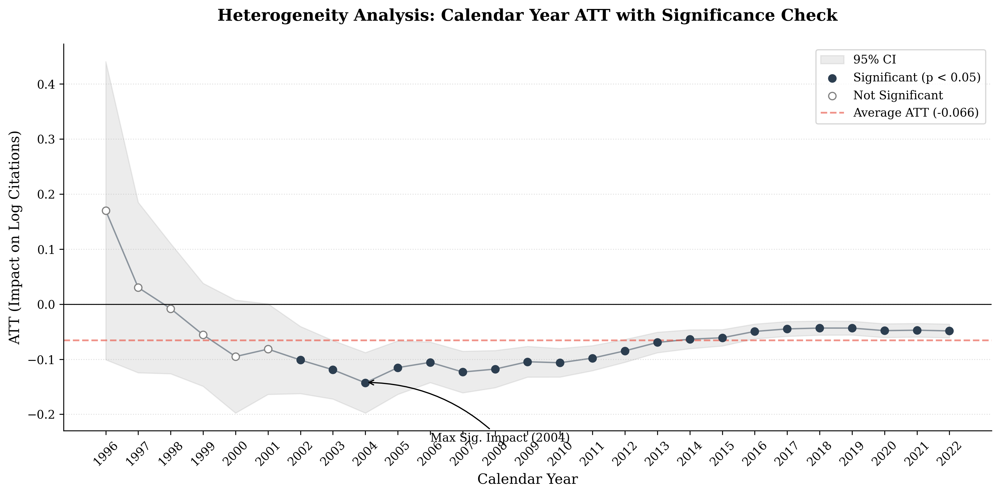

In [3]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 1. 整理数据
data = {
    'Year': list(range(1996, 2023)),
    'Coef': [
        0.1699524, 0.0302602, -0.0080538, -0.0555692, -0.0951305, -0.0815977,
        -0.1014226, -0.1191168, -0.1428027, -0.1152446, -0.1056261, -0.1232229,
        -0.1178998, -0.104556, -0.1063427, -0.0979882, -0.0847625, -0.0694895,
        -0.0635986, -0.0609907, -0.0494897, -0.044881, -0.0433685, -0.0434144,
        -0.0480512, -0.0472415, -0.0485382
    ],
    'Lower': [
        -0.1009061, -0.1245331, -0.1263748, -0.1491665, -0.1977694, -0.1638908,
        -0.1624432, -0.1723245, -0.1977674, -0.1638304, -0.1424653, -0.1609987,
        -0.151711, -0.1324945, -0.1323637, -0.1207803, -0.1055116, -0.0881231,
        -0.0807376, -0.0758863, -0.0629616, -0.0583171, -0.0562373, -0.0559825,
        -0.0605746, -0.0596548, -0.0610671
    ],
    'Upper': [
        0.4408108, 0.1850536, 0.1102673, 0.0380281, 0.0075083, 0.0006954,
        -0.0404021, -0.0659092, -0.0878381, -0.0666587, -0.068787, -0.0854472,
        -0.0840887, -0.0766174, -0.0803216, -0.0751961, -0.0640135, -0.0508559,
        -0.0464596, -0.0460951, -0.0360179, -0.0314449, -0.0304997, -0.0308463,
        -0.0355277, -0.0348282, -0.0360093
    ]
}

df = pd.DataFrame(data)

# 判断显著性：如果 Lower > 0 或 Upper < 0，则显著 (不跨越0)
df['Significant'] = (df['Lower'] > 0) | (df['Upper'] < 0)

# 2. 绘图配置
plt.figure(figsize=(12, 6), dpi=300)
plt.rcParams['font.family'] = 'serif'

# 绘制置信区间阴影
plt.fill_between(df['Year'], df['Lower'], df['Upper'], color='gray', alpha=0.15, label='95% CI')

# 绘制基准折线 (不带 marker，点单独画)
plt.plot(df['Year'], df['Coef'], color='#2c3e50', linewidth=1.2, alpha=0.5, zorder=1)

# 分别绘制显著点和不显著点
# 显著点：深蓝色实心
plt.scatter(df[df['Significant']]['Year'], df[df['Significant']]['Coef'], 
            color='#2c3e50', edgecolor='#2c3e50', s=40, marker='o', label='Significant (p < 0.05)', zorder=3)

# 不显著点：灰色空心
plt.scatter(df[~df['Significant']]['Year'], df[~df['Significant']]['Coef'], 
            color='white', edgecolor='gray', s=40, marker='o', label='Not Significant', zorder=3)

# 3. 装饰
plt.axhline(0, color='black', linestyle='-', linewidth=0.8, zorder=2) # 0基准线
plt.axhline(-0.0658, color='#e74c3c', linestyle='--', alpha=0.6, label='Average ATT (-0.066)')

# 标注最大显著影响点
plt.annotate('Max Sig. Impact (2004)', xy=(2004, -0.142), xytext=(2006, -0.25),
             arrowprops=dict(arrowstyle='->', color='black', connectionstyle="arc3,rad=.2"))

# 设置坐标轴
plt.title('Heterogeneity Analysis: Calendar Year ATT with Significance Check', fontsize=14, fontweight='bold', pad=20)
plt.xlabel('Calendar Year', fontsize=12)
plt.ylabel('ATT (Impact on Log Citations)', fontsize=12)
plt.xticks(df['Year'], rotation=45)
plt.grid(axis='y', linestyle=':', alpha=0.4)
plt.legend(frameon=True, loc='upper right', fontsize=10)

# 移除上、右边框
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

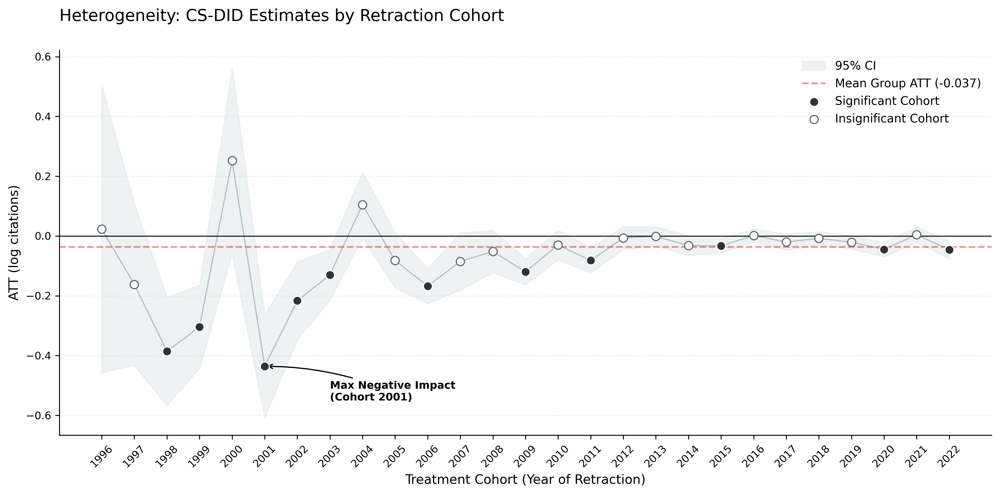

In [4]:
import matplotlib.pyplot as plt
import pandas as pd

# 1. 整理数据 (Group ATT: 按处理年份分组的影响)
data = {
    'Year': list(range(1996, 2023)),
    'Coef': [
        0.0231949, -0.1617606, -0.385761, -0.3041629, 0.2521755, -0.4359995,
        -0.2166546, -0.1301948, 0.10511, -0.0818061, -0.1672775, -0.0851433,
        -0.051338, -0.1196543, -0.0297038, -0.081843, -0.0064032, -0.001238,
        -0.0319661, -0.033072, 0.0017028, -0.0200844, -0.007969, -0.0206836,
        -0.0448454, 0.0043816, -0.0458007
    ],
    'Lower': [
        -0.4567345, -0.4329955, -0.5675303, -0.442956, -0.0590857, -0.6078089,
        -0.3465197, -0.2150915, -0.004966, -0.1741966, -0.225598, -0.1805231,
        -0.1219711, -0.1640708, -0.0785696, -0.1232133, -0.0449585, -0.0333125,
        -0.0646343, -0.0568199, -0.0202595, -0.0472481, -0.029942, -0.0425299,
        -0.0693701, -0.021094, -0.0755809
    ],
    'Upper': [
        0.5031243, 0.1094743, -0.2039917, -0.1653698, 0.5634366, -0.2641901,
        -0.0867896, -0.0452981, 0.2151861, 0.0105843, -0.108957, 0.0102364,
        0.0192952, -0.0752378, 0.0191621, -0.0404728, 0.0321522, 0.0308365,
        0.0007021, -0.0093241, 0.0236652, 0.0070794, 0.014004, 0.0011626,
        -0.0203207, 0.0298573, -0.0160205
    ]
}

df = pd.DataFrame(data)

# 判定显著性 (不包含0则显著)
df['Significant'] = (df['Lower'] > 0) | (df['Upper'] < 0)

# 2. 绘图配置
plt.figure(figsize=(12, 6), dpi=300)
plt.rcParams['font.family'] = 'sans-serif' # 改用无衬线体更显现代感
plt.rcParams['font.sans-serif'] = ['Arial']

# 绘制置信区间阴影 (使用更淡的配色以突出点)
plt.fill_between(df['Year'], df['Lower'], df['Upper'], color='#dfe6e9', alpha=0.5, label='95% CI')

# 绘制背景参考线
plt.plot(df['Year'], df['Coef'], color='#b2bec3', linewidth=1, linestyle='-', zorder=1)
plt.axhline(0, color='black', linewidth=0.8, zorder=2)
plt.axhline(-0.0367, color='#d63031', linestyle='--', alpha=0.5, label='Mean Group ATT (-0.037)')

# 3. 分类绘制散点 (核心美化)
# 显著点：深蓝色实心，带白色边缘增加层次感
plt.scatter(df[df['Significant']]['Year'], df[df['Significant']]['Coef'], 
            color='#2d3436', edgecolor='white', s=60, marker='o', 
            linewidth=1, label='Significant Cohort', zorder=4)

# 不显著点：灰色空心
plt.scatter(df[~df['Significant']]['Year'], df[~df['Significant']]['Coef'], 
            color='white', edgecolor='#636e72', s=50, marker='o', 
            linewidth=1, label='Insignificant Cohort', zorder=3)

# 4. 关键点标注 (针对 2001 最大的负向冲击)
plt.annotate('Max Negative Impact\n(Cohort 2001)', 
             xy=(2001, -0.436), xytext=(2003, -0.55),
             fontsize=9, fontweight='bold',
             arrowprops=dict(arrowstyle='->', connectionstyle="arc3,rad=.1", color='black'))

# 5. 坐标轴与细节
plt.title('Heterogeneity: CS-DID Estimates by Retraction Cohort', fontsize=14, loc='left', pad=25)
plt.xlabel('Treatment Cohort (Year of Retraction)', fontsize=11)
plt.ylabel('ATT (log citations)', fontsize=11)
plt.xticks(df['Year'], rotation=45, fontsize=9)
plt.yticks(fontsize=9)
plt.grid(axis='y', linestyle=':', alpha=0.3)

# 移除冗余边框
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# 图例美化
plt.legend(frameon=False, loc='upper right', fontsize=10, ncol=1)

plt.tight_layout()
plt.show()

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

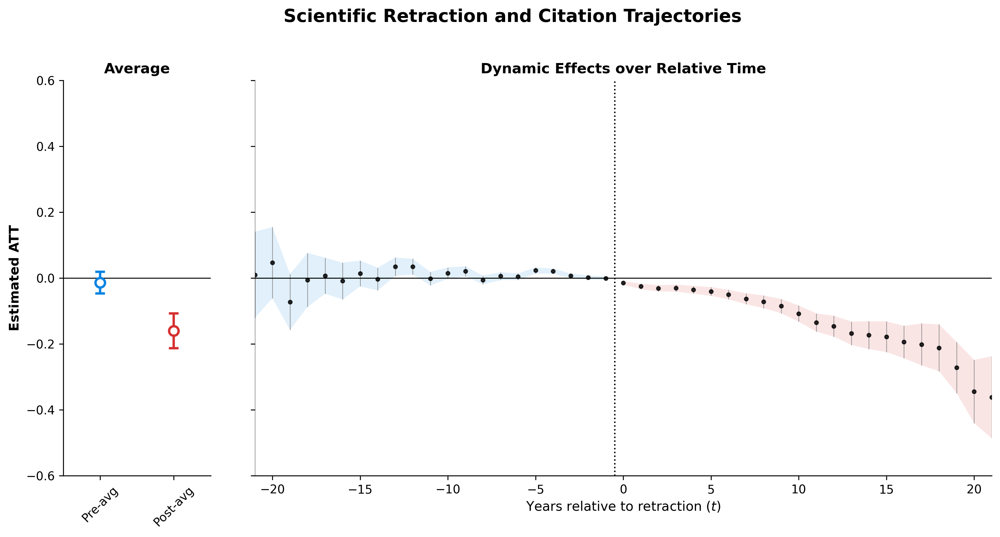

In [5]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.gridspec import GridSpec

# 1. 数据准备 (保持不变)
data = {
    't': list(range(-25, 27)),
    'coef': [-0.3444, -0.1534, 0.0021, 0.0124, 0.0098, 0.0463, -0.0728, -0.0058, 0.0068, -0.009, 
             0.0136, -0.0033, 0.0342, 0.0344, -0.0019, 0.0146, 0.0204, -0.0059, 0.0055, 0.0038, 
             0.0228, 0.0209, 0.0066, 0.0013, -0.0006, -0.0148, -0.0256, -0.0315, -0.0307, -0.0359, 
             -0.0407, -0.0503, -0.0631, -0.0724, -0.0854, -0.1081, -0.135, -0.1463, -0.1678, -0.1735, 
             -0.1784, -0.1942, -0.2018, -0.2119, -0.2718, -0.3447, -0.362, -0.3872, -0.3664, -0.3759, 
             -0.1572, -0.0938],
    'lower': [-1.1351, -0.4274, -0.2353, -0.1397, -0.121, -0.0618, -0.1575, -0.0876, -0.0478, -0.0649, 
              -0.0255, -0.0377, 0.0063, 0.0104, -0.0223, -0.0028, 0.0053, -0.0191, -0.0064, -0.0063, 
              0.0137, 0.0131, -0.0002, -0.0049, -0.0065, -0.0204, -0.034, -0.041, -0.0413, -0.0477, 
              -0.054, -0.0648, -0.0797, -0.0916, -0.1071, -0.1327, -0.1625, -0.1781, -0.2032, -0.2158, 
              -0.2249, -0.2434, -0.2653, -0.283, -0.3495, -0.4409, -0.4864, -0.5332, -0.5161, -0.5766, 
              -0.4499, -0.6949],
    'upper': [0.4462, 0.1204, 0.2396, 0.1646, 0.1406, 0.1544, 0.0117, 0.076, 0.0614, 0.0468, 
              0.0528, 0.031, 0.0622, 0.0584, 0.0184, 0.0321, 0.0355, 0.0071, 0.0175, 0.014, 
              0.0319, 0.0286, 0.0135, 0.0075, 0.0051, -0.0091, -0.0172, -0.022, -0.0202, -0.0241, 
              -0.0275, -0.0359, -0.0465, -0.0531, -0.0638, -0.0835, -0.1075, -0.1145, -0.1324, -0.1312, 
              -0.1318, -0.145, -0.1382, -0.1408, -0.1941, -0.2485, -0.2377, -0.2413, -0.2168, -0.1752, 
              0.1355, 0.5071]
}
df = pd.DataFrame(data)

# --- 绘图逻辑 ---
fig = plt.figure(figsize=(14, 6), dpi=300)
gs = GridSpec(1, 2, width_ratios=[1, 5], wspace=0.1) # 左侧占比小，右侧占比大

# Nature 配色方案
C_PRE = '#0984e3' # 蓝色
C_POST = '#d63031' # 红色

# --- 左侧子图：Summary Averages ---
ax0 = fig.add_subplot(gs[0])
avg_labels = ['Pre-avg', 'Post-avg']
avg_coefs = [-0.0137, -0.1603]
avg_lower = [-0.0466, -0.2134]
avg_upper = [0.0193, -0.1072]
colors = [C_PRE, C_POST]

for i in range(2):
    ax0.errorbar(i, avg_coefs[i], yerr=[[avg_coefs[i]-avg_lower[i]], [avg_upper[i]-avg_coefs[i]]], 
                 fmt='o', color=colors[i], markersize=8, capsize=4, elinewidth=2, mew=2, mfc='white')

ax0.set_xticks([0, 1])
ax0.set_xticklabels(avg_labels, rotation=45, fontsize=10)
ax0.axhline(0, color='black', linewidth=0.8)
ax0.set_ylabel('Estimated ATT', fontsize=11, fontweight='bold')
ax0.set_xlim(-0.5, 1.5)
ax0.set_ylim(-0.6, 0.6)
ax0.spines['right'].set_visible(False)
ax0.spines['top'].set_visible(False)
ax0.set_title('Average', fontsize=12, fontweight='bold')

# --- 右侧子图：Event Study ---
ax1 = fig.add_subplot(gs[1], sharey=ax0) # 共享 Y 轴高度

# 1. 阴影连接置信区间
pre_mask = df['t'] < 0
post_mask = df['t'] >= 0

ax1.fill_between(df.loc[pre_mask, 't'], df.loc[pre_mask, 'lower'], df.loc[pre_mask, 'upper'], 
                 color=C_PRE, alpha=0.12, edgecolor='none')
ax1.fill_between(df.loc[post_mask, 't'], df.loc[post_mask, 'lower'], df.loc[post_mask, 'upper'], 
                 color=C_POST, alpha=0.12, edgecolor='none')

# 2. 逐年估计点
ax1.errorbar(df['t'], df['coef'], yerr=[df['coef']-df['lower'], df['upper']-df['coef']], 
             fmt='o', color='black', ecolor='gray', elinewidth=0.6, capsize=0, 
             markersize=3, mfc='black', alpha=0.8)

# 3. 装饰
ax1.axhline(0, color='black', linewidth=0.8)
ax1.axvline(-0.5, color='black', linewidth=1.2, linestyle=':')

# 设置范围
ax1.set_xlim(-21, 21)
ax1.set_xticks(range(-20, 21, 5))
ax1.set_title('Dynamic Effects over Relative Time', fontsize=12, fontweight='bold')
ax1.set_xlabel('Years relative to retraction ($t$)', fontsize=11)

# 隐藏右侧子图的 Y 轴标签（因为与左侧共享）
plt.setp(ax1.get_yticklabels(), visible=False)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.spines['left'].set_alpha(0.3) # 弱化左边框，增强连贯性

plt.suptitle('Scientific Retraction and Citation Trajectories', fontsize=15, fontweight='bold', y=1.02)
plt.show()

## 引用领域可视化

In [5]:
# ==========================================
# 1. 提取个体层面的数据（每篇论文仅保留一行）
# ==========================================
# 我们只关注已经成功映射了两个学科的论文
unique_papers = panel_df.drop_duplicates(subset='paper_numid').copy()
unique_papers = unique_papers[unique_papers['field'].notna() & unique_papers['R_field'].notna()]

# ==========================================
# 2. 识别不一致的行
# ==========================================
# 判定逻辑：field 不等于 R_field
mismatch_mask = unique_papers['field'] != unique_papers['R_field']
mismatched_df = unique_papers[mismatch_mask]

# ==========================================
# 3. 统计结果汇报
# ==========================================
total_mapped = unique_papers.shape[0]
mismatch_count = mismatched_df.shape[0]
mismatch_rate = (mismatch_count / total_mapped) * 100 if total_mapped > 0 else 0

print("-" * 50)
print(f"学科匹配统计（基于唯一个体 paper_numid）:")
print(f"1. 双学科信息完整的论文总数: {total_mapped}")
print(f"2. 自身学科(field)与引用学科(R_field)不一致的论文数: {mismatch_count}")
print(f"3. 跨学科引用比例: {mismatch_rate:.2f}%")
print("-" * 50)

# ==========================================
# 4. 展示不一致的详细情况 (前10行预览)
# ==========================================
print("\n学科不一致的论文明细预览 (前10行):")
display_cols = ['paper_numid', 'group', 'field', 'R_field']
print(mismatched_df[display_cols].head(10))

# 可选：查看最常见的跨学科组合
print("\n最常见的跨学科引用组合 (field -> R_field):")
print(mismatched_df.groupby(['field', 'R_field']).size().sort_values(ascending=False).head(10))

--------------------------------------------------
学科匹配统计（基于唯一个体 paper_numid）:
1. 双学科信息完整的论文总数: 44719
2. 自身学科(field)与引用学科(R_field)不一致的论文数: 18669
3. 跨学科引用比例: 41.75%
--------------------------------------------------

学科不一致的论文明细预览 (前10行):
     paper_numid  group  field  R_field
94             8      0   34.0     40.0
113           10      0   31.0     32.0
122           11      1   34.0     32.0
136           12      0   34.0     32.0
150           13      1   34.0     41.0
160           14      0   34.0     41.0
178           16      0   31.0     32.0
186           17      1   42.0     32.0
451           34      0   46.0     31.0
482           36      0   41.0     31.0

最常见的跨学科引用组合 (field -> R_field):
field  R_field
31.0   32.0       3638
32.0   31.0       3343
42.0   32.0       1142
34.0   32.0       1011
51.0   40.0        734
34.0   40.0        629
       31.0        585
40.0   51.0        508
       32.0        488
32.0   34.0        442
dtype: int64


In [11]:
!pip install plotly

     |████████████████████████████████| 9.9 MB 573 kB/s eta 0:00:01
     |████████████████████████████████| 359 kB 31.6 MB/s eta 0:00:01


In [30]:
pip install -U kaleido


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [7]:
import plotly.graph_objects as go

# （1）field 代码 -> 英文学科名
# 如果你的 field 列是字符串（比如 "30"），就把下面的 key 改成字符串即可： "30": "AGRI..."
field_label_map = {
    30: "AGRICULTURAL, VETERINARY AND FOOD SCIENCES",
    31: "BIOLOGICAL SCIENCES",
    32: "BIOMEDICAL AND CLINICAL SCIENCES",
    33: "BUILT ENVIRONMENT AND DESIGN",
    34: "CHEMICAL SCIENCES",
    35: "COMMERCE, MANAGEMENT, TOURISM AND SERVICES",
    36: "CREATIVE ARTS AND WRITING",
    37: "EARTH SCIENCES",
    38: "ECONOMICS",
    39: "EDUCATION",
    40: "ENGINEERING",
    41: "ENVIRONMENTAL SCIENCES",
    42: "HEALTH SCIENCES",
    43: "HISTORY, HERITAGE AND ARCHAEOLOGY",
    44: "HUMAN SOCIETY",
    45: "INDIGENOUS STUDIES",
    46: "INFORMATION AND COMPUTING SCIENCES",
    47: "LANGUAGE, COMMUNICATION AND CULTURE",
    48: "LAW AND LEGAL STUDIES",
    49: "MATHEMATICAL SCIENCES",
    50: "PHILOSOPHY AND RELIGIOUS STUDIES",
    51: "PHYSICAL SCIENCES",
    52: "PSYCHOLOGY"
}

# 准备数据：统计每对组合的频次
links = mismatched_df.groupby(['field', 'R_field']).size().reset_index(name='value')

# 映射节点编号
all_fields = list(set(links['field'].tolist() + links['R_field'].tolist()))
mapping = {field: i for i, field in enumerate(all_fields)}

links['source'] = links['field'].map(mapping)
links['target'] = links['R_field'].map(mapping) + len(all_fields)  # 偏移以区分左右侧

# （1）（2）节点标签改为英文学科名
node_labels = [field_label_map.get(f, str(f)) for f in all_fields]

# （3）不同引用关系用不同颜色（按 field-R_field 组合区分）
palette = [
    "#636EFA", "#EF553B", "#00CC96", "#AB63FA", "#FFA15A",
    "#19D3F3", "#FF6692", "#B6E880", "#FF97FF", "#FECB52"
]
pair_to_color = {}
colors = []

for f, rf in zip(links['field'], links['R_field']):
    key = (f, rf)
    if key not in pair_to_color:
        pair_to_color[key] = palette[len(pair_to_color) % len(palette)]
    colors.append(pair_to_color[key])

links['color'] = colors

# 绘制（其他细节不变）
fig = go.Figure(data=[go.Sankey(
    node=dict(
        label=node_labels * 2,
        pad=15,
        thickness=20
    ),
    link=dict(
        source=links['source'],
        target=links['target'],
        value=links['value'],
        color=links['color']
    )
)])

fig.update_layout(
    title=dict(
        text="Interdisciplinary Citation Flows Across Research Fields",
        x=0.5,                 # 居中
        xanchor="center",
        yanchor="top",
        font=dict(
            size=16,
            family="Arial, Helvetica"
        )
    ),
    font=dict(
        size=11,
        family="Arial, Helvetica"
    ),
    plot_bgcolor="white",
    paper_bgcolor="white",
    margin=dict(l=40, r=40, t=70, b=40)
)

fig.show()




In [15]:
!pip install networkx matplotlib seaborn

     |████████████████████████████████| 2.1 MB 961 kB/s eta 0:00:01


In [10]:
import os

# 1. 定义保存路径
save_dir = "/Data4/yutao_wen/26.1.19/"
save_path = os.path.join(save_dir, "interdisciplinary_citation_flow.pdf")

# 2. 确保文件夹存在（如果不存在则创建）
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# 3. 执行保存
# 注意：如果报错提示 Image export requires the kaleido package，
# 请运行 !pip install -U kaleido
fig.write_image(save_path, width=1600, height=900)

print(f"Success: Image saved to {save_path}")


Success: Image saved to /Data4/yutao_wen/26.1.19/interdisciplinary_citation_flow.pdf


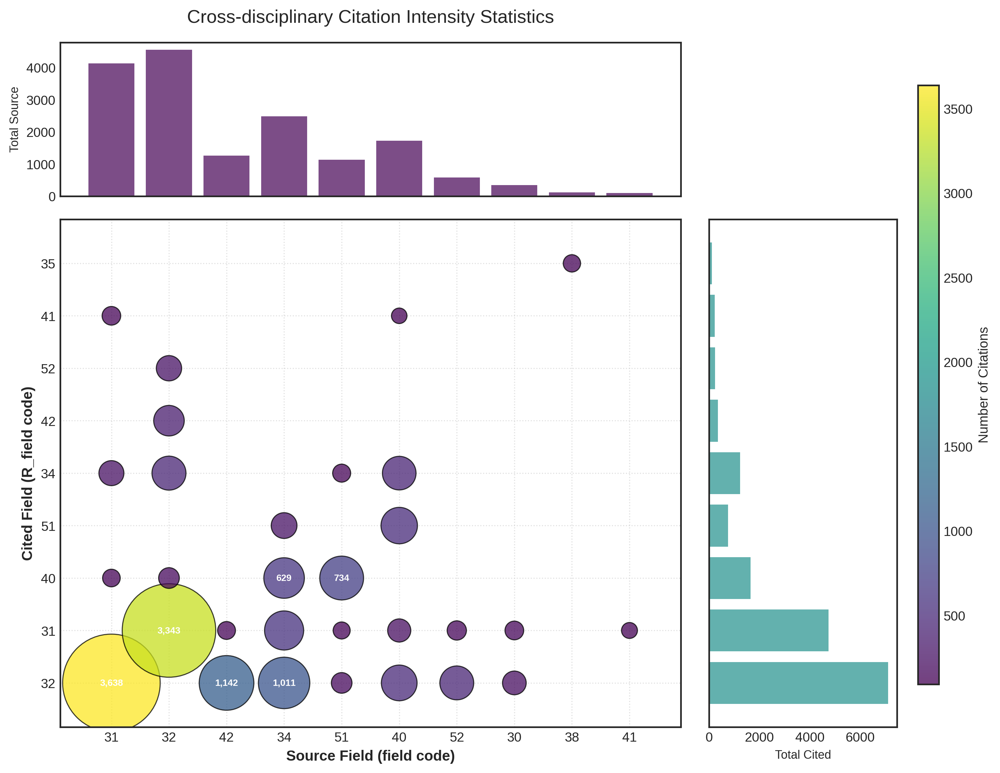

In [18]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# 设置期刊风格样式
plt.style.use('seaborn-v0_8-white') 
plt.rcParams['font.family'] = 'sans-serif' # 多数期刊要求 Arial 或 Helvetica

# 1. Data Preparation
# Calculate the cross-disciplinary citation weights
top_links = mismatched_df.groupby(['field', 'R_field']).size().reset_index(name='weight')
top_links = top_links.sort_values('weight', ascending=False).head(30)

# Convert to string to treat as categorical data
top_links['field'] = top_links['field'].astype(int).astype(str)
top_links['R_field'] = top_links['R_field'].astype(int).astype(str)

# 2. Canvas Setup (GridSpec for complex layout)
fig = plt.figure(figsize=(11, 9), dpi=300) # Increased DPI for publication quality
gs = gridspec.GridSpec(4, 4, hspace=0.15, wspace=0.15)

# Subplots
ax_main = fig.add_subplot(gs[1:4, 0:3])    # Main bubble plot
ax_top = fig.add_subplot(gs[0, 0:3], sharex=ax_main)   # Top marginal (Source)
ax_right = fig.add_subplot(gs[1:4, 3], sharey=ax_main) # Right marginal (Cited)

# 3. Main Bubble Plot
# Spectral_r or Viridis are widely accepted for academic color-blind friendliness
scatter = ax_main.scatter(top_links['field'], top_links['R_field'], 
                         s=top_links['weight'] * 1.5, 
                         c=top_links['weight'], 
                         cmap='viridis', 
                         alpha=0.75, edgecolors="black", linewidth=0.8)

# Add value labels inside prominent bubbles
for i in range(len(top_links)):
    if top_links['weight'].iloc[i] > 600: # Threshold for clarity
        ax_main.text(top_links['field'].iloc[i], top_links['R_field'].iloc[i], 
                     format(int(top_links['weight'].iloc[i]), ','), # Added comma separator
                     ha='center', va='center', fontsize=7, color='white', weight='bold')

# 4. Marginal Distributions (Bar Charts)
# Top: Distribution of Source Fields
field_sum = top_links.groupby('field')['weight'].sum()
ax_top.bar(field_sum.index, field_sum.values, color='#440154', alpha=0.7)
ax_top.set_title("Cross-disciplinary Citation Intensity Statistics", fontsize=14, pad=15)
ax_top.set_ylabel("Total Source", fontsize=9)

# Right: Distribution of Cited Fields
r_field_sum = top_links.groupby('R_field')['weight'].sum()
ax_right.barh(r_field_sum.index, r_field_sum.values, color='#21918c', alpha=0.7)
ax_right.set_xlabel("Total Cited", fontsize=9)

# 5. Refining Esthetics
ax_main.grid(True, linestyle=':', alpha=0.6)
ax_main.set_xlabel("Source Field (field code)", fontsize=11, weight='bold')
ax_main.set_ylabel("Cited Field (R_field code)", fontsize=11, weight='bold')

# Add a colorbar for clarity
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7]) # [left, bottom, width, height]
fig.colorbar(scatter, cax=cbar_ax, label='Number of Citations')

# Hide tick labels on marginal axes to avoid redundancy
plt.setp(ax_top.get_xticklabels(), visible=False)
plt.setp(ax_right.get_yticklabels(), visible=False)

# Optional: Tight layout often breaks GridSpec, so we use subplots_adjust
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9)

plt.show()

## 生命周期

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

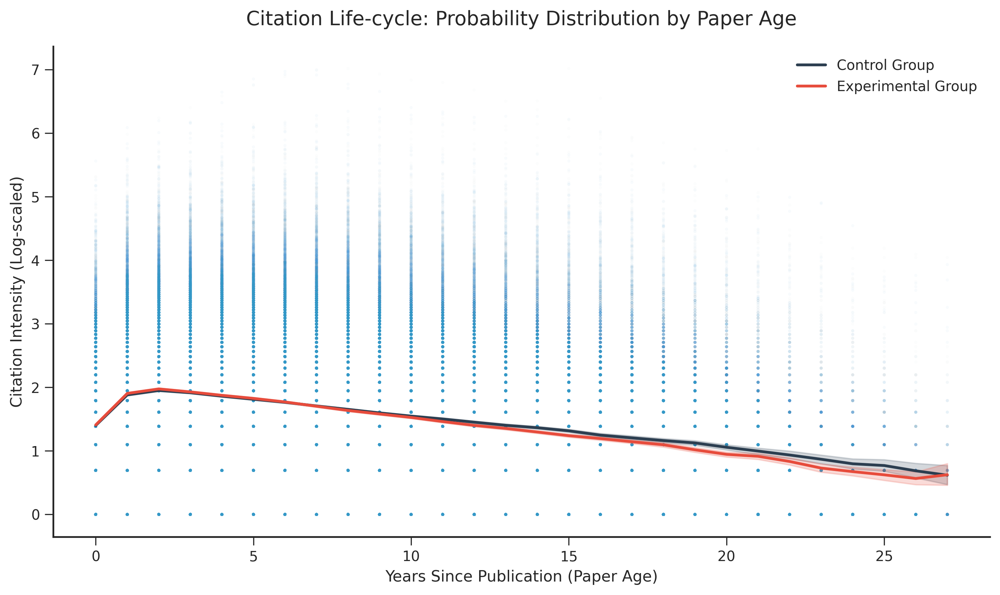

In [16]:
# 计算论文年龄
panel_df['Age'] = panel_df['year'] - panel_df['PYear']

# 如果你希望 Y 轴数值更小，可以尝试“每篇论文贡献度”或“标准化引文”
# 暂时保持 log_yearlycitation，但我们会通过 y轴限制来聚焦
import matplotlib.pyplot as plt
import seaborn as sns

# 设置学术期刊风格 (Publication Quality)
plt.style.use('seaborn-v0_8-ticks')
plt.rcParams.update({'font.family': 'Arial', 'font.size': 10})

fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

# 1. 绘制概率点云 (Probability Cloud)
# 用极小的 alpha 值，让点重叠的部分自动变深，形成密度感
for g, color, label in zip([0, 1], ['#bdc3c7', '#3498db'], ['Control', 'Experimental']):
    subset = panel_df[panel_df['group'] == g]
    ax.scatter(subset['Age'], subset['log_yearlycitation'], 
               alpha=0.03, s=5, color=color, edgecolors='none', label=None)

# 2. 绘制生命周期趋势线 (Lifecycle Trend Lines)
# 使用带有置信区间的线图，展示平均概率路径
sns.lineplot(data=panel_df, x='Age', y='log_yearlycitation', hue='group',
             palette={0: '#2c3e50', 1: '#e74c3c'}, 
             linewidth=2, ax=ax, errorbar=('ci', 95))

# 3. 细节修饰 (English for Journal)
ax.set_title("Citation Life-cycle: Probability Distribution by Paper Age", fontsize=14, pad=15)
ax.set_xlabel("Years Since Publication (Paper Age)", fontsize=11)
ax.set_ylabel("Citation Intensity (Log-scaled)", fontsize=11)

# 如果你确定数值应该很小，可以通过 set_ylim 强制限制观察范围
# ax.set_ylim(0, 1.5) 

# 自定义图例
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color='#2c3e50', lw=2),
                Line2D([0], [0], color='#e74c3c', lw=2)]
ax.legend(custom_lines, ['Control Group', 'Experimental Group'], frameon=False)

sns.despine() # 去除上方和右侧边框
plt.tight_layout()
plt.savefig("/Data4/yutao_wen/26.1.19/citation_lifecycle_age.pdf")
plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

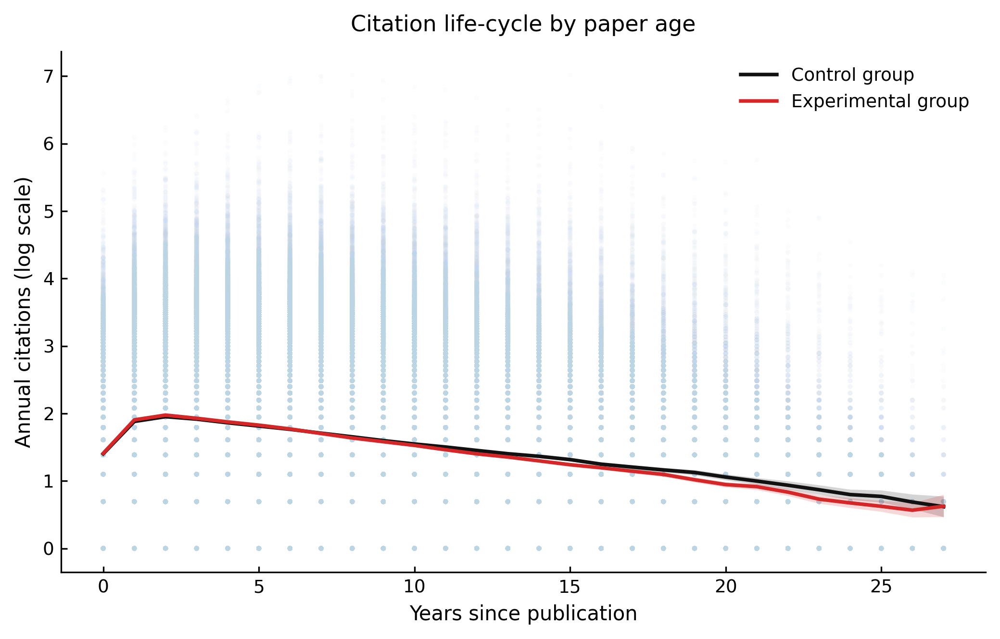

In [19]:
# 计算论文年龄
panel_df['Age'] = panel_df['year'] - panel_df['PYear']

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D

# —— Nature / Science 风格基础设置 —— #
plt.style.use('default')
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 9,
    'axes.linewidth': 0.8,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.major.size': 3,
    'ytick.major.size': 3,
    'xtick.major.width': 0.8,
    'ytick.major.width': 0.8,
})

fig, ax = plt.subplots(figsize=(7, 4.5), dpi=300)

# 1. 概率点云（淡色点，营造密度感）
for g, color, label in zip(
    [0, 1],
    ['#d0d7de', '#bcd5f5'],   # 很浅的灰 / 蓝
    ['Control', 'Experimental']
):
    subset = panel_df[panel_df['group'] == g]
    ax.scatter(
        subset['Age'],
        subset['log_yearlycitation'],
        alpha=0.06,
        s=6,
        color=color,
        edgecolors='none'
    )

# 2. 生命周期趋势线（深色实线 + 淡色置信区间）
sns.lineplot(
    data=panel_df,
    x='Age',
    y='log_yearlycitation',
    hue='group',
    hue_order=[0, 1],
    palette={0: '#111111', 1: '#d62728'},   # 黑 + 深红
    linewidth=1.8,
    errorbar=('ci', 95),
    err_kws={'alpha': 0.18, 'linewidth': 0},
    ax=ax
)

# 去掉 seaborn 自动图例，用自定义图例（只显示线，不显示点云）
handles = [
    Line2D([0], [0], color='#111111', lw=1.8),
    Line2D([0], [0], color='#d62728', lw=1.8)
]
labels = ['Control group', 'Experimental group']
ax.legend(
    handles,
    labels,
    frameon=False,
    loc='upper right'
)

# 轴与标题
ax.set_title("Citation life-cycle by paper age", fontsize=11, pad=10)
ax.set_xlabel("Years since publication", fontsize=10)
ax.set_ylabel("Annual citations (log scale)", fontsize=10)

# 可选：限定 Y 轴范围（按你数据微调）
# ax.set_ylim(0, 2.0)

sns.despine(ax=ax)
plt.tight_layout()

plt.savefig("/Data4/yutao_wen/26.1.19/citation_lifecycle_age.pdf")
plt.show()


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

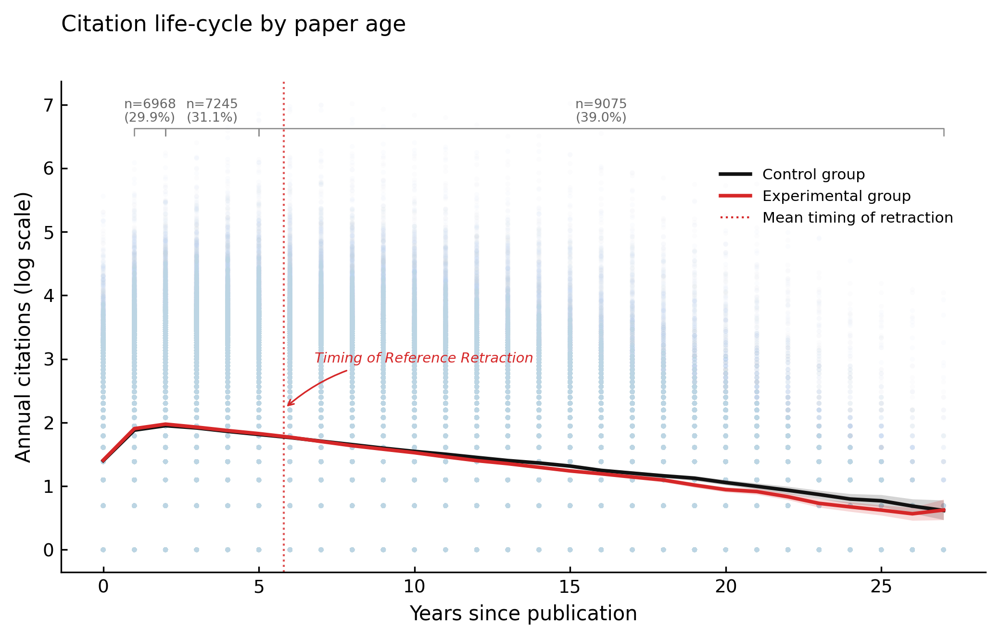

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D
import numpy as np

# —— 计算比例 —— #
n_list = [6968, 7245, 9075]
total_n = sum(n_list)
text_list = [f"n={n}\n({(n/total_n)*100:.1f}%)" for n in n_list]

# 计算论文年龄
panel_df['Age'] = panel_df['year'] - panel_df['PYear']

# —— Nature / Science 风格基础设置 —— #
plt.style.use('default')
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 9,
    'axes.linewidth': 0.8,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.major.size': 3,
    'ytick.major.size': 3,
})

fig, ax = plt.subplots(figsize=(7, 4.5), dpi=300)

# 1. 概率点云
for g, color in zip([0, 1], ['#d0d7de', '#bcd5f5']):
    subset = panel_df[panel_df['group'] == g]
    ax.scatter(subset['Age'], subset['log_yearlycitation'],
               alpha=0.06, s=6, color=color, edgecolors='none')

# 2. 生命周期趋势线
sns.lineplot(
    data=panel_df,
    x='Age',
    y='log_yearlycitation',
    hue='group',
    hue_order=[0, 1],
    palette={0: '#111111', 1: '#d62728'},
    linewidth=1.8,
    errorbar=('ci', 95),
    err_kws={'alpha': 0.18, 'linewidth': 0},
    ax=ax,
    zorder=10
)

# 3. 添加扩符标注
y_min, y_max = ax.get_ylim()
y_pos = y_max * 0.90 
bracket_height = (y_max - y_min) * 0.015

def draw_bracket(ax, x1, x2, y, h, text):
    ax.plot([x1, x1, x2, x2], [y-h, y, y, y-h], color='#888888', lw=0.6)
    ax.text((x1+x2)/2, y + h*0.5, text, ha='center', va='bottom', 
            fontsize=6.5, color='#666666', fontweight='normal', linespacing=1.1)

max_age = panel_df['Age'].max()
draw_bracket(ax, 1, 2, y_pos, bracket_height, text_list[0])
draw_bracket(ax, 2, 5, y_pos, bracket_height, text_list[1])
draw_bracket(ax, 5, max_age, y_pos, bracket_height, text_list[2])

# 4. 新增：参考文献撤稿事件标注 (Timing of Reference Retraction)
# 假设我们标注在 Age=5 左右作为一个示意，或者根据你 RYear-PYear 的均值设置
retraction_age_mean = (panel_df[panel_df['group']==1]['RYear'] - panel_df[panel_df['group']==1]['PYear']).mean()

ax.axvline(x=retraction_age_mean, color='#d62728', linestyle=':', lw=1, alpha=0.8)
ax.annotate('Timing of Reference Retraction', 
            xy=(retraction_age_mean, y_max * 0.3), 
            xytext=(retraction_age_mean + 1, y_max * 0.4),
            fontsize=7, color='#d62728', fontstyle='italic',
            arrowprops=dict(arrowstyle='->', color='#d62728', lw=0.8, connectionstyle="arc3,rad=.2"))

# 5. 图例
handles = [
    Line2D([0], [0], color='#111111', lw=1.8),
    Line2D([0], [0], color='#d62728', lw=1.8),
    Line2D([0], [0], color='#d62728', lw=1, linestyle=':')
]
labels = ['Control group', 'Experimental group', 'Mean timing of retraction']
ax.legend(handles, labels, frameon=False, loc='upper right', bbox_to_anchor=(0.98, 0.85), fontsize=7.5)

# 轴与标题
ax.set_title("Citation life-cycle by paper age", fontsize=11, loc='left', pad=25)
ax.set_xlabel("Years since publication", fontsize=10)
ax.set_ylabel("Annual citations (log scale)", fontsize=10)

sns.despine(ax=ax)
plt.tight_layout()

plt.savefig("/Data4/yutao_wen/26.1.19/citation_lifecycle_age_retraction.pdf")
plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

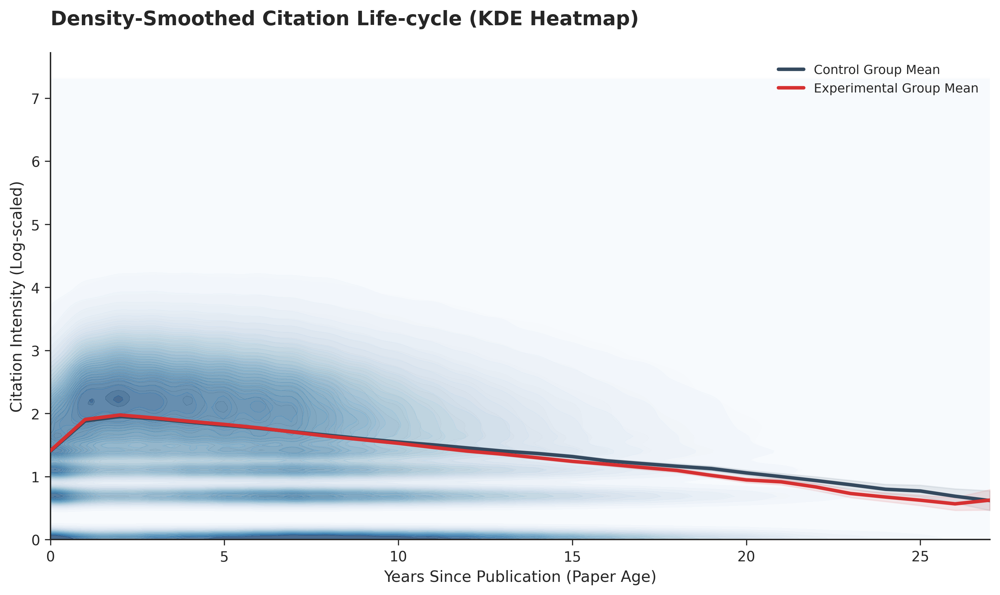

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.lines import Line2D

# —— 设置学术风格 ——
plt.style.use('seaborn-v0_8-ticks')
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 10,
    'axes.linewidth': 1.0,
    'xtick.major.size': 4,
    'ytick.major.size': 4
})

fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

# —— 1. 绘制流行病学风格的 KDE 密度热力云 ——
# 通过 levels 增加层次感，thresh=0 消除边缘缝隙
# 使用不同的调色盘：Greys 代表控制组，Blues 代表实验组
for g, cmap, label in zip([0, 1], ['Greys', 'Blues'], ['Control', 'Experimental']):
    subset = panel_df[panel_df['group'] == g]
    
    sns.kdeplot(
        data=subset, x='Age', y='log_yearlycitation',
        fill=True, alpha=0.5, cmap=cmap,
        levels=30, thresh=0,  # levels 越高，过渡越丝滑；thresh=0 确保颜色填满到轴边
        bw_adjust=0.8,        # 调整平滑度，越小精度越高（但过小会出现锯齿）
        ax=ax, zorder=g+1
    )

# —— 2. 绘制生命周期趋势线 (高亮对比线) ——
# 使用更鲜明的颜色压在热力图上方
sns.lineplot(
    data=panel_df, x='Age', y='log_yearlycitation', hue='group',
    palette={0: '#34495e', 1: '#d63031'}, # 灰黑色与正红色
    linewidth=2.5, ax=ax, errorbar=('ci', 95), 
    zorder=10, legend=False
)

# —— 3. 视觉精修 ——
ax.set_title("Density-Smoothed Citation Life-cycle (KDE Heatmap)", 
             fontsize=14, loc='left', pad=20, fontweight='bold')
ax.set_xlabel("Years Since Publication (Paper Age)", fontsize=11)
ax.set_ylabel("Citation Intensity (Log-scaled)", fontsize=11)

# 强制限制坐标轴范围，防止 KDE 外溢产生的空白
ax.set_xlim(panel_df['Age'].min(), panel_df['Age'].max())
ax.set_ylim(0, panel_df['log_yearlycitation'].max() * 1.1)

# —— 4. 交互项风格的图例 ——
custom_lines = [
    Line2D([0], [0], color='#34495e', lw=2.5, label='Control Group Mean'),
    Line2D([0], [0], color='#d63031', lw=2.5, label='Experimental Group Mean')
]
ax.legend(handles=custom_lines, frameon=False, loc='upper right', fontsize=9)

sns.despine()
plt.tight_layout()

# 保存
plt.savefig("/Data4/yutao_wen/26.1.19/citation_epidemiology_heatmap.pdf")
plt.show()

## 散点图

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

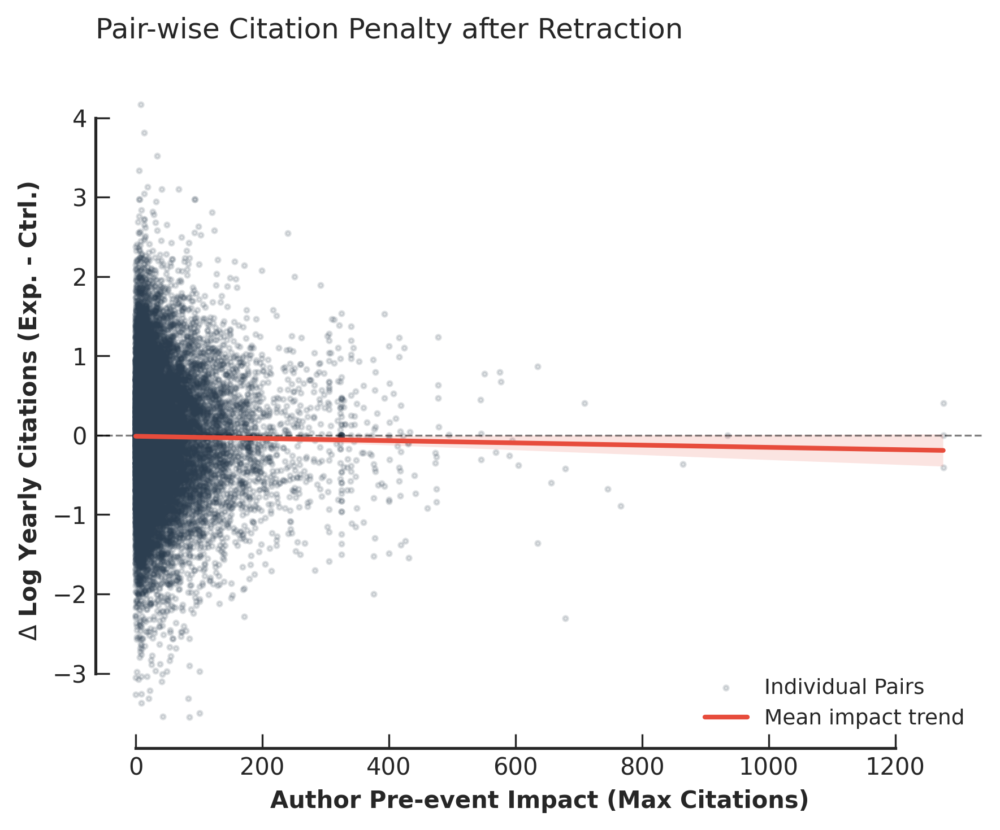

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. 计算差值 (Difference-in-Means per Pair)
# 筛选事后数据
post_df = panel_df[panel_df['pd'] > 0].copy()

# 先计算每个 pair 中两组的均值
# 假设 Num_top10max 是该 pair 的特征（通常实验组和控制组在匹配时该值相近）
pair_grouped = post_df.groupby(['pair', 'group']).agg({
    'log_yearlycitation': 'mean',
    'Num_top10max': 'first'  # 取实验组的声望作为该 pair 的坐标
}).reset_index()

# 转换为宽表格式，计算差值：Diff = Experimental - Control
df_wide = pair_grouped.pivot(index='pair', columns='group', values=['log_yearlycitation', 'Num_top10max'])
df_wide.columns = ['log_cit_0', 'log_cit_1', 'impact_0', 'impact_1']

# 计算 Y 轴：事后引用差值；X 轴：作者声望（取实验组作为代表）
df_wide['citation_diff'] = df_wide['log_cit_1'] - df_wide['log_cit_0']
df_wide['author_impact'] = df_wide['impact_1'] 

# 2. 绘图设置 (Nature 标准)
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial'],
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'pdf.fonttype': 42
})

fig, ax = plt.subplots(figsize=(6, 5), dpi=300)

# 3. 绘制散点 (每一个点是一个 Pair)
# 使用深灰色并配合高透明度，突出整体趋势而非单个离群点
ax.scatter(df_wide['author_impact'], df_wide['citation_diff'], 
           color='#2c3e50', s=4, alpha=0.15, rasterized=True, label='Individual Pairs')

# 4. 绘制水平基准线 (y=0，代表无差异)
ax.axhline(0, color='black', linestyle='--', linewidth=0.8, alpha=0.5)

# 5. 绘制非线性拟合线 (更能体现声望带来的异质性冲击)
# Nature 常用带置信区间的回归线来展示异质性效应
sns.regplot(data=df_wide, x='author_impact', y='citation_diff', 
            scatter=False, ci=95, 
            line_kws={'color': '#e74c3c', 'lw': 2}, 
            ax=ax, label='Mean impact trend')

# 6. 细节精修
ax.set_xlabel('Author Pre-event Impact (Max Citations)', fontsize=10, fontweight='bold')
ax.set_ylabel('$\Delta$ Log Yearly Citations (Exp. - Ctrl.)', fontsize=10, fontweight='bold')
ax.set_title('Pair-wise Citation Penalty after Retraction', loc='left', fontsize=12, pad=15)

# 去除冗余边框
sns.despine(trim=True) # trim=True 使轴线只在刻度范围内显示，更具设计感

# 优化图例
ax.legend(frameon=False, loc='lower right', fontsize=9)

plt.tight_layout()
plt.show()

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

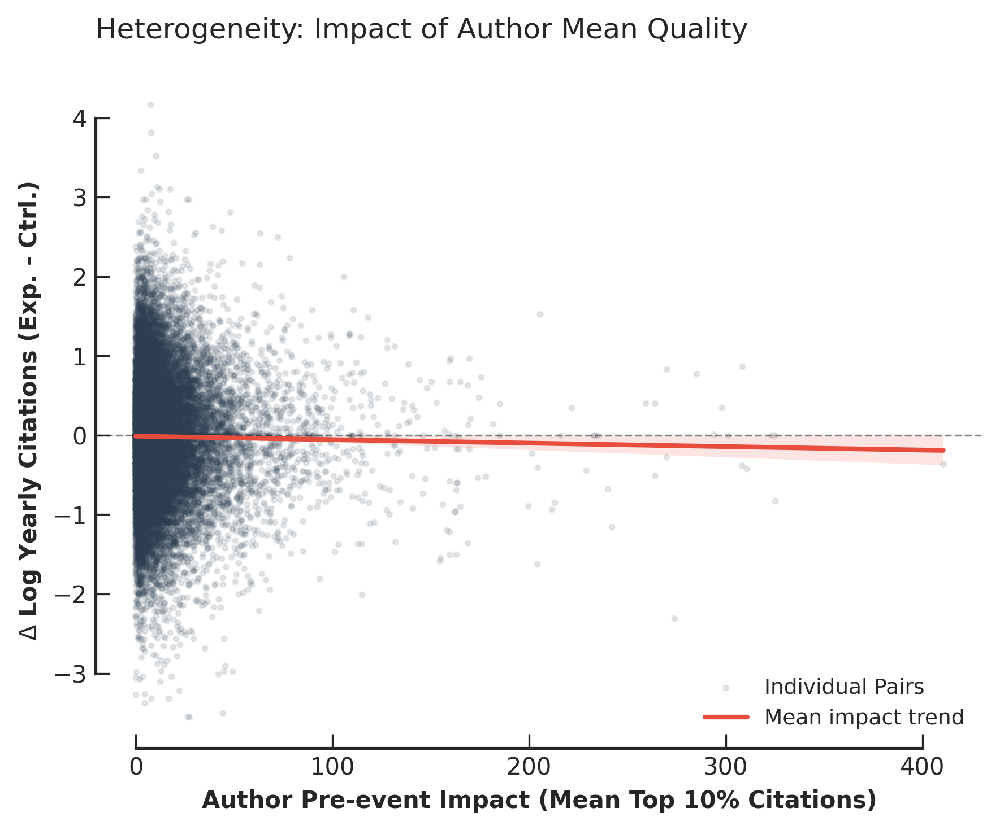

In [61]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. 计算差值 (Difference-in-Means per Pair)
post_df = panel_df[panel_df['pd'] > 0].copy()

# 将变量替换为 Num_top10mean
pair_grouped = post_df.groupby(['pair', 'group']).agg({
    'log_yearlycitation': 'mean',
    'Num_top10mean': 'first'  # 核心改动：使用平均影响力作为 X 轴基准
}).reset_index()

# 转换为宽表格式
df_wide = pair_grouped.pivot(index='pair', columns='group', values=['log_yearlycitation', 'Num_top10mean'])
df_wide.columns = ['log_cit_0', 'log_cit_1', 'impact_0', 'impact_1']

# 计算 Y 轴：事后引用差值；X 轴：作者平均声望（取实验组）
df_wide['citation_diff'] = df_wide['log_cit_1'] - df_wide['log_cit_0']
df_wide['author_impact'] = df_wide['impact_1'] 

# 2. 绘图设置 (Nature 标准)
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial'],
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'pdf.fonttype': 42
})

fig, ax = plt.subplots(figsize=(6, 5), dpi=300)

# 3. 绘制散点 (每一个点代表一个配对)
# 针对 2w+ 数据，alpha 降至 0.1 以显示密度
ax.scatter(df_wide['author_impact'], df_wide['citation_diff'], 
           color='#2c3e50', s=4, alpha=0.1, rasterized=True, label='Individual Pairs')

# 4. 绘制水平基准线 (y=0)
ax.axhline(0, color='black', linestyle='--', linewidth=0.8, alpha=0.5)

# 5. 绘制趋势拟合线 (Mean Impact Trend)
# 强制开启 ci=95 以展示统计显著性
sns.regplot(data=df_wide, x='author_impact', y='citation_diff', 
            scatter=False, ci=95, 
            line_kws={'color': '#e74c3c', 'lw': 2, 'zorder': 5}, 
            ax=ax, label='Mean impact trend')

# 6. 细节精修
ax.set_xlabel('Author Pre-event Impact (Mean Top 10% Citations)', fontsize=10, fontweight='bold')
ax.set_ylabel('$\Delta$ Log Yearly Citations (Exp. - Ctrl.)', fontsize=10, fontweight='bold')
ax.set_title('Heterogeneity: Impact of Author Mean Quality', loc='left', fontsize=12, pad=15)

# Nature 风格：如果数据分布极不均匀，建议开启对数轴（取消下行注释即可）
# ax.set_xscale('log') 

sns.despine(trim=True) 

# 优化图例位置
ax.legend(frameon=False, loc='lower right', fontsize=9)

plt.tight_layout()
plt.show()

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

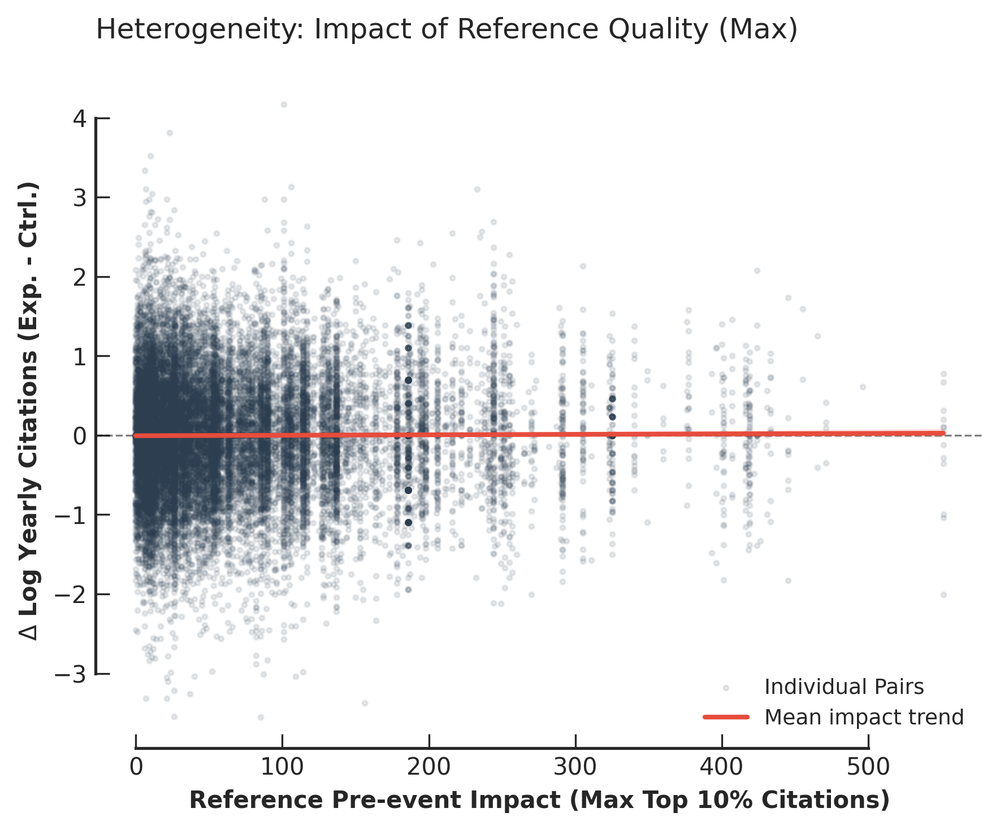

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. 计算差值 (Difference-in-Means per Pair)
post_df = panel_df[panel_df['pd'] > 0].copy()

# 聚合每个 pair，变量切换为 RNum_top10max
pair_grouped = post_df.groupby(['pair', 'group']).agg({
    'log_yearlycitation': 'mean',
    'RNum_top10max': 'first'  # 获取该 pair 对应的参考文献最大质量
}).reset_index()

# 转换为宽表格式
df_wide = pair_grouped.pivot(index='pair', columns='group', values=['log_yearlycitation', 'RNum_top10max'])
df_wide.columns = ['log_cit_0', 'log_cit_1', 'impact_0', 'impact_1']

# 计算 Y 轴：事后引用差值；X 轴：参考文献影响力（取实验组）
df_wide['citation_diff'] = df_wide['log_cit_1'] - df_wide['log_cit_0']
df_wide['ref_impact'] = df_wide['impact_1'] 

# 2. 绘图设置 (Nature 标准)
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial'],
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'pdf.fonttype': 42
})

fig, ax = plt.subplots(figsize=(6, 5), dpi=300)

# 3. 绘制散点
# 依然保持高透明度 (0.1) 处理 2w+ 数据点
ax.scatter(df_wide['ref_impact'], df_wide['citation_diff'], 
           color='#2c3e50', s=4, alpha=0.1, rasterized=True, label='Individual Pairs')

# 4. 绘制水平基准线 (y=0)
ax.axhline(0, color='black', linestyle='--', linewidth=0.8, alpha=0.5)

# 5. 绘制趋势拟合线 (Mean Impact Trend)
# 注意：如果线条不出现，通常是由于 X 轴 0 值过多，regplot 默认无法处理 log 拟合
# 这里我们先保持线性拟合，若需对数拟合请参考下方提示
sns.regplot(data=df_wide, x='ref_impact', y='citation_diff', 
            scatter=False, ci=95, 
            line_kws={'color': '#e74c3c', 'lw': 2, 'zorder': 5}, 
            ax=ax, label='Mean impact trend')

# 6. 细节精修
ax.set_xlabel('Reference Pre-event Impact (Max Top 10% Citations)', fontsize=10, fontweight='bold')
ax.set_ylabel('$\Delta$ Log Yearly Citations (Exp. - Ctrl.)', fontsize=10, fontweight='bold')
ax.set_title('Heterogeneity: Impact of Reference Quality (Max)', loc='left', fontsize=12, pad=15)

# 移除冗余边框
sns.despine(trim=True) 

# 图例设置
ax.legend(frameon=False, loc='lower right', fontsize=9)

plt.tight_layout()
plt.show()

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

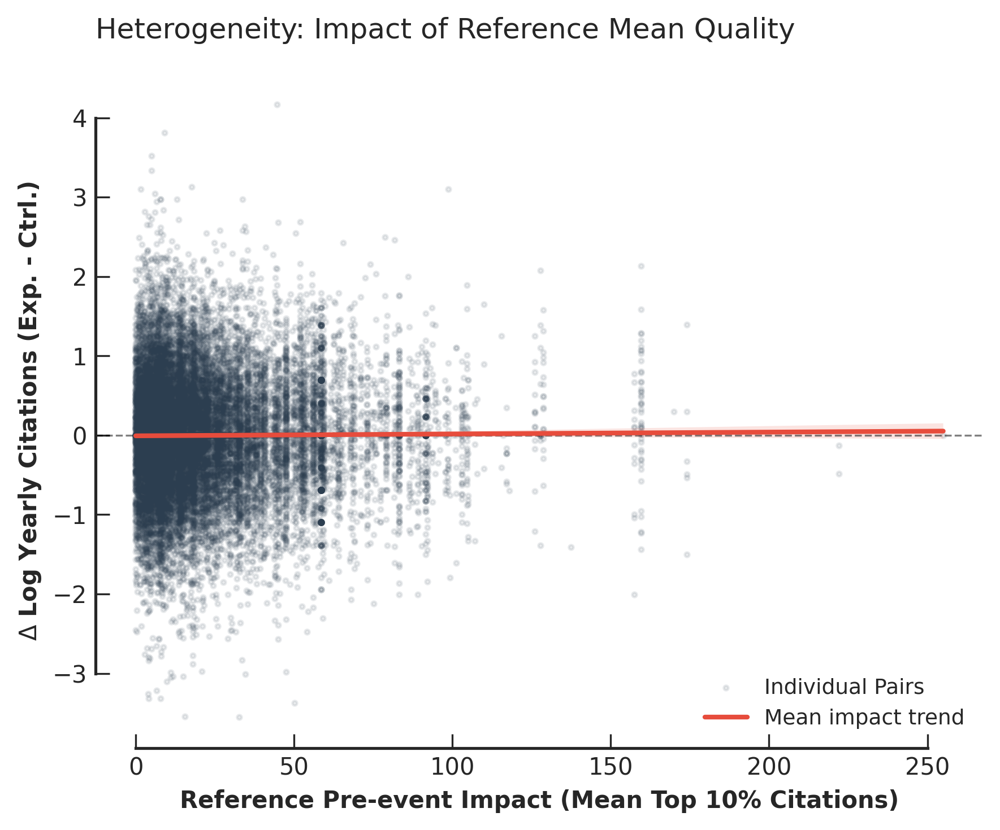

In [63]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. 数据预处理与差值计算
post_df = panel_df[panel_df['pd'] > 0].copy()

# 将核心变量替换为 RNum_top10mean
pair_grouped = post_df.groupby(['pair', 'group']).agg({
    'log_yearlycitation': 'mean',
    'RNum_top10mean': 'first'  # 核心改动：使用参考文献平均质量作为 X 轴
}).reset_index()

# 转换为宽表格式
df_wide = pair_grouped.pivot(index='pair', columns='group', values=['log_yearlycitation', 'RNum_top10mean'])
df_wide.columns = ['log_cit_0', 'log_cit_1', 'impact_0', 'impact_1']

# 计算 Y 轴：事后引用差值 (Exp - Ctrl)；X 轴：参考文献声望（取实验组）
df_wide['citation_diff'] = df_wide['log_cit_1'] - df_wide['log_cit_0']
df_wide['ref_impact'] = df_wide['impact_1'] 

# 2. 绘图样式配置 (Nature Standard)
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial'],
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'pdf.fonttype': 42
})

fig, ax = plt.subplots(figsize=(6, 5), dpi=300)

# 3. 绘制配对散点
# 保持高透明度以应对 2w+ 的数据点
ax.scatter(df_wide['ref_impact'], df_wide['citation_diff'], 
           color='#2c3e50', s=4, alpha=0.1, rasterized=True, label='Individual Pairs')

# 4. 绘制 y=0 基准线
ax.axhline(0, color='black', linestyle='--', linewidth=0.8, alpha=0.5)

# 5. 绘制趋势拟合线 (Mean Impact Trend)
# 确保 ci=95 以展示回归的稳健性
sns.regplot(data=df_wide, x='ref_impact', y='citation_diff', 
            scatter=False, ci=95, 
            line_kws={'color': '#e74c3c', 'lw': 2, 'zorder': 5}, 
            ax=ax, label='Mean impact trend')

# 6. 图表精修
ax.set_xlabel('Reference Pre-event Impact (Mean Top 10% Citations)', fontsize=10, fontweight='bold')
ax.set_ylabel('$\Delta$ Log Yearly Citations (Exp. - Ctrl.)', fontsize=10, fontweight='bold')
ax.set_title('Heterogeneity: Impact of Reference Mean Quality', loc='left', fontsize=12, pad=15)

# 如果参考文献引文分布极度不均（长尾），建议开启对数轴
# ax.set_xscale('log')

sns.despine(trim=True)

# 优化图例
ax.legend(frameon=False, loc='lower right', fontsize=9)

plt.tight_layout()
plt.show()

## JCR与RJCR的Flow情况

In [32]:
panel_df.describe()

,group,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,...,Num_top10mean,RNum_top1max,RNum_top1mean,RNum_top5max,RNum_top5mean,RNum_top10max,RNum_top10mean,paper_age,cited_dummy,Age
count,631990.0,631990.00000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,631990.000000,...,613658.000000,607698.000000,607698.000000,607698.000000,607698.000000,607698.000000,607698.000000,631990.00000,631990.000000,631990.00000
mean,0.5,2014.93229,2007.864580,2013.659001,8.231820,1.640486,0.536834,0.268417,1.273289,5.012469,...,15.211918,12.905397,3.778421,43.195363,13.613586,71.601631,23.108345,7.06771,0.835730,7.06771
std,0.5,5.21755,4.964693,5.381865,15.409225,1.068767,0.498642,0.443136,6.272990,2.826784,...,21.670051,18.038040,5.205878,50.911340,15.721315,78.857494,24.191644,5.21755,0.370521,5.21755
min,0.0,1995.00000,1995.000000,1996.000000,0.000000,0.000000,0.000000,0.000000,-26.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000
25%,0.0,2012.00000,2004.000000,2011.000000,1.000000,0.693147,0.000000,0.000000,-3.000000,3.000000,...,3.500000,2.000000,0.500000,8.000000,3.285714,18.000000,7.500000,3.00000,1.000000,3.00000
50%,0.5,2016.00000,2008.000000,2015.000000,4.000000,1.609438,1.000000,0.000000,1.000000,5.000000,...,9.000000,6.000000,1.916667,25.000000,8.142857,45.000000,15.000000,6.00000,1.000000,6.00000
75%,1.0,2019.00000,2012.000000,2018.000000,10.000000,2.397895,1.000000,1.000000,5.000000,7.000000,...,18.857143,18.000000,5.266667,60.000000,18.000000,101.000000,31.500000,10.00000,1.000000,10.00000
max,1.0,2022.00000,2015.000000,2022.000000,1114.000000,7.016610,1.000000,1.000000,26.000000,27.000000,...,410.600000,174.000000,61.000000,376.000000,168.000000,551.000000,255.000000,27.00000,1.000000,27.00000


In [34]:
#类似field和R_field的处理方法
#我想看jcr与rjcr的匹配情况
# ==========================================
# 1. 提取个体层面的数据并清洗
# ==========================================
# 假设 JCR 分区变量名为 'jcr' 和 'R_jcr'
# 确保排除掉缺失分区的论文，只看两个分区都明确的样本
unique_jcr = panel_df.drop_duplicates(subset='paper_numid').copy()
unique_jcr = unique_jcr[unique_jcr['jcr'].notna() & unique_jcr['rjcr'].notna()]

# ==========================================
# 2. 识别分区不一致的行
# ==========================================
# 判定逻辑：自身期刊分区 jcr 不等于 引用期刊分区 rjcr
jcr_mismatch_mask = unique_jcr['jcr'] != unique_jcr['rjcr']
jcr_mismatched_df = unique_jcr[jcr_mismatch_mask]

# ==========================================
# 3. 统计分区跨度 (Rank Migration)
# ==========================================
total_jcr_mapped = unique_jcr.shape[0]
jcr_mismatch_count = jcr_mismatched_df.shape[0]
jcr_mismatch_rate = (jcr_mismatch_count / total_jcr_mapped) * 100 if total_jcr_mapped > 0 else 0

print("=" * 60)
print(f"JCR 分区匹配统计:")
print(f"1. 双分区信息完整的论文总数: {total_jcr_mapped}")
print(f"2. 自身分区(jcr)与被引分区(rjcr)不一致的论文数: {jcr_mismatch_count}")
print(f"3. 跨分区引用比例: {jcr_mismatch_rate:.2f}%")
print("=" * 60)

# ==========================================
# 4. 深度分析：分区流转矩阵 (JCR Flow Matrix)
# ==========================================
# 观察 Q1 到 Q4 的流转情况，这能看出论文是“向上引用”还是“向下引用”
jcr_matrix = unique_jcr.groupby(['jcr', 'rjcr']).size().unstack(fill_value=0)
print("\nJCR 分区流转矩阵 (Row: Source JCR -> Column: Cited R_JCR):")
print(jcr_matrix)

# 识别“向上引用” (即引用了比自己分区更高的期刊，如 Q2 引用 Q1)
# 假设分区以数字存储 (1, 2, 3, 4)，则 R_jcr < jcr 代表向上引用
# 如果是字符串 'Q1', 'Q2'，则需要特殊处理
print("\n最常见的 JCR 跨分区引用组合:")
print(jcr_mismatched_df.groupby(['jcr', 'rjcr']).size().sort_values(ascending=False))


JCR 分区匹配统计:
1. 双分区信息完整的论文总数: 46576
2. 自身分区(jcr)与被引分区(rjcr)不一致的论文数: 27990
3. 跨分区引用比例: 60.10%

JCR 分区流转矩阵 (Row: Source JCR -> Column: Cited R_JCR):
rjcr      1     2    3   4     5
jcr                             
1     12554  1580  928  58  3344
2      5074  1590  636  20  1856
3      2838   522  534  20  1134
4       468   112   70  30   140
5      7030  1246  868  46  3878

最常见的 JCR 跨分区引用组合:
jcr  rjcr
5    1       7030
2    1       5074
1    5       3344
3    1       2838
2    5       1856
1    2       1580
5    2       1246
3    5       1134
1    3        928
5    3        868
2    3        636
3    2        522
4    1        468
     5        140
     2        112
     3         70
1    4         58
5    4         46
2    4         20
3    4         20
dtype: int64


In [40]:
import plotly.graph_objects as go
import pandas as pd

# 1. 准备数据：只保留 jcr 和 rjcr 都在 1-4 范围内的记录
core_jcr_order = [1, 2, 3, 4]
jcr_labels = {1: "Q1", 2: "Q2", 3: "Q3", 4: "Q4"}

# 过滤数据
links = unique_jcr[
    unique_jcr['jcr'].isin(core_jcr_order) & 
    unique_jcr['rjcr'].isin(core_jcr_order)
].copy()

# 统计频次
links = links.groupby(['jcr', 'rjcr']).size().reset_index(name='value')

# 2. 映射节点编号
# 左侧 Source (0-3), 右侧 Target (4-7)
mapping = {val: i for i, val in enumerate(core_jcr_order)}
links['source'] = links['jcr'].map(mapping)
links['target'] = links['rjcr'].map(mapping) + len(core_jcr_order)

# 3. 设置配色 (使用更具学术质感的透明色)
colors_map = {
    1: "rgba(31, 119, 180, 0.45)",  # Q1: 经典蓝
    2: "rgba(44, 160, 44, 0.45)",   # Q2: 生机绿
    3: "rgba(255, 127, 14, 0.45)",  # Q3: 活力橙
    4: "rgba(214, 39, 40, 0.45)"    # Q4: 警示红
}
links['color'] = links['jcr'].map(colors_map)

# 4. 绘制桑基图
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=20,
        thickness=30,
        line=dict(color="rgba(0,0,0,0.2)", width=0.5),
        # 标签只显示 Q1-Q4
        label=[jcr_labels[i] for i in core_jcr_order] * 2,
        color=["#1f77b4", "#2ca02c", "#ff7f0e", "#d62728"] * 2
    ),
    link=dict(
        source=links['source'].astype(int),
        target=links['target'].astype(int),
        value=links['value'],
        color=links['color']
    )
)])

# 5. 布局优化
fig.update_layout(
    title=dict(
        text="Journal Rank Migration (Q1-Q4 Citation Flow)",
        x=0.5,
        font=dict(size=18, family="Arial")
    ),
    font=dict(size=12, family="Arial"),
    width=800,
    height=600,
    plot_bgcolor="white",
    paper_bgcolor="white",
    margin=dict(l=40, r=40, t=80, b=40)
)

fig.show()

# 导出高质量 PDF 供排版使用
# fig.write_image("/Data4/yutao_wen/26.1.19/jcr_q1_q4_flow.pdf")

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

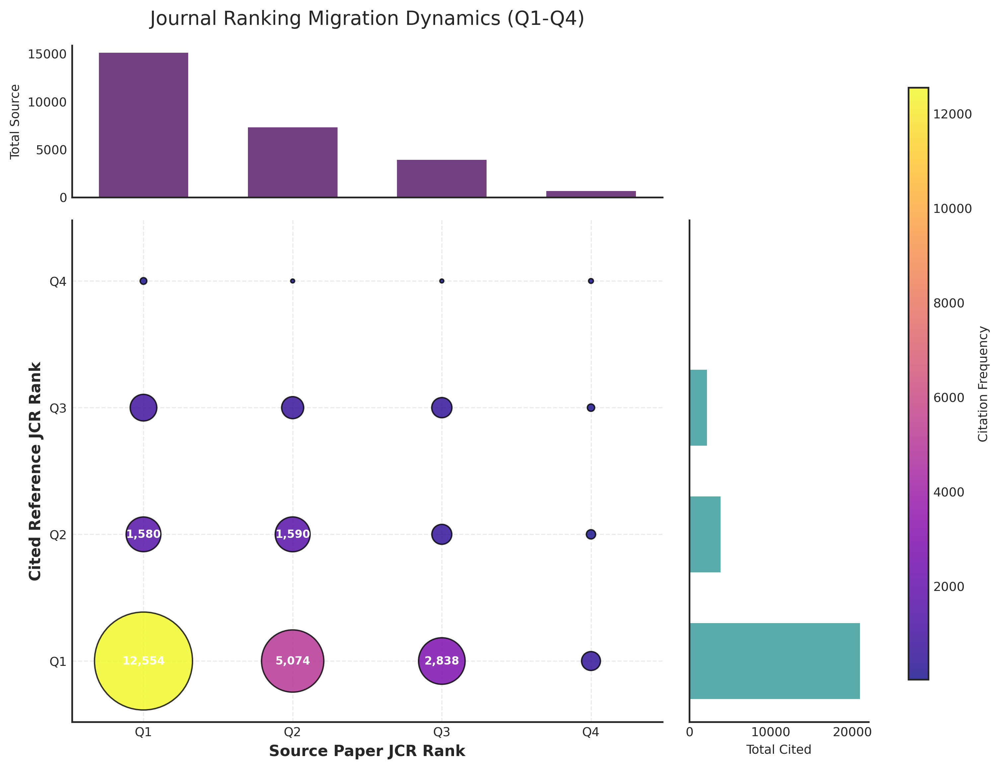

In [41]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd

# —— 1. 数据准备 ——
# 确保排除分区 5，只关注 Q1-Q4
core_jcr = [1, 2, 3, 4]
jcr_links = unique_jcr[
    unique_jcr['jcr'].isin(core_jcr) & 
    unique_jcr['rjcr'].isin(core_jcr)
].groupby(['jcr', 'rjcr']).size().reset_index(name='weight')

# 映射标签
jcr_labels = {1: "Q1", 2: "Q2", 3: "Q3", 4: "Q4"}
jcr_links['jcr_str'] = jcr_links['jcr'].map(jcr_labels)
jcr_links['rjcr_str'] = jcr_links['rjcr'].map(jcr_labels)

# —— 2. 画布设置 ——
plt.style.use('seaborn-v0_8-white')
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']

fig = plt.figure(figsize=(10, 8.5), dpi=300)
gs = gridspec.GridSpec(4, 4, hspace=0.15, wspace=0.15)

# 子图布局
ax_main = fig.add_subplot(gs[1:4, 0:3])      # 主气泡图
ax_top = fig.add_subplot(gs[0, 0:3], sharex=ax_main)   # 上方边际图 (Source JCR)
ax_right = fig.add_subplot(gs[1:4, 3], sharey=ax_main) # 右侧边际图 (Cited rJCR)

# —— 3. 主气泡图 (Main Bubble Plot) ——
# 使用 'plasma' 或 'viridis'，不仅美观且符合学术色盲友好要求
scatter = ax_main.scatter(jcr_links['jcr'], jcr_links['rjcr'], 
                         s=jcr_links['weight'] * 0.4, # 缩放系数
                         c=jcr_links['weight'], 
                         cmap='plasma', 
                         alpha=0.8, edgecolors="black", linewidth=1.0)

# 添加数值标注 (针对大流量路径)
for i in range(len(jcr_links)):
    val = int(jcr_links['weight'].iloc[i])
    # 如果数值较大，在气泡中心显示
    if val > 1000:
        ax_main.text(jcr_links['jcr'].iloc[i], jcr_links['rjcr'].iloc[i], 
                     format(val, ','),
                     ha='center', va='center', fontsize=8, color='white', weight='bold')

# —— 4. 边际分布 (Marginal Bar Charts) ——
# 上方：Source JCR 分布
source_sum = jcr_links.groupby('jcr')['weight'].sum()
ax_top.bar(source_sum.index, source_sum.values, color='#440154', alpha=0.75, width=0.6)
ax_top.set_title("Journal Ranking Migration Dynamics (Q1-Q4)", fontsize=14, pad=15)
ax_top.set_ylabel("Total Source", fontsize=9)

# 右侧：Cited rJCR 分布
cited_sum = jcr_links.groupby('rjcr')['weight'].sum()
ax_right.barh(cited_sum.index, cited_sum.values, color='#21918c', alpha=0.75, height=0.6)
ax_right.set_xlabel("Total Cited", fontsize=9)

# —— 5. 细节打磨 ——
# 设置轴标签为 Q1-Q4
ax_main.set_xticks(core_jcr)
ax_main.set_xticklabels([jcr_labels[i] for i in core_jcr])
ax_main.set_yticks(core_jcr)
ax_main.set_yticklabels([jcr_labels[i] for i in core_jcr])

ax_main.grid(True, linestyle='--', alpha=0.4)
ax_main.set_xlabel("Source Paper JCR Rank", fontsize=11, weight='bold')
ax_main.set_ylabel("Cited Reference JCR Rank", fontsize=11, weight='bold')

# 颜色条
cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
fig.colorbar(scatter, cax=cbar_ax, label='Citation Frequency')

# 隐藏边际图多余标签
plt.setp(ax_top.get_xticklabels(), visible=False)
plt.setp(ax_right.get_yticklabels(), visible=False)

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9)
plt.show()

## 完美数据测试代码

In [ ]:
import pandas as pd
import numpy as np
import random

# 设置参数
NUM_TREATED_PAPERS = 200  # 实验组论文数量
MAX_YEAR = 2023          # 观测截止年份
MIN_PUB_YEAR = 2000      # 论文最早发表年份
MAX_PUB_YEAR = 2015      # 论文最晚发表年份
MIN_TREAT_YEAR = 2018    # 最早的事件冲击年份
MAX_TREAT_YEAR = 2022    # 最晚的事件冲击年份

# --- 1. 生成论文基础信息 ---
paper_base_info = []

# 为每篇实验组论文生成基础信息
for i in range(1, NUM_TREATED_PAPERS + 1):
    # 确保 pyear 和 ryear 逻辑上可行 (ryear > pyear)
    pyear = random.randint(MIN_PUB_YEAR, MAX_PUB_YEAR)
    # 确保 ryear 至少比 pyear 大 3 年，且在预设范围内
    ryear = random.randint(max(pyear + 3, MIN_TREAT_YEAR), MAX_TREAT_YEAR)
    
    # 实验组论文信息
    treated_info = {
        'paper_numid': i,
        'group': 1,  # 实验组
        'pyear': pyear,
        'ryear': ryear
    }
    
    # 控制组论文信息 (与其配对，paper_numid 从 201 开始)
    control_info = {
        'paper_numid': i + NUM_TREATED_PAPERS,
        'group': 0,  # 控制组
        # 核心要求：pyear 相同
        'pyear': pyear, 
        # ryear 采用实验组的冲击年份，用于定义 Pre/Post 期
        'ryear': ryear 
    }
    
    paper_base_info.extend([treated_info, control_info])

base_df = pd.DataFrame(paper_base_info)

# --- 2. 构造面板数据框架 ---
panel_data = []

# 对每一对匹配的论文进行处理
for index, row in base_df.iterrows():
    paper_id = row['paper_numid']
    group = row['group']
    pyear = row['pyear']
    ryear = row['ryear']
    
    # 论文的观测期从发表年份 (pyear) 开始，到截止年份 (MAX_YEAR)
    for year in range(pyear, MAX_YEAR + 1):
        
        # 距离冲击年份的距离 (pd)
        pd_val = year - ryear
        
        # 多期 DID 变量 (did)
        # 仅实验组 (group=1) 在冲击年及之后 (year >= ryear) 的年份才计算干预效应
        did_val = 1 if (group == 1 and year >= ryear) else 0
        
        panel_data.append({
            'paper_numid': paper_id,
            'group': group,
            'year': year,
            'pyear': pyear,
            'ryear': ryear,
            'pd': pd_val,
            'did': did_val,
            # 引用数 log_yearlycitation 将在下一步计算
            'log_yearlycitation': 0 
        })

df = pd.DataFrame(panel_data)

# --- 3. 生成并分配 log_yearlycitation (核心逻辑 - 已修复索引错误) ---

# 定义随机引用数生成函数
def generate_citation(mean_val, std_dev):
    # 生成一个正态随机数，并确保它不小于 0
    return max(0, np.random.normal(mean_val, std_dev))

# 用于存储预先生成的、事前的引用数序列 (Key: 实验组 paper_numid)
pre_treatment_citations = {}

# 统一处理实验组 (group=1) 和控制组 (group=0) 的事前数据
for index, row in base_df[base_df['group'] == 1].iterrows():
    treated_id = row['paper_numid']
    # 控制组ID = 实验组ID + 论文总数 (200)
    control_id = treated_id + NUM_TREATED_PAPERS
    ryear = row['ryear']
    
    # --- A. 生成并分配实验组的事前引用数 ---
    # 直接在主 DataFrame df 上生成掩码：实验组 (1) 且在冲击年 (ryear) 之前
    treated_pre_mask = (df['paper_numid'] == treated_id) & (df['year'] < ryear)
    num_pre_years = treated_pre_mask.sum()
    
    if num_pre_years > 0:
        # 生成一组事前的随机引用数 (模拟基准趋势)
        pre_cites = [generate_citation(2.0, 1.5) for _ in range(num_pre_years)]
        
        # 存储这组引用数，供控制组使用
        pre_treatment_citations[treated_id] = pre_cites
        
        # 分配引用数给实验组的事前数据 (修复赋值)
        df.loc[treated_pre_mask, 'log_yearlycitation'] = pre_cites
        
        # --- B. 分配给控制组的事前引用数 ---
        # 直接在主 DataFrame df 上生成掩码：控制组 (0) 且在冲击年 (ryear) 之前
        control_pre_mask = (df['paper_numid'] == control_id) & (df['year'] < ryear)
        
        # 核心要求：将实验组事前的引用数完全复制给控制组 (完美配对，事前趋势完全相同)
        df.loc[control_pre_mask, 'log_yearlycitation'] = pre_cites


# 4. 处理冲击后数据 (year >= ryear)

# 实验组 (group=1) 冲击后的引用数：正常随机生成 (模拟干预效应)
post_treated_mask = (df['group'] == 1) & (df['year'] >= df['ryear'])
num_post_treated = post_treated_mask.sum()
if num_post_treated > 0:
    # 假设实验组冲击后引用数有提升
    post_cites_treated = [generate_citation(5.0, 2.0) for _ in range(num_post_treated)]
    df.loc[post_treated_mask, 'log_yearlycitation'] = post_cites_treated

# 控制组 (group=0) 冲击后的引用数：核心要求，每年都设为 0 (模拟理想对照)
post_control_mask = (df['group'] == 0) & (df['year'] >= df['ryear'])
df.loc[post_control_mask, 'log_yearlycitation'] = 0.0

# --- 5. 结果整理 ---

# 确保 log_yearlycitation 至少精确到两位小数
df['log_yearlycitation'] = df['log_yearlycitation'].round(2)

# 调整列顺序和名称
final_df = df[['group', 'year', 'pyear', 'ryear', 'log_yearlycitation', 'did', 'pd', 'paper_numid']]

# 打印最终数据框信息
print(f"成功生成多期 DID 理想面板数据，共 {len(final_df)} 行记录。")
print(f"包含 {NUM_TREATED_PAPERS} 篇实验组论文和 {NUM_TREATED_PAPERS} 篇控制组论文。")
print("\n数据框前5行:")
print(final_df.head())

# 将结果保存为CSV文件，方便后续使用
# final_df.to_csv('ideal_did_panel_data.csv', index=False, encoding='utf-8')

In [ ]:
final_df

In [ ]:
output_path = '/Data4/yutao_wen/25.11.10/final_df_random.csv'
# 保存为 CSV 文件
final_df.to_csv(output_path, index=False)

## 重绘平行趋势图


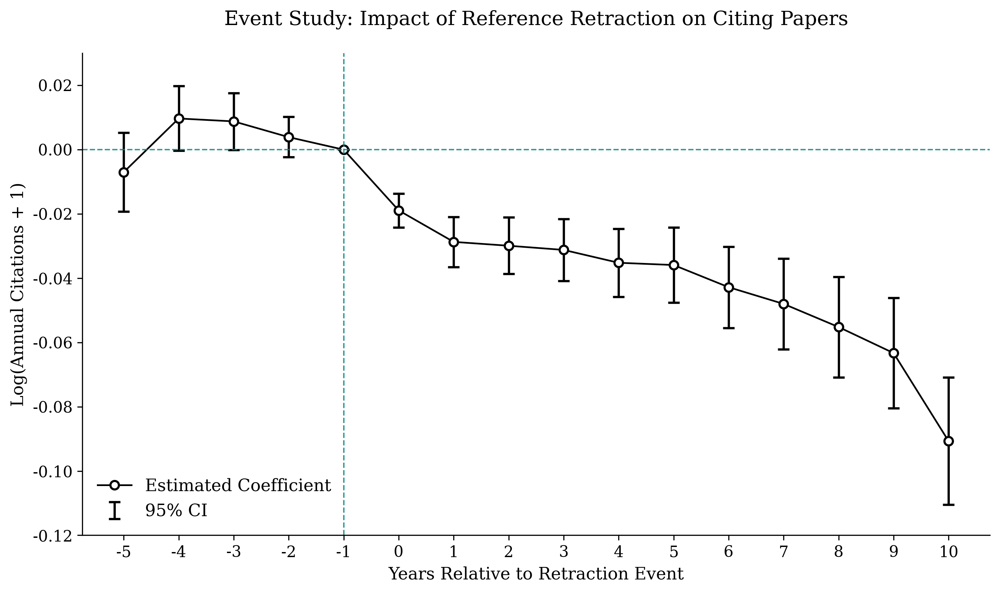

In [7]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 1. 整理回归结果数据
data = {
    'event': [-5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'coef': [-0.0070, 0.0097, 0.0088, 0.0039, 0, -0.0189, -0.0287, -0.0299, -0.0312, -0.0352, -0.0359, -0.0428, -0.0480, -0.0552, -0.0633, -0.0907],
    'ci_low': [-0.0193, -0.0003, -0.0001, -0.0023, 0, -0.0242, -0.0365, -0.0386, -0.0408, -0.0458, -0.0476, -0.0555, -0.0621, -0.0709, -0.0805, -0.1105],
    'ci_high': [0.0053, 0.0198, 0.0176, 0.0102, 0, -0.0137, -0.0209, -0.0211, -0.0216, -0.0246, -0.0242, -0.0302, -0.0339, -0.0396, -0.0461, -0.0709]
}

df = pd.DataFrame(data)

# 2. 设置绘图风格
plt.rcParams['font.sans-serif'] = ['Arial'] 
plt.rcParams['axes.unicode_minus'] = False
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

# 3. 绘制置信区间 (Confidence Intervals)
# 调整关键：增加了 elinewidth（线宽）和 capsize（横杠宽度）
ax.errorbar(df['event'], df['coef'], 
            yerr=[df['coef'] - df['ci_low'], df['ci_high'] - df['coef']], 
            fmt='none', color='black', ecolor='black', 
            elinewidth=1.6,  # 稍微加粗，显得更有存在感
            capsize=4,       # 横杠加长
            capthick=1.6,    # 横杠加厚
            label='95% CI',
            zorder=1)        # 确保在点下方

# 4. 绘制点估计值 (Point Estimates)
# 为了突出 error bar，我们将圆点稍微缩小一点点 (markersize 从 7 降到 6)
ax.plot(df['event'], df['coef'], marker='o', color='black', 
        markersize=6, mfc='white', markeredgewidth=1.5, 
        linestyle='-', linewidth=1.2, label='Estimated Coefficient',
        zorder=2)

# 5. 添加参考线
ax.axhline(0, color='teal', linestyle='--', linewidth=1, alpha=0.8)
ax.axvline(-1, color='teal', linestyle='--', linewidth=1, alpha=0.8)

# 6. 精细调整坐标轴（核心改进：收紧 Y 轴范围）
# 原始数据最小值约 -0.11，最大值约 0.02
# 将 ylim 从 (-0.15, 0.05) 缩减到 (-0.12, 0.03)，这会让 error bar 在垂直方向上被拉长
ax.set_ylim(-0.12, 0.03) 

ax.set_xlabel('Years Relative to Retraction Event', fontsize=12)
ax.set_ylabel('Log(Annual Citations + 1)', fontsize=12)
ax.set_xticks(range(-5, 11))

# 隐藏边框
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# 7. 添加图例
ax.legend(frameon=False, loc='lower left')
plt.title('Event Study: Impact of Reference Retraction on Citing Papers', fontsize=14, pad=20)

plt.tight_layout()
plt.show()

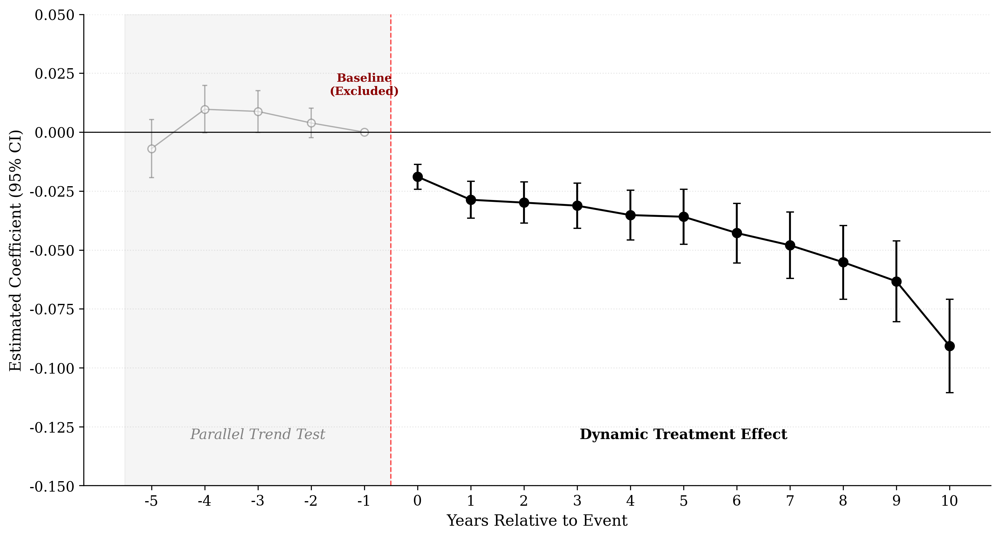

In [5]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 1. 准备数据
data = {
    'event': [-5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    'coef': [-0.0070, 0.0097, 0.0088, 0.0039, 0, -0.0189, -0.0287, -0.0299, -0.0312, -0.0352, -0.0359, -0.0428, -0.0480, -0.0552, -0.0633, -0.0907],
    'ci_low': [-0.0193, -0.0003, -0.0001, -0.0023, 0, -0.0242, -0.0365, -0.0386, -0.0408, -0.0458, -0.0476, -0.0555, -0.0621, -0.0709, -0.0805, -0.1105],
    'ci_high': [0.0053, 0.0198, 0.0176, 0.0102, 0, -0.0137, -0.0209, -0.0211, -0.0216, -0.0246, -0.0242, -0.0302, -0.0339, -0.0396, -0.0461, -0.0709]
}
df = pd.DataFrame(data)

# 区分事前和事后索引
pre_mask = df['event'] < 0
post_mask = df['event'] >= 0

# 2. 设置画布
plt.rcParams['font.sans-serif'] = ['Arial']
fig, ax = plt.subplots(figsize=(11, 6), dpi=300)

# --- 核心改进：添加事前背景阴影 ---
ax.axvspan(-5.5, -0.5, color='gray', alpha=0.08, label='Pre-treatment Period')

# 3. 绘制事前点（灰色系，强调“平行”）
ax.errorbar(df.loc[pre_mask, 'event'], df.loc[pre_mask, 'coef'], 
            yerr=[df.loc[pre_mask, 'coef'] - df.loc[pre_mask, 'ci_low'], df.loc[pre_mask, 'ci_high'] - df.loc[pre_mask, 'coef']], 
            fmt='none', ecolor='gray', elinewidth=1, capsize=2, alpha=0.6)
ax.plot(df.loc[pre_mask, 'event'], df.loc[pre_mask, 'coef'], marker='o', color='gray', 
        markersize=6, mfc='white', markeredgewidth=1, linestyle='-', linewidth=1, alpha=0.6)

# 4. 绘制事后点（深色系，强调“效应”）
ax.errorbar(df.loc[post_mask, 'event'], df.loc[post_mask, 'coef'], 
            yerr=[df.loc[post_mask, 'coef'] - df.loc[post_mask, 'ci_low'], df.loc[post_mask, 'ci_high'] - df.loc[post_mask, 'coef']], 
            fmt='none', ecolor='black', elinewidth=1.5, capsize=3)
ax.plot(df.loc[post_mask, 'event'], df.loc[post_mask, 'coef'], marker='o', color='black', 
        markersize=7, mfc='black', linestyle='-', linewidth=1.5, label='Treatment Effect')

# 5. 强化参考线
ax.axhline(0, color='black', linestyle='-', linewidth=0.8) # y=0 变为实线，更显眼
ax.axvline(-0.5, color='red', linestyle='--', linewidth=1, alpha=0.7) # 政策发生分界线

# 6. 添加标注
ax.text(-1, 0.015, 'Baseline\n(Excluded)', ha='center', va='bottom', fontsize=9, color='darkred', fontweight='bold')
ax.text(-3, -0.13, 'Parallel Trend Test', ha='center', fontsize=11, color='gray', style='italic')
ax.text(5, -0.13, 'Dynamic Treatment Effect', ha='center', fontsize=11, color='black', fontweight='bold')

# 7. 细节打磨
ax.set_xlabel('Years Relative to Event', fontsize=12)
ax.set_ylabel('Estimated Coefficient (95% CI)', fontsize=12)
ax.set_xticks(range(-5, 11))
ax.set_ylim(-0.15, 0.05)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(axis='y', linestyle=':', alpha=0.3) # 添加极淡的水平网格辅助观察

plt.tight_layout()
plt.show()

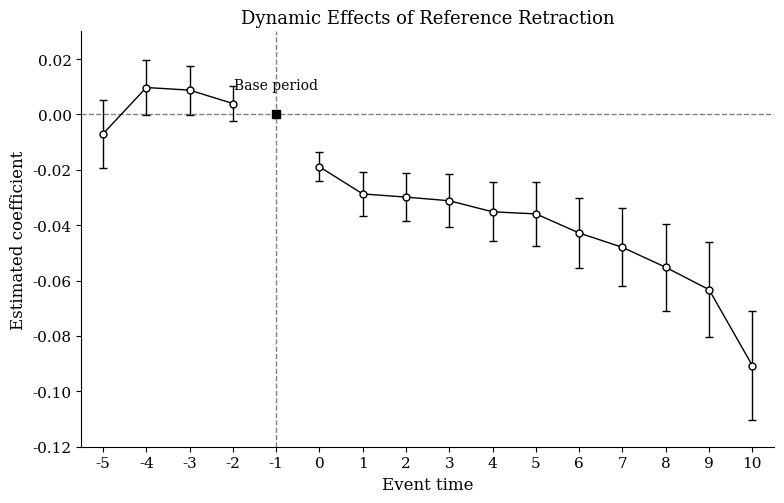

In [4]:
import matplotlib.pyplot as plt
import numpy as np

# =========================
# Event-study estimates
# Base period: event time = -1 (omitted)
# =========================
event_time = np.array([-5, -4, -3, -2, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10])

coef = np.array([
    -0.0070049,
     0.0097098,
     0.0087705,
     0.0039346,
    -0.0189282,
    -0.0287091,
    -0.0298673,
    -0.0311847,
    -0.0351734,
    -0.0359230,
    -0.0428313,
    -0.0480049,
    -0.0552246,
    -0.0632838,
    -0.0907022
])

ci_low = np.array([
    -0.0192798,
    -0.0003380,
    -0.0000598,
    -0.0023443,
    -0.0241832,
    -0.0365456,
    -0.0385982,
    -0.0407951,
    -0.0457650,
    -0.0476070,
    -0.0555085,
    -0.0620994,
    -0.0708927,
    -0.0804828,
    -0.1104583
])

ci_high = np.array([
     0.0052700,
     0.0197576,
     0.0176007,
     0.0102136,
    -0.0136733,
    -0.0208726,
    -0.0211363,
    -0.0215743,
    -0.0245817,
    -0.0242390,
    -0.0301541,
    -0.0339104,
    -0.0395566,
    -0.0460849,
    -0.0709460
])

# Error bar lengths
yerr = np.vstack([coef - ci_low, ci_high - coef])

# Split pre and post for cleaner connection across omitted base period
pre_mask = event_time <= -2
post_mask = event_time >= 0

# =========================
# Plot
# =========================
plt.rcParams.update({
    "font.family": "serif",
    "font.size": 12,
    "axes.labelsize": 12,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11
})

fig, ax = plt.subplots(figsize=(8, 5.2))

# Zero line
ax.axhline(0, linestyle='--', linewidth=1.0, color='gray')

# Vertical line at base period (-1)
ax.axvline(-1, linestyle='--', linewidth=1.0, color='gray')

# Pre-treatment estimates
ax.errorbar(
    event_time[pre_mask],
    coef[pre_mask],
    yerr=yerr[:, pre_mask],
    fmt='o-',
    color='black',
    ecolor='black',
    elinewidth=1.0,
    capsize=3,
    markersize=5,
    markerfacecolor='white',
    markeredgewidth=1.0,
    linewidth=1.0
)

# Post-treatment estimates
ax.errorbar(
    event_time[post_mask],
    coef[post_mask],
    yerr=yerr[:, post_mask],
    fmt='o-',
    color='black',
    ecolor='black',
    elinewidth=1.0,
    capsize=3,
    markersize=5,
    markerfacecolor='white',
    markeredgewidth=1.0,
    linewidth=1.0
)

# Optional: mark omitted base period
ax.scatter(-1, 0, marker='s', s=28, facecolors='black', edgecolors='black', zorder=3)
ax.text(-1, 0.008, 'Base period', ha='center', va='bottom', fontsize=10)

# Labels and limits
ax.set_xlabel("Event time")
ax.set_ylabel("Estimated coefficient")
ax.set_xticks(np.arange(-5, 11, 1))
ax.set_xlim(-5.5, 10.5)
ax.set_ylim(-0.12, 0.03)

# Clean style
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.tick_params(axis='both', direction='out')

# Title
ax.set_title("Dynamic Effects of Reference Retraction")

plt.tight_layout()
plt.show()

# 模块（九）Relevance Score

## Relevance Score的总体分布

### 缓解内存压力（压缩原CSV）

In [1]:
!pip install duckdb pyarrow matplotlib seaborn

     |████████████████████████████████| 11.6 MB 13.2 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for duckdb: filename=duckdb-1.3.2-cp38-cp38-linux_x86_64.whl size=19277111 sha256=02f36936974012f0b3507281f81b74aa3f9fede6d4668f2a9dca16b51d3cb330
  Stored in directory: /home/wenyutao/.cache/pip/wheels/66/b8/e4/252034420e4bc1d322a297e590ce11ee1c5c36606d14e17ab4
Successfully built duckdb


In [2]:
import duckdb
import time
import os

# 配置路径
csv_path = '/Data4/yutao_wen/paper_concept.csv'
parquet_path = '/Data4/yutao_wen/paper_concept.parquet'
temp_dir = '/Data4/yutao_wen/duckdb_temp'

if not os.path.exists(temp_dir):
    os.makedirs(temp_dir)

print("🚀 启动全量转换任务（38.4 亿行）...")
print("⏱️ 预计耗时：20 - 50 分钟（取决于磁盘写入速度）")
start_time = time.time()

con = duckdb.connect()

# 内存与路径优化配置
con.execute(f"PRAGMA memory_limit='150GB'")
con.execute(f"PRAGMA temp_directory='{temp_dir}'")

try:
    # 执行全量转换
    # 删除了 LIMIT，使用了 ZSTD 压缩以节省空间
    con.execute(f"""
        COPY (
            SELECT 
                paperid, 
                concept, 
                try_cast(relevance AS FLOAT) AS relevance 
            FROM read_csv(
                '{csv_path}', 
                header=True,
                quote='"',
                escape='"',
                auto_detect=False,
                columns={{
                    'paperid': 'VARCHAR', 
                    'concept': 'VARCHAR', 
                    'relevance': 'VARCHAR'
                }}
            )
            WHERE try_cast(relevance AS FLOAT) IS NOT NULL
        ) TO '{parquet_path}' (FORMAT PARQUET, COMPRESSION ZSTD);
    """)

    end_time = time.time()
    duration = (end_time - start_time) / 60
    print(f"\n✅ 全量转换任务圆满完成！")
    print(f"📦 最终文件位置: {parquet_path}")
    print(f"⏱️ 总耗时: {duration:.2f} 分钟")
    
    # 检查最终大小
    final_size_gb = os.path.getsize(parquet_path) / (1024**3)
    print(f"📊 压缩后的文件大小: {final_size_gb:.2f} GB (原始 130GB)")

except Exception as e:
    print(f"❌ 运行中出现错误: {e}")

🚀 启动全量转换任务（38.4 亿行）...
⏱️ 预计耗时：20 - 50 分钟（取决于磁盘写入速度）


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))


✅ 全量转换任务圆满完成！
📦 最终文件位置: /Data4/yutao_wen/paper_concept.parquet
⏱️ 总耗时: 30.25 分钟
📊 压缩后的文件大小: 23.45 GB (原始 130GB)


### Relevance总体分布（38亿个concept）

📊 正在底层直接聚合直方图数据和计算均值...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

🎨 开始渲染图表...
✅ 图表已保存为 relevance_distribution_safe.png


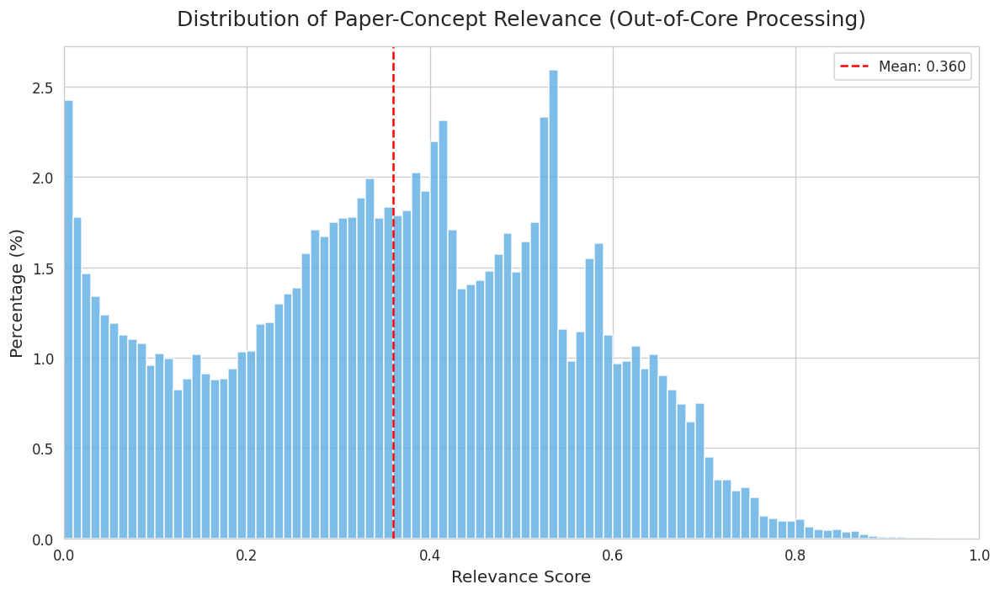

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import duckdb

parquet_path = '/Data4/yutao_wen/paper_concept.parquet'
con = duckdb.connect()

print("📊 正在底层直接聚合直方图数据和计算均值...")

# 1. 直接用 SQL 在底层计算均值
mean_val = con.execute(f"SELECT avg(relevance) FROM read_parquet('{parquet_path}')").fetchone()[0]

# 2. 直接用 SQL 将数据分为 100 个区间，并统计每个区间的数量 (仅返回100行数据到内存)
query = f"""
    SELECT 
        floor(relevance * 100) / 100.0 AS bin_start,
        count(*) AS cnt
    FROM read_parquet('{parquet_path}')
    WHERE relevance >= 0 AND relevance <= 1
    GROUP BY bin_start
    ORDER BY bin_start
"""
df_hist = con.execute(query).df()

# 3. 计算百分比
total_count = df_hist['cnt'].sum()
df_hist['percentage'] = (df_hist['cnt'] / total_count) * 100

print("🎨 开始渲染图表...")

# 4. 绘图代码
plt.figure(figsize=(10, 6), dpi=120)
sns.set_style("whitegrid")

# 绘制柱状图
plt.bar(df_hist['bin_start'], df_hist['percentage'], 
        width=0.01, align='edge', color='#5DADE2', edgecolor='white', alpha=0.8)

# 辅助线和美化
plt.axvline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.3f}')
plt.xlim(0, 1)
plt.title('Distribution of Paper-Concept Relevance (Out-of-Core Processing)', fontsize=15, pad=15)
plt.xlabel('Relevance Score', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.legend()
plt.tight_layout()

plt.savefig('relevance_distribution_safe.png')
print("✅ 图表已保存为 relevance_distribution_safe.png")

## 给Treat/Control匹配数据

### 导入实验组控制组对

In [3]:
E_C_df_merged = pd.read_csv("/Data4/yutao_wen/26.4.21/E_C_df_merged_check.csv")

In [4]:
# 只关注在2015年到2015年间发表的论文
# 2. 确保 PYear 是数值类型（防止导入时被误认为字符串）
E_C_df_merged['PYear'] = pd.to_numeric(E_C_df_merged['PYear'], errors='coerce')

# 3. 过滤 1995 到 2015 之间的行 (inclusive=True 表示包含边界)
E_C_df_merged = E_C_df_merged[E_C_df_merged['PYear'].between(1995, 2015)].copy()

# 4. 验证过滤结果
print(f"过滤后的年份范围: {E_C_df_merged['PYear'].min()} - {E_C_df_merged['PYear'].max()}")
print(f"剩余行数: {len(E_C_df_merged):,}")

过滤后的年份范围: 1995 - 2015
剩余行数: 23,288


In [5]:
E_C_df_merged

,id,Cid,Ecitation_Before,Ccitation_Before,Ecitation_After,Ccitation_After,log_citation_distance,PYear,Journal_id,NumA,NumR,reference_ids,RPYear,RYear,RJournal_id,Num_Retra,Now,T_PtoR,T_RtoN,SelfRetra
0,pub.1000000694,pub.1013015745,"(36, 46, 45, 43)","(16, 56, 59, 37)","(43, 44, 39, 41, 41, 38, 34, 32, 24, 22, 25, 3...","(28, 15, 12, 10, 8, 7, 5, 5, 3, 5, 4, 3, 3)",0.183532,2006,jour.1029717,1,89,"('pub.1076569140',)",2003.0,2010.0,"('jour.1077134',)",1,2023,4.0,13.0,0
1,pub.1000002908,pub.1022133001,"(1, 6, 10, 9, 6, 4, 6)","(4, 7, 6, 7, 7, 7, 4)","(9, 7, 3, 5, 6, 7, 8, 3)","(0, 2, 2, 1, 2, 2, 2, 1)",0.121206,2008,jour.1092102,7,50,"('pub.1007764568',)",2002.0,2015.0,"('jour.1017574',)",1,2023,7.0,8.0,0
2,pub.1000005181,pub.1016147241,"(4, 5, 4, 3)","(2, 4, 5, 6)","(2, 2, 2, 3, 6, 4)","(5, 3, 1, 5, 7, 7)",0.160149,2013,jour.1077138,2,54,"('pub.1004718702',)",2007.0,2017.0,"('jour.1099159',)",1,2023,4.0,6.0,0
3,pub.1000005995,pub.1019542216,"(4, 14, 11, 5, 8, 6, 8, 8, 8)","(0, 3, 6, 8, 10, 9, 8, 6, 10)","(8,)","(9,)",0.054183,2013,jour.1135213,5,34,"('pub.1047583985',)",2012.0,2022.0,"('jour.1094102',)",1,2023,9.0,1.0,0
4,pub.1000006527,pub.1029421037,"(4, 6)","(4, 4)","(4, 2, 0, 0, 0, 1, 2)","(1, 2, 2, 3, 5, 5, 2)",0.056607,2014,jour.1077138,5,34,"('pub.1027975563',)",2013.0,2016.0,"('jour.1005853',)",1,2023,2.0,7.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45052,pub.1160125211,pub.1160125220,"(6,)","(10,)","(5, 0, 0, 0, 1, 2, 2, 1, 0, 0, 0, 0)","(22, 28, 19, 13, 12, 8, 11, 12, 11, 12, 13, 13)",0.204291,2010,jour.1053565,5,25,"('pub.1016839702', 'pub.1012159854', 'pub.1023...",2007.0,2011.0,"('jour.1030487', 'jour.1030487', 'jour.1030487...",4,2023,1.0,12.0,0
45053,pub.1160125227,pub.1160125255,"(1,)","(1,)","(2, 2, 1, 0, 0, 1, 2, 1, 0, 0, 0, 0)","(2, 3, 4, 2, 2, 2, 0, 0, 1, 1, 1, 1)",0.000000,2010,jour.1053565,4,45,"('pub.1016839702', 'pub.1023918483')",2007.0,2011.0,"('jour.1030487', 'jour.1030487')",2,2023,1.0,12.0,0
45054,pub.1160206067,pub.1160117658,"(1, 2)","(1, 2)","(2, 1, 1, 4, 5, 6, 4)","(3, 4, 8, 7, 4, 7, 11)",0.000000,2014,jour.1053565,4,33,"('pub.1000339535',)",2010.0,2016.0,"('jour.1035078',)",1,2023,2.0,7.0,0
45055,pub.1160206333,pub.1160206839,"(0, 0, 1, 1, 0)","(0, 1, 2, 1, 1)","(0, 1, 1, 0, 0, 0)","(1, 0, 0, 0, 0, 0)",0.225062,2012,jour.1053565,3,20,"('pub.1055889731',)",2010.0,2017.0,"('jour.1062233',)",1,2023,5.0,6.0,0


### 匹配concept relevance

In [18]:
import pandas as pd
from tqdm import tqdm
from collections import defaultdict

# 1. 将过滤后的几百万行概念数据抓回 Pandas
print("⏳ 正在将目标概念数据载入内存...")
# 确保取出的数据已经过基础清洗
concepts_df = con.execute("SELECT paperid, clean_concept, relevance FROM filtered_concepts").df()

# 2. 构建内存映射：{paperid: {concept: relevance}}
print("🧠 正在构建概念映射字典...")
concept_map = defaultdict(dict)

for row in tqdm(concepts_df.itertuples(), total=len(concepts_df), desc="构建进度"):
    # 使用 row[1] 是 paperid, row[2] 是 clean_concept, row[3] 是 relevance
    concept_map[row.paperid][row.clean_concept] = row.relevance

print(f"✅ 映射构建完成，共包含 {len(concept_map):,} 篇论文的数据。")

⏳ 正在将目标概念数据载入内存...
🧠 正在构建概念映射字典...


构建进度: 100%|██████████| 5286485/5286485 [00:07<00:00, 752369.76it/s]

✅ 映射构建完成，共包含 89,629 篇论文的数据。


In [19]:
def calculate_overlap_memory(row):
    # 提取实验组和控制组的概念字典
    e_dict = concept_map.get(row['id'], {})
    c_dict = concept_map.get(row['Cid'], {})
    
    if not e_dict or not c_dict:
        return []
    
    # 获取共有概念的交集（Python 的 set 交集是物理级的，非常可靠）
    common_concepts = set(e_dict.keys()) & set(c_dict.keys())
    
    # 提取共有概念中两边的最小 relevance
    return [min(e_dict[k], c_dict[k]) for k in common_concepts]

print("📊 正在执行配对重合度计算...")
tqdm.pandas(desc="匹配进度")

# 应用计算逻辑
E_C_df_merged['shared_rel_scores'] = E_C_df_merged.progress_apply(calculate_overlap_memory, axis=1)

# 计算 N_SameConcept (以 T=0.1 为例)
threshold = 0.1
E_C_df_merged['N_SameConcept'] = E_C_df_merged['shared_rel_scores'].apply(
    lambda x: sum(1 for s in x if s >= threshold)
)

# 最终验货
match_rate = (E_C_df_merged['shared_rel_scores'].apply(len) > 0).mean() * 100
print(f"\n✨ 最终匹配覆盖率: {match_rate:.2f}%")

if match_rate > 0:
    print("✅ 匹配成功！数据预览：")
    print(E_C_df_merged[E_C_df_merged['N_SameConcept'] > 0][['id', 'Cid', 'N_SameConcept']].head())
else:
    print("😱 还是 0？这说明 id 和 Cid 在 concept_map 里根本没碰上面！")

📊 正在执行配对重合度计算...


匹配进度: 100%|██████████| 23288/23288 [00:01<00:00, 21144.87it/s]



✨ 最终匹配覆盖率: 84.42%
✅ 匹配成功！数据预览：
               id             Cid  N_SameConcept
0  pub.1000000694  pub.1013015745              2
2  pub.1000005181  pub.1016147241              2
3  pub.1000005995  pub.1019542216              3
4  pub.1000006527  pub.1029421037              3
5  pub.1000009591  pub.1045271695              3


### 人工核查（Spot Check）

In [20]:
def get_detailed_overlap(row, threshold=0.1):
    e_dict = concept_map.get(row['id'], {})
    c_dict = concept_map.get(row['Cid'], {})
    
    # 找到物理交集
    common_keys = set(e_dict.keys()) & set(c_dict.keys())
    
    details = []
    for k in common_keys:
        rel_e = e_dict[k]
        rel_c = c_dict[k]
        # 只展示满足阈值的重合概念
        if rel_e >= threshold and rel_c >= threshold:
            details.append({
                'Concept': k,
                'Treat_Rel': round(rel_e, 3),
                'Control_Rel': round(rel_c, 3),
                'Min_Rel': round(min(rel_e, rel_c), 3)
            })
    return details

# 1. 筛选出有重合的样本
success_samples = E_C_df_merged[E_C_df_merged['N_SameConcept'] > 0].head(5)

print("🔬 实验组与控制组重合概念【人工核查清单】(Threshold T=0.1)")
print("-" * 80)

for _, row in success_samples.iterrows():
    overlap_info = get_detailed_overlap(row)
    print(f"📄 配对 ID: [Exp: {row['id']}] vs [Ctrl: {row['Cid']}]")
    print(f"📊 计算出的 N_SameConcept: {row['N_SameConcept']}")
    
    if overlap_info:
        # 转成 DataFrame 打印更美观
        temp_check = pd.DataFrame(overlap_info)
        print(temp_check.to_string(index=False))
    else:
        print(" (该对样本在当前阈值下无重合)")
    print("-" * 80)

🔬 实验组与控制组重合概念【人工核查清单】(Threshold T=0.1)
--------------------------------------------------------------------------------
📄 配对 ID: [Exp: pub.1000000694] vs [Ctrl: pub.1013015745]
📊 计算出的 N_SameConcept: 2
 Concept  Treat_Rel  Control_Rel  Min_Rel
response      0.357        0.429    0.357
     way      0.210        0.182    0.182
--------------------------------------------------------------------------------
📄 配对 ID: [Exp: pub.1000005181] vs [Ctrl: pub.1016147241]
📊 计算出的 N_SameConcept: 2
    Concept  Treat_Rel  Control_Rel  Min_Rel
interaction      0.435        0.430    0.430
    protein      0.472        0.356    0.356
--------------------------------------------------------------------------------
📄 配对 ID: [Exp: pub.1000005995] vs [Ctrl: pub.1019542216]
📊 计算出的 N_SameConcept: 3
        Concept  Treat_Rel  Control_Rel  Min_Rel
           time      0.278        0.266    0.266
polysaccharides      0.410        0.494    0.410
   measurements      0.345        0.345    0.345
------------------

### N_SameConcept 核心统计特征报告

📊 N_SameConcept 核心统计特征报告
--------------------------------------------------
count    23288.000000
mean         3.083992
std          3.093300
min          0.000000
25%          1.000000
50%          2.000000
75%          5.000000
90%          7.000000
95%          9.000000
99%         13.000000
max         61.000000
Name: N_SameConcept, dtype: float64

💡 零值分析:
完全无重合的配对占比 (Zero Ratio): 22.8057368601855010581403%
具有至少1个重合概念的比例: 77.1942631398144953891460%
99% 分位数: 13.0 (超过此数值可能属于极端相似样本)


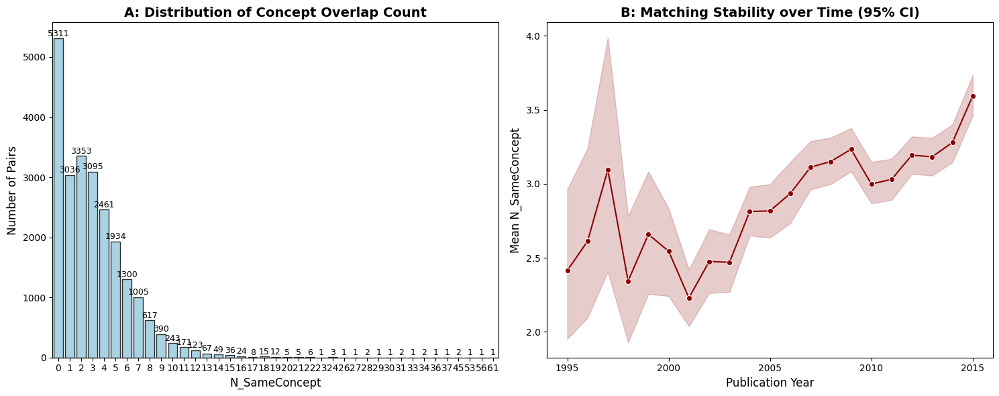

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_concept_statistics(df):
    print("📊 N_SameConcept 核心统计特征报告")
    print("-" * 50)
    
    # 1. 基础描述性统计
    desc = df['N_SameConcept'].describe(percentiles=[.25, .5, .75, .9, .95, .99])
    print(desc)
    
    # 2. 零值与稀疏性分析 (Sparsity Analysis)
    total_pairs = len(df)
    zero_count = (df['N_SameConcept'] == 0).sum()
    print(f"\n💡 零值分析:")
    print(f"完全无重合的配对占比 (Zero Ratio): {zero_count/total_pairs:.22%}")
    print(f"具有至少1个重合概念的比例: {1 - zero_count/total_pairs:.22%}")
    
    # 3. 离群值/极端匹配分析
    top_1_percent = df['N_SameConcept'].quantile(0.99)
    print(f"99% 分位数: {top_1_percent} (超过此数值可能属于极端相似样本)")

    # --- 绘图部分 (Nature/PNAS 风格) ---
    fig, axes = plt.subplots(1, 2, figsize=(15, 6), dpi=100)
    sns.set_style("white")

    # 图 A: 频率分布图 (Count Plot)
    sns.countplot(x='N_SameConcept', data=df, ax=axes[0], color='skyblue', edgecolor='black', alpha=0.8)
    axes[0].set_title('A: Distribution of Concept Overlap Count', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('N_SameConcept', fontsize=12)
    axes[0].set_ylabel('Number of Pairs', fontsize=12)
    # 在柱状图上方标注具体数值
    for p in axes[0].patches:
        axes[0].annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                         ha='center', va='center', fontsize=9, color='black', xytext=(0, 5), textcoords='offset points')

    # 图 B: 随发表年份的变化趋势 (稳定性检验)
    # 验证在 1995-2015 期间，实验组和控制组的“知识邻近度”是否稳定
    if 'PYear' in df.columns:
        sns.lineplot(x='PYear', y='N_SameConcept', data=df, ax=axes[1], marker='o', color='darkred', errorbar=('ci', 95))
        axes[1].set_title('B: Matching Stability over Time (95% CI)', fontsize=14, fontweight='bold')
        axes[1].set_xlabel('Publication Year', fontsize=12)
        axes[1].set_ylabel('Mean N_SameConcept', fontsize=12)
        axes[1].set_xticks(range(int(df['PYear'].min()), int(df['PYear'].max()) + 1, 5))
    
    plt.tight_layout()
    plt.show()

# 执行分析
analyze_concept_statistics(E_C_df_merged)

### 生成面板

In [22]:
import ast
import numpy as np
import pandas as pd
import re
from tqdm import tqdm

# ==========================================
# 1. 读取 SelfRetra_papers.csv (保持原样)
# ==========================================
# 假设文件路径不变
SelfRetra_papers = pd.read_csv("/Data4/yutao_wen/25.11.10/SelfRetra_papers.csv")
selfretra_ids = set(SelfRetra_papers['id'])

# 使用包含 N_SameConcept 的最新 DataFrame
df_sample = E_C_df_merged.copy()
panel_rows = []

def extract_journal_number(val):
    if pd.isna(val):
        return np.nan
    if isinstance(val, (tuple, list)):
        val = val[0]
    val = str(val)
    match = re.search(r'(\d+)', val)
    return int(match.group(1)) if match else np.nan

# =====================================================
# 2. 生成 pair 映射 (保持原样)
# =====================================================
pair_map = {
    (row["id"], row["Cid"]): i
    for i, (_, row) in enumerate(df_sample.iterrows(), start=1)
}

print("🚀 正在将配对数据转化为面板数据并注入 N_SameConcept...")

# 使用 tqdm 显示进度
for _, row in tqdm(df_sample.iterrows(), total=len(df_sample)):

    pair_id = pair_map[(row["id"], row["Cid"])]
    years = list(range(int(row["PYear"]), 2022 + 1))
    shared_journal_id = extract_journal_number(row.get("Journal_id", np.nan))
    
    # --- 关键新增：获取当前 Pair 的重合概念数 ---
    # 无论实验组还是控制组，它们在这个 Pair 里的语义接近度是一样的
    n_same = row.get("N_SameConcept", np.nan)

    # ----------------------------
    # 实验组 (group = 1)
    # ----------------------------
    exp_citations = []
    for col in ["Ecitation_Before", "Ecitation_After"]:
        val = row[col]
        if isinstance(val, str):
            try:
                val = ast.literal_eval(val)
            except:
                val = []
        exp_citations.extend(val)

    if len(exp_citations) < len(years):
        exp_citations.extend([np.nan] * (len(years) - len(exp_citations)))

    for y, c in zip(years, exp_citations):
        treated = 1 if y > row["RYear"] else 0
        panel_rows.append({
            "pair": pair_id,
            "group": 1,
            "paper_id": row["id"],
            "year": y,
            "PYear": row["PYear"],
            "RYear": row["RYear"],
            "yearlycitation": c,
            "log_yearlycitation": np.log1p(c) if pd.notna(c) else np.nan,
            "treated": treated,
            "did": treated * 1,
            "pd": y - row["RYear"],
            "numa": row["NumA"],
            "numr": row["NumR"],
            "journal_id": shared_journal_id,
            "SelfRetra": 1 if row["id"] in selfretra_ids else 0,
            "Num_Retra": row["Num_Retra"],
            # 注入语义相似度变量
            "N_SameConcept": n_same 
        })

    # ----------------------------
    # 对照组 (group = 0)
    # ----------------------------
    ctrl_citations = []
    for col in ["Ccitation_Before", "Ccitation_After"]:
        val = row[col]
        if isinstance(val, str):
            try:
                val = ast.literal_eval(val)
            except:
                val = []
        ctrl_citations.extend(val)

    if len(ctrl_citations) < len(years):
        ctrl_citations.extend([np.nan] * (len(years) - len(ctrl_citations)))

    for y, c in zip(years, ctrl_citations):
        treated = 1 if y > row["RYear"] else 0
        panel_rows.append({
            "pair": pair_id,
            "group": 0,
            "paper_id": row["Cid"],
            "year": y,
            "PYear": row["PYear"],
            "RYear": row["RYear"],
            "yearlycitation": c,
            "log_yearlycitation": np.log1p(c) if pd.notna(c) else np.nan,
            "treated": treated,
            "did": treated * 0,
            "pd": y - row["RYear"],
            "numa": row["NumA"],
            "numr": row["NumR"],
            "journal_id": shared_journal_id,
            "SelfRetra": 1 if row["Cid"] in selfretra_ids else 0,
            "Num_Retra": 0,
            # 对照组也同样注入该 Pair 的语义相似度变量
            "N_SameConcept": n_same 
        })

# ----------------------------
# 3. 生成面板数据 DataFrame 并处理映射
# ----------------------------
panel_df = pd.DataFrame(panel_rows)

paper_id_map = {pid: i for i, pid in enumerate(panel_df["paper_id"].unique(), start=1)}
panel_df["paper_numid"] = panel_df["paper_id"].map(paper_id_map)

print("✅ 面板数据生成完毕！N_SameConcept 已成功引入。")
print(panel_df[['pair', 'group', 'paper_id', 'N_SameConcept']].head(10))

🚀 正在将配对数据转化为面板数据并注入 N_SameConcept...


100%|██████████| 23288/23288 [00:22<00:00, 1042.40it/s]


✅ 面板数据生成完毕！N_SameConcept 已成功引入。
   pair  group        paper_id  N_SameConcept
0     1      1  pub.1000000694              2
1     1      1  pub.1000000694              2
2     1      1  pub.1000000694              2
3     1      1  pub.1000000694              2
4     1      1  pub.1000000694              2
5     1      1  pub.1000000694              2
6     1      1  pub.1000000694              2
7     1      1  pub.1000000694              2
8     1      1  pub.1000000694              2
9     1      1  pub.1000000694              2


In [29]:
panel_df

,pair,group,paper_id,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,...,Num_Retra,N_SameConcept,paper_numid,age,concept_bin,log_author,log_ref,author_year,ref_year,sef_year
0,1,1,pub.1000000694,2006,2006,2010.0,36,3.610918,0,0,...,1,2,1,0,1-2,0.693147,4.499810,13.904532,90.266182,0.0
1,1,1,pub.1000000694,2007,2006,2010.0,46,3.850148,0,0,...,1,2,1,1,1-2,0.693147,4.499810,13.911464,90.311180,0.0
2,1,1,pub.1000000694,2008,2006,2010.0,45,3.828641,0,0,...,1,2,1,2,1-2,0.693147,4.499810,13.918395,90.356178,0.0
3,1,1,pub.1000000694,2009,2006,2010.0,43,3.784190,0,0,...,1,2,1,3,1-2,0.693147,4.499810,13.925327,90.401176,0.0
4,1,1,pub.1000000694,2010,2006,2010.0,43,3.784190,0,0,...,1,2,1,4,1-2,0.693147,4.499810,13.932258,90.446174,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631985,23288,0,pub.1070561906,2018,1995,1996.0,1,0.693147,1,0,...,0,0,46576,23,0,1.098612,1.386294,22.169996,27.975420,0.0
631986,23288,0,pub.1070561906,2019,1995,1996.0,2,1.098612,1,0,...,0,0,46576,24,0,1.098612,1.386294,22.180982,27.989283,0.0
631987,23288,0,pub.1070561906,2020,1995,1996.0,1,0.693147,1,0,...,0,0,46576,25,0,1.098612,1.386294,22.191968,28.003146,0.0
631988,23288,0,pub.1070561906,2021,1995,1996.0,0,0.000000,1,0,...,0,0,46576,26,0,1.098612,1.386294,22.202954,28.017009,0.0


In [30]:
panel_df.to_csv('/Data4/yutao_wen/26.4.21/panel_df_concept.csv', index=False)

## 新Treat生成

In [9]:
import pandas as pd
from tqdm import tqdm

# ==========================================
# Step 1: 提取候选池并保存中间结果
# ==========================================
print("⏳ [1/4] 正在读取 focal paper 数据...")
E_C_df_merged = pd.read_csv("/Data4/yutao_wen/26.4.21/E_C_df_merged_check.csv")

# 提取实验组的核心识别特征
focal_info = E_C_df_merged[['id', 'PYear', 'Journal_id']].copy()
focal_info.rename(columns={'id': 'focal_id'}, inplace=True)

print("⏳ [2/4] 正在读取全量 Papers 数据 (可能需要几分钟)...")
original_file3 = '/data6/Data1/DATA/Dimensions2024/20240101/Papers.csv'
df_papers = pd.read_csv(original_file3, usecols=['id', 'date_normal', 'journal.id'])

# 提取年份并清理空值
df_papers['Year'] = pd.to_datetime(df_papers['date_normal'], errors='coerce').dt.year
df_papers.dropna(subset=['Year', 'journal.id'], inplace=True)
df_papers['Year'] = df_papers['Year'].astype(int)

print("🔍 [3/4] 正在匹配同期刊、同发表年份的候选论文...")
# 内连接：找出所有在同时空发表的论文
candidates_df = pd.merge(
    focal_info,
    df_papers,
    left_on=['Journal_id', 'PYear'],
    right_on=['journal.id', 'Year'],
    how='inner'
)

# 核心过滤：排除 focal paper 自己
candidates_df = candidates_df[candidates_df['focal_id'] != candidates_df['id']]
candidates_df.rename(columns={'id': 'candidate_id'}, inplace=True)

# 保留必要列
candidates_df = candidates_df[['focal_id', 'candidate_id', 'Journal_id', 'PYear']]

print(f"✨ 找到潜在替代论文配对共 {len(candidates_df):,} 对。")

# 落盘保护
output_step1 = "/Data4/yutao_wen/26.4.21/Step1_candidate_pairs.parquet"
candidates_df.to_parquet(output_step1, index=False)
print(f"✅ Step 1 完成，数据已保存至 {output_step1}")

⏳ [1/4] 正在读取 focal paper 数据...
⏳ [2/4] 正在读取全量 Papers 数据 (可能需要几分钟)...
🔍 [3/4] 正在匹配同期刊、同发表年份的候选论文...
✨ 找到潜在替代论文配对共 195,567,414 对。
✅ Step 1 完成，数据已保存至 /Data4/yutao_wen/26.4.21/Step1_candidate_pairs.parquet


In [11]:
import pandas as pd
import duckdb

# ==========================================
# Step 2: 使用 DuckDB 极速提取目标概念 (修正列名版)
# ==========================================
print("⏳ [1/2] 正在加载候选池配对...")
candidates_df = pd.read_parquet("/Data4/yutao_wen/26.4.21/Step1_candidate_pairs.parquet")

# 提取所有需要查询概念的 unique paper ID
unique_papers = pd.concat([candidates_df['focal_id'], candidates_df['candidate_id']]).unique()
unique_df = pd.DataFrame({'paperid': unique_papers})

print(f"🔍 [2/2] 正在从 Parquet 提取 {len(unique_papers):,} 篇论文的概念特征...")
con = duckdb.connect()
con.register('unique_df', unique_df)

# ✅ 修正点：将 clean_concept 改为 concept
query = """
    SELECT c.paperid, c.concept, c.relevance 
    FROM '/Data4/yutao_wen/paper_concept.parquet' AS c
    INNER JOIN unique_df AS u 
    ON c.paperid = u.paperid
"""
concepts_df = con.execute(query).df()

output_step2 = "/Data4/yutao_wen/26.4.21/Step2_filtered_concepts.parquet"
concepts_df.to_parquet(output_step2, index=False)
print(f"✅ Step 2 修正完成，已保存至 {output_step2}")

⏳ [1/2] 正在加载候选池配对...
🔍 [2/2] 正在从 Parquet 提取 14,901,044 篇论文的概念特征...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

✅ Step 2 修正完成，已保存至 /Data4/yutao_wen/26.4.21/Step2_filtered_concepts.parquet


In [12]:
import pandas as pd
import pickle
from tqdm import tqdm
from collections import defaultdict

# ==========================================
# Step 3: 构建概念哈希映射 (适配新列名)
# ==========================================
print("⏳ 正在加载过滤后的概念数据...")
concepts_df = pd.read_parquet("/Data4/yutao_wen/26.4.21/Step2_filtered_concepts.parquet")

print("🧠 正在构建内存级概念映射字典...")
concept_map = defaultdict(dict)

# ✅ 修正点：这里使用 row.concept 而不是 row.clean_concept
for row in tqdm(concepts_df.itertuples(), total=len(concepts_df), desc="字典构建进度"):
    concept_map[row.paperid][row.concept] = row.relevance

output_step3 = "/Data4/yutao_wen/26.4.21/Step3_concept_map.pkl"
with open(output_step3, 'wb') as f:
    pickle.dump(dict(concept_map), f)

print(f"✅ Step 3 修正完成，字典已保存至 {output_step3}")

⏳ 正在加载过滤后的概念数据...
🧠 正在构建内存级概念映射字典...


字典构建进度: 100%|██████████| 716986559/716986559 [15:37<00:00, 764573.33it/s]


✅ Step 3 修正完成，字典已保存至 /Data4/yutao_wen/26.4.21/Step3_concept_map.pkl


In [69]:
import pandas as pd
import pickle
from tqdm import tqdm

# ==========================================
# Step 4: 执行 1 对 N 重合度计算
# ==========================================
print("⏳ 正在加载候选配对与概念映射字典...")
candidates_df = pd.read_parquet("/Data4/yutao_wen/26.4.21/Step1_candidate_pairs.parquet")

with open("/Data4/yutao_wen/26.4.21/Step3_concept_map.pkl", 'rb') as f:
    concept_map = pickle.load(f)

threshold = 0.1
results = []

print("📊 正在执行配对重合度叉乘计算...")
# 开启进度条遍历所有的 candidate pairs
for row in tqdm(candidates_df.itertuples(), total=len(candidates_df), desc="计算 N_SameConcept"):
    f_id = row.focal_id
    c_id = row.candidate_id
    
    e_dict = concept_map.get(f_id, {})
    c_dict = concept_map.get(c_id, {})
    
    # 如果其中一方完全没有 concept 数据，重合度记为 0
    if not e_dict or not c_dict:
        results.append(0)
        continue
    
    # 物理级 set 交集
    common_concepts = set(e_dict.keys()) & set(c_dict.keys())
    
    # 核心逻辑：提取两边最小 relevance，并判断是否达标
    n_same = sum(1 for k in common_concepts if min(e_dict[k], c_dict[k]) >= threshold)
    results.append(n_same)

# 将计算结果合并回原 DataFrame
candidates_df['N_SameConcept'] = results

output_step4 = "/Data4/yutao_wen/26.4.21/Step4_final_substitutes_pool.parquet"
candidates_df.to_parquet(output_step4, index=False)

print(f"✨ 全流程执行完毕！最终替代池数据集已生成: {output_step4}")

# 快速预览一下替代池的重合度分布
print("\n📈 候选替代论文的重合度分布预览：")
print(candidates_df['N_SameConcept'].value_counts().sort_index().head(10))

⏳ 正在加载候选配对与概念映射字典...
📊 正在执行配对重合度叉乘计算...


计算 N_SameConcept: 100%|██████████| 195567414/195567414 [54:57<00:00, 59301.02it/s] 


✨ 全流程执行完毕！最终替代池数据集已生成: /Data4/yutao_wen/26.4.21/Step4_final_substitutes_pool.parquet

📈 候选替代论文的重合度分布预览：
N_SameConcept
0    52213334
1    34425955
2    32836513
3    25967038
4    18279580
5    12018420
6     7575003
7     4661579
8     2829575
9     1721060
Name: count, dtype: int64


In [2]:
import duckdb
import time

# 路径设置
input_parquet = "/Data4/yutao_wen/26.4.21/Step4_final_substitutes_pool.parquet"
exclude_retra_csv = "/Data4/yutao_wen/25.11.10/df_containretra.csv"
focal_control_csv = "/Data4/yutao_wen/26.4.21/E_C_df_merged_check.csv"  # 包含原始 Cid
output_filtered = "/Data4/yutao_wen/26.4.21/Step4_filtered_cleaned.parquet"

print("⏳ 正在启动 DuckDB 执行多重过滤与“控制组排除”统计...")
con = duckdb.connect()
start_time = time.time()

# 1. 建立临时视图
con.execute(f"CREATE VIEW raw_pool AS SELECT * FROM '{input_parquet}'")
# 排除清单 1：参考文献被撤稿的论文
con.execute(f"CREATE VIEW exclude_retra AS SELECT CAST(id AS VARCHAR) as id FROM read_csv_auto('{exclude_retra_csv}')")
# 排除清单 2：原始控制组 Cid
con.execute(f"CREATE VIEW exclude_control AS SELECT DISTINCT CAST(Cid AS VARCHAR) as id FROM read_csv_auto('{focal_control_csv}')")

# 2. 核心统计逻辑：精准计算各环节损耗
print("📊 正在扫描数据以计算损耗分布（含控制组排除项）...")
stats = con.execute(f"""
    SELECT 
        COUNT(*) as total,
        COUNT(CASE WHEN PYear < 1995 OR PYear > 2015 THEN 1 END) as out_of_year,
        COUNT(CASE WHEN focal_id = candidate_id THEN 1 END) as self_match,
        COUNT(CASE WHEN candidate_id IN (SELECT id FROM exclude_retra) THEN 1 END) as contaminated,
        COUNT(CASE WHEN candidate_id IN (SELECT id FROM exclude_control) THEN 1 END) as is_original_control,
        COUNT(DISTINCT focal_id) as raw_focals
    FROM raw_pool
""").fetchone()

total_rows, out_of_year, self_match, contaminated, is_original_control, raw_focals = stats

# 3. 执行最终过滤并写入文件
print(f"💾 正在写入最终清洗文件: {output_filtered}")
query_filter = f"""
    COPY (
        SELECT * FROM raw_pool 
        WHERE PYear >= 1995 AND PYear <= 2015
          AND focal_id != candidate_id
          AND candidate_id NOT IN (SELECT id FROM exclude_retra)
          AND candidate_id NOT IN (SELECT id FROM exclude_control)
    ) TO '{output_filtered}' (FORMAT PARQUET);
"""
con.execute(query_filter)

# 4. 获取最终结果统计
final_stats = con.execute(f"SELECT COUNT(*), COUNT(DISTINCT focal_id) FROM '{output_filtered}'").fetchone()
final_rows, final_focals = final_stats

# 5. 输出详细的清洗与损耗报告
print("\n" + "="*70)
print("🧼 深度数据清洗报告 (含控制组隔离)")
print("-" * 70)
print(f"🔹 原始数据总配对 (Total Pairs):      {total_rows:,}")
print(f"   - 排除：非目标年份 (1995-2015):    -{out_of_year:,}")
print(f"   - 排除：自己匹配自己 (Self-Match):   -{self_match:,}")
print(f"   - 排除：Sub 参考文献受损 (Contam.): -{contaminated:,}")
print(f"   - 排除：原始控制组 (Original Cid):  -{is_original_control:,}")
print(f"✅ 最终留存有效配对 (Valid Pairs):      {final_rows:,}")
print("-" * 70)
print(f"📈 实验组 (Focal Paper) 质量评估:")
print(f"   - 原始 Focal 论文总数:             {raw_focals:,}")
print(f"   - 存活 Focal 论文总数:             {final_focals:,}")
print(f"   - 实验组存活率 (Success Rate):     {(final_focals/raw_focals)*100:.2f}%")
print("="*70)

print(f"✨ 处理完成，耗时: {time.time() - start_time:.2f}s")
con.close()

⏳ 正在启动 DuckDB 执行多重过滤与“控制组排除”统计...
📊 正在扫描数据以计算损耗分布（含控制组排除项）...
💾 正在写入最终清洗文件: /Data4/yutao_wen/26.4.21/Step4_filtered_cleaned.parquet


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))


🧼 深度数据清洗报告 (含控制组隔离)
----------------------------------------------------------------------
🔹 原始数据总配对 (Total Pairs):      195,567,414
   - 排除：非目标年份 (1995-2015):    -123,115,042
   - 排除：自己匹配自己 (Self-Match):   -0
   - 排除：Sub 参考文献受损 (Contam.): -4,867,838
   - 排除：原始控制组 (Original Cid):  -1,108,715
✅ 最终留存有效配对 (Valid Pairs):      70,172,569
----------------------------------------------------------------------
📈 实验组 (Focal Paper) 质量评估:
   - 原始 Focal 论文总数:             45,059
   - 存活 Focal 论文总数:             23,288
   - 实验组存活率 (Success Rate):     51.68%
✨ 处理完成，耗时: 8.77s


### 观测

📊 正在生成重合度分布统计...


/tmp/ipykernel_1167791/146576085.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=probs.index[:15], y=probs.values[:15], palette="viridis")


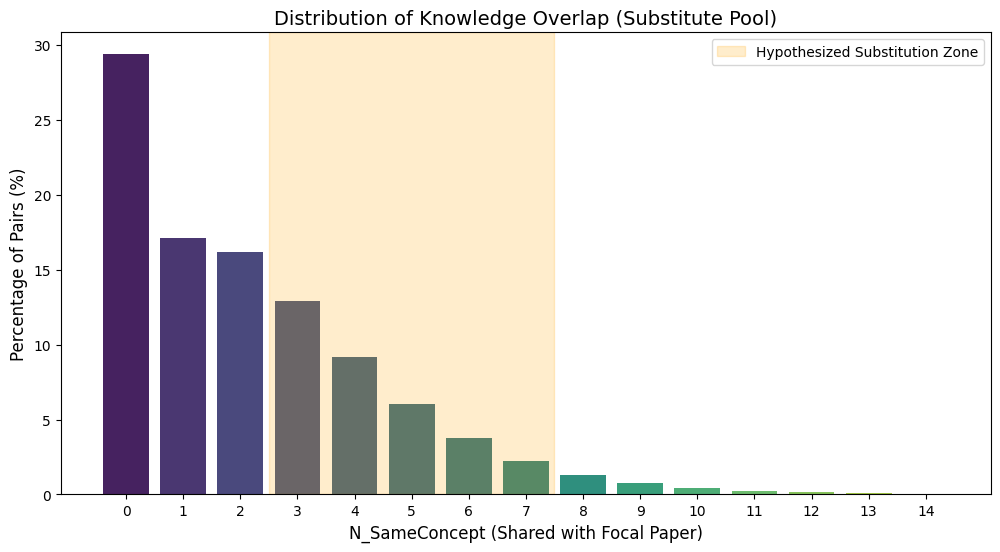

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 建议使用 duckdb 快速统计，或者只读取 n_sameconcept 这一列，节省内存
print("📊 正在生成重合度分布统计...")
df = pd.read_parquet("/Data4/yutao_wen/26.4.21/Step4_filtered_cleaned.parquet", columns=['N_SameConcept'])

# 计算百分比
counts = df['N_SameConcept'].value_counts().sort_index()
probs = (counts / counts.sum()) * 100

plt.figure(figsize=(12, 6))
sns.barplot(x=probs.index[:15], y=probs.values[:15], palette="viridis")
plt.title("Distribution of Knowledge Overlap (Substitute Pool)", fontsize=14)
plt.xlabel("N_SameConcept (Shared with Focal Paper)", fontsize=12)
plt.ylabel("Percentage of Pairs (%)", fontsize=12)

# 在柱状图上标注 3-7 这个“假说高发区”
plt.axvspan(2.5, 7.5, color='orange', alpha=0.2, label='Hypothesized Substitution Zone')
plt.legend()
plt.show()

In [4]:
import duckdb

con = duckdb.connect()

# 1. 先从 1.95 亿行的池子里随机抽取 5 对符合条件的 ID
# 注意：列名修正为 candidate_id 和 N_SameConcept
print("⏳ 正在从替代池中随机抽样 ID...")
sample_ids_query = """
    SELECT focal_id, candidate_id, N_SameConcept
    FROM '/Data4/yutao_wen/26.4.21/Step4_filtered_cleaned.parquet'
    WHERE N_SameConcept BETWEEN 3 AND 7
    USING SAMPLE 5 ROWS;
"""
samples = con.execute(sample_ids_query).df()

# 2. 拿着抽到的少量 ID 去关联 Papers.csv 获取标题
# 这样避免了对全量 CSV 进行大表 Join，速度会提升极多
con.register('samples_table', samples)

print("🔍 正在关联 Papers.csv 获取论文标题...")
final_query = """
    SELECT 
        s.focal_id, p1.title AS focal_title,
        s.candidate_id, p2.title AS substitute_title,
        s.N_SameConcept
    FROM samples_table AS s
    JOIN read_csv_auto('/data6/Data1/DATA/Dimensions2024/20240101/Papers.csv') AS p1 ON s.focal_id = p1.id
    JOIN read_csv_auto('/data6/Data1/DATA/Dimensions2024/20240101/Papers.csv') AS p2 ON s.candidate_id = p2.id
"""

check_samples = con.execute(final_query).df()

print("\n🔍 [人工核查] 观察中度相关论文的题目匹配情况：")
for i, row in check_samples.iterrows():
    print(f"\n📍 配对 {i+1} (N_SameConcept={row['N_SameConcept']})")
    print(f"   [Focal ID]: {row['focal_id']}")
    print(f"   [Focal Title]: {row['focal_title']}")
    print(f"   [Subst ID]: {row['candidate_id']}")
    print(f"   [Subst Title]: {row['substitute_title']}")

⏳ 正在从替代池中随机抽样 ID...
🔍 正在关联 Papers.csv 获取论文标题...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))


🔍 [人工核查] 观察中度相关论文的题目匹配情况：

📍 配对 1 (N_SameConcept=3)
   [Focal ID]: pub.1015147295
   [Focal Title]: Bactericidal Activity of Curcumin I Is Associated with Damaging of Bacterial Membrane
   [Subst ID]: pub.1029089091
   [Subst Title]: A Clinical Algorithm to Identify HIV Patients at High Risk for Incident Active Tuberculosis: A Prospective 5-Year Cohort Study


### #author #reference 筛选

In [73]:
import duckdb
import pandas as pd

# 路径设置
pool_path = "/Data4/yutao_wen/26.4.21/Step4_filtered_cleaned.parquet"
papers_csv = "/data6/Data1/DATA/Dimensions2024/20240101/Papers.csv"
features_output = "/Data4/yutao_wen/26.4.21/Paper_Covariates.parquet"

print("🚀 正在构建轻量级协变量库...")
con = duckdb.connect()

# 1. 扫描池子里所有的 candidate_id 和 focal_id (去重)
con.execute(f"""
    CREATE VIEW all_relevant_ids AS 
    SELECT DISTINCT candidate_id AS id FROM '{pool_path}'
    UNION 
    SELECT DISTINCT focal_id AS id FROM '{pool_path}'
""")

# 2. 从 60GB 原始 CSV 中只提取这部分 ID 的特征
query = f"""
    SELECT 
        id AS paper_id, 
        CAST(num_authors AS INT) AS numa, 
        CAST(num_references AS INT) AS numr
    FROM read_csv_auto('{papers_csv}')
    WHERE id IN (SELECT id FROM all_relevant_ids)
"""

con.execute(f"COPY ({query}) TO '{features_output}' (FORMAT PARQUET)")
print(f"✅ 特征库已就绪: {features_output}")

🚀 正在构建轻量级协变量库...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

✅ 特征库已就绪: /Data4/yutao_wen/26.4.21/Paper_Covariates.parquet


In [7]:
# 2026.05.07 修改版：百分数筛选版本
import duckdb
import time

# ==========================================
# ⚙️ 阈值调整区 (百分比形式)
# ==========================================
A_LIMIT = 0.1  # 作者人数差异在 XX% 以内
R_LIMIT = 0.1  # 参考文献数量差异在 XX% 以内
# ==========================================

start_time = time.time()
con = duckdb.connect()

pool_path = "/Data4/yutao_wen/26.4.21/Step4_filtered_cleaned.parquet"
features_path = "/Data4/yutao_wen/26.4.21/Paper_Covariates.parquet"
filtered_output = "/Data4/yutao_wen/26.4.21/Step5_Filtered_Substitutes.parquet"

print(f"🔍 正在执行协变量筛选: ΔNumA <= {A_LIMIT*100}%, ΔNumR <= {R_LIMIT*100}%...")

# 修改逻辑：ABS(f - c) <= f * LIMIT
# 这样可以确保 Candidate 的值落在 Focal 值的 [1-LIMIT, 1+LIMIT] 区间内
filter_query = f"""
    SELECT 
        s.focal_id, 
        s.candidate_id, 
        s.N_SameConcept,
        f.numa AS f_numa, c.numa AS c_numa,
        f.numr AS f_numr, c.numr AS c_numr
    FROM '{pool_path}' s
    JOIN '{features_path}' f ON s.focal_id = f.paper_id
    JOIN '{features_path}' c ON s.candidate_id = c.paper_id
    WHERE ABS(f.numa - c.numa) <= (f.numa * {A_LIMIT})
      AND ABS(f.numr - c.numr) <= (f.numr * {R_LIMIT})
"""

con.execute(f"COPY ({filter_query}) TO '{filtered_output}' (FORMAT PARQUET)")

# 统计筛选后的结果
new_stats = con.execute(f"SELECT count(*), avg(N_SameConcept) FROM '{filtered_output}'").fetchone()
print(f"✨ 筛选完成！耗时: {time.time()-start_time:.2f}s")
print(f"📈 剩余配对数: {new_stats[0]:,}")
print(f"📊 筛选后平均重合度: {new_stats[1]:.4f}")

🔍 正在执行协变量筛选: ΔNumA <= 10.0%, ΔNumR <= 10.0%...
✨ 筛选完成！耗时: 1.39s
📈 剩余配对数: 1,123,086
📊 筛选后平均重合度: 2.5227


🚀 正在执行协变量筛选 (ΔA <= 10.0%, ΔR <= 10.0%)...
📊 正在提取统计分布...
------------------------------------------------------------
✨ 筛选完成！耗时: 1.37s
📈 最终留存配对数: 1,123,086
📈 最终有效实验组 (Unique Focals): 22,544
------------------------------------------------------------


/tmp/ipykernel_59027/3710981275.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(x='N_SameConcept', y='pair_count', data=plot_data, palette="viridis")


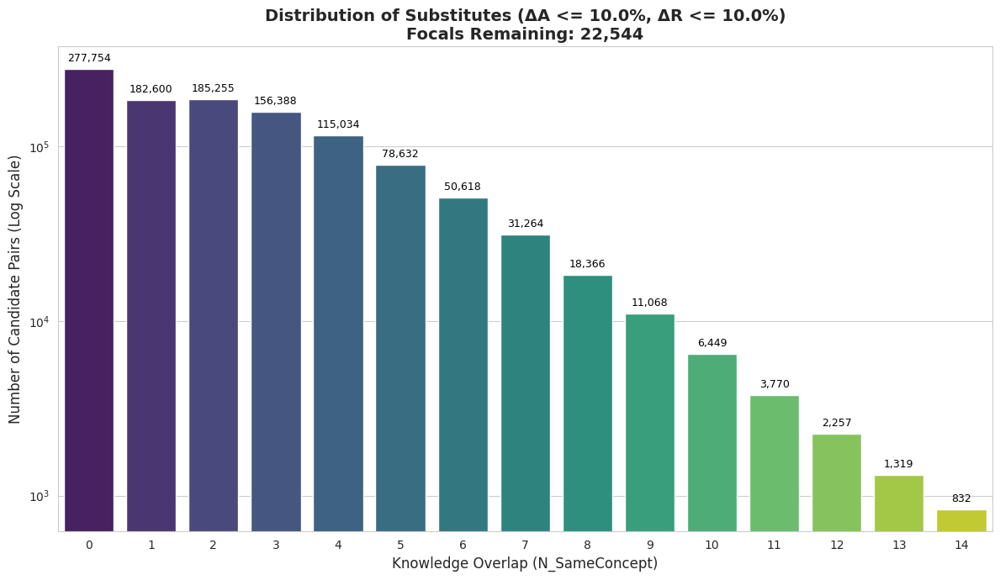

In [8]:
# 2026.05.07 修改版：百分数筛选版本
import duckdb
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time

# ==========================================
# ⚙️ 阈值调整区 (百分比形式，如 0.3 表示 30%)
# ==========================================
A_LIMIT = 0.1   # 作者人数差异比例 (10%)
R_LIMIT = 0.1   # 参考文献数量差异比例 (10%)
# ==========================================

# 路径设置
pool_path = "/Data4/yutao_wen/26.4.21/Step4_filtered_cleaned.parquet"
features_path = "/Data4/yutao_wen/26.4.21/Paper_Covariates.parquet"
filtered_output = "/Data4/yutao_wen/26.4.21/Step5_Filtered_Substitutes.parquet"

start_time = time.time()
con = duckdb.connect()

print(f"🚀 正在执行协变量筛选 (ΔA <= {A_LIMIT*100}%, ΔR <= {R_LIMIT*100}%)...")

# 1. 执行筛选核心逻辑 (修改为百分数逻辑)
filter_query = f"""
    COPY (
        SELECT 
            s.focal_id, 
            s.candidate_id, 
            s.N_SameConcept
        FROM '{pool_path}' s
        JOIN '{features_path}' f ON s.focal_id = f.paper_id
        JOIN '{features_path}' c ON s.candidate_id = c.paper_id
        WHERE ABS(f.numa - c.numa) <= (f.numa * {A_LIMIT})
          AND ABS(f.numr - c.numr) <= (f.numr * {R_LIMIT})
    ) TO '{filtered_output}' (FORMAT PARQUET)
"""
con.execute(filter_query)

# 2. 计算统计指标用于绘图和汇报
print("📊 正在提取统计分布...")
dist_query = f"""
    SELECT 
        N_SameConcept, 
        COUNT(*) as pair_count
    FROM '{filtered_output}'
    GROUP BY N_SameConcept
    ORDER BY N_SameConcept ASC
"""
dist_df = con.execute(dist_query).df()

focal_stats = con.execute(f"SELECT COUNT(DISTINCT focal_id), COUNT(*) FROM '{filtered_output}'").fetchone()
unique_focals, total_pairs = focal_stats

# 3. 输出文字简报
print("-" * 60)
print(f"✨ 筛选完成！耗时: {time.time()-start_time:.2f}s")
print(f"📈 最终留存配对数: {total_pairs:,}")
print(f"📈 最终有效实验组 (Unique Focals): {unique_focals:,}")
print("-" * 60)

# 4. 绘图代码
plt.figure(figsize=(12, 7))
sns.set_style("whitegrid")

# 只展示前 15 个 N_SameConcept 取值
plot_data = dist_df.head(15) 

# 绘制条形图
barplot = sns.barplot(x='N_SameConcept', y='pair_count', data=plot_data, palette="viridis")

# 在柱子上方添加具体的配对数值
for p in barplot.patches:
    barplot.annotate(format(int(p.get_height()), ','), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     xytext = (0, 9), 
                     textcoords = 'offset points',
                     fontsize=9, color='black')

# 设置标题和标签（修改为显示百分比）
plt.title(f"Distribution of Substitutes (ΔA <= {A_LIMIT*100}%, ΔR <= {R_LIMIT*100}%)\nFocals Remaining: {unique_focals:,}", 
          fontsize=14, fontweight='bold')
plt.xlabel("Knowledge Overlap (N_SameConcept)", fontsize=12)
plt.ylabel("Number of Candidate Pairs (Log Scale)", fontsize=12)

# 开启对数坐标
plt.yscale('log') 

plt.tight_layout()
plt.show()

📊 正在计算【筛选后】每个 Focal Paper 对应的 Substitute 数量...

📝 筛选后：Focal-Sub 关联强度统计报告：
count    22544.000000
mean        49.817512
std        118.232644
min          1.000000
25%          7.000000
50%         17.000000
75%         44.000000
90%        105.000000
95%        212.000000
99%        558.570000
max       3412.000000
Name: sub_count, dtype: float64

💡 提示：为了绘图美观，已暂时隐藏了数值大于 212 的极端值 (约占 5% 的数据)。


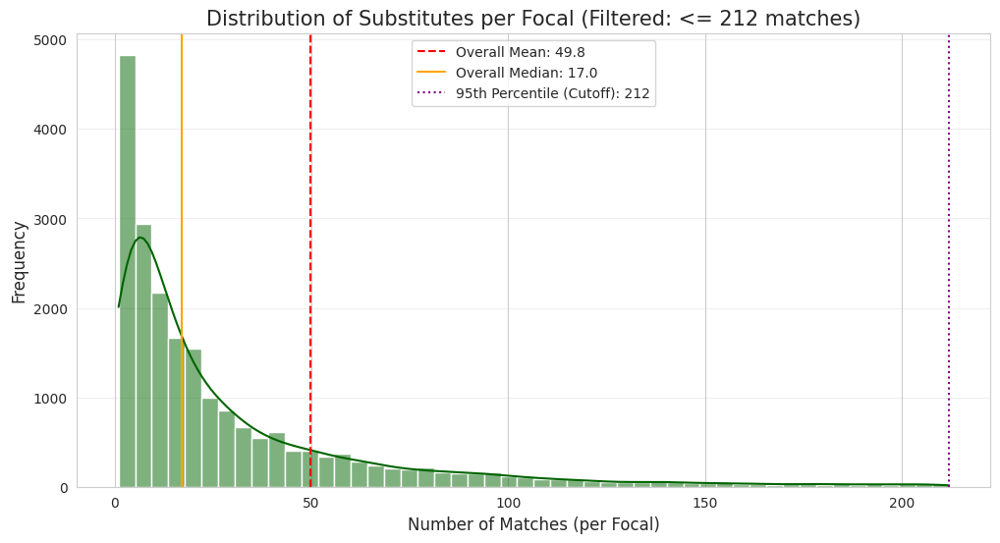

In [10]:
import duckdb
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 连接数据
con = duckdb.connect()
pool_path = "/Data4/yutao_wen/26.4.21/Step5_Filtered_Substitutes.parquet"

print("📊 正在计算【筛选后】每个 Focal Paper 对应的 Substitute 数量...")

# 使用 SQL 进行分组统计
query = f"""
    SELECT focal_id, count(*) as sub_count
    FROM '{pool_path}'
    GROUP BY focal_id
"""
dist_df = con.execute(query).df()

# 2. 计算统计特征并确定截断点
stats = dist_df['sub_count'].describe(percentiles=[.25, .5, .75, .9, .95, .99])
p95_threshold = stats['95%']
print("\n📝 筛选后：Focal-Sub 关联强度统计报告：")
print(stats)

# 3. 剔除极端值进行绘图 (只看 95% 分位数以内的数据)
# 这样可以避免 max=3412 把坐标轴撑得太开导致看不清主体分布
filtered_plot_data = dist_df[dist_df['sub_count'] <= p95_threshold]

# 4. 绘制分布图
plt.figure(figsize=(12, 6))
sns.histplot(filtered_plot_data['sub_count'], kde=True, color='darkgreen', bins=50)

# 在图中标记原始数据的均值和中位数
plt.axvline(stats['mean'], color='red', linestyle='--', label=f"Overall Mean: {stats['mean']:.1f}")
plt.axvline(stats['50%'], color='orange', linestyle='-', label=f"Overall Median: {stats['50%']:.1f}")
plt.axvline(p95_threshold, color='purple', linestyle=':', label=f"95th Percentile (Cutoff): {p95_threshold:.0f}")

plt.title(f"Distribution of Substitutes per Focal (Filtered: <= {p95_threshold:.0f} matches)", fontsize=15)
plt.xlabel("Number of Matches (per Focal)", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.legend()
plt.grid(axis='y', alpha=0.3)

# 打印剔除信息提示
print(f"\n💡 提示：为了绘图美观，已暂时隐藏了数值大于 {p95_threshold:.0f} 的极端值 (约占 5% 的数据)。")
plt.show()

In [11]:
import duckdb
import pandas as pd

# 路径设置
filtered_path = "/Data4/yutao_wen/26.4.21/Step5_Filtered_Substitutes.parquet"
papers_csv = "/data6/Data1/DATA/Dimensions2024/20240101/Papers.csv"

con = duckdb.connect()

print("⏳ 正在定位只有唯一配对的实验组 (Focal Papers with Only 1 Sub)...")

# 1. 找到那些 sub_count 等于 1 的 focal_id
# 2. 随机抽 5 个这样的 focal_id 及其对应的 candidate_id
sample_query = f"""
    WITH SingleMatches AS (
        SELECT focal_id, candidate_id, N_SameConcept
        FROM '{filtered_path}'
        WHERE focal_id IN (
            SELECT focal_id 
            FROM '{filtered_path}' 
            GROUP BY focal_id 
            HAVING COUNT(*) = 1
        )
    )
    SELECT * FROM SingleMatches
    USING SAMPLE 5 ROWS;
"""
samples = con.execute(sample_query).df()

if samples.empty:
    print("❌ 未找到只有唯一配对的样本，请尝试增加抽样范围。")
else:
    # 3. 拿着这几对 ID 去 Papers.csv 捞取详细信息
    con.register('sample_pairs', samples)
    
    verify_query = f"""
        SELECT 
            s.N_SameConcept,
            -- Focal 信息
            p1.id AS f_id, p1.title AS f_title, 
            p1.num_authors AS f_numa, p1.num_references AS f_numr,
            -- Substitute 信息
            p2.id AS s_id, p2.title AS s_title, 
            p2.num_authors AS s_numa, p2.num_references AS s_numr
        FROM sample_pairs s
        JOIN read_csv_auto('{papers_csv}') p1 ON s.focal_id = p1.id
        JOIN read_csv_auto('{papers_csv}') p2 ON s.candidate_id = p2.id
    """
    
    results = con.execute(verify_query).df()

    # 4. 直观展示对比结果
    print("\n" + "="*100)
    print(f"{'TYPE':<10} | {'PAPER_ID':<15} | {'NumA':<5} | {'NumR':<5} | {'TITLE'}")
    print("-" * 100)
    
    for i, row in results.iterrows():
        # 打印 Focal
        print(f"{'FOCAL':<10} | {row['f_id']:<15} | {int(row['f_numa']):<5} | {int(row['f_numr']):<5} | {row['f_title']}")
        # 打印 Substitute
        print(f"{'SUB':<10} | {row['s_id']:<15} | {int(row['s_numa']):<5} | {int(row['s_numr']):<5} | {row['s_title']}")
        print(f"{'MATCH INFO':<10} | N_SameConcept: {row['N_SameConcept']}")
        print("-" * 100)

⏳ 正在定位只有唯一配对的实验组 (Focal Papers with Only 1 Sub)...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))


TYPE       | PAPER_ID        | NumA  | NumR  | TITLE
----------------------------------------------------------------------------------------------------
FOCAL      | pub.1035233063  | 12    | 28    | Colonic CD8 and γδ T-cell infiltration with epithelial damage in children with autism
SUB        | pub.1037626296  | 12    | 28    | Infantile cholestatic jaundice associated with adult-onset type II citrullinemia
MATCH INFO | N_SameConcept: 2
----------------------------------------------------------------------------------------------------
FOCAL      | pub.1033044560  | 2     | 48    | Bone health and antiseizure drugs: diagnosis and management
SUB        | pub.1003016006  | 2     | 44    | Electroconvulsive therapy in the elderly
MATCH INFO | N_SameConcept: 3
----------------------------------------------------------------------------------------------------
FOCAL      | pub.1048795893  | 4     | 47    | Intravenous CDP-choline activates neurons in supraoptic and paraventricular nucl

### 引用数据匹配

In [12]:
import pandas as pd
import duckdb
import json
from tqdm import tqdm
from collections import defaultdict

# 路径设置
step5_path = "/Data4/yutao_wen/26.4.21/Step5_Filtered_Substitutes.parquet"
# 包含 RYear 信息的原始实验组表
retra_info_path = "/Data4/yutao_wen/25.11.10/df_containretra3.csv" 
# 包含 PYear 信息的表（Step4 或原始表）
pool_path = "/Data4/yutao_wen/26.4.21/Step4_filtered_cleaned.parquet" 
output_merged_path = "/Data4/yutao_wen/26.4.21/Step6_Substitutes_Citations_Base.csv"

con = duckdb.connect()

print("⏳ 正在关联 PYear 与 RYear 元数据...")

# 使用 DuckDB 关联，获取每个配对的时间基准
query_meta = f"""
    SELECT 
        s.focal_id, 
        s.candidate_id, 
        s.N_SameConcept,
        p.PYear,
        CAST(r.RYear AS INT) as RYear,
        2023 as Now
    FROM '{step5_path}' s
    JOIN '{pool_path}' p ON s.focal_id = p.focal_id AND s.candidate_id = p.candidate_id
    JOIN (SELECT id, MIN(RYear) as RYear FROM read_csv_auto('{retra_info_path}') GROUP BY id) r 
      ON s.focal_id = r.id
"""
df_base = con.execute(query_meta).df()

# 计算时间跨度
df_base['T_PtoR'] = df_base['RYear'] - df_base['PYear']
df_base['T_RtoN'] = df_base['Now'] - df_base['RYear']

print(f"✅ 元数据整合完成，共有 {len(df_base)} 个配对。")

⏳ 正在关联 PYear 与 RYear 元数据...
✅ 元数据整合完成，共有 1123086 个配对。


In [13]:
def expand_timeline(df, is_before=True):
    expanded_rows = []
    for _, row in tqdm(df.iterrows(), total=len(df), desc="展开年份序列"):
        start = int(row['PYear'])
        end = int(row['RYear'])
        # 如果是事后，区间是 RYear 到 Now
        if not is_before:
            start, end = int(row['RYear']), int(row['Now'])
        
        for y in range(start, end):
            new_row = {
                'id': row['candidate_id'], # 我们的核心观察对象是替代者
                'focal_id': row['focal_id'],
                'Tdiff': y - int(row['RYear']),
                'interval': f"[{y},{y + 1}]",
                'year_val': y
            }
            expanded_rows.append(new_row)
    return pd.DataFrame(expanded_rows)

print("⏳ 正在生成事前事后面板结构...")
df_before = expand_timeline(df_base, is_before=True)
df_after = expand_timeline(df_base, is_before=False)

⏳ 正在生成事前事后面板结构...


展开年份序列: 100%|██████████| 1123086/1123086 [02:19<00:00, 8029.30it/s]


In [14]:
# 加载引文字典
dic2_path = "/Data4/yutao_wen/ALLyear_paper_refs.json"
with open(dic2_path, "r", encoding="utf-8") as f:
    ALLyear_paper_refs = json.load(f)

def match_citations(expanded_df, dict_name="Sub_Cites"):
    # 构造：纯ID -> [(完整键, (lower, upper)), ...]
    paper_intervals = defaultdict(list)
    for _, row in expanded_df.iterrows():
        # 兼容你以前的键格式: ID_Tdiff
        key = f"{row['id']}_{row['Tdiff']}"
        low, upp = row['year_val'], row['year_val'] + 1
        # 去除前缀用于匹配字典
        pure_id = row['id'][4:] if row['id'].startswith('pub.') else row['id']
        paper_intervals[pure_id].append((key, (low, upp)))

    # 初始化结果字典
    citation_counts = {f"{row['id']}_{row['Tdiff']}": 0 for _, row in expanded_df.iterrows()}

    # 遍历全量字典统计
    for citing_paper, refs in tqdm(ALLyear_paper_refs.items(), desc=f"匹配 {dict_name}"):
        try:
            year = float(citing_paper.split('_')[-1])
        except: continue

        for ref in refs:
            ref_id = ref.partition('_')[0]
            if ref_id in paper_intervals:
                for full_key, (low, upp) in paper_intervals[ref_id]:
                    if low <= year <= upp:
                        citation_counts[full_key] += 1
    return citation_counts

# 执行匹配
cite_before = match_citations(df_before, "事前引文")
cite_after = match_citations(df_after, "事后引文")

匹配 事后引文: 100%|██████████| 71184251/71184251 [18:09<00:00, 65357.80it/s] 


In [15]:
import pandas as pd
import duckdb
import json
from tqdm import tqdm
from collections import defaultdict

# ---------------------------------------------------------
# 1. 修正后的展开函数：统一使用 candidate_id
# ---------------------------------------------------------
def expand_timeline(df, is_before=True):
    expanded_rows = []
    # 转换为 dict 迭代比 iterrows 快
    for row in tqdm(df.to_dict('records'), desc="展开年份序列"):
        start = int(row['PYear'])
        end = int(row['RYear'])
        if not is_before:
            start, end = int(row['RYear']), int(row['Now'])
        
        for y in range(start, end):
            expanded_rows.append({
                'candidate_id': row['candidate_id'], # 统一命名
                'focal_id': row['focal_id'],
                'Tdiff': y - int(row['RYear']),
                'year_val': y
            })
    return pd.DataFrame(expanded_rows)

# ---------------------------------------------------------
# 2. 修正后的匹配函数：使用统一的 ID 格式
# ---------------------------------------------------------
def match_citations(expanded_df, all_year_dict):
    # 构造快速查询结构：pure_id -> [(key, year)]
    paper_intervals = defaultdict(list)
    # 使用向量化构建 key 避免 apply
    expanded_df['query_key'] = expanded_df['candidate_id'] + "_" + expanded_df['Tdiff'].astype(str)
    
    for row in expanded_df.itertuples():
        # 处理 pub. 前缀，保持与字典 key 一致
        pure_id = row.candidate_id[4:] if row.candidate_id.startswith('pub.') else row.candidate_id
        paper_intervals[pure_id].append((row.query_key, float(row.year_val)))

    # 初始化结果字典
    counts = {key: 0 for key in expanded_df['query_key']}

    # 遍历引文字典
    for citing_paper, refs in tqdm(all_year_dict.items(), desc="正在匹配引文"):
        try:
            citing_year = float(citing_paper.split('_')[-1])
        except: continue

        for ref in refs:
            ref_id = ref.partition('_')[0]
            if ref_id in paper_intervals:
                for full_key, year in paper_intervals[ref_id]:
                    if year <= citing_year <= year + 1:
                        counts[full_key] += 1
    return counts

# ---------------------------------------------------------
# 3. 修正后的转换函数：确保分组名对齐
# ---------------------------------------------------------
def dict_to_ordered_tuple(df, cite_dict):
    # 使用 map 替代 apply(axis=1)，速度提升百倍
    df['count'] = df['query_key'].map(cite_dict).fillna(0)
    # ✅ 修正点：这里的分组名必须与 df_base 里的 candidate_id 对应
    return df.sort_values('Tdiff').groupby(['focal_id', 'candidate_id'])['count'].apply(tuple)

# =========================================================
# 执行流程
# =========================================================

# 假设 df_base 已经通过 DuckDB 关联好，包含 [focal_id, candidate_id, PYear, RYear, Now]
print("⏳ 正在生成时间面板...")
df_before = expand_timeline(df_base, is_before=True)
df_after = expand_timeline(df_base, is_before=False)

# 匹配引文（使用你加载的 ALLyear_paper_refs）
cite_before = match_citations(df_before, ALLyear_paper_refs)
cite_after = match_citations(df_after, ALLyear_paper_refs)

print("⏳ 正在整合引文元组...")
series_before = dict_to_ordered_tuple(df_before, cite_before)
series_after = dict_to_ordered_tuple(df_after, cite_after)

# ✅ 现在的 series 索引是 [focal_id, candidate_id]，merge 不会报错了
df_final = df_base.merge(series_before.rename('Sub_Cite_Before'), 
                         on=['focal_id', 'candidate_id'], 
                         how='left')

df_final = df_final.merge(series_after.rename('Sub_Cite_After'), 
                         on=['focal_id', 'candidate_id'], 
                         how='left')

# ---------------------------------------------------------
# 最终数据清洗
# ---------------------------------------------------------
print("🧼 正在执行最终数据清洗...")
# 过滤掉 NaN（即完全没匹配上年份的论文）
df_final = df_final.dropna(subset=['Sub_Cite_Before', 'Sub_Cite_After'])

# 过滤掉事前事后引文全为 0 的静默论文（可选，根据你的研究设计决定）
def not_all_zero(row):
    return any(x > 0 for x in row['Sub_Cite_Before']) or any(x > 0 for x in row['Sub_Cite_After'])

df_final = df_final[df_final.apply(not_all_zero, axis=1)].reset_index(drop=True)

print(f"✨ 处理完成！有效样本量: {len(df_final):,}")
df_final.to_csv("/Data4/yutao_wen/26.4.21/Step6_Substitutes_Final_Panel.csv", index=False)

⏳ 正在生成时间面板...


正在匹配引文: 100%|██████████| 71184251/71184251 [12:58<00:00, 91414.43it/s] 


⏳ 正在整合引文元组...
🧼 正在执行最终数据清洗...
✨ 处理完成！有效样本量: 1,035,251


### 数据结构

In [16]:
import pandas as pd
import ast
from tqdm import tqdm

# 1. 路径设置
input_csv = "/Data4/yutao_wen/26.4.21/Step6_Substitutes_Final_Panel.csv"

print("⏳ 正在从磁盘读取数据...")
df_final = pd.read_csv(input_csv)

# 2. 数据转换：将 CSV 中的字符串还原为 Python 元组/列表
# 这是最关键的一步，否则无法进行 sum() 或数学运算
def convert_to_tuple(val):
    if isinstance(val, str):
        try:
            return ast.literal_eval(val)
        except:
            return ()
    return val

print("🛠️ 正在还原引文序列结构 (String -> Tuple)...")
tqdm.pandas(desc="转换事前引文")
df_final['Sub_Cite_Before'] = df_final['Sub_Cite_Before'].progress_apply(convert_to_tuple)

tqdm.pandas(desc="转换事后引文")
df_final['Sub_Cite_After'] = df_final['Sub_Cite_After'].progress_apply(convert_to_tuple)

# 3. 计算汇总统计量用于后续筛选
print("📊 正在计算引文汇总统计...")
df_final['Total_Cite_Before'] = df_final['Sub_Cite_Before'].apply(sum)
df_final['Total_Cite_After'] = df_final['Sub_Cite_After'].apply(sum)
df_final['Annual_Avg_Before'] = df_final['Total_Cite_Before'] / df_final['T_PtoR']

# --- 展示部分 ---
print("\n" + "="*50)
print("📋 最终面板数据 (Step 6) 结构预览：")
print("="*50)
display(df_final.head())

print("\n🔍 核心数值列统计分布：")
stats = df_final[['N_SameConcept', 'T_PtoR', 'Total_Cite_Before', 'Total_Cite_After', 'Annual_Avg_Before']].describe()
display(stats)

⏳ 正在从磁盘读取数据 (13.3万行)...
🛠️ 正在还原引文序列结构 (String -> Tuple)...


转换事后引文: 100%|██████████| 1035251/1035251 [00:30<00:00, 33461.16it/s]


📊 正在计算引文汇总统计...

📋 最终面板数据 (Step 6) 结构预览：


,focal_id,candidate_id,N_SameConcept,PYear,RYear,Now,T_PtoR,T_RtoN,Sub_Cite_Before,Sub_Cite_After,Total_Cite_Before,Total_Cite_After,Annual_Avg_Before
0,pub.1019303310,pub.1051628778,6,2005,2016,2023,11,7,"(12, 24, 33, 42, 24, 15, 21, 24, 24, 30, 37)","(26, 29, 26, 8, 11, 13, 11)",286,124,26.000000
1,pub.1019303310,pub.1027521556,10,2005,2016,2023,11,7,"(64, 87, 100, 90, 91, 102, 79, 64, 82, 83, 67)","(63, 60, 57, 39, 28, 24, 18)",909,289,82.636364
2,pub.1019303310,pub.1040725135,3,2005,2016,2023,11,7,"(12, 27, 33, 33, 30, 24, 18, 21, 24, 18, 13)","(24, 29, 20, 16, 26, 27, 13)",253,155,23.000000
3,pub.1019303310,pub.1043075676,1,2005,2016,2023,11,7,"(41, 64, 65, 53, 57, 45, 29, 32, 27, 14, 12)","(21, 22, 16, 13, 14, 14, 10)",439,110,39.909091
4,pub.1019303310,pub.1029927401,1,2005,2016,2023,11,7,"(40, 47, 59, 61, 50, 53, 67, 61, 40, 46, 55)","(53, 45, 39, 39, 26, 20, 22)",579,244,52.636364



🔍 核心数值列统计分布：


,N_SameConcept,T_PtoR,Total_Cite_Before,Total_Cite_After,Annual_Avg_Before
count,1.035251e+06,1.035251e+06,1.035251e+06,1.035251e+06,1.035251e+06
mean,2.686205e+00,4.979887e+00,9.777991e+01,1.455180e+02,2.065247e+01
std,2.458738e+00,3.596861e+00,1.989521e+02,4.189585e+02,3.787682e+01
min,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.000000e+00,2.000000e+00,1.300000e+01,2.000000e+01,4.000000e+00
50%,2.000000e+00,4.000000e+00,4.200000e+01,6.200000e+01,1.066667e+01
75%,4.000000e+00,7.000000e+00,1.110000e+02,1.590000e+02,2.460000e+01
max,5.700000e+01,2.600000e+01,2.530400e+04,1.288690e+05,6.376000e+03


In [17]:
import pandas as pd
import numpy as np
import ast
import json
from tqdm import tqdm

# ==========================================
# 1. 基础数据加载与还原
# ==========================================
input_csv = "/Data4/yutao_wen/26.4.21/Step6_Substitutes_Final_Panel.csv"
focal_cite_json = "/Data4/yutao_wen/25.11.10/Ecitation_count_BeforeRe.json" # 你之前保存的实验组引文

print("⏳ 正在载入面板数据与实验组引文字典...")
df_final = pd.read_csv(input_csv)

with open(focal_cite_json, "r", encoding="utf-8") as f:
    focal_cite_dict = json.load(f)

# 辅助函数：将字符串还原为元组并计算总和
def restore_and_sum(val):
    if isinstance(val, str):
        try:
            res = ast.literal_eval(val)
            return res
        except: return ()
    return val

print("🛠️ 正在还原替代组引文序列...")
df_final['Sub_Cite_Before'] = df_final['Sub_Cite_Before'].apply(restore_and_sum)

# ==========================================
# 2. 挂载实验组（Focal）引文序列
# ==========================================
print("🔗 正在挂载实验组 (Focal) 事前引文序列...")
# 逻辑：我们将字典里的 ID_Tdiff 重新聚合成按 ID 分组的元组，匹配 df_final
focal_seq_map = {}
# 这里的处理逻辑需要与你生成 Sub_Cite 时保持一致：按 Tdiff 排序
# 临时处理字典数据
temp_list = []
for k, v in focal_cite_dict.items():
    fid, tdiff = k.rsplit('_', 1)
    temp_list.append({'focal_id': fid, 'Tdiff': int(tdiff), 'cite': v})

focal_seq_df = pd.DataFrame(temp_list).sort_values(['focal_id', 'Tdiff'])
focal_seq_map = focal_seq_df.groupby('focal_id')['cite'].apply(tuple).to_dict()

# 将实验组序列映射到大表
df_final['Focal_Cite_Before'] = df_final['focal_id'].map(focal_seq_map)

# 改名以适配你的 DOM 函数逻辑
df_final = df_final.rename(columns={
    'Focal_Cite_Before': 'Ecitation_Before',
    'Sub_Cite_Before': 'Ccitation_Before'
})

# ==========================================
# 3. 执行 DOM 筛选函数
# ==========================================
def filter_citations_dom(df, threshold=0.4):
    """
    DOM 匹配筛选逻辑：计算 Log(x+1) 后的均方误差 (MSE)
    """
    def calculate_log_distance(row):
        e_hist = row['Ecitation_Before']
        c_hist = row['Ccitation_Before']
        
        if not isinstance(e_hist, (list, tuple)) or not isinstance(c_hist, (list, tuple)):
            return np.inf
        
        # 截取最后 5 年的数据（模仿 PNAS 逻辑，捕捉撤稿前的最新趋势）
        e_arr = np.array(e_hist[-5:])
        c_arr = np.array(c_hist[-5:])
        
        # 对齐长度
        min_len = min(len(e_arr), len(c_arr))
        if min_len == 0: return np.inf
            
        e_comp = e_arr[-min_len:]
        c_comp = c_arr[-min_len:]
        
        # 计算对数距离 $Log(x+1)$
        e_log = np.log1p(e_comp)
        c_log = np.log1p(c_comp)
        
        # 计算均方差 (MSE)
        distance = np.mean((e_log - c_log) ** 2)
        return distance

    df_out = df.copy()
    print(f"📊 正在计算每一对样本的 Log Distance (样本量: {len(df_out):,})...")
    
    tqdm.pandas(desc="计算距离")
    df_out['log_citation_distance'] = df_out.progress_apply(calculate_log_distance, axis=1)
    
    # 筛选
    filtered_df = df_out[
        (df_out['log_citation_distance'] <= threshold) & 
        (df_out['log_citation_distance'] != np.inf)
    ].copy()
    
    return filtered_df

# 设定阈值并运行
THRESHOLD = 0.4 
df_matched = filter_citations_dom(df_final, threshold=THRESHOLD)

# ==========================================
# 4. 结果汇报与保存
# ==========================================
print("\n" + "="*50)
print("✅ DOM 筛选任务完成报告")
print("-" * 50)
print(f"🔹 原始待筛选配对数: {len(df_final):,}")
print(f"🔹 筛选后存活配对数: {len(df_matched):,}")
print(f"🔹 存活率:          {(len(df_matched)/len(df_final))*100:.2f}%")
print(f"🔹 筛选阈值 (MSE):   {THRESHOLD}")
print("="*50)

# 保存最终用于回归的匹配文件
final_output_path = "/Data4/yutao_wen/26.4.21/Step7_Final_Matched_Substitutes.csv"
df_matched.to_csv(final_output_path, index=False)
print(f"💾 最终匹配数据集已存至: {final_output_path}")

# 预览效果
display(df_matched[['focal_id', 'candidate_id', 'N_SameConcept', 'log_citation_distance']].head(10))

⏳ 正在载入面板数据与实验组引文字典...
🛠️ 正在还原替代组引文序列...
🔗 正在挂载实验组 (Focal) 事前引文序列...
📊 正在计算每一对样本的 Log Distance (样本量: 1,035,251)...


计算距离: 100%|██████████| 1035251/1035251 [00:52<00:00, 19905.02it/s]



✅ DOM 筛选任务完成报告
--------------------------------------------------
🔹 原始待筛选配对数: 1,035,251
🔹 筛选后存活配对数: 291,481
🔹 存活率:          28.16%
🔹 筛选阈值 (MSE):   0.4
💾 最终匹配数据集已存至: /Data4/yutao_wen/26.4.21/Step7_Final_Matched_Substitutes.csv


,focal_id,candidate_id,N_SameConcept,log_citation_distance
6,pub.1019303310,pub.1003955403,4,0.333661
10,pub.1019303310,pub.1006171554,2,0.324211
23,pub.1019303310,pub.1027313182,3,0.225447
32,pub.1019303310,pub.1000274580,1,0.358760
48,pub.1019303310,pub.1040572100,4,0.171837
91,pub.1019303310,pub.1004112489,8,0.391267
92,pub.1019303310,pub.1008757834,3,0.308440
106,pub.1019303310,pub.1040460124,2,0.191346
115,pub.1019303310,pub.1004228426,2,0.294266
121,pub.1019303310,pub.1001082666,4,0.085854



📊 DOM 筛选后：实验组与控制组关联特征
--------------------------------------------------
🔹 存活的实验组总数 (Unique Focals): 20,411
🔹 筛选后的总配对数 (Total Pairs):    291,481
🔹 平均每篇 Focal 对应的控制组数量:    14.28
🔹 控制组数量中位数 (Median):          6
🔹 最大控制组密度 (Max Subs per Focal): 412

📝 详细分布分位数：
min      1.0
25%      3.0
50%      6.0
75%     15.0
90%     32.0
95%     52.0
max    412.0
Name: sub_count, dtype: float64


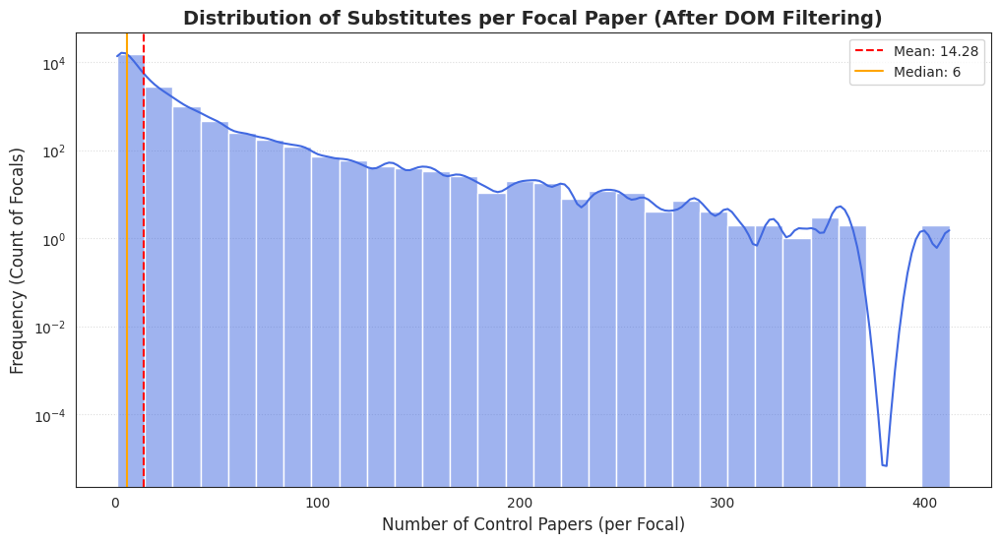

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 统计每个 Focal 对应的有效控制组数量
# 注意：此时 df_matched 已经是筛选后的 行
focal_counts = df_matched.groupby('focal_id').size().reset_index(name='sub_count')

# 2. 计算描述性统计特征
stats = focal_counts['sub_count'].describe(percentiles=[.25, .5, .75, .9, .95])

print("\n" + "="*50)
print("📊 DOM 筛选后：实验组与控制组关联特征")
print("-" * 50)
print(f"🔹 存活的实验组总数 (Unique Focals): {len(focal_counts):,}")
print(f"🔹 筛选后的总配对数 (Total Pairs):    {len(df_matched):,}")
print(f"🔹 平均每篇 Focal 对应的控制组数量:    {stats['mean']:.2f}")
print(f"🔹 控制组数量中位数 (Median):          {stats['50%']:.0f}")
print(f"🔹 最大控制组密度 (Max Subs per Focal): {stats['max']:.0f}")
print("="*50)

# 打印详细分位数
print("\n📝 详细分布分位数：")
print(stats[['min', '25%', '50%', '75%', '90%', '95%', 'max']])

# 3. 绘制分布图
plt.figure(figsize=(12, 6))
sns.set_style("white")

# 绘制直方图，观察 1 对 N 的密度
sns.histplot(focal_counts['sub_count'], kde=True, color='royalblue', bins=30)

# 标注均值和中位数
plt.axvline(stats['mean'], color='red', linestyle='--', label=f"Mean: {stats['mean']:.2f}")
plt.axvline(stats['50%'], color='orange', linestyle='-', label=f"Median: {stats['50%']:.0f}")

plt.title("Distribution of Substitutes per Focal Paper (After DOM Filtering)", fontsize=14, fontweight='bold')
plt.xlabel("Number of Control Papers (per Focal)", fontsize=12)
plt.ylabel("Frequency (Count of Focals)", fontsize=12)
plt.legend()
plt.yscale('log') # 建议开启对数轴，因为大多数 Focal 可能只有 1-5 个匹配，而极少数仍有几百个
plt.grid(axis='y', linestyle=':', alpha=0.7)

plt.show()


📊 筛选后：实验组与控制组关联强度报告
--------------------------------------------------
🔹 存活的实验组总数 (Unique Focals): 20,411
🔹 最终总配对数 (Total Pairs):     291,481
🔹 平均每篇 Focal 匹配数量:         14.28
🔹 匹配数量中位数 (Median):          6
🔹 P95 分位数 (95% 的文章匹配数 <=):  52
🔹 最大匹配密度 (Max):              412
💡 绘图提示：已自动剔除前 5% 的极端值 (匹配数 > 52) 以优化显示效果。


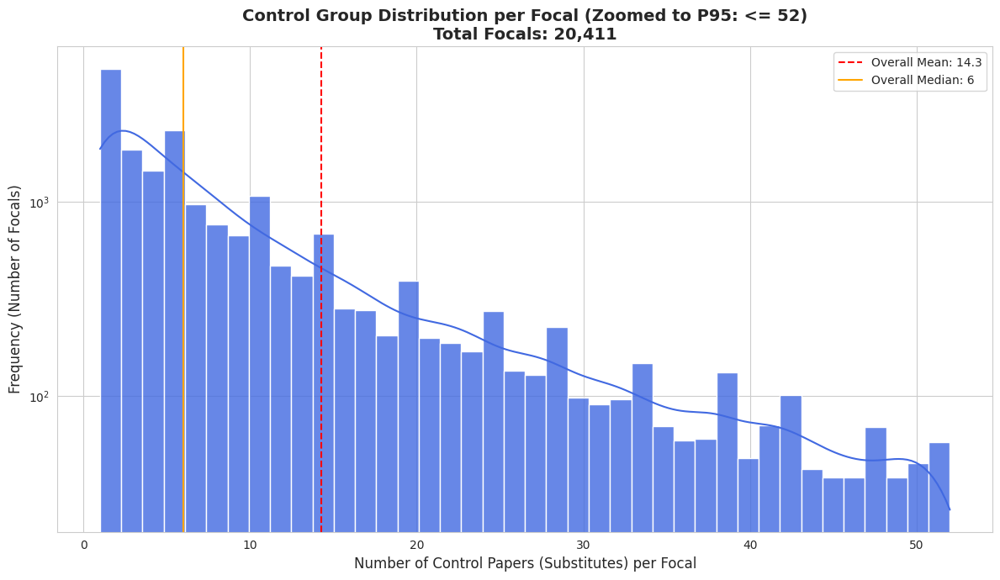

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 统计每个 Focal 对应的有效控制组数量
# 假设 df_matched 是你从 DuckDB 加载出来的结果 DataFrame
focal_counts = df_matched.groupby('focal_id').size().reset_index(name='sub_count')

# 2. 计算描述性统计特征 (增加 P99 观察长尾)
stats = focal_counts['sub_count'].describe(percentiles=[.25, .5, .75, .9, .95, .99])

print("\n" + "="*50)
print("📊 筛选后：实验组与控制组关联强度报告")
print("-" * 50)
print(f"🔹 存活的实验组总数 (Unique Focals): {len(focal_counts):,}")
print(f"🔹 最终总配对数 (Total Pairs):     {len(df_matched):,}")
print(f"🔹 平均每篇 Focal 匹配数量:         {stats['mean']:.2f}")
print(f"🔹 匹配数量中位数 (Median):          {stats['50%']:.0f}")
print(f"🔹 P95 分位数 (95% 的文章匹配数 <=):  {stats['95%']:.0f}")
print(f"🔹 最大匹配密度 (Max):              {stats['max']:.0f}")
print("="*50)

# 3. 自动设定截断点 (用于绘图美化)
# 我们只绘制 95% 分位数以内的数据，防止 3412 这种极端值拉长坐标轴
cutoff = stats['95%']
plot_data = focal_counts[focal_counts['sub_count'] <= cutoff]

# 4. 绘制分布图
plt.figure(figsize=(12, 7))
sns.set_style("whitegrid")

# 绘制直方图
sns.histplot(plot_data['sub_count'], kde=True, color='royalblue', bins=40, alpha=0.8)

# 标注原始数据的全局统计线
plt.axvline(stats['mean'], color='red', linestyle='--', linewidth=1.5, 
            label=f"Overall Mean: {stats['mean']:.1f}")
plt.axvline(stats['50%'], color='orange', linestyle='-', linewidth=1.5, 
            label=f"Overall Median: {stats['50%']:.0f}")

# 设置标题和标签
plt.title(f"Control Group Distribution per Focal (Zoomed to P95: <= {cutoff:.0f})\nTotal Focals: {len(focal_counts):,}", 
          fontsize=14, fontweight='bold')
plt.xlabel("Number of Control Papers (Substitutes) per Focal", fontsize=12)
plt.ylabel("Frequency (Number of Focals)", fontsize=12)

# 建议在数据分布极不均匀时开启对数轴
plt.yscale('log') 

plt.legend()
plt.tight_layout()

# 提示信息
print(f"💡 绘图提示：已自动剔除前 5% 的极端值 (匹配数 > {cutoff:.0f}) 以优化显示效果。")
plt.show()

### 展开面板

In [20]:
import ast
import numpy as np
import pandas as pd
import re
from tqdm import tqdm

# =====================================================
# Step 0: 读取并缝合数据
# =====================================================
print("⏳ 正在读取基础数据...")

# 1. 读取 DOM 筛选后的新实验组
df_matched = pd.read_csv("/Data4/yutao_wen/26.4.21/Step7_Final_Matched_Substitutes.csv")

# 2. 读取 Old Control 原始数据
E_C_df_merged = pd.read_csv("/Data4/yutao_wen/26.4.21/E_C_df_merged_check.csv")

# 3. 读取自撤稿名单
try:
    SelfRetra_papers = pd.read_csv("/Data4/yutao_wen/25.11.10/SelfRetra_papers.csv")
    selfretra_ids = set(SelfRetra_papers['id'])
except:
    selfretra_ids = set()

# --- 关键修正：使用重命名后的列名 ---
# 在 df_matched 中，之前的 Sub_Cite_Before 已经被改名为 Ccitation_Before
# 而 Sub_Cite_After 应该还保留着原名（或者也检查一下）
cols_in_matched = ['focal_id', 'candidate_id', 'N_SameConcept', 'Ccitation_Before', 'Sub_Cite_After']
df_matched_core = df_matched[cols_in_matched].copy()

# 4. 准备旧控制组数据
cols_to_keep = ['id', 'Cid', 'Ccitation_Before', 'Ccitation_After', 'Journal_id', 'NumA', 'NumR', 'PYear', 'RYear']
old_control_sub = E_C_df_merged[cols_to_keep].rename(columns={'id': 'focal_id'})

print("🔗 正在缝合 New Treat 与 Old Control...")
# 合并后：
# Ccitation_Before_x -> 来自 Candidate (New Treat)
# Ccitation_Before_y -> 来自 Cid (Old Control)
df_sample = df_matched_core.merge(old_control_sub, on='focal_id', how='inner')
print(f"✅ 数据缝合完成！当前待展开 Pair 数: {len(df_sample):,}")

# =====================================================
# Step 1: 辅助函数
# =====================================================
def extract_journal_number(val):
    if pd.isna(val): return np.nan
    val = str(val)
    match = re.search(r'(\d+)', val)
    return int(match.group(1)) if match else np.nan

def parse_citations(val):
    if pd.isna(val) or val == '[]' or val == '': return []
    if isinstance(val, str):
        try: return list(ast.literal_eval(val))
        except: return []
    return list(val) if isinstance(val, (tuple, list)) else []

# =====================================================
# Step 2: 面板数据展开
# =====================================================
panel_rows = []
records = df_sample.to_dict('records')

print("⏳ 正在展开面板数据...")
for i, row in enumerate(tqdm(records)):
    pair_id = i + 1 
    ryear = int(row["RYear"])
    pyear = int(row["PYear"])
    # 统一时间线到 2023
    years = list(range(pyear, 2023 + 1))
    shared_journal_id = extract_journal_number(row.get("Journal_id", np.nan))
    n_concept = row["N_SameConcept"]

    # ----------------------------
    # 组别 1: New Treat (Candidate)
    # ----------------------------
    # 引文来源：_x 后缀代表来自 df_matched 的 Candidate 数据
    exp_citations = parse_citations(row["Ccitation_Before_x"]) + parse_citations(row["Sub_Cite_After"])
    
    if len(exp_citations) < len(years):
        exp_citations.extend([np.nan] * (len(years) - len(exp_citations)))

    for y, c in zip(years, exp_citations):
        treated = 1 if y > ryear else 0
        panel_rows.append({
            "pair": pair_id,
            "group": 1,
            "paper_id": row["candidate_id"],
            "focal_id": row["focal_id"],
            "N_SameConcept": n_concept,
            "year": y,
            "PYear": pyear,
            "RYear": ryear,
            "yearlycitation": c,
            "log_yearlycitation": np.log1p(c) if pd.notna(c) else np.nan,
            "treated": treated,
            "did": treated * 1,
            "pd": y - ryear,
            "numa": row["NumA"],
            "numr": row["NumR"],
            "journal_id": shared_journal_id,
            "SelfRetra": 1 if row["candidate_id"] in selfretra_ids else 0
        })

    # ----------------------------
    # 组别 0: Old Control (Cid)
    # ----------------------------
    # 引文来源：_y 后缀代表来自 E_C_df_merged 的旧控制组数据
    ctrl_citations = parse_citations(row["Ccitation_Before_y"]) + parse_citations(row["Ccitation_After"])

    if len(ctrl_citations) < len(years):
        ctrl_citations.extend([np.nan] * (len(years) - len(ctrl_citations)))

    for y, c in zip(years, ctrl_citations):
        treated = 1 if y > ryear else 0
        panel_rows.append({
            "pair": pair_id,
            "group": 0,
            "paper_id": row["Cid"],
            "focal_id": row["focal_id"],
            "N_SameConcept": n_concept,
            "year": y,
            "PYear": pyear,
            "RYear": ryear,
            "yearlycitation": c,
            "log_yearlycitation": np.log1p(c) if pd.notna(c) else np.nan,
            "treated": treated,
            "did": 0,
            "pd": y - ryear,
            "numa": row["NumA"],
            "numr": row["NumR"],
            "journal_id": shared_journal_id,
            "SelfRetra": 1 if row["Cid"] in selfretra_ids else 0
        })

# =====================================================
# Step 3: 映射 ID 并保存
# =====================================================
print("⏳ 正在生成数值 ID 并导出...")
panel_df = pd.DataFrame(panel_rows)
paper_id_map = {pid: i for i, pid in enumerate(panel_df["paper_id"].unique(), start=1)}
panel_df["paper_numid"] = panel_df["paper_id"].map(paper_id_map)

output_path = "/Data4/yutao_wen/26.4.21/NewTreat_vs_OldControl_Panel.csv"
panel_df.to_csv(output_path, index=False)
print(f"💾 任务圆满完成！文件已存至: {output_path}")

⏳ 正在读取基础数据...
🔗 正在缝合 New Treat 与 Old Control...
✅ 数据缝合完成！当前待展开 Pair 数: 291,481
⏳ 正在展开面板数据...


100%|██████████| 291481/291481 [01:20<00:00, 3626.50it/s]


⏳ 正在生成数值 ID 并导出...
💾 任务圆满完成！文件已存至: /Data4/yutao_wen/26.4.21/NewTreat_vs_OldControl_Panel.csv


In [21]:
import pandas as pd
import numpy as np

# 1. 读取生成的面板数据
file_path = "/Data4/yutao_wen/26.4.21/NewTreat_vs_OldControl_Panel.csv"
df = pd.read_csv(file_path)

# ==========================================
# 📊 第一部分：基础结构预览
# ==========================================
print("## 1. 基础结构预览 (Head & Info)")
print("-" * 50)
display(df.head(10))
print("\n数据列类型与缺失值统计：")
df.info()

# ==========================================
# 🔍 第二部分：实证核心变量逻辑校验
# ==========================================
print("\n## 2. 核心变量逻辑校验")
print("-" * 50)

# 校验 1: Group 分布
group_dist = df.groupby('group')['paper_id'].nunique()
print(f"🔹 独立论文数分布: \n   New Treat (Group 1): {group_dist.get(1, 0):,} 篇\n   Old Control (Group 0): {group_dist.get(0, 0):,} 篇")

# 校验 2: DID 变量逻辑 (Treated * Group)
# 在 group=0 的行里，did 必须永远为 0
did_check_ctrl = df[df['group'] == 0]['did'].unique()
# 在 group=1 的行里，did 在 RYear 之后必须为 1
did_check_treat_post = df[(df['group'] == 1) & (df['year'] > df['RYear'])]['did'].unique()

print(f"🔹 DID 逻辑校验:")
print(f"   - 控制组 (Group 0) 的 DID 是否全为 0: {'✅ 是' if list(did_check_ctrl) == [0] else '❌ 否'}")
print(f"   - 实验组 (Group 1) 撤稿后 DID 是否全为 1: {'✅ 是' if list(did_check_treat_post) == [1] else '❌ 否'}")

# ==========================================
# 📈 第三部分：面板平衡性与分组特征
# ==========================================
print("\n## 3. 面板平衡性与 N_SameConcept 特征")
print("-" * 50)

# 统计每个 Pair 的平均观测年份数
avg_years = df.groupby(['pair', 'group']).size().mean()
print(f"🔹 平均每篇论文的年度观测数: {avg_years:.2f} 年")

# 统计 N_SameConcept 的分布 (这是你后续分组回归的关键)
concept_dist = df.drop_duplicates(subset=['pair'])['N_SameConcept'].value_counts().sort_index()
print("\n🔹 N_SameConcept (知识重合度) 的 Pair 分布：")
print(concept_dist.head(10)) # 展示前10个取值

# ==========================================
# 📉 第四部分：描述性统计
# ==========================================
print("\n## 4. 描述性统计 (用于 Stata sum 预览)")
print("-" * 50)
desc_cols = ['yearlycitation', 'log_yearlycitation', 'N_SameConcept', 'PYear', 'RYear', 'numa', 'numr']
display(df[desc_cols].describe())

## 1. 基础结构预览 (Head & Info)
--------------------------------------------------


,pair,group,paper_id,focal_id,N_SameConcept,year,PYear,RYear,yearlycitation,log_yearlycitation,treated,did,pd,numa,numr,journal_id,SelfRetra,paper_numid
0,1,1,pub.1003955403,pub.1019303310,4,2005,2005,2016,9.0,2.302585,0,0,-11,6,52,1077138,0,1
1,1,1,pub.1003955403,pub.1019303310,4,2006,2005,2016,9.0,2.302585,0,0,-10,6,52,1077138,0,1
2,1,1,pub.1003955403,pub.1019303310,4,2007,2005,2016,12.0,2.564949,0,0,-9,6,52,1077138,0,1
3,1,1,pub.1003955403,pub.1019303310,4,2008,2005,2016,18.0,2.944439,0,0,-8,6,52,1077138,0,1
4,1,1,pub.1003955403,pub.1019303310,4,2009,2005,2016,18.0,2.944439,0,0,-7,6,52,1077138,0,1
5,1,1,pub.1003955403,pub.1019303310,4,2010,2005,2016,18.0,2.944439,0,0,-6,6,52,1077138,0,1
6,1,1,pub.1003955403,pub.1019303310,4,2011,2005,2016,9.0,2.302585,0,0,-5,6,52,1077138,0,1
7,1,1,pub.1003955403,pub.1019303310,4,2012,2005,2016,3.0,1.386294,0,0,-4,6,52,1077138,0,1
8,1,1,pub.1003955403,pub.1019303310,4,2013,2005,2016,3.0,1.386294,0,0,-3,6,52,1077138,0,1
9,1,1,pub.1003955403,pub.1019303310,4,2014,2005,2016,3.0,1.386294,0,0,-2,6,52,1077138,0,1



数据列类型与缺失值统计：
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8077070 entries, 0 to 8077069
Data columns (total 18 columns):
 #   Column              Dtype  
---  ------              -----  
 0   pair                int64  
 1   group               int64  
 2   paper_id            object 
 3   focal_id            object 
 4   N_SameConcept       int64  
 5   year                int64  
 6   PYear               int64  
 7   RYear               int64  
 8   yearlycitation      float64
 9   log_yearlycitation  float64
 10  treated             int64  
 11  did                 int64  
 12  pd                  int64  
 13  numa                int64  
 14  numr                int64  
 15  journal_id          int64  
 16  SelfRetra           int64  
 17  paper_numid         int64  
dtypes: float64(2), int64(14), object(2)
memory usage: 1.1+ GB

## 2. 核心变量逻辑校验
--------------------------------------------------
🔹 独立论文数分布: 
   New Treat (Group 1): 247,428 篇
   Old Control (Group 0): 20,411 篇
🔹 

,yearlycitation,log_yearlycitation,N_SameConcept,PYear,RYear,numa,numr
count,7.494108e+06,7.494108e+06,8.077070e+06,8.077070e+06,8.077070e+06,8.077070e+06,8.077070e+06
mean,9.584412e+00,1.834371e+00,2.612890e+00,2.008615e+03,2.013719e+03,5.205196e+00,3.913286e+01
std,1.369058e+01,1.072816e+00,2.523467e+00,5.120932e+00,5.465070e+00,2.863173e+00,1.674664e+01
min,0.000000e+00,0.000000e+00,0.000000e+00,1.995000e+03,1.996000e+03,1.000000e+00,1.000000e+00
25%,2.000000e+00,1.098612e+00,1.000000e+00,2.005000e+03,2.011000e+03,3.000000e+00,2.900000e+01
50%,6.000000e+00,1.945910e+00,2.000000e+00,2.010000e+03,2.015000e+03,5.000000e+00,3.900000e+01
75%,1.300000e+01,2.639057e+00,4.000000e+00,2.013000e+03,2.018000e+03,7.000000e+00,4.900000e+01
max,4.694000e+03,8.454253e+00,5.000000e+01,2.015000e+03,2.022000e+03,2.700000e+01,2.700000e+02


In [22]:
import pandas as pd
import numpy as np

# 1. 载入数据
file_path = "/Data4/yutao_wen/26.4.21/NewTreat_vs_OldControl_Panel.csv"
print("⏳ 正在载入面板数据...")
df = pd.read_csv(file_path)

# ---------------------------------------------------------
# ✅ 规范化 1：处理引文缺失值 (Impute Missing Citations)
# ---------------------------------------------------------
# 将字典匹配不到的年份（NaN）填充为 0，并重新计算对数项
print("🛠️ 正在修复引文缺失值 (NaN -> 0)...")
df['yearlycitation'] = df['yearlycitation'].fillna(0).astype(int)
df['log_yearlycitation'] = np.log1p(df['yearlycitation'])

# ---------------------------------------------------------
# ✅ 规范化 3：生成交互项 (Moderation Terms)
# ---------------------------------------------------------
# 为 Stata 的连续调节效应分析提前准备好交乘项
df['did_x_N'] = df['did'] * df['N_SameConcept']

# ---------------------------------------------------------
# ✅ 规范化 4：强制类型转换 (Data Type Enforcement)
# ---------------------------------------------------------
# 确保 ID 和虚拟变量在 Stata 中不被识别为浮点数，节省内存并防止匹配错误
int_cols = [
    'pair', 'group', 'year', 'PYear', 'RYear', 'treated', 
    'did', 'pd', 'numa', 'numr', 'journal_id', 
    'SelfRetra', 'paper_numid', 
]
print("🛠️ 正在优化字段数据类型...")
for col in int_cols:
    df[col] = df[col].astype(int)


# ---------------------------------------------------------
# 💾 保存最终版数据
# ---------------------------------------------------------
output_path = "/Data4/yutao_wen/26.4.21/Final_Panel_for_Stata.csv"
df.to_csv(output_path, index=False)

print("\n" + "="*50)
print("✅ 数据规范化任务圆满完成！")
print("-" * 50)
print(f"🔹 最终观测值总数: {len(df):,}")
print(f"🔹 缺失值清理结果: {df['yearlycitation'].isna().sum()} (应为0)")
print(f"🔹 存储路径: {output_path}")
print("="*50)

⏳ 正在载入面板数据...
🛠️ 正在修复引文缺失值 (NaN -> 0)...
🛠️ 正在优化字段数据类型...

✅ 数据规范化任务圆满完成！
--------------------------------------------------
🔹 最终观测值总数: 8,077,070
🔹 缺失值清理结果: 0 (应为0)
🔹 存储路径: /Data4/yutao_wen/26.4.21/Final_Panel_for_Stata.csv


### Jaccard补丁

In [23]:
import pandas as pd
import pickle
from tqdm import tqdm

# 1. 加载概念字典与配对清单
print("⏳ 正在加载概念字典与配对清单...")
with open("/Data4/yutao_wen/26.4.21/Step3_concept_map.pkl", 'rb') as f:
    concept_map = pickle.load(f)

df_matched = pd.read_csv("/Data4/yutao_wen/26.4.21/Step7_Final_Matched_Substitutes.csv")

# ==========================================
# ⚙️ 离群值筛选设置
# ==========================================
MAX_CONCEPTS = 150  # 超过 150 个关键词的论文视为异常噪声
# ==========================================

# 2. 预先识别离群论文 ID
print(f"🔍 正在扫描关键词数超过 {MAX_CONCEPTS} 的离群论文...")
outlier_ids = {pid for pid, concepts in concept_map.items() if len(concepts) > MAX_CONCEPTS}
print(f"⚠️ 识别到 {len(outlier_ids):,} 篇离群论文。")

# 3. 定义带筛选逻辑的 Jaccard 计算
def calculate_jaccard_filtered(f_id, c_id, cmap, outliers):
    # 如果配对中任何一方是离群值，返回 None 以便后续删除
    if f_id in outliers or c_id in outliers:
        return None
    
    e_dict = cmap.get(f_id, {})
    c_dict = cmap.get(c_id, {})
    
    if not e_dict or not c_dict:
        return 0.0
    
    set_e = set(e_dict.keys())
    set_c = set(c_dict.keys())
    
    intersection = len(set_e & set_c)
    union = len(set_e | set_c)
    
    return intersection / union if union > 0 else 0.0

# 4. 执行计算
jaccard_results = []
print("📊 正在计算 Ja_SameConcept (已自动跳过离群值)...")
for row in tqdm(df_matched.itertuples(), total=len(df_matched)):
    res = calculate_jaccard_filtered(row.focal_id, row.candidate_id, concept_map, outlier_ids)
    jaccard_results.append(res)

# 5. 生成补丁查找表 (仅保留非离群的配对)
df_matched['ja_sameconcept'] = jaccard_results
# 剔除那些标记为 None 的行
patch_df = df_matched.dropna(subset=['ja_sameconcept']).copy()
patch_df.to_csv("/Data4/yutao_wen/26.4.21/Jaccard_Patch_Lookup.csv", index=False)

print(f"✨ 补丁清单已生成！")
print(f"📈 原始配对数: {len(df_matched):,}")
print(f"📈 筛选后配对数: {len(patch_df):,} (剔除了 {len(df_matched)-len(patch_df):,} 对含离群值的配对)")

⏳ 正在加载概念字典与配对清单...
🔍 正在扫描关键词数超过 150 的离群论文...
⚠️ 识别到 28,558 篇离群论文。
📊 正在计算 Ja_SameConcept (已自动跳过离群值)...


100%|██████████| 291481/291481 [00:07<00:00, 41572.42it/s]


✨ 补丁清单已生成！
📈 原始配对数: 291,481
📈 筛选后配对数: 291,381 (剔除了 100 对含离群值的配对)


In [24]:
import pandas as pd

print("⏳ 正在载入面板数据与补丁清单...")
panel_path = "/Data4/yutao_wen/26.4.21/Final_Panel_for_Stata.csv"
patch_path = "/Data4/yutao_wen/26.4.21/Jaccard_Patch_Lookup.csv"

df_panel = pd.read_csv(panel_path)
df_patch = pd.read_csv(patch_path)

# 1. 增量合并
print("🔗 正在执行增量合并...")
df_final = df_panel.merge(df_patch[['focal_id', 'candidate_id', 'ja_sameconcept']], 
                          left_on=['focal_id', 'paper_id'], 
                          right_on=['focal_id', 'candidate_id'], 
                          how='left')

# 2. 同步剔除面板中的离群行
# 逻辑：对于实验组 (group=1)，如果 ja_sameconcept 为空，说明该配对在第一步因离群被剔除了
print("🧹 正在同步剔除面板中的离群实验组数据...")
# 保留所有控制组 (group=0) 和 匹配成功的实验组 (group=1 且 ja_sameconcept 不为空)
df_final = df_final[(df_final['group'] == 0) | (df_final['ja_sameconcept'].notna())].copy()

# 3. 数据规范化
df_final['ja_sameconcept'] = df_final['ja_sameconcept'].fillna(0)
df_final.columns = [col.lower() for col in df_final.columns]

if 'candidate_id' in df_final.columns:
    df_final = df_final.drop(columns=['candidate_id'])

# 4. 保存最终面板
output_path = "/Data4/yutao_wen/26.4.21/Final_Panel_with_Jaccard.csv"
df_final.to_csv(output_path, index=False)

print("\n" + "="*50)
print(f"✅ 处理完成！")
print(f"🔹 原始行数: {len(df_panel):,}")
print(f"🔹 最终行数: {len(df_final):,} (已剔除离群样本)")
print(f"💾 最终文件路径: {output_path}")
print("="*50)

⏳ 正在载入面板数据与补丁清单...
🔗 正在执行增量合并...
🧹 正在同步剔除面板中的离群实验组数据...

✅ 处理完成！
🔹 原始行数: 8,077,070
🔹 最终行数: 8,075,760 (已剔除离群样本)
💾 最终文件路径: /Data4/yutao_wen/26.4.21/Final_Panel_with_Jaccard.csv


⏳ 正在载入数据...

📋 Jaccard 相似系数 (Unique Pairs) 描述性统计
--------------------------------------------------
count    291381.000000
mean          0.024437
std           0.022613
min           0.000000
10%           0.000000
25%           0.009804
50%           0.020979
75%           0.034188
90%           0.049383
95%           0.060606
99%           0.090909
max           1.000000
Name: ja_sameconcept, dtype: float64


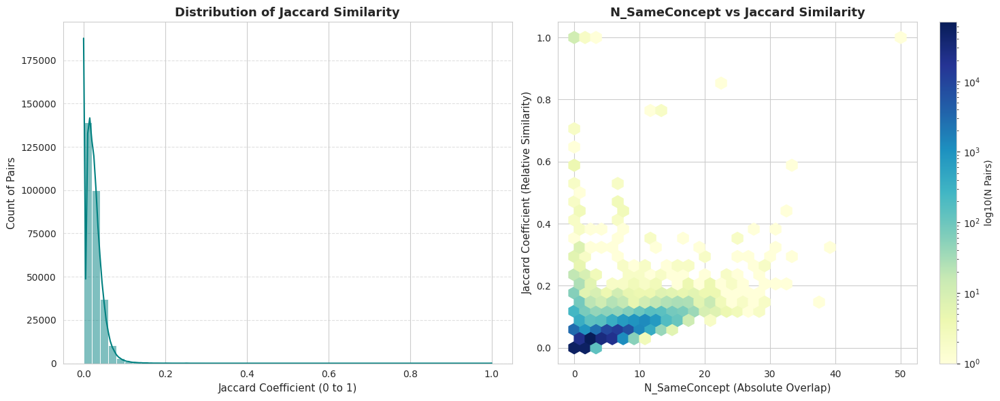

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. 载入带有 Jaccard 的面板数据
file_path = "/Data4/yutao_wen/26.4.21/Final_Panel_with_Jaccard.csv"
print("⏳ 正在载入数据...")
df = pd.read_csv(file_path)

# 2. 提取唯一配对 (Unique Pairs) 的特征
# 我们只关注实验组 (group=1)，因为控制组的 Ja 值统一设为了 0
df_unique = df[df['group'] == 1].drop_duplicates(subset=['focal_id', 'paper_id'])

# ==========================================
# 📊 第一部分：描述性统计
# ==========================================
print("\n" + "="*50)
print("📋 Jaccard 相似系数 (Unique Pairs) 描述性统计")
print("-" * 50)
stats = df_unique['ja_sameconcept'].describe(percentiles=[.1, .25, .5, .75, .9, .95, .99])
print(stats)
print("="*50)

# ==========================================
# 📈 第二部分：分布可视化
# ==========================================
plt.figure(figsize=(15, 6))

# 图 1：Jaccard 系数的频数分布 (Histogram)
plt.subplot(1, 2, 1)
sns.histplot(df_unique['ja_sameconcept'], bins=50, kde=True, color='teal')
plt.title("Distribution of Jaccard Similarity", fontsize=13, fontweight='bold')
plt.xlabel("Jaccard Coefficient (0 to 1)", fontsize=11)
plt.ylabel("Count of Pairs", fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# 图 2：Jaccard 与 N_SameConcept 的关系 (Scatter/Hexbin)
# 看看 N 很大的是不是 J 也很高
plt.subplot(1, 2, 2)
hb = plt.hexbin(df_unique['n_sameconcept'], df_unique['ja_sameconcept'], 
                gridsize=30, cmap='YlGnBu', bins='log')
cb = plt.colorbar(hb, label='log10(N Pairs)')
plt.title("N_SameConcept vs Jaccard Similarity", fontsize=13, fontweight='bold')
plt.xlabel("N_SameConcept (Absolute Overlap)", fontsize=11)
plt.ylabel("Jaccard Coefficient (Relative Similarity)", fontsize=11)

plt.tight_layout()
plt.show()

⏳ 正在读取概念字典...

📋 论文关键词（Concept）数量统计报告
--------------------------------------------------
count    1.468212e+07
mean     4.883064e+01
std      2.830155e+01
min      1.000000e+00
10%      7.000000e+00
25%      3.100000e+01
50%      5.100000e+01
75%      6.700000e+01
90%      8.100000e+01
95%      9.000000e+01
99%      1.160000e+02
max      1.364100e+04
Name: num_concepts, dtype: float64


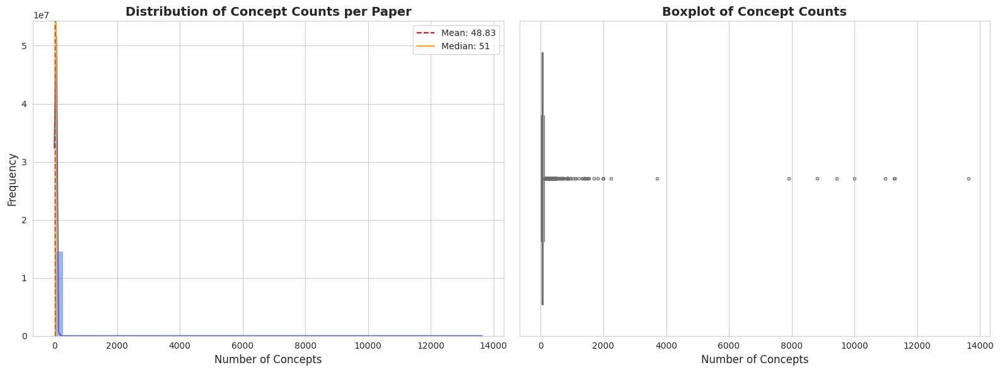

In [4]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 加载概念映射字典
print("⏳ 正在读取概念字典...")
with open("/Data4/yutao_wen/26.4.21/Step3_concept_map.pkl", 'rb') as f:
    concept_map = pickle.load(f)

# 2. 提取统计数据：每篇论文对应的关键词个数
# concept_map 的结构是 {paper_id: {concept_id: relevance, ...}}
concept_counts = [len(concepts) for concepts in concept_map.values()]
df_counts = pd.DataFrame(concept_counts, columns=['num_concepts'])

# ==========================================
# 📊 第一部分：描述性统计
# ==========================================
print("\n" + "="*50)
print("📋 论文关键词（Concept）数量统计报告")
print("-" * 50)
stats = df_counts['num_concepts'].describe(percentiles=[.1, .25, .5, .75, .9, .95, .99])
print(stats)
print("="*50)

# ==========================================
# 📈 第二部分：分布可视化
# ==========================================
plt.figure(figsize=(16, 6))
sns.set_style("whitegrid")

# 图 1：分布直方图与核密度估计
plt.subplot(1, 2, 1)
sns.histplot(df_counts['num_concepts'], bins=50, kde=True, color='royalblue')
plt.axvline(stats['mean'], color='red', linestyle='--', label=f"Mean: {stats['mean']:.2f}")
plt.axvline(stats['50%'], color='orange', linestyle='-', label=f"Median: {stats['50%']:.0f}")
plt.title("Distribution of Concept Counts per Paper", fontsize=14, fontweight='bold')
plt.xlabel("Number of Concepts", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.legend()

# 图 2：箱线图（观察长尾和异常值）
plt.subplot(1, 2, 2)
sns.boxplot(x=df_counts['num_concepts'], color='skyblue', fliersize=3)
plt.title("Boxplot of Concept Counts", fontsize=14, fontweight='bold')
plt.xlabel("Number of Concepts", fontsize=12)

plt.tight_layout()
plt.show()

📊 正在从面板数据中提取配对分布信息...

📝 最终面板数据：Focal 与 Matched Pairs 对应关系
--------------------------------------------------
🔹 撤稿论文总数 (Unique Focals): 20,411
🔹 平均每篇撤稿匹配到的对子数:    14.28
🔹 中位数 (Median):              6
🔹 P95 分位数 (95% 的撤稿匹配数 <=): 52
🔹 最大匹配密度 (Max Pairs):      412


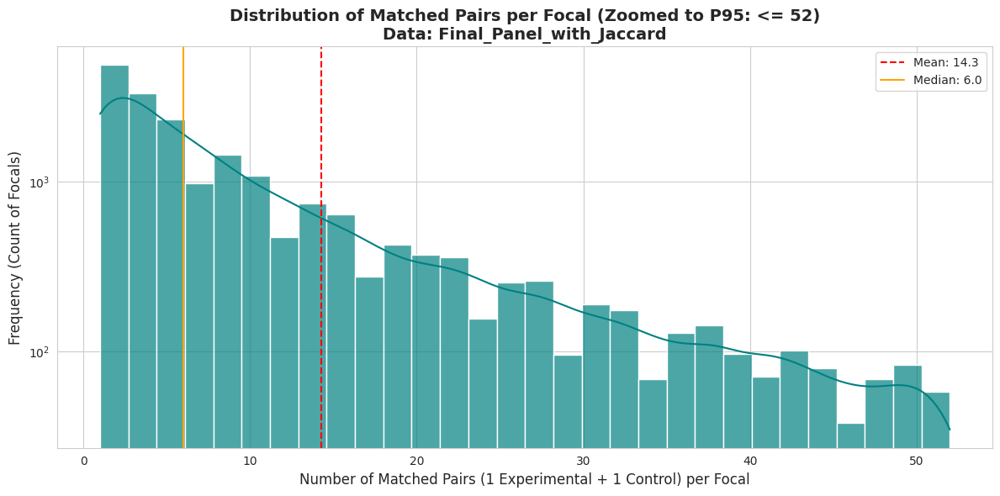

In [26]:
import duckdb
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 路径设置
csv_path = "/Data4/yutao_wen/26.4.21/Final_Panel_with_Jaccard.csv"

con = duckdb.connect()

print("📊 正在从面板数据中提取配对分布信息...")

# 2. 使用 DuckDB 统计每个 focal_id 拥有的唯一 pair 数量
# 注意：在面板数据里，同一个 pair 会重复出现多年，所以必须用 COUNT(DISTINCT pair)
query = f"""
    SELECT focal_id, COUNT(DISTINCT pair) as pair_count
    FROM read_csv_auto('{csv_path}')
    GROUP BY focal_id
"""
dist_df = con.execute(query).df()

# 3. 计算描述性统计
stats = dist_df['pair_count'].describe(percentiles=[.25, .5, .75, .9, .95, .99])

print("\n" + "="*50)
print("📝 最终面板数据：Focal 与 Matched Pairs 对应关系")
print("-" * 50)
print(f"🔹 撤稿论文总数 (Unique Focals): {len(dist_df):,}")
print(f"🔹 平均每篇撤稿匹配到的对子数:    {stats['mean']:.2f}")
print(f"🔹 中位数 (Median):              {stats['50%']:.0f}")
print(f"🔹 P95 分位数 (95% 的撤稿匹配数 <=): {stats['95%']:.0f}")
print(f"🔹 最大匹配密度 (Max Pairs):      {stats['max']:.0f}")
print("="*50)

# 4. 绘图优化
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

# 考虑到你之前的数据有长尾特征，我们依然采用 P95 截断绘图，同时开启对数坐标
cutoff = stats['95%']
plot_data = dist_df[dist_df['pair_count'] <= cutoff]

sns.histplot(plot_data['pair_count'], kde=True, color='teal', bins=30, alpha=0.7)

# 标注统计线
plt.axvline(stats['mean'], color='red', linestyle='--', label=f"Mean: {stats['mean']:.1f}")
plt.axvline(stats['50%'], color='orange', linestyle='-', label=f"Median: {stats['50%']:.1f}")

plt.title(f"Distribution of Matched Pairs per Focal (Zoomed to P95: <= {cutoff:.0f})\nData: Final_Panel_with_Jaccard", 
          fontsize=14, fontweight='bold')
plt.xlabel("Number of Matched Pairs (1 Experimental + 1 Control) per Focal", fontsize=12)
plt.ylabel("Frequency (Count of Focals)", fontsize=12)
plt.yscale('log') # 开启对数坐标，方便观察不同量级的分布
plt.legend()
plt.tight_layout()

plt.show()

### 新阈值尝试

In [2]:
import pandas as pd
import pickle
import numpy as np
from tqdm import tqdm

# ==========================================
# ⚙️ 配置区
# ==========================================
panel_template_path = "/Data4/yutao_wen/26.4.21/Final_Panel_with_Jaccard.csv"
concept_dict_path = "/Data4/yutao_wen/26.4.21/Step3_concept_map.pkl"
THRESHOLDS = [0.0, 0.1, 0.2, 0.3]

# ==========================================
# 1. 载入核心中间件
# ==========================================
print("⏳ 正在载入模版数据与字典...")
df_template = pd.read_csv(panel_template_path)
with open(concept_dict_path, 'rb') as f:
    concept_map = pickle.load(f)

# 提取唯一配对以节省计算量 (只算实验组)
unique_pairs = df_template[df_template['group'] == 1][['focal_id', 'paper_id']].drop_duplicates()

# ==========================================
# 2. 核心循环：针对每个阈值生成独立文件
# ==========================================
for t in THRESHOLDS:
    print(f"\n🚀 正在处理阈值 T={t} ...")
    results = []
    
    for row in tqdm(unique_pairs.itertuples(), total=len(unique_pairs), desc=f"计算 T={t}"):
        f_id, c_id = row.focal_id, row.paper_id
        e_dict = concept_map.get(f_id, {})
        c_dict = concept_map.get(c_id, {})
        
        # 过滤符合当前阈值的概念集
        set_e = {k for k, v in e_dict.items() if v >= t}
        set_c = {k for k, v in c_dict.items() if v >= t}
        
        # 计算交集与并集
        inter = len(set_e & set_c)
        uni = len(set_e | set_c)
        
        results.append({
            'focal_id': f_id,
            'paper_id': c_id,
            'new_n': inter,
            'new_ja': inter / uni if uni > 0 else 0.0
        })
    
    # 合并回模版
    df_new_metrics = pd.DataFrame(results)
    df_current = df_template.copy()
    
    # 覆盖原有变量名 (关键：保证 Stata 代码通用)
    df_current = df_current.merge(df_new_metrics, on=['focal_id', 'paper_id'], how='left')
    df_current['n_sameconcept'] = df_current['new_n'].fillna(0).astype(int)
    df_current['ja_sameconcept'] = df_current['new_ja'].fillna(0.0)
    
    # 重新计算交互项 (防止 Stata 里忘记重新 gen)
    df_current['did_x_n'] = df_current['did'] * df_current['n_sameconcept']
    
    # 删除中间辅助列
    df_current.drop(columns=['new_n', 'new_ja'], inplace=True)
    
    # 保存文件 (满足要求 5)
    output_name = f"/Data4/yutao_wen/26.4.21/Final_Panel_with_{t}_Jaccard.csv"
    df_current.to_csv(output_name, index=False)
    print(f"✅ 已生成：{output_name}")

print("\n✨ 所有阈值面板生成完毕！")

⏳ 正在载入模版数据与字典...

🚀 正在处理阈值 T=0.0 ...


计算 T=0.0: 100%|██████████| 46661/46661 [00:03<00:00, 13161.08it/s]


✅ 已生成：/Data4/yutao_wen/26.4.21/Final_Panel_with_0.0_Jaccard.csv

🚀 正在处理阈值 T=0.1 ...


计算 T=0.1: 100%|██████████| 46661/46661 [00:01<00:00, 33950.43it/s]


✅ 已生成：/Data4/yutao_wen/26.4.21/Final_Panel_with_0.1_Jaccard.csv

🚀 正在处理阈值 T=0.2 ...


计算 T=0.2: 100%|██████████| 46661/46661 [00:01<00:00, 36714.28it/s]


✅ 已生成：/Data4/yutao_wen/26.4.21/Final_Panel_with_0.2_Jaccard.csv

🚀 正在处理阈值 T=0.3 ...


计算 T=0.3: 100%|██████████| 46661/46661 [00:01<00:00, 34405.40it/s]


✅ 已生成：/Data4/yutao_wen/26.4.21/Final_Panel_with_0.3_Jaccard.csv

✨ 所有阈值面板生成完毕！


📊 正在处理各阈值下的 Jaccard 分布...


/tmp/ipykernel_3121159/3222983299.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[i], x='decile', y='ja_sameconcept', data=df_sub, palette="Spectral")


✅ T=0.0: D10 (Top 10%) 范围大约在 [0.0556 - 1.0000]


/tmp/ipykernel_3121159/3222983299.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[i], x='decile', y='ja_sameconcept', data=df_sub, palette="Spectral")


✅ T=0.1: D10 (Top 10%) 范围大约在 [0.0530 - 1.0000]


/tmp/ipykernel_3121159/3222983299.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[i], x='decile', y='ja_sameconcept', data=df_sub, palette="Spectral")


✅ T=0.2: D10 (Top 10%) 范围大约在 [0.0526 - 0.7273]


/tmp/ipykernel_3121159/3222983299.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[i], x='decile', y='ja_sameconcept', data=df_sub, palette="Spectral")


✅ T=0.3: D10 (Top 10%) 范围大约在 [0.0519 - 0.7778]


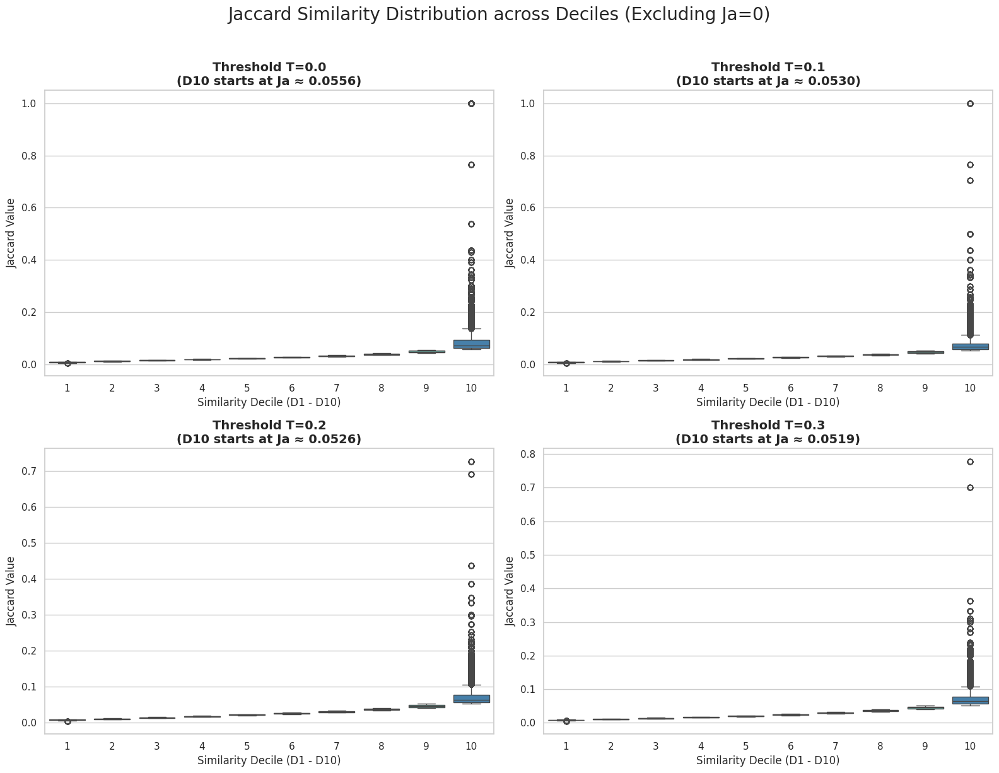

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ==========================================
# ⚙️ 配置区
# ==========================================
thresholds = [0.0, 0.1, 0.2, 0.3]
base_path = "/Data4/yutao_wen/26.4.21/Final_Panel_with_{}_Jaccard.csv"

# 设置绘图风格
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

print("📊 正在处理各阈值下的 Jaccard 分布...")

for i, t in enumerate(thresholds):
    # 1. 读取数据 (只读两列以节省内存)
    file_path = base_path.format(t)
    df = pd.read_csv(file_path, usecols=['group', 'ja_sameconcept'])
    
    # 2. 筛选：只看实验组 (group=1) 且 相似度 > 0 的部分 (即 D1-D10)
    df_sub = df[(df['group'] == 1) & (df['ja_sameconcept'] > 0)].copy()
    
    # 3. 复刻 Stata 的 xtile 10 逻辑：生成 10 个分位数组
    # labels=False 会生成 0-9 的整数，我们加 1 匹配 Stata 的 D1-D10
    df_sub['decile'] = pd.qcut(df_sub['ja_sameconcept'], 10, labels=False, duplicates='drop') + 1
    
    # 4. 绘图：展示每个 Decile 的 Jaccard 取值范围
    sns.boxplot(ax=axes[i], x='decile', y='ja_sameconcept', data=df_sub, palette="Spectral")
    
    # 统计信息用于标题
    p90_val = df_sub['ja_sameconcept'].quantile(0.9)
    max_val = df_sub['ja_sameconcept'].max()
    
    axes[i].set_title(f"Threshold T={t}\n(D10 starts at Ja ≈ {p90_val:.4f})", fontsize=14, fontweight='bold')
    axes[i].set_xlabel("Similarity Decile (D1 - D10)", fontsize=12)
    axes[i].set_ylabel("Jaccard Value", fontsize=12)
    
    # 打印每个阈值下 D10 的具体区间，方便汇报
    print(f"✅ T={t}: D10 (Top 10%) 范围大约在 [{p90_val:.4f} - {max_val:.4f}]")

plt.suptitle("Jaccard Similarity Distribution across Deciles (Excluding Ja=0)", fontsize=20, y=1.02)
plt.tight_layout()
plt.show()

# 模块（十）：待定

## 待补充内容

此处将在协作中补充。
